## Data pre-processing

In [475]:
# Import the packages we'll be using
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import scipy.stats as sts
import mord
import matplotlib

In [476]:
# Set up our Cohen's d function
def cohens_d (x,y):
    n1 = x.shape[0]
    n2 = y.shape[0]
    sd = (((n1 - 1) * x.var() + (n2 - 1) * y.var())/(n1 + n2 - 2))**0.5
    return ((x.mean()-y.mean())/sd)

In [477]:
# Define more concise headers for the data
headers = ["timestamp","level","country","is_online",
           "first_survey","agree","primary_mode","preferred_mode",
           "why_mode","platforms_used","methods_used",
           "techniques_outside","remote_enjoy","remote_motivated",
           "remote_satisfied","remote_engaging","remote_distracted",
           "remote_questions","remote_changes","prior_enjoy",
           "prior_motivated","prior_satisfied","prior_engaging",
           "prior_distracted","prior_questions","prior_changes",
           "preference","why_preference"]

# Read in the raw data
full_data = pd.read_csv("raw_data.csv", skiprows=[0], names=headers, na_values="?")

In [478]:
# Define some other lists that will be useful

# List of just the Likert questions about remote instructions
remote_survey_q = ["remote_enjoy","remote_motivated",
                   "remote_satisfied","remote_engaging",
                   "remote_distracted","remote_questions"]
change_survey_q = ["change_enjoy","change_motivated",
                   "change_satisfied","change_engaging",
                   "change_distracted","change_questions"]
remote_q_long = ["I enjoy having courses online",
                 "I feel motivated to learn",
                 "I am satisfied with the instruction\nof my online courses",
                 "My courses are engaging",
                 "I am often distracted when doing\ncourse work / attending classes",
                 "I often ask questions, comment, join discussions"]
change_q_long = ["I enjoy",
                 "I feel motivated to learn",
                 "I am satisfied with the instruction",
                 "My courses are engaging",
                 "I am often distracted when doing\ncourse work / attending classes",
                 "I often ask questions, comment, join discussions"]

In [479]:
# Drop the rows that we're not going to be using
data = full_data.drop(["timestamp","agree"], axis=1)

In [480]:
duplicate = data[data.duplicated()]
print('# of duplicates: ', len(duplicate))
print('Valid entries: ', duplicate[duplicate['primary_mode'].isna()==False].index)
print('# of duplicates for valid entries: ', len(duplicate[duplicate['primary_mode'].isna()==False].index))
print('NaN entries: ', duplicate[duplicate['primary_mode'].isna()].index)
print('# of duplicates for NaN entries: ', len(duplicate[duplicate['primary_mode'].isna()]))

# of duplicates:  91
Valid entries:  Int64Index([ 1143,  2304,  2966,  2968,  3441,  4090,  4550,  4778,  5406,
             5710,  6885,  7130,  7140,  7191,  7536,  7537,  7767,  8411,
             9016,  9314,  9371, 10154, 10186, 10447, 10472, 10531],
           dtype='int64')
# of duplicates for valid entries:  26
NaN entries:  Int64Index([   20,   124,   208,   416,   431,   587,   773,   995,  1018,
             1027,  1754,  1841,  2083,  2439,  2466,  2754,  2892,  3077,
             3403,  3552,  3728,  3876,  4093,  4232,  4386,  4576,  5014,
             5048,  5196,  5209,  5346,  5583,  5658,  5719,  5908,  5992,
             6067,  6226,  6383,  6416,  6571,  6576,  6672,  7607,  7721,
             7986,  8037,  8080,  8145,  8260,  8344,  8461,  8529,  9037,
             9063,  9099,  9127,  9259,  9291,  9479,  9789,  9800,  9848,
            10064, 10151],
           dtype='int64')
# of duplicates for NaN entries:  65


In [481]:
data = data.drop(duplicate.index, axis=0)
data = data.reset_index()

In [482]:
# Recode Likert responses into numerical code
likert_dict = {"Strongly Disagree": 1, "Disagree": 2, "Neutral": 3, 
               "Agree": 4, "Strongly Agree": 5}
likert_code = {"remote_enjoy":       likert_dict,
               "remote_motivated":   likert_dict,
               "remote_satisfied":   likert_dict,
               "remote_engaging":    likert_dict,
               "remote_distracted":  likert_dict,
               "remote_questions":   likert_dict,
               "prior_enjoy":       likert_dict,
               "prior_motivated":   likert_dict,
               "prior_satisfied":   likert_dict,
               "prior_engaging":    likert_dict,
               "prior_distracted":  likert_dict,
               "prior_questions":   likert_dict}
data.replace(likert_code, inplace=True)


In [483]:
# Recode Primary mode entries into shorter things
modes = {"primary_mode":   {"Live classes (ie: Zoom, Google Meet etc.)": "live",
                            "Uploaded or emailed Materials": "upload",
                            "Recorded Lectures": "recorded",
                            "Discussion forums/chats": "chat"},
         "preferred_mode":   {"Live classes (ie: Zoom, google meet etc.)": "live",
                            "Uploaded or emailed Materials": "upload",
                            "Recorded Lectures/Videos": "recorded",
                            "Discussion forums/chats": "chat"}}
data.replace(modes, inplace=True)

In [484]:
data["change_enjoy"] = data["remote_enjoy"] - data["prior_enjoy"]
data["change_motivated"] = data["remote_motivated"] - data["prior_motivated"]
data["change_satisfied"] = data["remote_satisfied"] - data["prior_satisfied"]
data["change_engaging"] = data["remote_engaging"] - data["prior_engaging"]
data["change_distracted"] = data["remote_distracted"] - data["prior_distracted"]
data["change_questions"] = data["remote_questions"] - data["prior_questions"]

In [485]:
data["active"] = data["methods_used"].str.contains(pat='In-class assessments/quizzes|Small group activities|Whole class discussion/debate|Q&A with students\' questions|Classroom chat')
data["passive"] = data["methods_used"].str.contains(pat='Lecture/presentation|Explanation using Diagrams/White Boards/other media')

data["fully_active"] = data["methods_used"].str.contains(pat='In-class assessments/quizzes|Small group activities|Whole class discussion/debate')
data["partly_active"] = data["methods_used"].str.contains(pat='Q&A with students\' questions|Classroom chat')

data["outside_passive"] = data["techniques_outside"].str.contains(pat='Video lectures|Video content|Posted readings/study material')
data["outside_interactive"] = data["techniques_outside"].str.contains(pat='Discussion/Chat Forums|Live office hours|Email Q&A with instructors')
data["outside_assignments"] = data["techniques_outside"].str.contains(pat='Assignments/un-proctored exams')

In [486]:
data.to_csv('processed_data.csv')

In [564]:
data.shape

(10470, 40)

In [487]:
data.head()

,index,level,country,is_online,first_survey,primary_mode,preferred_mode,why_mode,platforms_used,methods_used,...,change_engaging,change_distracted,change_questions,active,passive,fully_active,partly_active,outside_passive,outside_interactive,outside_assignments
0,0,High school/A-levels/Gymnasium,United Kingdom,Yes,No,live,live,"More interactive, can ask for help easily etc","Microsoft Teams, Emailed/Uploaded readings and...","In-class assessments/quizzes, Explanation usin...",...,-2.0,3.0,-1.0,True,True,True,False,True,False,True
1,1,High school/A-levels/Gymnasium,United Kingdom,Yes,Yes,live,live,More face to face feel,"Microsoft Teams, Emailed/Uploaded readings and...","Lecture/presentation, Small group activities, ...",...,-1.0,0.0,0.0,True,True,True,True,True,True,False
2,2,High school/A-levels/Gymnasium,Ireland,Yes,Yes,live,recorded,"Can pause it, and learn at your own pace","Google Meet, Emailed/Uploaded readings and ass...","Whole class discussion/debate, Q&A with studen...",...,0.0,1.0,0.0,True,False,True,True,False,True,True
3,3,Graduate (studying for Masters/Ph.D./Professio...,Belgium,Yes,Yes,recorded,recorded,Chill,"Blackboard Collaborate, Moodle/Canvas/Blackboa...",My instructors do not use live instruction.,...,0.0,0.0,0.0,False,False,False,False,True,True,False
4,4,Undergraduate (studying for associates or bach...,United Kingdom,Yes,No,recorded,recorded,Easier to follow and look back on,"Google Meet, Emailed/Uploaded readings and ass...",Lecture/presentation,...,-2.0,0.0,-1.0,False,True,False,False,True,True,False


In [488]:
# Create sub-lists for different eductional levels / settings
ug = data[data.level.eq("Undergraduate (studying for associates or bachelors degrees)")]
ug = ug.reset_index()
hs = data[data.level.eq("High school/A-levels/Gymnasium")]
hs = hs.reset_index()

In [489]:
# Create frames for undergraduates learning synchronously and asynchronously
ug_sync = ug[ug.primary_mode.eq("live")]
ug_async = ug[ug["primary_mode"] != "live"]

# Create frames for active / passive / mixed methods
ug_active_only = ug[ug.active & (ug.passive==False)]
ug_passive_only = ug[(ug.active==False) & ug.passive]
ug_act_pass_mix = ug[ug.active & ug.passive]

ug_fully_active = ug[ug.fully_active.eq(True)]
ug_partly_active = ug[ug.partly_active.eq(True)]
ug_passive = ug[ug.passive.eq(True)]

# Create analogous frames for high-school students
hs_sync = hs[hs.primary_mode.eq("live")]
hs_async = hs[hs["primary_mode"] != "live"]

# Create frames for active / passive / mixed methods
hs_active_only = hs[hs.active & (hs.passive==False)]
hs_passive_only = hs[(hs.active==False) & hs.passive]
hs_act_pass_mix = hs[hs.active & hs.passive]

# Create frames for preference undergrad
ug_prefer_inperson = ug[ug['preference']=='In-person Courses']
ug_prefer_remote = ug[ug['preference']=='Online Courses']
ug_prefer_no = ug[ug['preference'].isna()]

# Create frames for preference high school
hs_prefer_inperson = hs[hs['preference']=='In-person Courses']
hs_prefer_remote = hs[hs['preference']=='Online Courses']
hs_prefer_no = hs[hs['preference'].isna()]

### Descriptive stats for undergrad

In [490]:
# Shape of data
print('Undergrad', ug.shape)
print('High school', hs.shape)

Undergrad (4791, 41)
High school (4971, 41)


In [491]:
# Proportion of primary mode of online teaching
print(ug['primary_mode'].value_counts(normalize=True))
# Proportion of preferred mode of online teaching
print(ug['preferred_mode'].value_counts(normalize=True))

live        0.427020
recorded    0.369388
upload      0.172061
chat        0.031531
Name: primary_mode, dtype: float64
live        0.545625
recorded    0.358530
upload      0.062226
chat        0.033619
Name: preferred_mode, dtype: float64


In [492]:
# Proportion of 

### Labels for graphs

In [493]:
subset_ls = [ug_sync, ug_async, ug_active_only, ug_passive_only, ug_act_pass_mix, ug_fully_active, ug_partly_active, ug_passive, \
             hs_sync, hs_async, hs_active_only, hs_passive_only, hs_act_pass_mix, ug_prefer_inperson, ug_prefer_remote, ug_prefer_no,\
            hs_prefer_inperson, hs_prefer_remote, hs_prefer_no]
subset_name = ['Synchronous', 'Asynchronous', 'Active only', 'Passive only', 'Mixed', 'Fully active', 'Partly active', 'Passive', \
               'Synchronous', 'Asynchronous', 'Active only', 'Passive only', 'Mixed', 'Prefer in-person', 'Prefer remote', 'Prefer none',\
              'Prefer in-person', 'Prefer remote', 'Prefer none']

In [494]:
for i in range(len(subset_ls)):
    subset_ls[i].name = subset_name[i]

## Functions

In [495]:
def remote_comparison(a, b):
    acount = np.zeros((6,5))
    bcount = np.zeros((6,5))
    for i in range (6):
        for j in range (5):
            if j+1 in a[remote_survey_q[i]].value_counts(normalize=True).index:
                acount[i,j] = a[remote_survey_q[i]].value_counts(normalize=True)[j+1]
            if j+1 in b[remote_survey_q[i]].value_counts(normalize=True).index:
                bcount[i,j] = b[remote_survey_q[i]].value_counts(normalize=True)[j+1]
    for q in range (6):
        ind = np.arange(5) 
        width = 0.35  
        plt.bar(ind, acount[q], width, label=a.name)
        plt.bar(ind + width, bcount[q], width, label=b.name)
        
        plt.ylabel('Fraction of Responses')
        plt.title(remote_q_long[q])

        plt.xticks(ind + width / 2, ('Strongly\nDisagree', 'Disagree',
                                     'Neutral', 'Agree', 'Strongly\nAgree'))
        plt.legend(loc='best')
        plt.show()
        print (stats.mannwhitneyu(a[remote_survey_q[q]],b[remote_survey_q[q]]))
        print (a.name, "{:.3}".format(a[remote_survey_q[q]].mean()))
        print (b.name, "{:.3}".format(b[remote_survey_q[q]].mean()))
        print ("Cohen's d =","{:.2}".format(cohens_d(a[remote_survey_q[q]],b[remote_survey_q[q]])))

In [496]:
def change_comparison(synch, asynch):
    acount = np.zeros((6,9))
    scount = np.zeros((6,9))
    for i in range (6):
        for j in range (9):
            if j-4 in asynch[change_survey_q[i]].value_counts(normalize=True).index:
                acount[i,j] = asynch[change_survey_q[i]].value_counts(normalize=True)[j-4] 
            if j-4 in synch[change_survey_q[i]].value_counts(normalize=True).index:
                scount[i,j] = synch[change_survey_q[i]].value_counts(normalize=True)[j-4]

    for q in range (6):
        ind = np.arange(9) 
        width = 0.35       
        plt.bar(ind, acount[q], width, label=asynch.name)
        plt.bar(ind + width, scount[q], width, label=synch.name)

        plt.ylabel('Fraction of Responses')
        plt.title(change_q_long[q])

        plt.xticks(ind + width / 2, ( '-4','-3',
                                     '-2', '-1', 'No\nChange','1','2','3','4'))
        plt.legend(loc='best')
        plt.show()
        print (stats.mannwhitneyu(synch[change_survey_q[q]],asynch[change_survey_q[q]]))
        print (synch.name,"{:.3}".format(synch[change_survey_q[q]].mean()))
        print (asynch.name,"{:.3}".format(asynch[change_survey_q[q]].mean()))
        print ("Cohen's d =","{:.2}".format(cohens_d(synch[change_survey_q[q]],asynch[change_survey_q[q]])))

In [497]:
def mean_comparison(a, b, c):
    dim = (6,5)
    aa = np.zeros(dim)
    bb = np.zeros(dim)
    cc = np.zeros(dim)


    for i in range (6):
        for j in range (5):
            cc[i,j] = c[remote_survey_q[i]].value_counts(normalize=True)[j+1]
            aa[i,j] = a[remote_survey_q[i]].value_counts(normalize=True)[j+1] 
            bb[i,j] = b[remote_survey_q[i]].value_counts(normalize=True)[j+1]

    for q in range (6):
        ind = np.arange(5) 
        width = 0.2       
        
        plt.bar(ind + width + width, aa[q], width, label=a.name)
        plt.bar(ind, cc[q], width, label=c.name)
        plt.bar(ind + width, bb[q], width, label=b.name)
        

        plt.ylabel('Fraction of Responses')
        plt.title(remote_q_long[q])

        plt.xticks(ind + width , ('Strongly\nDisagree', 'Disagree',
                                     'Neutral', 'Agree', 'Strongly\nAgree'))
        plt.legend(loc='best')
        plt.show()
        #print (stats.mannwhitneyu(ug_passive_only[remote_survey_q[q]],ug_act_pass_mix[remote_survey_q[q]]))
        print (a.name,"{:.3}".format(a[remote_survey_q[q]].mean()))
        print (c.name,"{:.3}".format(c[remote_survey_q[q]].mean()))
        print (b.name,"{:.3}".format(b[remote_survey_q[q]].mean()))
        #print ("Cohen's d =","{:.2}".format(cohens_d(ug_passive_only[remote_survey_q[q]],ug_act_pass_mix[remote_survey_q[q]])))

## Synchronous vs. Asynchronous

### Remote Undergrad

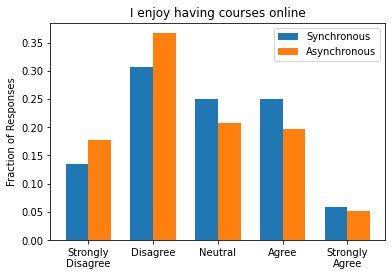

MannwhitneyuResult(statistic=2506597.5, pvalue=2.346057763483205e-11)
Synchronous 2.79
Asynchronous 2.58
Cohen's d = 0.19


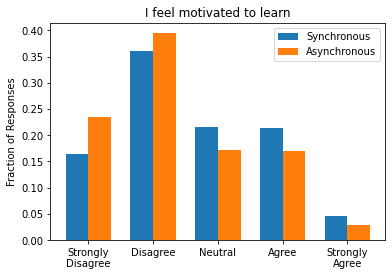

MannwhitneyuResult(statistic=2453125.0, pvalue=3.2046926271728952e-15)
Synchronous 2.62
Asynchronous 2.36
Cohen's d = 0.23


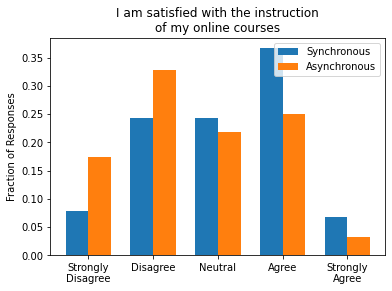

MannwhitneyuResult(statistic=2171599.0, pvalue=3.1442620655386743e-44)
Synchronous 3.1
Asynchronous 2.64
Cohen's d = 0.42


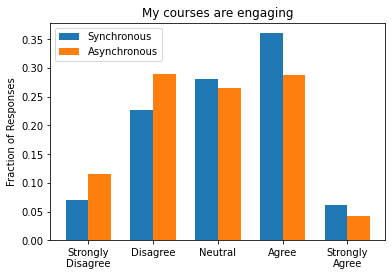

MannwhitneyuResult(statistic=2425058.5, pvalue=2.4657671017327932e-17)
Synchronous 3.12
Asynchronous 2.85
Cohen's d = 0.25


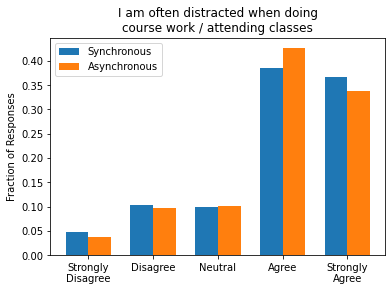

MannwhitneyuResult(statistic=2784066.5, pvalue=0.29743081656648696)
Synchronous 3.92
Asynchronous 3.93
Cohen's d = -0.01


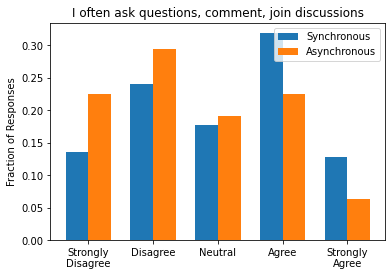

MannwhitneyuResult(statistic=2245534.0, pvalue=1.638315000178527e-34)
Synchronous 3.06
Asynchronous 2.61
Cohen's d = 0.37


In [498]:
remote_comparison(ug_sync, ug_async)

### Remote High school

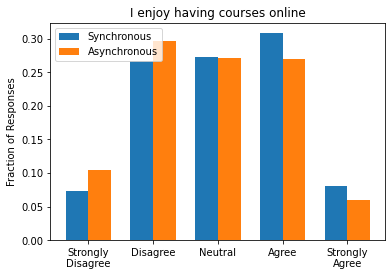

MannwhitneyuResult(statistic=2687574.5, pvalue=1.7606368572423575e-05)
Synchronous 3.06
Asynchronous 2.88
Cohen's d = 0.16


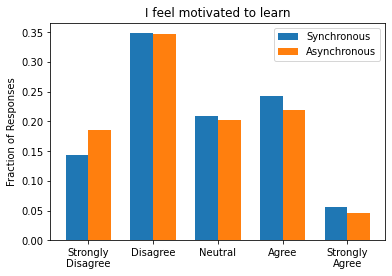

MannwhitneyuResult(statistic=2754087.0, pvalue=0.003163679587461328)
Synchronous 2.72
Asynchronous 2.59
Cohen's d = 0.11


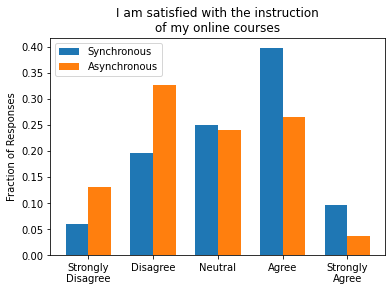

MannwhitneyuResult(statistic=2188571.0, pvalue=2.941016162061551e-49)
Synchronous 3.28
Asynchronous 2.75
Cohen's d = 0.48


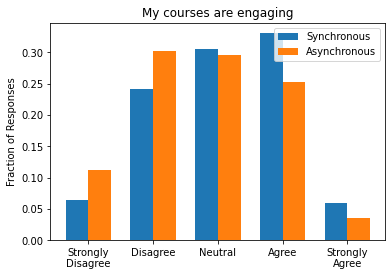

MannwhitneyuResult(statistic=2504791.5, pvalue=5.067731719130614e-16)
Synchronous 3.08
Asynchronous 2.8
Cohen's d = 0.28


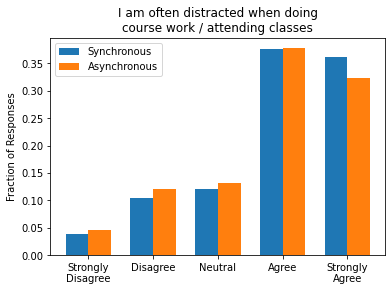

MannwhitneyuResult(statistic=2787883.0, pvalue=0.020428760897658594)
Synchronous 3.92
Asynchronous 3.81
Cohen's d = 0.09


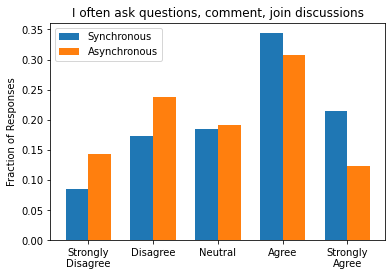

MannwhitneyuResult(statistic=2425355.0, pvalue=3.145877724457294e-22)
Synchronous 3.43
Asynchronous 3.03
Cohen's d = 0.32


In [499]:
remote_comparison(hs_sync, hs_async)

### Change Undergrad

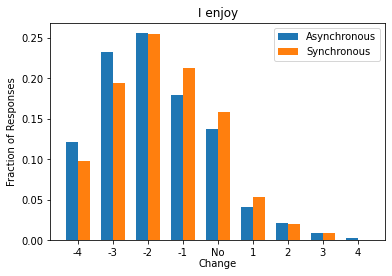

MannwhitneyuResult(statistic=2592263.5, pvalue=1.730309240752944e-06)
Synchronous -1.57
Asynchronous -1.75
Cohen's d = 0.12


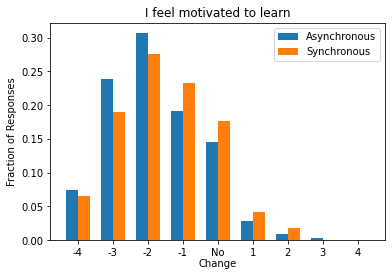

MannwhitneyuResult(statistic=2532024.0, pvalue=1.172241262786114e-09)
Synchronous -1.53
Asynchronous -1.76
Cohen's d = 0.17


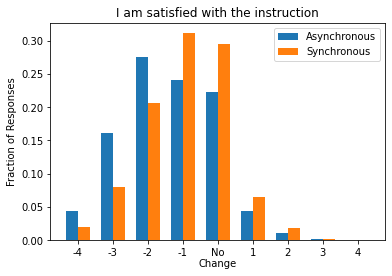

MannwhitneyuResult(statistic=2265154.5, pvalue=2.5413901329266445e-32)
Synchronous -0.942
Asynchronous -1.38
Cohen's d = 0.35


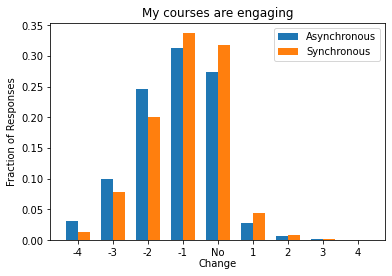

MannwhitneyuResult(statistic=2514076.5, pvalue=6.191980460183451e-11)
Synchronous -0.957
Asynchronous -1.18
Cohen's d = 0.2


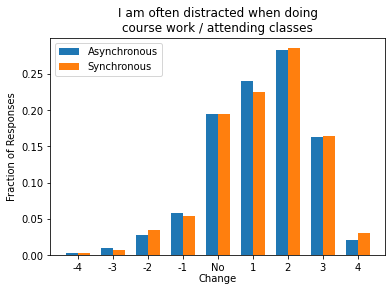

MannwhitneyuResult(statistic=2770336.0, pvalue=0.20887286063945926)
Synchronous 1.25
Asynchronous 1.22
Cohen's d = 0.025


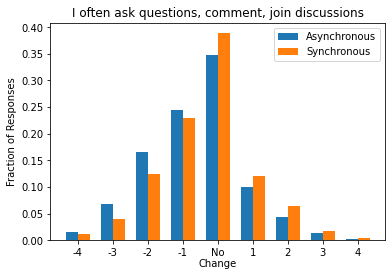

MannwhitneyuResult(statistic=2484264.0, pvalue=7.609588889863326e-13)
Synchronous -0.323
Asynchronous -0.603
Cohen's d = 0.21


In [500]:
change_comparison(ug_sync, ug_async)

### Change High school

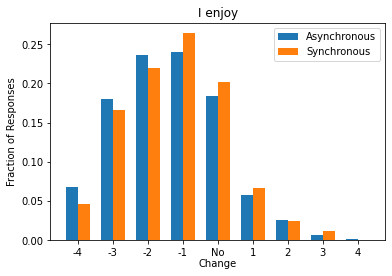

MannwhitneyuResult(statistic=2754680.0, pvalue=0.0036805575370097298)
Synchronous -1.23
Asynchronous -1.39
Cohen's d = 0.11


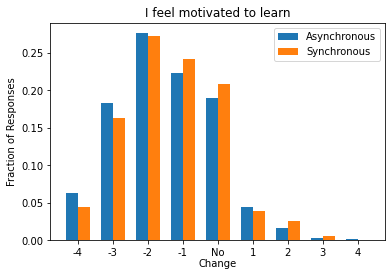

MannwhitneyuResult(statistic=2778986.5, pvalue=0.014654527456756532)
Synchronous -1.35
Asynchronous -1.48
Cohen's d = 0.098


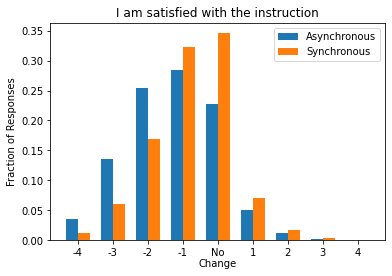

MannwhitneyuResult(statistic=2290975.5, pvalue=5.051281052327607e-36)
Synchronous -0.772
Asynchronous -1.27
Cohen's d = 0.4


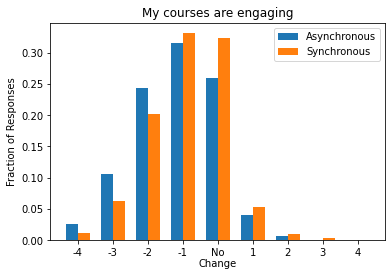

MannwhitneyuResult(statistic=2554126.0, pvalue=1.6233327949722847e-12)
Synchronous -0.884
Asynchronous -1.17
Cohen's d = 0.25


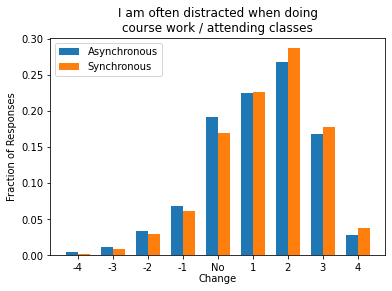

MannwhitneyuResult(statistic=2786349.0, pvalue=0.021554359948529146)
Synchronous 1.33
Asynchronous 1.19
Cohen's d = 0.097


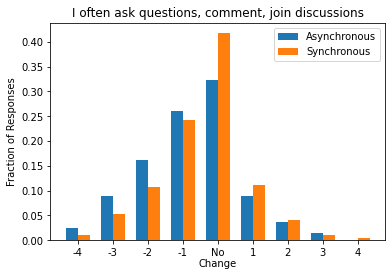

MannwhitneyuResult(statistic=2524431.5, pvalue=1.6247155354334307e-14)
Synchronous -0.406
Asynchronous -0.741
Cohen's d = 0.25


In [501]:
change_comparison(hs_sync, hs_async)

## Active vs. Passive

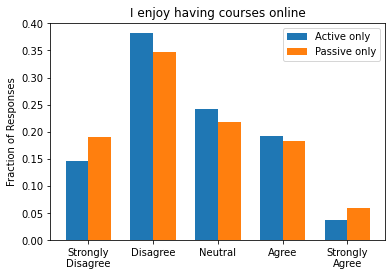

MannwhitneyuResult(statistic=267613.5, pvalue=0.23840989574523774)
Active only 2.59
Passive only 2.57
Cohen's d = 0.02


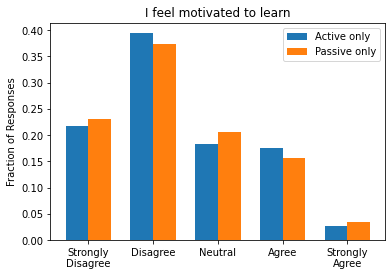

MannwhitneyuResult(statistic=271650.0, pvalue=0.42002924982137757)
Active only 2.4
Passive only 2.39
Cohen's d = 0.0092


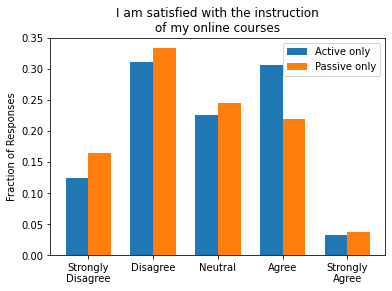

MannwhitneyuResult(statistic=248161.0, pvalue=0.0007788022472075967)
Active only 2.81
Passive only 2.63
Cohen's d = 0.16


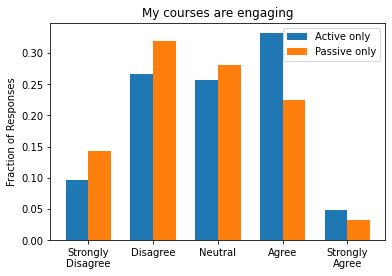

MannwhitneyuResult(statistic=233214.5, pvalue=2.2134970280068287e-07)
Active only 2.97
Passive only 2.69
Cohen's d = 0.26


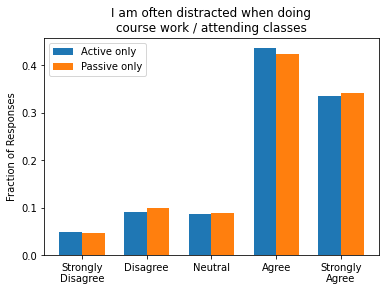

MannwhitneyuResult(statistic=272972.5, pvalue=0.4861741660459426)
Active only 3.92
Passive only 3.91
Cohen's d = 0.0058


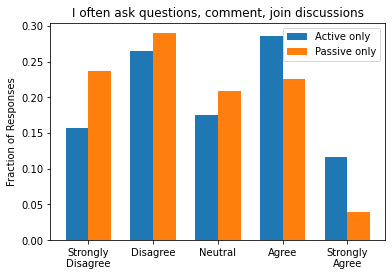

MannwhitneyuResult(statistic=225509.0, pvalue=1.1473048423999355e-09)
Active only 2.94
Passive only 2.54
Cohen's d = 0.32


In [502]:
remote_comparison(ug_active_only, ug_passive_only)

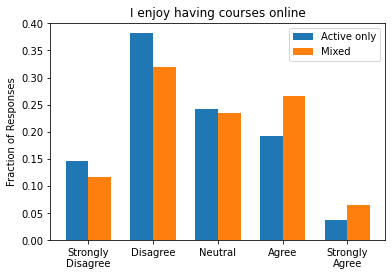

MannwhitneyuResult(statistic=741293.0, pvalue=1.1120172427802959e-07)
Active only 2.59
Mixed 2.84
Cohen's d = -0.22


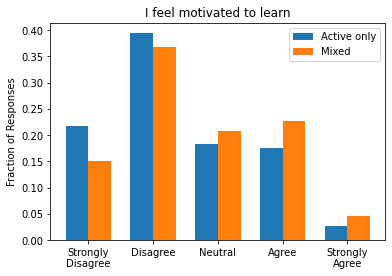

MannwhitneyuResult(statistic=741074.5, pvalue=9.363841231307593e-08)
Active only 2.4
Mixed 2.65
Cohen's d = -0.22


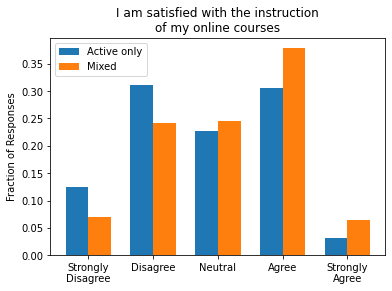

MannwhitneyuResult(statistic=711690.0, pvalue=1.078823971775701e-11)
Active only 2.81
Mixed 3.13
Cohen's d = -0.3


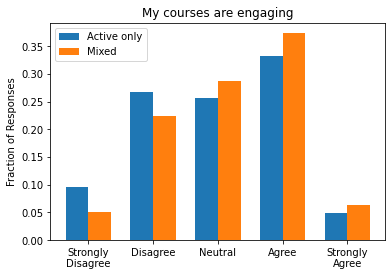

MannwhitneyuResult(statistic=760106.0, pvalue=9.395306623085276e-06)
Active only 2.97
Mixed 3.17
Cohen's d = -0.2


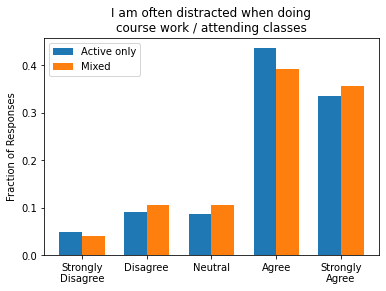

MannwhitneyuResult(statistic=841796.0, pvalue=0.429478545248098)
Active only 3.92
Mixed 3.92
Cohen's d = -0.00082


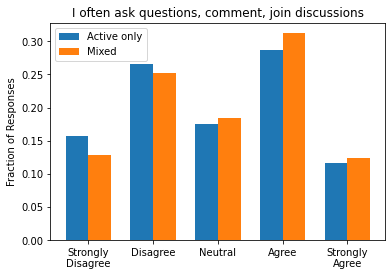

MannwhitneyuResult(statistic=804731.0, pvalue=0.022397579621753684)
Active only 2.94
Mixed 3.05
Cohen's d = -0.087


In [503]:
remote_comparison(ug_active_only, ug_act_pass_mix)

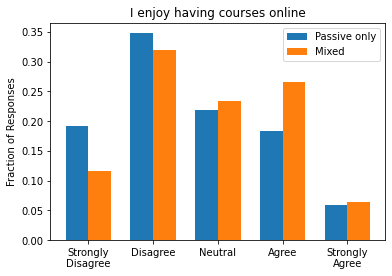

MannwhitneyuResult(statistic=770150.5, pvalue=2.9681265525106486e-09)
Passive only 2.57
Mixed 2.84
Cohen's d = -0.24


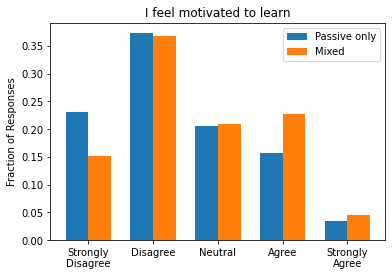

MannwhitneyuResult(statistic=776565.0, pvalue=1.539775254560204e-08)
Passive only 2.39
Mixed 2.65
Cohen's d = -0.23


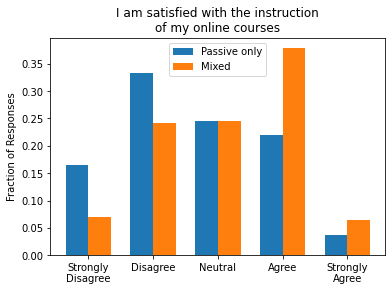

MannwhitneyuResult(statistic=669557.0, pvalue=4.521666504433255e-27)
Passive only 2.63
Mixed 3.13
Cohen's d = -0.46


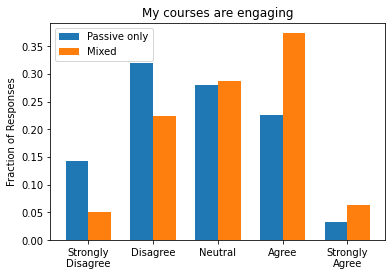

MannwhitneyuResult(statistic=666693.5, pvalue=7.711942215658891e-28)
Passive only 2.69
Mixed 3.17
Cohen's d = -0.47


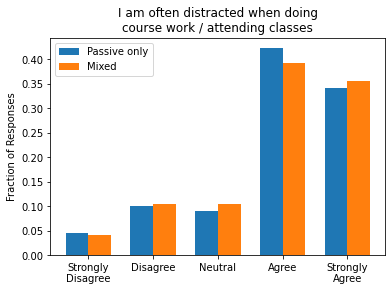

MannwhitneyuResult(statistic=886446.5, pvalue=0.4098489289760001)
Passive only 3.91
Mixed 3.92
Cohen's d = -0.0066


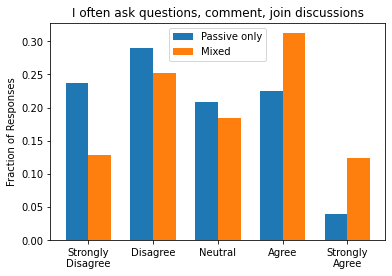

MannwhitneyuResult(statistic=689577.5, pvalue=2.6374036887105083e-22)
Passive only 2.54
Mixed 3.05
Cohen's d = -0.41


In [504]:
remote_comparison(ug_passive_only, ug_act_pass_mix)

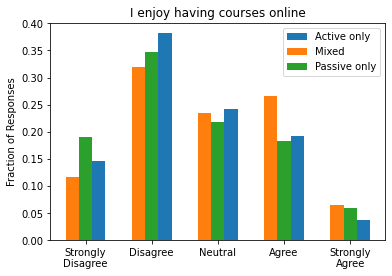

Active only 2.59
Mixed 2.84
Passive only 2.57


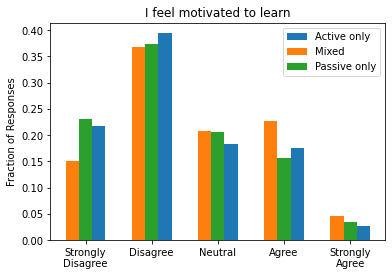

Active only 2.4
Mixed 2.65
Passive only 2.39


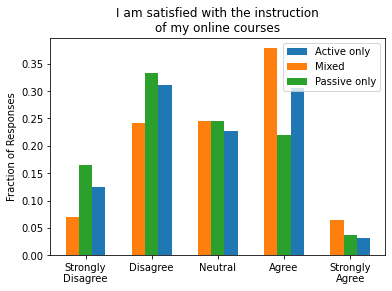

Active only 2.81
Mixed 3.13
Passive only 2.63


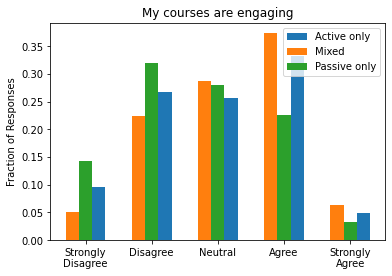

Active only 2.97
Mixed 3.17
Passive only 2.69


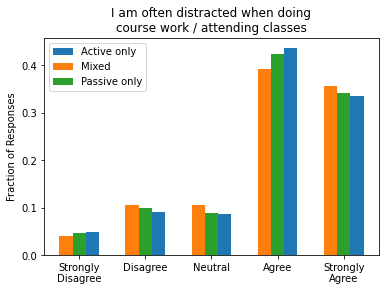

Active only 3.92
Mixed 3.92
Passive only 3.91


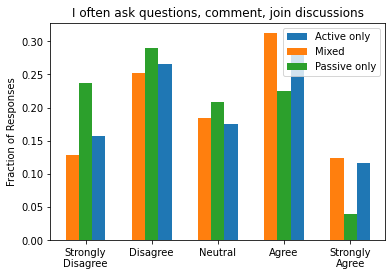

Active only 2.94
Mixed 3.05
Passive only 2.54


In [505]:
mean_comparison(ug_active_only, ug_passive_only, ug_act_pass_mix)

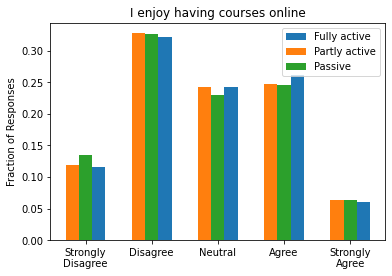

Fully active 2.83
Partly active 2.81
Passive 2.78


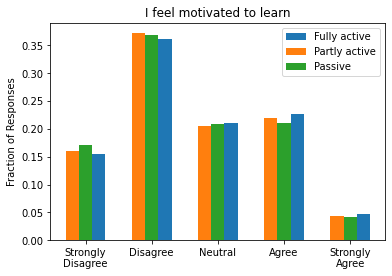

Fully active 2.65
Partly active 2.61
Passive 2.59


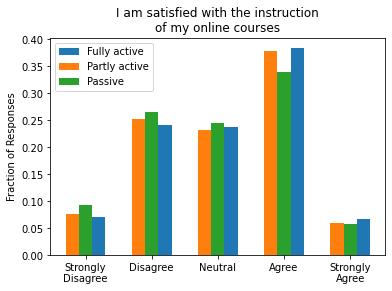

Fully active 3.13
Partly active 3.09
Passive 3.01


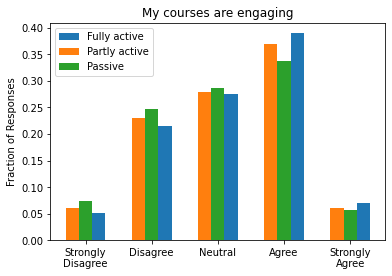

Fully active 3.21
Partly active 3.14
Passive 3.06


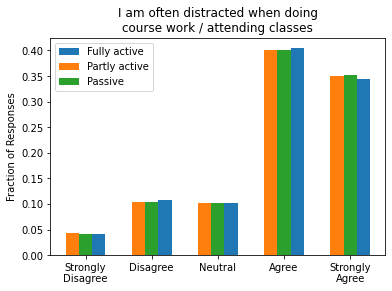

Fully active 3.9
Partly active 3.91
Passive 3.92


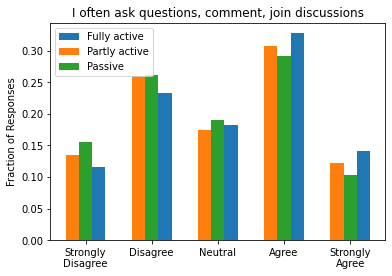

Fully active 3.15
Partly active 3.02
Passive 2.93


In [506]:
mean_comparison(ug_fully_active, ug_passive, ug_partly_active)

## Prefer in-person vs. Prefer remote

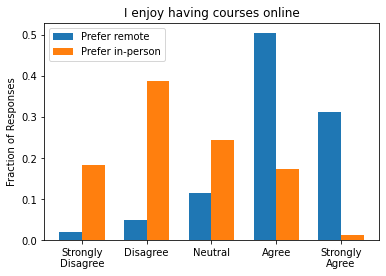

MannwhitneyuResult(statistic=373203.0, pvalue=1.5520944702822136e-215)
Prefer remote 4.04
Prefer in-person 2.45
Cohen's d = 1.6


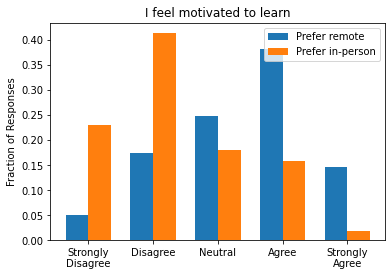

MannwhitneyuResult(statistic=677545.5, pvalue=4.730917301905102e-107)
Prefer remote 3.4
Prefer in-person 2.32
Cohen's d = 1.0


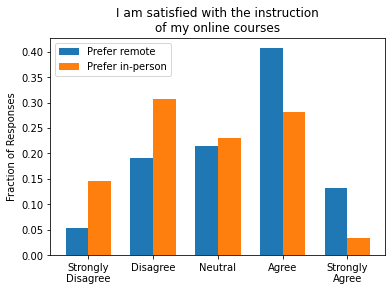

MannwhitneyuResult(statistic=963894.0, pvalue=3.0391020442591457e-38)
Prefer remote 3.37
Prefer in-person 2.75
Cohen's d = 0.56


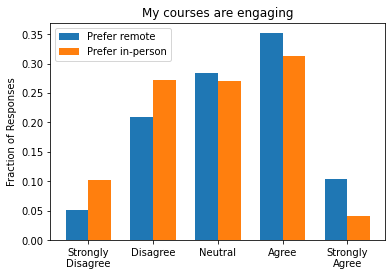

MannwhitneyuResult(statistic=1153980.0, pvalue=1.6448340479163695e-12)
Prefer remote 3.25
Prefer in-person 2.92
Cohen's d = 0.31


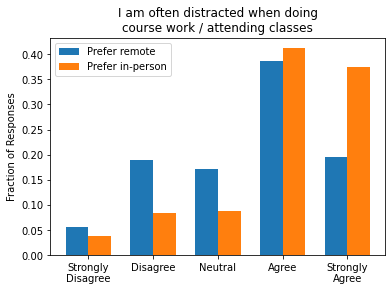

MannwhitneyuResult(statistic=1005587.5, pvalue=7.617121814997917e-33)
Prefer remote 3.47
Prefer in-person 4.0
Cohen's d = -0.49


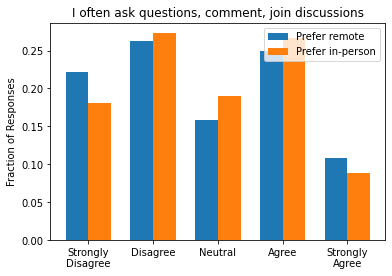

MannwhitneyuResult(statistic=1343820.0, pvalue=0.15624784259847463)
Prefer remote 2.76
Prefer in-person 2.81
Cohen's d = -0.037


In [507]:
remote_comparison(ug_prefer_remote, ug_prefer_inperson)

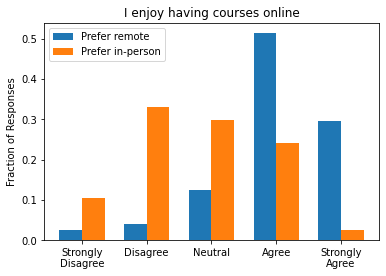

MannwhitneyuResult(statistic=581893.5, pvalue=4.388086892885807e-182)
Prefer remote 4.02
Prefer in-person 2.75
Cohen's d = 1.3


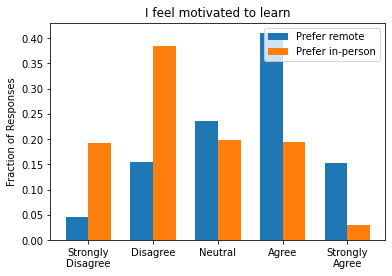

MannwhitneyuResult(statistic=848165.0, pvalue=3.704594049709044e-99)
Prefer remote 3.47
Prefer in-person 2.48
Cohen's d = 0.9


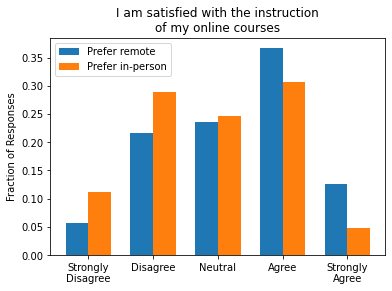

MannwhitneyuResult(statistic=1272064.0, pvalue=2.3417763310422737e-19)
Prefer remote 3.29
Prefer in-person 2.89
Cohen's d = 0.36


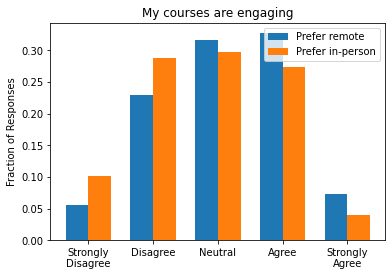

MannwhitneyuResult(statistic=1360792.0, pvalue=8.899587803303656e-11)
Prefer remote 3.13
Prefer in-person 2.86
Cohen's d = 0.26


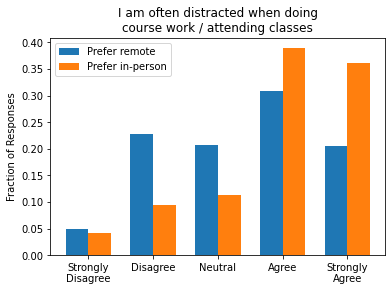

MannwhitneyuResult(statistic=1157781.0, pvalue=1.5079454072339642e-35)
Prefer remote 3.39
Prefer in-person 3.94
Cohen's d = -0.49


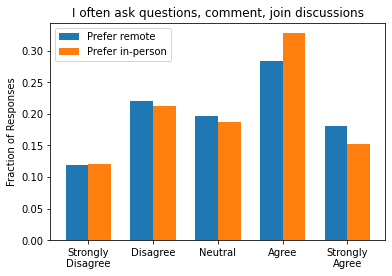

MannwhitneyuResult(statistic=1575694.5, pvalue=0.4272157870517905)
Prefer remote 3.19
Prefer in-person 3.18
Cohen's d = 0.0071


In [508]:
remote_comparison(hs_prefer_remote, hs_prefer_inperson)

## Number of methods/platforms/techniques used

In [509]:
def number_ops(data):
    if pd.isna(data):
        return -1
    elif 'My instructors do not use live instruction.' in data:
        return 0
    else:
        return data.count(',') + 1
ug['num_methods'] = pd.Series(ug['methods_used'].apply(number_ops)).rename('num_methods')
hs['num_methods'] = pd.Series(hs['methods_used'].apply(number_ops)).rename('num_methods')
# ug['num_platforms'] = pd.Series(ug['platforms_used'].apply(number_ops)).rename('num_platforms')

In [510]:
ug['num_techniques'] = pd.Series(ug['techniques_outside'].apply(number_ops)).rename('num_techniques')
hs['num_techniques'] = pd.Series(hs['techniques_outside'].apply(number_ops)).rename('num_techniques')

#### Exceptions

In [511]:
# equals "No live instructions" 
print(ug[ug['methods_used'] == 'My instructors do not use live instruction.'].index)
print(hs[hs['methods_used'] == 'My instructors do not use live instruction.'].index)

Int64Index([   6,    8,   14,   15,   27,   34,   35,   36,   38,   40,
            ...
            4708, 4709, 4711, 4713, 4714, 4715, 4736, 4738, 4762, 4789],
           dtype='int64', length=792)
Int64Index([   5,    6,    8,   21,   22,   25,   30,   36,   37,   42,
            ...
            4924, 4926, 4928, 4933, 4938, 4947, 4956, 4960, 4961, 4962],
           dtype='int64', length=1160)


In [512]:
# "No live instructions" but still choose other boxes
print(ug['methods_used'][(ug['methods_used'].isna() == False) & (ug['methods_used'] != 'My instructors do not use live instruction.')\
   & (ug['methods_used'].str.contains('My instructors do not use live instruction.'))].index)
print(hs['methods_used'][(hs['methods_used'].isna() == False) & (hs['methods_used'] != 'My instructors do not use live instruction.')\
   & (hs['methods_used'].str.contains('My instructors do not use live instruction.'))].index)

Int64Index([   2,   26,   37,   64,  103,  146,  250,  308,  396,  440,
            ...
            4427, 4460, 4468, 4488, 4581, 4628, 4665, 4735, 4760, 4779],
           dtype='int64', length=135)
Int64Index([  17,   27,   50,   55,   70,   86,  104,  128,  203,  219,
            ...
            4784, 4811, 4822, 4862, 4883, 4930, 4940, 4959, 4964, 4969],
           dtype='int64', length=191)


In [513]:
# contains "No live instructions"
print(ug['methods_used'][(ug['methods_used'].isna() == False) \
   & (ug['methods_used'].str.contains('My instructors do not use live instruction.'))].index)
print(hs['methods_used'][(hs['methods_used'].isna() == False) \
   & (hs['methods_used'].str.contains('My instructors do not use live instruction.'))].index)

Int64Index([   2,    6,    8,   14,   15,   26,   27,   34,   35,   36,
            ...
            4713, 4714, 4715, 4735, 4736, 4738, 4760, 4762, 4779, 4789],
           dtype='int64', length=927)
Int64Index([   5,    6,    8,   17,   21,   22,   25,   27,   30,   36,
            ...
            4938, 4940, 4947, 4956, 4959, 4960, 4961, 4962, 4964, 4969],
           dtype='int64', length=1351)


In [514]:
# Unique number of methods
print(ug['num_methods'].value_counts(normalize=True))
ug_by_methods = ug.groupby('num_methods')
print(hs['num_methods'].value_counts(normalize=True))
hs_by_methods = hs.groupby('num_methods')

 1    0.228136
 2    0.213943
 0    0.193488
 3    0.169067
 4    0.107911
 5    0.051972
 6    0.022542
 7    0.012106
-1    0.000417
 9    0.000209
 8    0.000209
Name: num_methods, dtype: float64
 0    0.271776
 1    0.193925
 2    0.151076
 3    0.147455
 4    0.110038
 5    0.064373
 6    0.033997
 7    0.015691
-1    0.010863
 8    0.000604
 9    0.000201
Name: num_methods, dtype: float64


### Regression

In [515]:
ordinal_reg = mord.OrdinalRidge()

#### Undergrad

In [516]:
for i in range(6):
    avg = remote_survey_q[i], ug_by_methods[remote_survey_q[i]].mean()[1:].tolist()
#     plt.figure()
#     plt.title(remote_q_long[i])
#     plt.xlabel('Number of methods')
#     plt.ylabel('Average of students ratings')
#     plt.bar(x=np.arange(0, 10), height=avg[1])
    print(remote_q_long[i])
    print('Regression: ', ordinal_reg.fit(np.arange(10).reshape(-1, 1), avg[1]))
    print('___________________')

I enjoy having courses online
Regression:  OrdinalRidge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
       normalize=False, random_state=None, solver='auto', tol=0.001)
___________________
I feel motivated to learn
Regression:  OrdinalRidge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
       normalize=False, random_state=None, solver='auto', tol=0.001)
___________________
I am satisfied with the instruction
of my online courses
Regression:  OrdinalRidge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
       normalize=False, random_state=None, solver='auto', tol=0.001)
___________________
My courses are engaging
Regression:  OrdinalRidge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
       normalize=False, random_state=None, solver='auto', tol=0.001)
___________________
I am often distracted when doing
course work / attending classes
Regression:  OrdinalRidge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
       normalize=

In [517]:
for i in range(6):
    avg = remote_survey_q[i], ug_by_methods[remote_survey_q[i]].mean()[1:].tolist()
#     plt.figure()
#     plt.title(remote_q_long[i])
#     plt.xlabel('Number of methods')
#     plt.ylabel('Average of students ratings')
#     plt.bar(x=np.arange(0, 10), height=avg[1])
    print(remote_q_long[i])
    print('Regression: ', sts.linregress(np.arange(10), avg[1]))
    print('___________________')

I enjoy having courses online
Regression:  LinregressResult(slope=-0.01845822017151357, intercept=2.756890948302219, rvalue=-0.12494039885873123, pvalue=0.7309194194964002, stderr=0.05182335367165594)
___________________
I feel motivated to learn
Regression:  LinregressResult(slope=0.14301595487702742, intercept=2.183458267165892, rvalue=0.8424500262619321, pvalue=0.002218651365139614, stderr=0.03233719716084135)
___________________
I am satisfied with the instruction
of my online courses
Regression:  LinregressResult(slope=0.23881469355289223, intercept=2.2979392492214297, rvalue=0.9468895008860445, pvalue=3.263985715724525e-05, stderr=0.028673294309658228)
___________________
My courses are engaging
Regression:  LinregressResult(slope=0.1006918379435721, intercept=2.78440952243696, rvalue=0.7204446797618804, pvalue=0.01875928670902609, stderr=0.034269113765511665)
___________________
I am often distracted when doing
course work / attending classes
Regression:  LinregressResult(slope=

#### High school

In [518]:
for i in range(6):
    avg = remote_survey_q[i], hs_by_methods[remote_survey_q[i]].mean()[1:].tolist()
#     plt.figure()
#     plt.title(remote_q_long[i])
#     plt.xlabel('Number of methods')
#     plt.ylabel('Average of students ratings')
#     plt.bar(x=np.arange(0, 10), height=avg[1])
    print(remote_q_long[i])
    print('Regression: ', sts.linregress(np.arange(10), avg[1]))
    print('___________________')

I enjoy having courses online
Regression:  LinregressResult(slope=0.017723918673931166, intercept=2.961943390162809, rvalue=0.10780541199954774, pvalue=0.7668973543943199, stderr=0.057787741972210115)
___________________
I feel motivated to learn
Regression:  LinregressResult(slope=0.003279799184102268, intercept=2.6667520546595824, rvalue=0.03359714387657881, pvalue=0.9265891490026351, stderr=0.034494881193090646)
___________________
I am satisfied with the instruction
of my online courses
Regression:  LinregressResult(slope=0.11862960433398503, intercept=2.719704300271993, rvalue=0.7966236809940687, pvalue=0.005808410083435027, stderr=0.03182538214439833)
___________________
My courses are engaging
Regression:  LinregressResult(slope=0.07911171171909272, intercept=2.765228607659472, rvalue=0.7673261264456296, pvalue=0.009577804964418839, stderr=0.02337480309210845)
___________________
I am often distracted when doing
course work / attending classes
Regression:  LinregressResult(slope

### Pairwise comparison

In [519]:
def num_comp(data, num, q, k):
    methods_less = data[(data[num] >= q) & (data[num] < k)]
    methods_more = data[data[num] >= k]
    subset_ls.extend([methods_less, methods_more])
    subset_name.extend([f'{num}: >={str(q)}, <{str(k)}', f'{num}: >={str(k)}'])
    methods_less.name = f'>={str(q)}, <{str(k)}'
    methods_more.name = f'>={str(k)}'
    print(f'>={str(q)}, <{str(k)}', methods_less.shape)
    print(f'>={str(k)}', methods_more.shape)
    return remote_comparison(methods_less, methods_more)

#### Undergrad

>=0, <1 (927, 43)
>=1 (3862, 43)


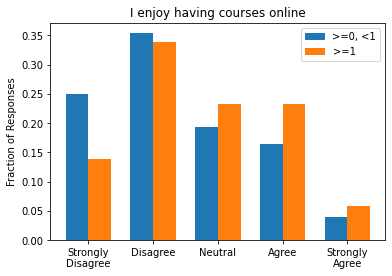

MannwhitneyuResult(statistic=1481799.5, pvalue=1.6352616282115206e-17)
>=0, <1 2.39
>=1 2.74
Cohen's d = -0.3


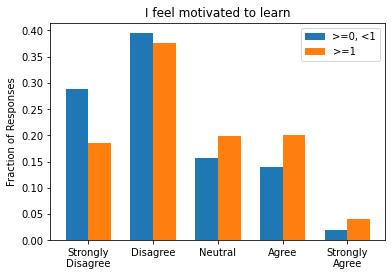

MannwhitneyuResult(statistic=1494172.5, pvalue=1.8659955450490594e-16)
>=0, <1 2.21
>=1 2.54
Cohen's d = -0.29


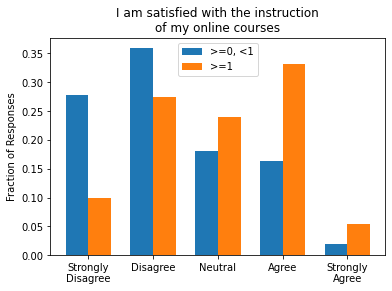

MannwhitneyuResult(statistic=1196358.0, pvalue=1.1127847025840625e-59)
>=0, <1 2.29
>=1 2.97
Cohen's d = -0.62


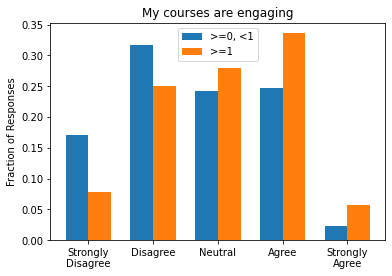

MannwhitneyuResult(statistic=1426774.0, pvalue=9.902899694006387e-24)
>=0, <1 2.64
>=1 3.04
Cohen's d = -0.38


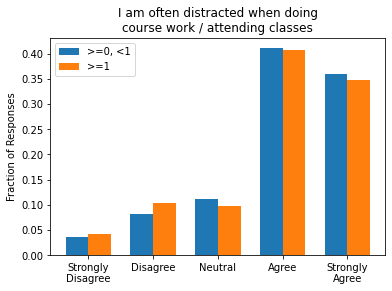

MannwhitneyuResult(statistic=1746763.0, pvalue=0.11207866724863125)
>=0, <1 3.98
>=1 3.91
Cohen's d = 0.057


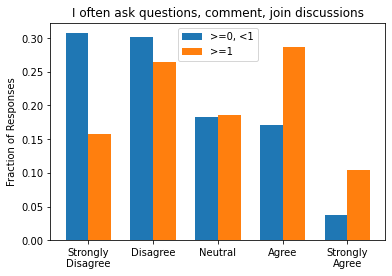

MannwhitneyuResult(statistic=1324969.5, pvalue=6.587304641449791e-37)
>=0, <1 2.33
>=1 2.91
Cohen's d = -0.47


In [520]:
num_comp(ug, 'num_methods', 0, 1)

>=1, <2 (1093, 43)
>=2 (2769, 43)


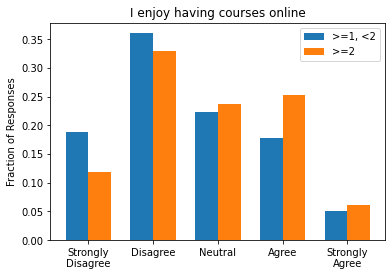

MannwhitneyuResult(statistic=1308524.5, pvalue=5.636412123195986e-12)
>=1, <2 2.54
>=2 2.81
Cohen's d = -0.24


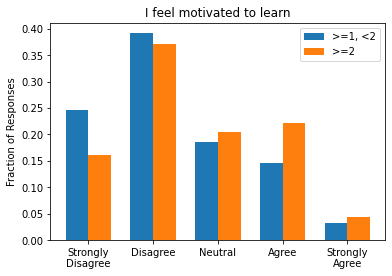

MannwhitneyuResult(statistic=1290234.5, pvalue=5.377031811169832e-14)
>=1, <2 2.33
>=2 2.62
Cohen's d = -0.26


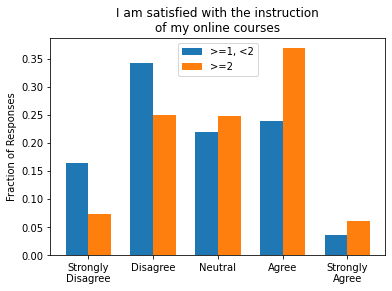

MannwhitneyuResult(statistic=1170362.5, pvalue=1.945014907103048e-30)
>=1, <2 2.64
>=2 3.1
Cohen's d = -0.42


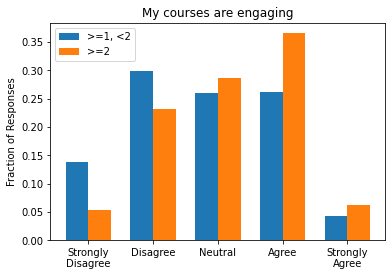

MannwhitneyuResult(statistic=1225129.5, pvalue=3.870345375644842e-22)
>=1, <2 2.77
>=2 3.15
Cohen's d = -0.36


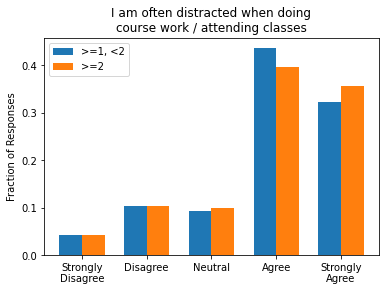

MannwhitneyuResult(statistic=1480227.0, pvalue=0.13072104746035207)
>=1, <2 3.89
>=2 3.92
Cohen's d = -0.024


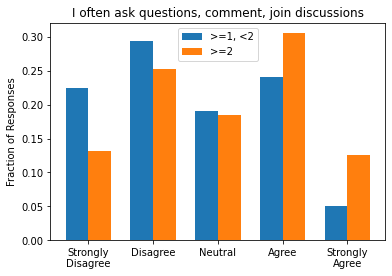

MannwhitneyuResult(statistic=1218379.5, pvalue=1.3472207048558904e-22)
>=1, <2 2.6
>=2 3.04
Cohen's d = -0.35


In [521]:
num_comp(ug, 'num_methods', 1, 2)

>=1, <3 (2118, 43)
>=3 (1744, 43)


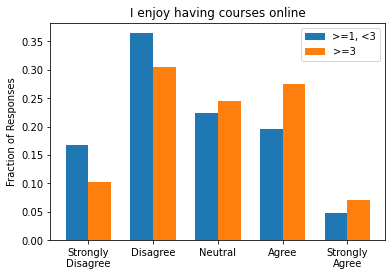

MannwhitneyuResult(statistic=1559732.0, pvalue=3.3538843197444255e-18)
>=1, <3 2.59
>=3 2.91
Cohen's d = -0.28


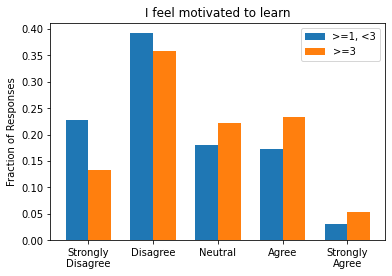

MannwhitneyuResult(statistic=1542367.5, pvalue=2.058765623172438e-20)
>=1, <3 2.39
>=3 2.72
Cohen's d = -0.3


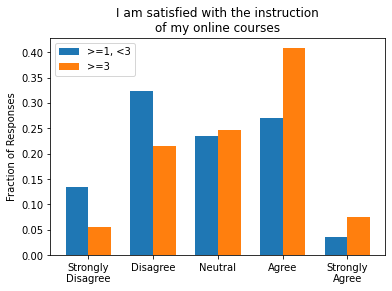

MannwhitneyuResult(statistic=1398868.0, pvalue=8.915919244020157e-42)
>=1, <3 2.75
>=3 3.23
Cohen's d = -0.45


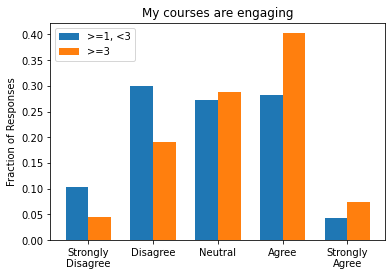

MannwhitneyuResult(statistic=1450115.5, pvalue=2.5292113800601163e-33)
>=1, <3 2.86
>=3 3.27
Cohen's d = -0.4


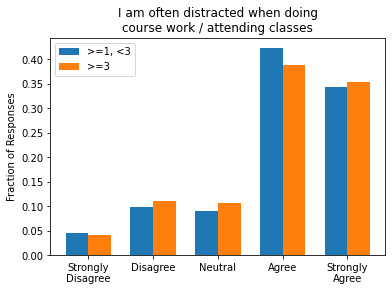

MannwhitneyuResult(statistic=1839167.5, pvalue=0.4060086700031741)
>=1, <3 3.92
>=3 3.91
Cohen's d = 0.014


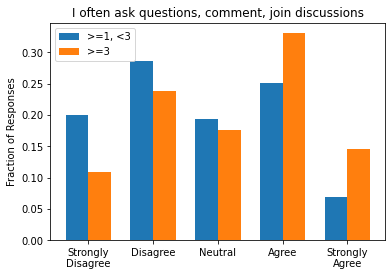

MannwhitneyuResult(statistic=1467987.5, pvalue=6.895241134075695e-30)
>=1, <3 2.71
>=3 3.17
Cohen's d = -0.37


In [522]:
num_comp(ug, 'num_methods', 1, 3)

>=1, <4 (2928, 43)
>=4 (934, 43)


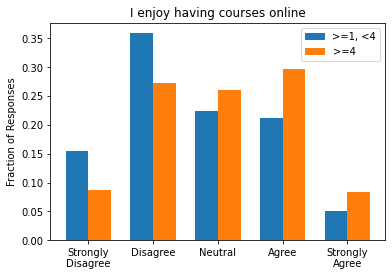

MannwhitneyuResult(statistic=1116495.0, pvalue=1.04723025906143e-18)
>=1, <4 2.65
>=4 3.02
Cohen's d = -0.33


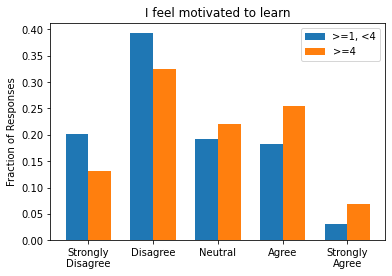

MannwhitneyuResult(statistic=1133243.5, pvalue=1.1334319408308081e-16)
>=1, <4 2.45
>=4 2.8
Cohen's d = -0.32


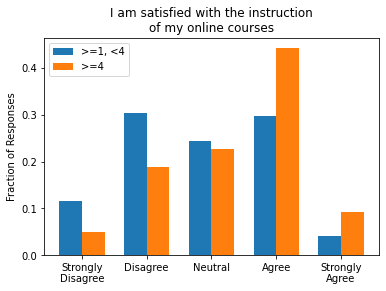

MannwhitneyuResult(statistic=1025763.5, pvalue=3.078585571742454e-33)
>=1, <4 2.85
>=4 3.34
Cohen's d = -0.46


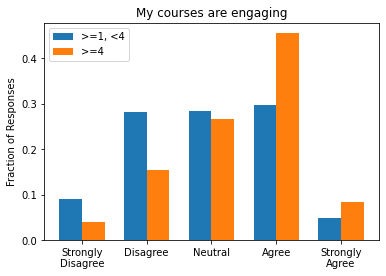

MannwhitneyuResult(statistic=1035620.5, pvalue=1.4119977968620893e-31)
>=1, <4 2.93
>=4 3.39
Cohen's d = -0.44


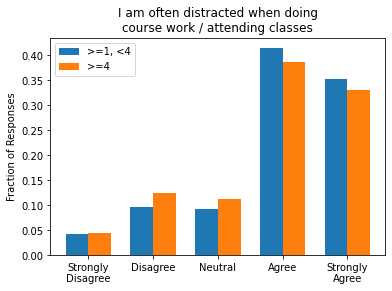

MannwhitneyuResult(statistic=1300651.0, pvalue=0.008506034200145705)
>=1, <4 3.94
>=4 3.83
Cohen's d = 0.095


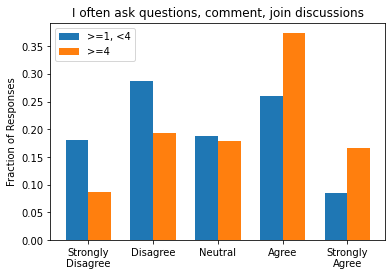

MannwhitneyuResult(statistic=1028832.5, pvalue=4.51607238391943e-32)
>=1, <4 2.78
>=4 3.34
Cohen's d = -0.45


In [523]:
num_comp(ug, 'num_methods', 1, 4)

>=1, <5 (3445, 43)
>=5 (417, 43)


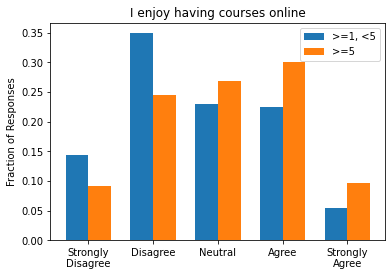

MannwhitneyuResult(statistic=587752.0, pvalue=1.6629424258811325e-10)
>=1, <5 2.7
>=5 3.06
Cohen's d = -0.33


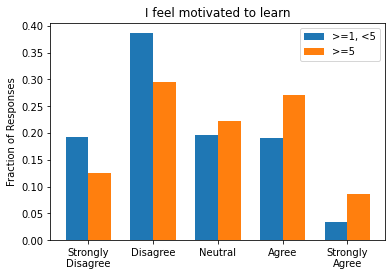

MannwhitneyuResult(statistic=579374.0, pvalue=9.202037387822087e-12)
>=1, <5 2.49
>=5 2.9
Cohen's d = -0.37


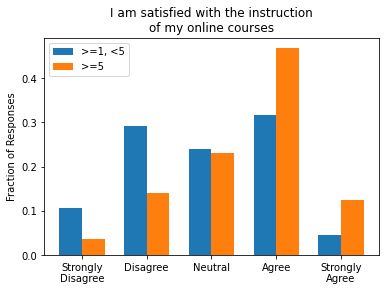

MannwhitneyuResult(statistic=500726.5, pvalue=4.132786774451233e-26)
>=1, <5 2.9
>=5 3.5
Cohen's d = -0.55


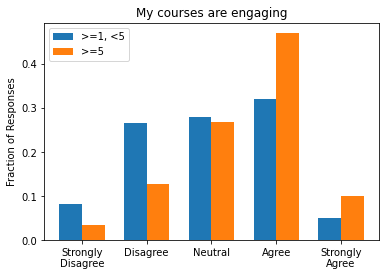

MannwhitneyuResult(statistic=533183.0, pvalue=1.7041578811675995e-19)
>=1, <5 2.99
>=5 3.48
Cohen's d = -0.46


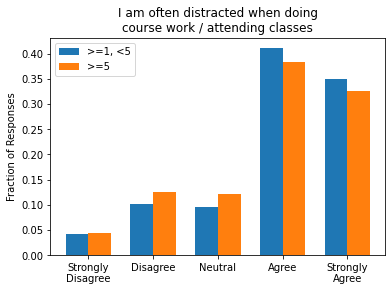

MannwhitneyuResult(statistic=682999.5, pvalue=0.04083358842359883)
>=1, <5 3.92
>=5 3.82
Cohen's d = 0.09


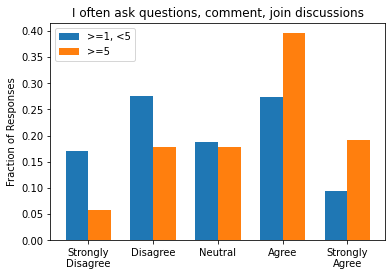

MannwhitneyuResult(statistic=513528.0, pvalue=6.35469261548414e-23)
>=1, <5 2.85
>=5 3.49
Cohen's d = -0.51


In [524]:
num_comp(ug, 'num_methods', 1, 5)

#### High school

>=0, <1 (1351, 43)
>=1 (3566, 43)


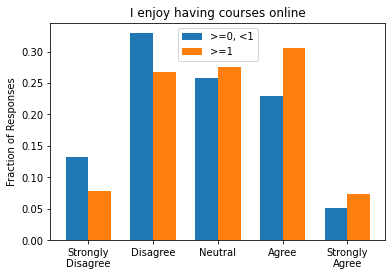

MannwhitneyuResult(statistic=2055924.0, pvalue=9.939189518676154e-17)
>=0, <1 2.74
>=1 3.03
Cohen's d = -0.27


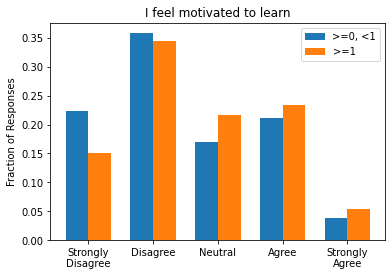

MannwhitneyuResult(statistic=2155353.0, pvalue=1.733454163137981e-09)
>=0, <1 2.48
>=1 2.69
Cohen's d = -0.18


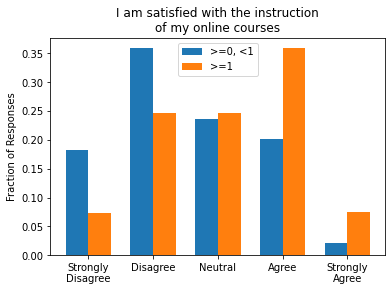

MannwhitneyuResult(statistic=1698071.0, pvalue=5.357704789798459e-62)
>=0, <1 2.52
>=1 3.11
Cohen's d = -0.55


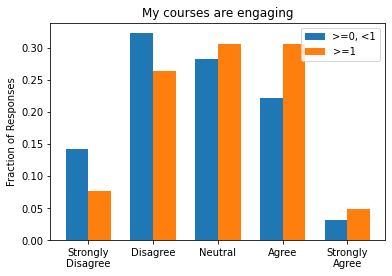

MannwhitneyuResult(statistic=2021245.5, pvalue=6.809627677477649e-20)
>=0, <1 2.68
>=1 2.99
Cohen's d = -0.3


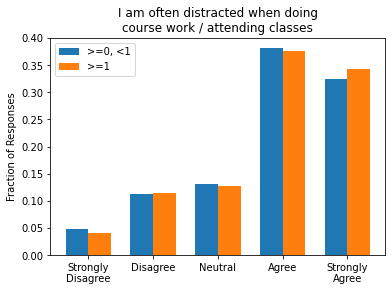

MannwhitneyuResult(statistic=2357573.0, pvalue=0.11254611666667952)
>=0, <1 3.82
>=1 3.86
Cohen's d = -0.039


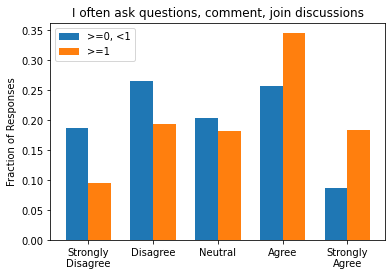

MannwhitneyuResult(statistic=1839799.0, pvalue=6.259816560708787e-40)
>=0, <1 2.79
>=1 3.33
Cohen's d = -0.43


In [525]:
num_comp(hs, 'num_methods',0, 1)

>=1, <2 (964, 43)
>=2 (2602, 43)


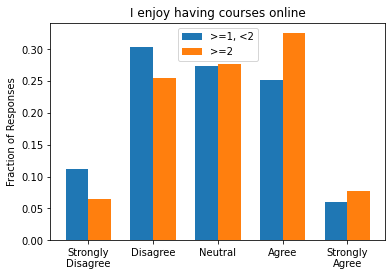

MannwhitneyuResult(statistic=1093791.0, pvalue=5.696226739411764e-10)
>=1, <2 2.84
>=2 3.1
Cohen's d = -0.23


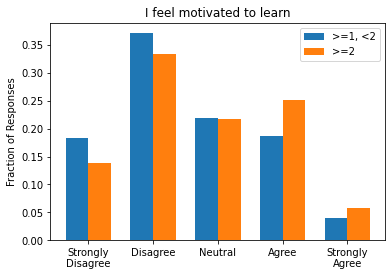

MannwhitneyuResult(statistic=1117399.5, pvalue=1.0696418237372619e-07)
>=1, <2 2.53
>=2 2.76
Cohen's d = -0.2


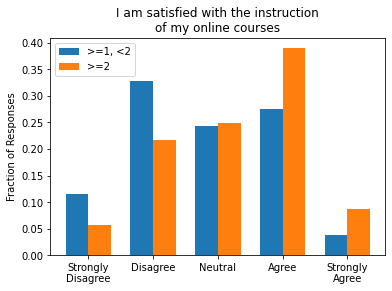

MannwhitneyuResult(statistic=974257.0, pvalue=6.995114028760627e-27)
>=1, <2 2.79
>=2 3.23
Cohen's d = -0.41


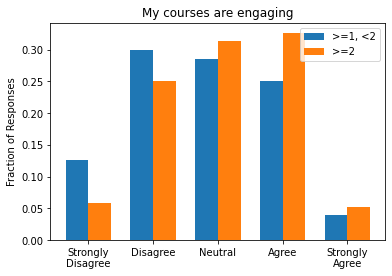

MannwhitneyuResult(statistic=1066928.0, pvalue=4.910489655351157e-13)
>=1, <2 2.78
>=2 3.07
Cohen's d = -0.28


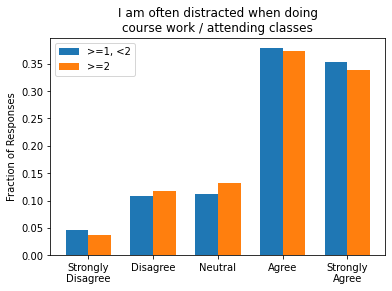

MannwhitneyuResult(statistic=1229306.5, pvalue=0.1690910574022163)
>=1, <2 3.88
>=2 3.86
Cohen's d = 0.023


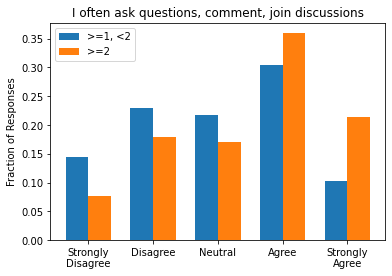

MannwhitneyuResult(statistic=990519.0, pvalue=1.0734730846787444e-23)
>=1, <2 2.99
>=2 3.45
Cohen's d = -0.38


In [526]:
num_comp(hs, 'num_methods',1, 2)

>=1, <3 (1715, 43)
>=3 (1851, 43)


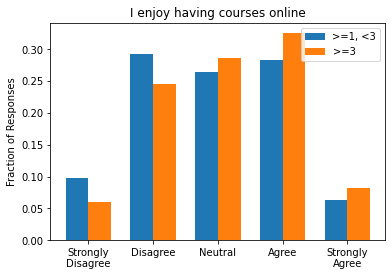

MannwhitneyuResult(statistic=1425411.0, pvalue=2.366476961754405e-08)
>=1, <3 2.92
>=3 3.13
Cohen's d = -0.19


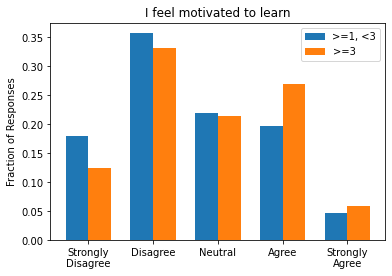

MannwhitneyuResult(statistic=1404979.5, pvalue=4.020714839106798e-10)
>=1, <3 2.57
>=3 2.81
Cohen's d = -0.21


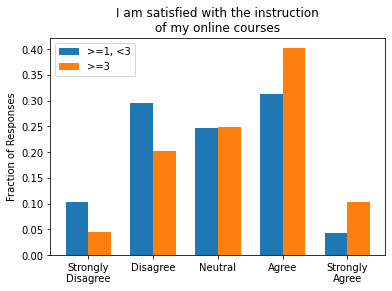

MannwhitneyuResult(statistic=1255874.5, pvalue=1.476000007593484e-29)
>=1, <3 2.9
>=3 3.31
Cohen's d = -0.39


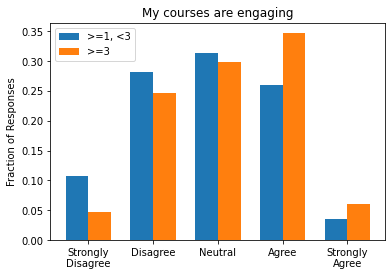

MannwhitneyuResult(statistic=1346075.5, pvalue=1.5864666419111902e-16)
>=1, <3 2.84
>=3 3.13
Cohen's d = -0.29


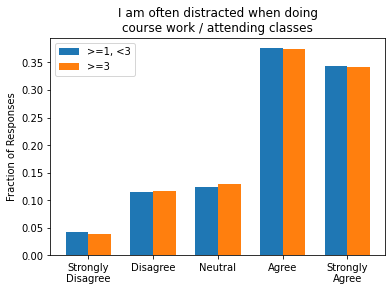

MannwhitneyuResult(statistic=1580683.5, pvalue=0.4112661690576048)
>=1, <3 3.87
>=3 3.86
Cohen's d = 0.0043


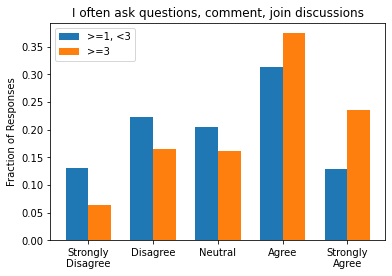

MannwhitneyuResult(statistic=1251632.0, pvalue=8.554298077865889e-30)
>=1, <3 3.09
>=3 3.55
Cohen's d = -0.38


In [527]:
num_comp(hs, 'num_methods',1, 3)

>=1, <4 (2448, 43)
>=4 (1118, 43)


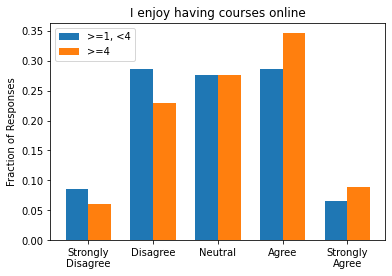

MannwhitneyuResult(statistic=1215748.0, pvalue=1.4335781885751943e-08)
>=1, <4 2.96
>=4 3.18
Cohen's d = -0.2


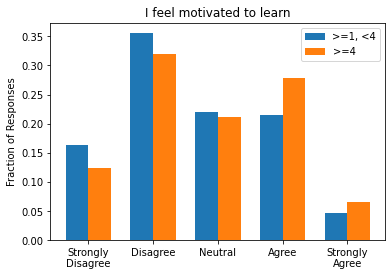

MannwhitneyuResult(statistic=1226845.5, pvalue=1.3692707383906988e-07)
>=1, <4 2.63
>=4 2.84
Cohen's d = -0.19


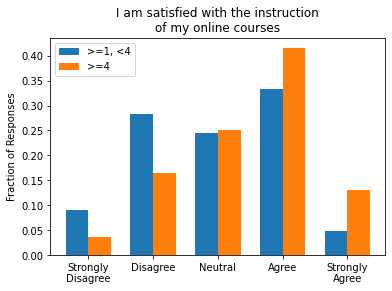

MannwhitneyuResult(statistic=1042310.0, pvalue=5.784815125786625e-33)
>=1, <4 2.96
>=4 3.44
Cohen's d = -0.45


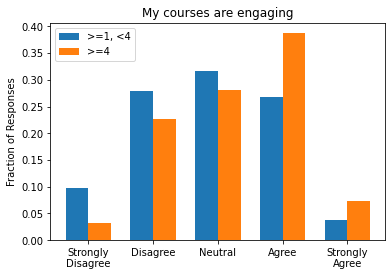

MannwhitneyuResult(statistic=1100990.0, pvalue=8.876442308092193e-23)
>=1, <4 2.87
>=4 3.24
Cohen's d = -0.36


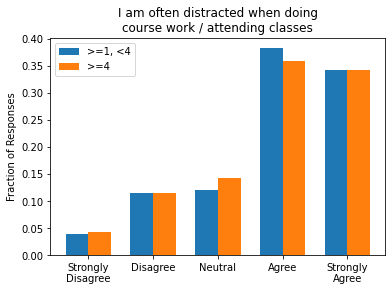

MannwhitneyuResult(statistic=1348963.5, pvalue=0.23634197484648173)
>=1, <4 3.87
>=4 3.84
Cohen's d = 0.027


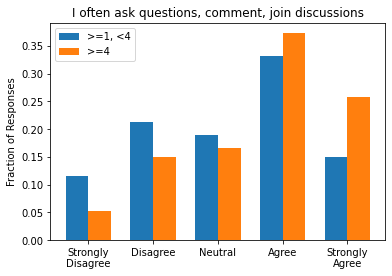

MannwhitneyuResult(statistic=1091693.5, pvalue=6.569939166337753e-24)
>=1, <4 3.19
>=4 3.64
Cohen's d = -0.36


In [528]:
num_comp(hs, 'num_methods',1, 4)

>=1, <5 (2995, 43)
>=5 (571, 43)


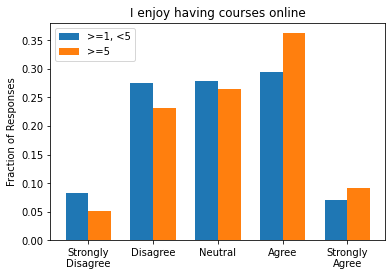

MannwhitneyuResult(statistic=758760.5, pvalue=4.748460381229515e-06)
>=1, <5 2.99
>=5 3.21
Cohen's d = -0.2


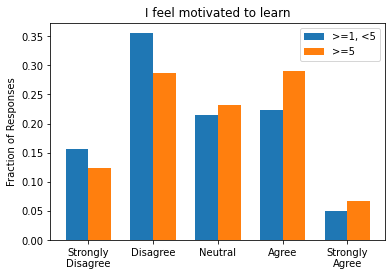

MannwhitneyuResult(statistic=757867.5, pvalue=4.009394779144479e-06)
>=1, <5 2.66
>=5 2.89
Cohen's d = -0.2


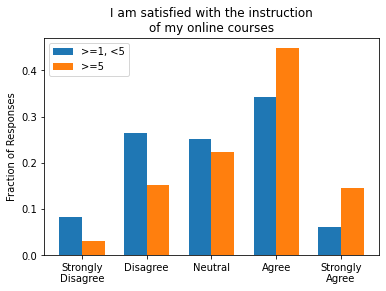

MannwhitneyuResult(statistic=640982.0, pvalue=2.4364608837225023e-23)
>=1, <5 3.03
>=5 3.53
Cohen's d = -0.46


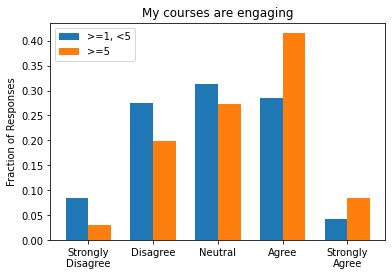

MannwhitneyuResult(statistic=671396.5, pvalue=1.1811642335272736e-17)
>=1, <5 2.92
>=5 3.33
Cohen's d = -0.39


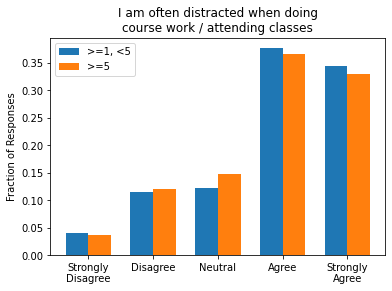

MannwhitneyuResult(statistic=834007.5, pvalue=0.16281328582223625)
>=1, <5 3.87
>=5 3.83
Cohen's d = 0.036


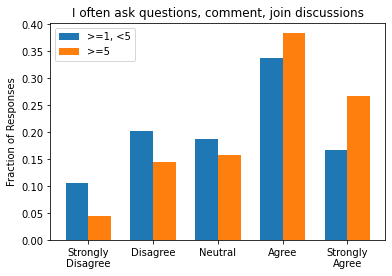

MannwhitneyuResult(statistic=691472.0, pvalue=3.4529703465571256e-14)
>=1, <5 3.26
>=5 3.68
Cohen's d = -0.34


In [529]:
num_comp(hs, 'num_methods',1, 5)

### Combinations of types of methods

In [530]:
ugcat1 = ug[(ug['passive']==True) & (ug['partly_active']==False) & (ug['fully_active']==False)]
ugcat2 = ug[(ug['passive']==False) & (ug['partly_active']==True) & (ug['fully_active']==False)]
ugcat3 = ug[(ug['passive']==False) & (ug['partly_active']==False) & (ug['fully_active']==True)]
ugcat4 = ug[(ug['passive']==True) & (ug['partly_active']==True) & (ug['fully_active']==False)]
ugcat5 = ug[(ug['passive']==True) & (ug['partly_active']==False) & (ug['fully_active']==True)]
ugcat6 = ug[(ug['passive']==False) & (ug['partly_active']==True) & (ug['fully_active']==True)]
ugcat7 = ug[(ug['passive']==True) & (ug['partly_active']==True) & (ug['fully_active']==True)]
ugcats = [ugcat1, ugcat2, ugcat3, ugcat4, ugcat5, ugcat6, ugcat7]

hscat1 = hs[(hs['passive']==True) & (hs['partly_active']==False) & (hs['fully_active']==False)]
hscat2 = hs[(hs['passive']==False) & (hs['partly_active']==True) & (hs['fully_active']==False)]
hscat3 = hs[(hs['passive']==False) & (hs['partly_active']==False) & (hs['fully_active']==True)]
hscat4 = hs[(hs['passive']==True) & (hs['partly_active']==True) & (hs['fully_active']==False)]
hscat5 = hs[(hs['passive']==True) & (hs['partly_active']==False) & (hs['fully_active']==True)]
hscat6 = hs[(hs['passive']==False) & (hs['partly_active']==True) & (hs['fully_active']==True)]
hscat7 = hs[(hs['passive']==True) & (hs['partly_active']==True) & (hs['fully_active']==True)]
hscats = [hscat1, hscat2, hscat3, hscat4, hscat5, hscat6, hscat7]

In [531]:
names = ['p','a','f','pa','pf','af','paf']
for i in range(len(ugcats)):
    subset_ls.append(ugcats[i])
    subset_name.append(names[i])
    ugcats[i].name = names[i]
for i in range(len(hscats)):
    subset_ls.append(hscats[i])
    subset_name.append(names[i])
    hscats[i].name = names[i]

#### Undergrad

----------------------
p (759, 43)
a (279, 43)


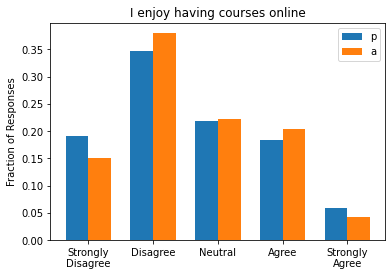

MannwhitneyuResult(statistic=103275.5, pvalue=0.26426031351164747)
p 2.57
a 2.61
Cohen's d = -0.033


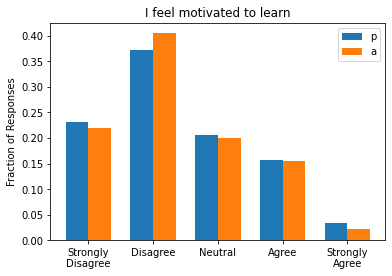

MannwhitneyuResult(statistic=104554.5, pvalue=0.3734727860155661)
p 2.39
a 2.35
Cohen's d = 0.033


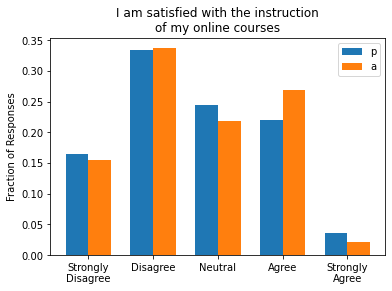

MannwhitneyuResult(statistic=103669.0, pvalue=0.2963949935347066)
p 2.63
a 2.67
Cohen's d = -0.032


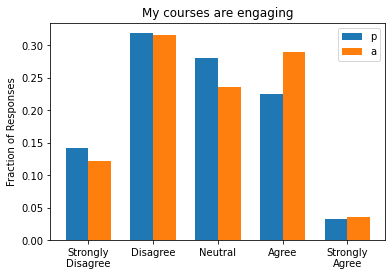

MannwhitneyuResult(statistic=99650.5, pvalue=0.06586146646493801)
p 2.69
a 2.8
Cohen's d = -0.11


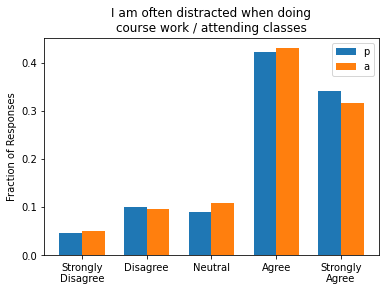

MannwhitneyuResult(statistic=102702.0, pvalue=0.21494816033982184)
p 3.91
a 3.86
Cohen's d = 0.044


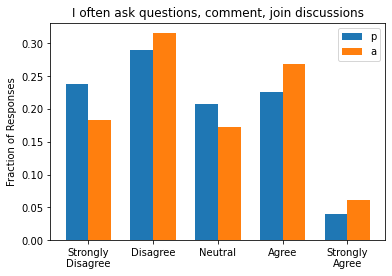

MannwhitneyuResult(statistic=97748.5, pvalue=0.025174077699391412)
p 2.54
a 2.71
Cohen's d = -0.14
----------------------
p (759, 43)
f (201, 43)


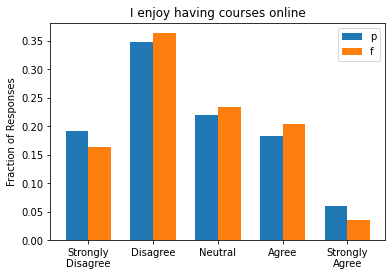

MannwhitneyuResult(statistic=75241.5, pvalue=0.3792897701972778)
p 2.57
f 2.58
Cohen's d = -0.009


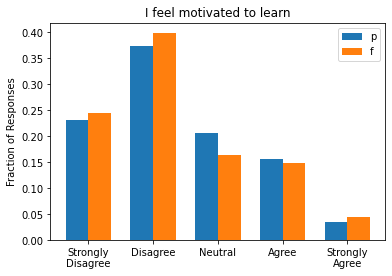

MannwhitneyuResult(statistic=74214.5, pvalue=0.26921758792925193)
p 2.39
f 2.35
Cohen's d = 0.034


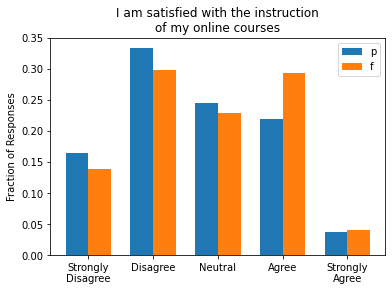

MannwhitneyuResult(statistic=69890.5, pvalue=0.029304792826089134)
p 2.63
f 2.8
Cohen's d = -0.15


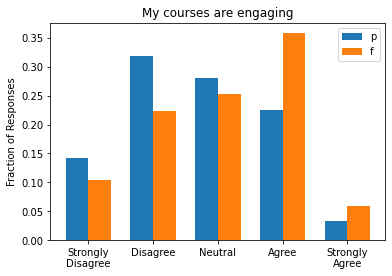

MannwhitneyuResult(statistic=62188.5, pvalue=1.5116469939168948e-05)
p 2.69
f 3.04
Cohen's d = -0.33


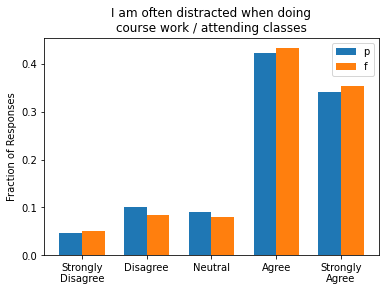

MannwhitneyuResult(statistic=74592.0, pvalue=0.30354729087588894)
p 3.91
f 3.96
Cohen's d = -0.038


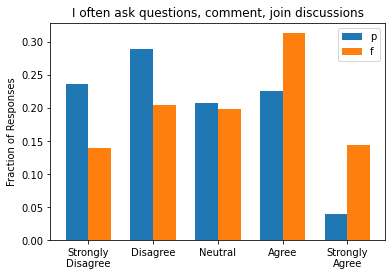

MannwhitneyuResult(statistic=56872.5, pvalue=5.728257641663973e-09)
p 2.54
f 3.12
Cohen's d = -0.48
----------------------
p (759, 43)
pa (592, 43)


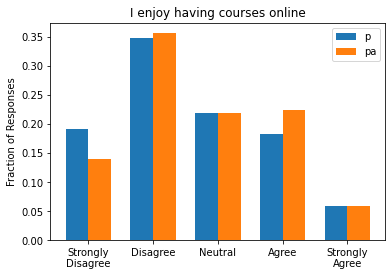

MannwhitneyuResult(statistic=209407.5, pvalue=0.013208792979192783)
p 2.57
pa 2.71
Cohen's d = -0.12


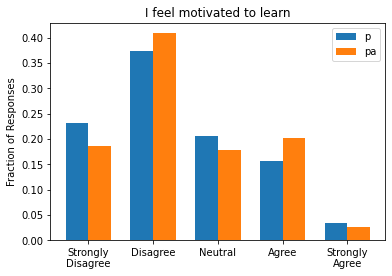

MannwhitneyuResult(statistic=214820.0, pvalue=0.07450584607405236)
p 2.39
pa 2.47
Cohen's d = -0.074


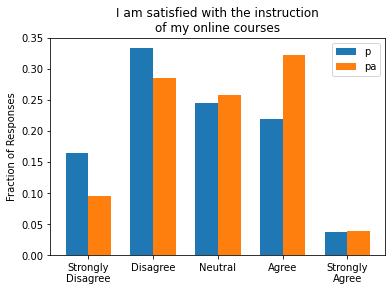

MannwhitneyuResult(statistic=190454.0, pvalue=3.20254405145527e-07)
p 2.63
pa 2.93
Cohen's d = -0.27


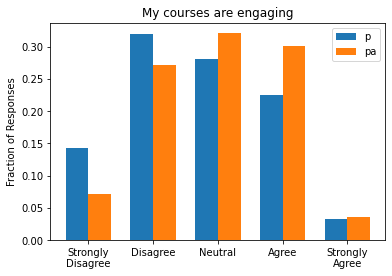

MannwhitneyuResult(statistic=192346.5, pvalue=1.2128589779261499e-06)
p 2.69
pa 2.96
Cohen's d = -0.26


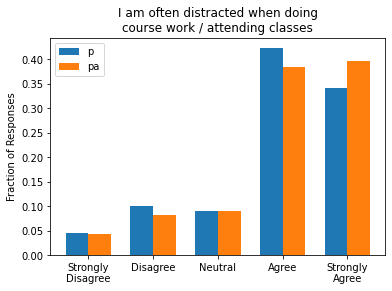

MannwhitneyuResult(statistic=212127.5, pvalue=0.0303521599549591)
p 3.91
pa 4.01
Cohen's d = -0.086


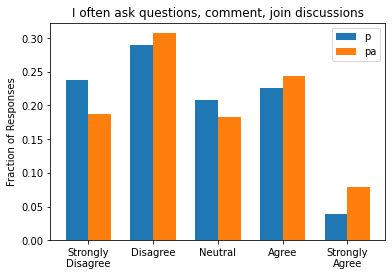

MannwhitneyuResult(statistic=207194.0, pvalue=0.005732919157521777)
p 2.54
pa 2.72
Cohen's d = -0.15
----------------------
p (759, 43)
pf (675, 43)


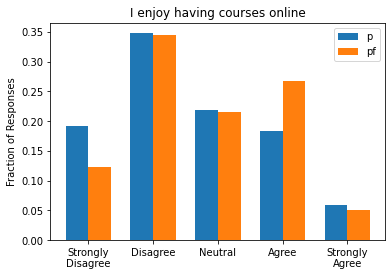

MannwhitneyuResult(statistic=229375.5, pvalue=0.00019778834249973768)
p 2.57
pf 2.78
Cohen's d = -0.18


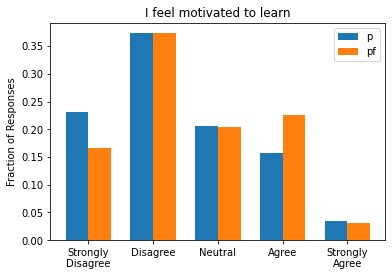

MannwhitneyuResult(statistic=230761.0, pvalue=0.00036928909195969476)
p 2.39
pf 2.58
Cohen's d = -0.17


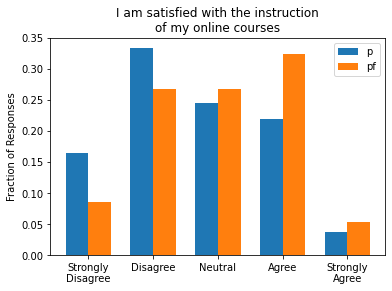

MannwhitneyuResult(statistic=209305.0, pvalue=2.9175018888124853e-10)
p 2.63
pf 2.99
Cohen's d = -0.33


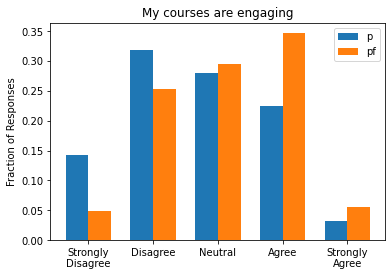

MannwhitneyuResult(statistic=200424.5, pvalue=7.41091474623183e-14)
p 2.69
pf 3.11
Cohen's d = -0.4


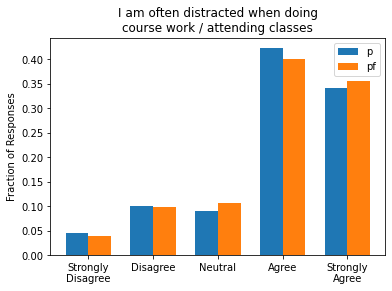

MannwhitneyuResult(statistic=253527.5, pvalue=0.3602930953267456)
p 3.91
pf 3.94
Cohen's d = -0.022


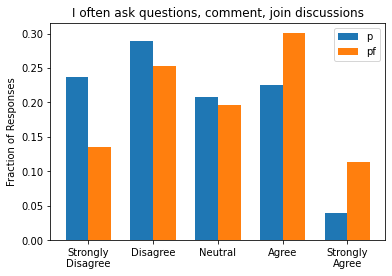

MannwhitneyuResult(statistic=202919.5, pvalue=1.3555738057293084e-12)
p 2.54
pf 3.01
Cohen's d = -0.38
----------------------
p (759, 43)
af (240, 43)


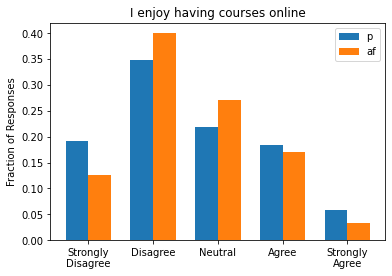

MannwhitneyuResult(statistic=89096.5, pvalue=0.29877669331563383)
p 2.57
af 2.59
Cohen's d = -0.014


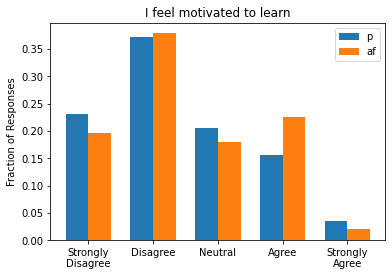

MannwhitneyuResult(statistic=86099.0, pvalue=0.09171688990846172)
p 2.39
af 2.5
Cohen's d = -0.095


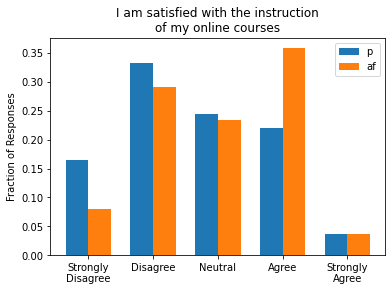

MannwhitneyuResult(statistic=74601.5, pvalue=5.954848414248474e-06)
p 2.63
af 2.98
Cohen's d = -0.32


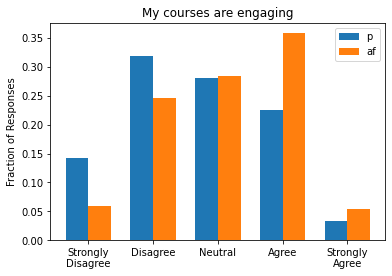

MannwhitneyuResult(statistic=71375.5, pvalue=8.029978664363671e-08)
p 2.69
af 3.1
Cohen's d = -0.39


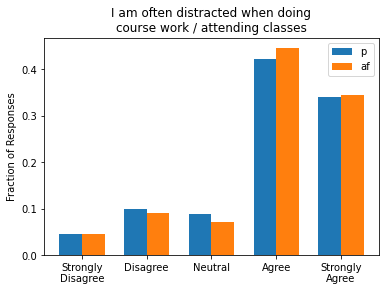

MannwhitneyuResult(statistic=89321.5, pvalue=0.3152190766306763)
p 3.91
af 3.95
Cohen's d = -0.037


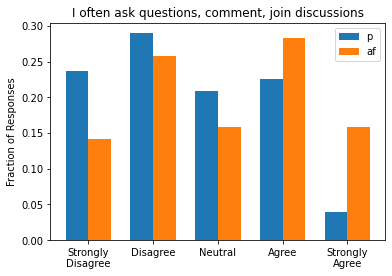

MannwhitneyuResult(statistic=70888.0, pvalue=4.9663633374099194e-08)
p 2.54
af 3.06
Cohen's d = -0.42
----------------------
p (759, 43)
paf (1081, 43)


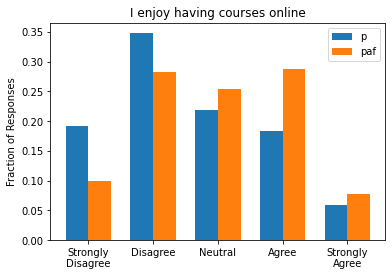

MannwhitneyuResult(statistic=331367.5, pvalue=2.0206021395874343e-13)
p 2.57
paf 2.96
Cohen's d = -0.34


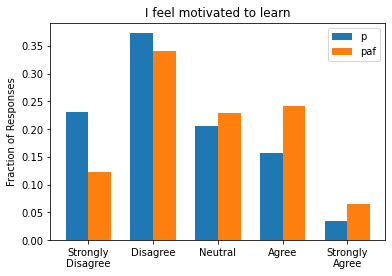

MannwhitneyuResult(statistic=330984.0, pvalue=1.2393881613571044e-13)
p 2.39
paf 2.78
Cohen's d = -0.35


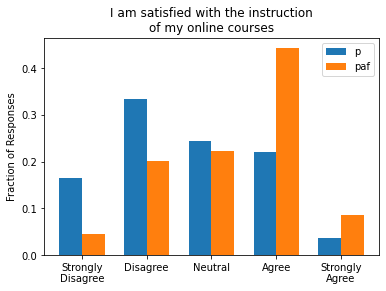

MannwhitneyuResult(statistic=269798.0, pvalue=5.640598230873282e-39)
p 2.63
paf 3.32
Cohen's d = -0.65


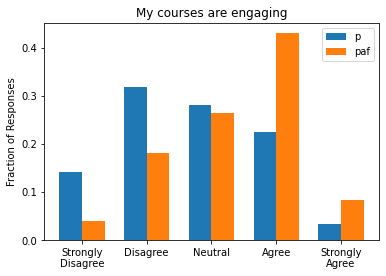

MannwhitneyuResult(statistic=273922.5, pvalue=6.623942278939744e-37)
p 2.69
paf 3.33
Cohen's d = -0.63


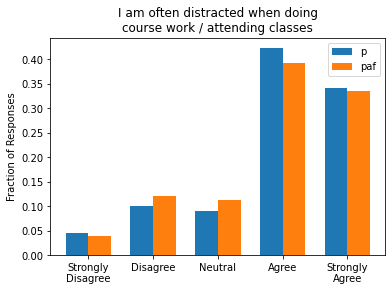

MannwhitneyuResult(statistic=399687.5, pvalue=0.15976030809395741)
p 3.91
paf 3.86
Cohen's d = 0.046


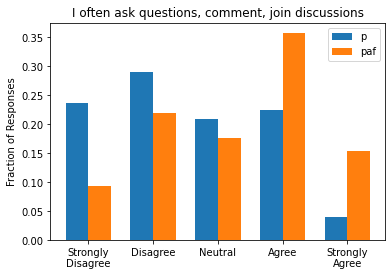

MannwhitneyuResult(statistic=279464.0, pvalue=2.0380553078964896e-33)
p 2.54
paf 3.26
Cohen's d = -0.59
----------------------
a (279, 43)
f (201, 43)


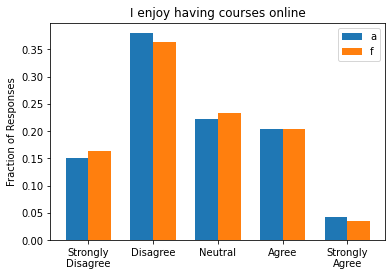

MannwhitneyuResult(statistic=27730.5, pvalue=0.4152519231371776)
a 2.61
f 2.58
Cohen's d = 0.025


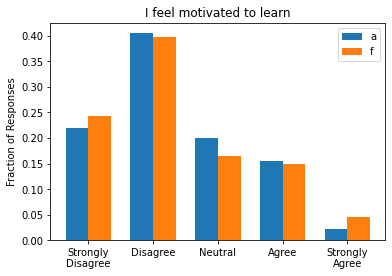

MannwhitneyuResult(statistic=27589.5, pvalue=0.37685030356445787)
a 2.35
f 2.35
Cohen's d = 0.0015


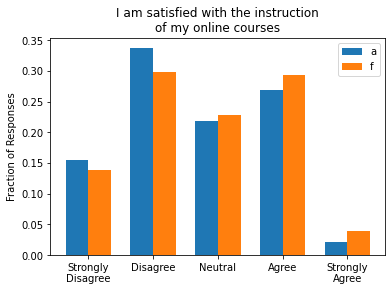

MannwhitneyuResult(statistic=26269.5, pvalue=0.11061477519487811)
a 2.67
f 2.8
Cohen's d = -0.12


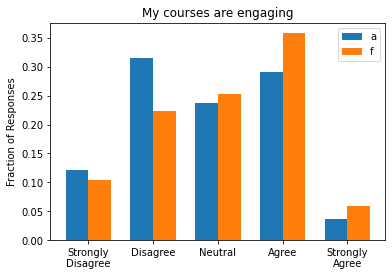

MannwhitneyuResult(statistic=24567.0, pvalue=0.008174829732539505)
a 2.8
f 3.04
Cohen's d = -0.22


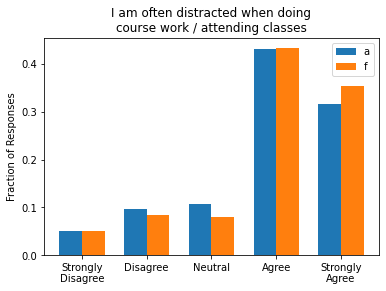

MannwhitneyuResult(statistic=26563.5, pvalue=0.1472967298444836)
a 3.86
f 3.96
Cohen's d = -0.082


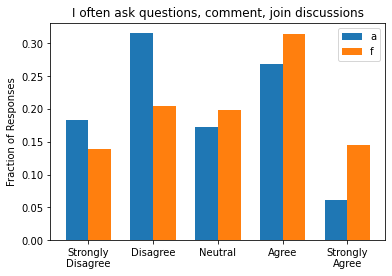

MannwhitneyuResult(statistic=22962.0, pvalue=0.000248061944528023)
a 2.71
f 3.12
Cohen's d = -0.33
----------------------
a (279, 43)
pa (592, 43)


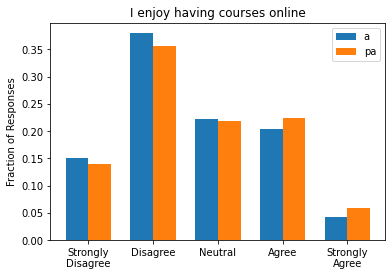

MannwhitneyuResult(statistic=78834.5, pvalue=0.13059382583120643)
a 2.61
pa 2.71
Cohen's d = -0.086


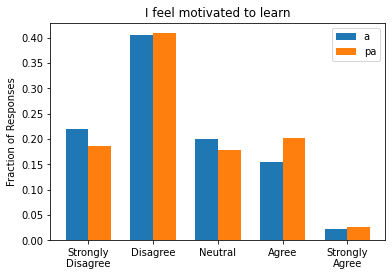

MannwhitneyuResult(statistic=77848.0, pvalue=0.07615117334934912)
a 2.35
pa 2.47
Cohen's d = -0.11


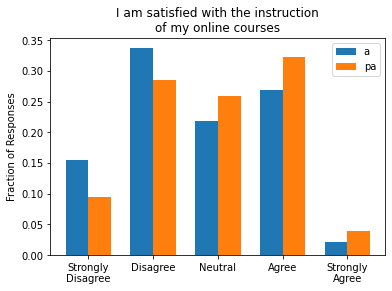

MannwhitneyuResult(statistic=71798.0, pvalue=0.0006138970664440411)
a 2.67
pa 2.93
Cohen's d = -0.24


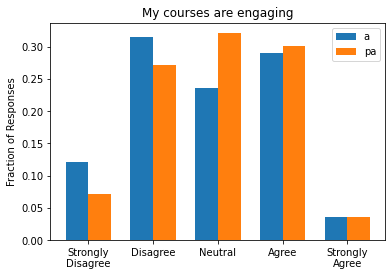

MannwhitneyuResult(statistic=76019.0, pvalue=0.024364272811565318)
a 2.8
pa 2.96
Cohen's d = -0.15


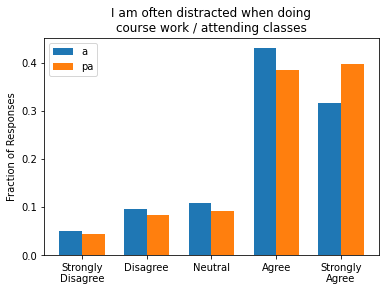

MannwhitneyuResult(statistic=75521.5, pvalue=0.015056838316817034)
a 3.86
pa 4.01
Cohen's d = -0.13


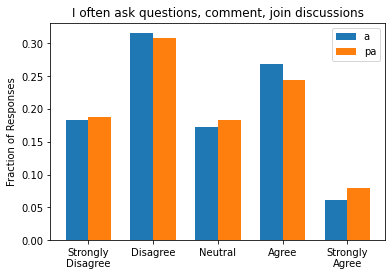

MannwhitneyuResult(statistic=82402.0, pvalue=0.47847320811891636)
a 2.71
pa 2.72
Cohen's d = -0.008
----------------------
a (279, 43)
pf (675, 43)


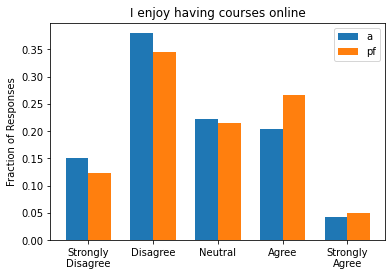

MannwhitneyuResult(statistic=86280.0, pvalue=0.017242142285906082)
a 2.61
pf 2.78
Cohen's d = -0.15


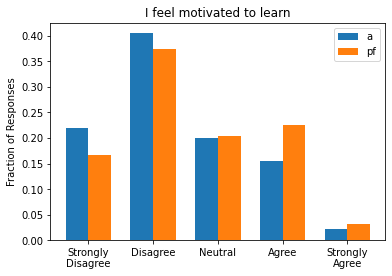

MannwhitneyuResult(statistic=83399.0, pvalue=0.0018847147915527344)
a 2.35
pf 2.58
Cohen's d = -0.21


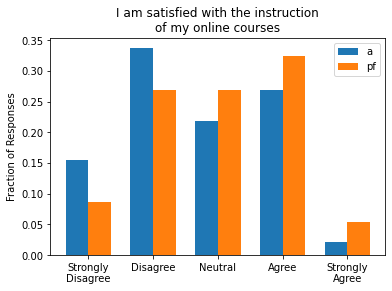

MannwhitneyuResult(statistic=78960.0, pvalue=2.3140229076285097e-05)
a 2.67
pf 2.99
Cohen's d = -0.3


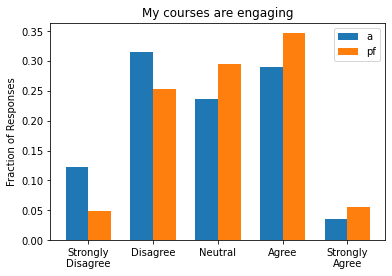

MannwhitneyuResult(statistic=79700.0, pvalue=5.006981265968871e-05)
a 2.8
pf 3.11
Cohen's d = -0.3


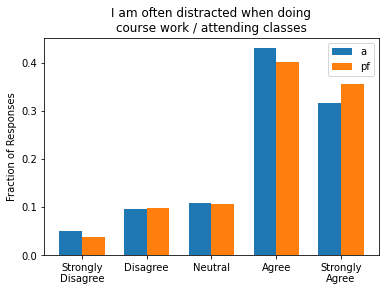

MannwhitneyuResult(statistic=90395.0, pvalue=0.15093942708909724)
a 3.86
pf 3.94
Cohen's d = -0.067


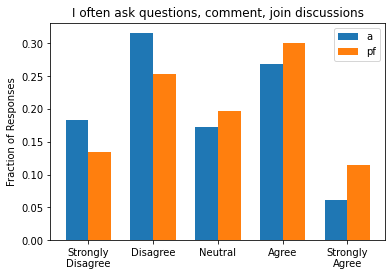

MannwhitneyuResult(statistic=81678.5, pvalue=0.00045243357310451114)
a 2.71
pf 3.01
Cohen's d = -0.24
----------------------
a (279, 43)
af (240, 43)


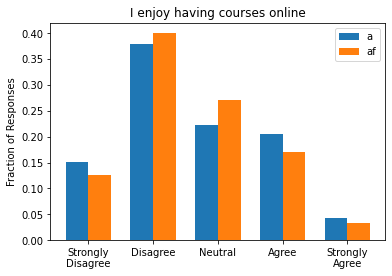

MannwhitneyuResult(statistic=33347.5, pvalue=0.46775051288368225)
a 2.61
af 2.59
Cohen's d = 0.021


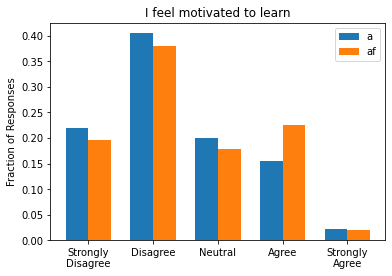

MannwhitneyuResult(statistic=31187.0, pvalue=0.07992393147300453)
a 2.35
af 2.5
Cohen's d = -0.13


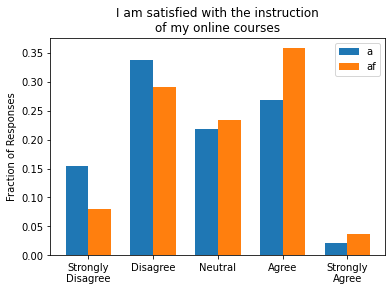

MannwhitneyuResult(statistic=28134.5, pvalue=0.0005534821634490641)
a 2.67
af 2.98
Cohen's d = -0.29


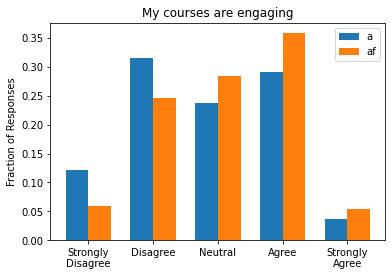

MannwhitneyuResult(statistic=28367.0, pvalue=0.0009068282082696323)
a 2.8
af 3.1
Cohen's d = -0.28


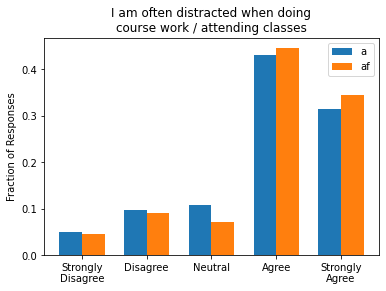

MannwhitneyuResult(statistic=31804.0, pvalue=0.14704007062356872)
a 3.86
af 3.95
Cohen's d = -0.082


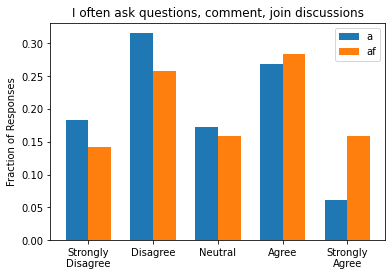

MannwhitneyuResult(statistic=28464.0, pvalue=0.0012261545071189206)
a 2.71
af 3.06
Cohen's d = -0.28
----------------------
a (279, 43)
paf (1081, 43)


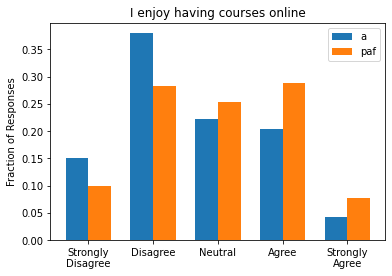

MannwhitneyuResult(statistic=124319.5, pvalue=1.4315030352305017e-06)
a 2.61
paf 2.96
Cohen's d = -0.31


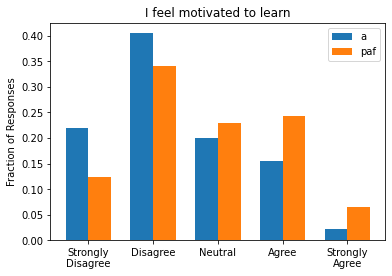

MannwhitneyuResult(statistic=119078.0, pvalue=9.335764663556407e-09)
a 2.35
paf 2.78
Cohen's d = -0.38


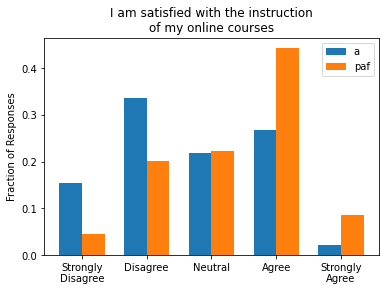

MannwhitneyuResult(statistic=102141.5, pvalue=1.3009450470687875e-18)
a 2.67
paf 3.32
Cohen's d = -0.62


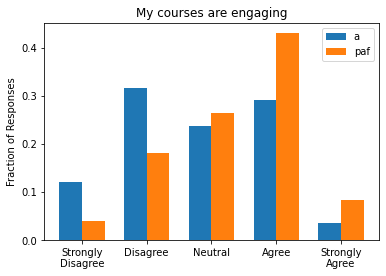

MannwhitneyuResult(statistic=110320.5, pvalue=1.9048207569800662e-13)
a 2.8
paf 3.33
Cohen's d = -0.52


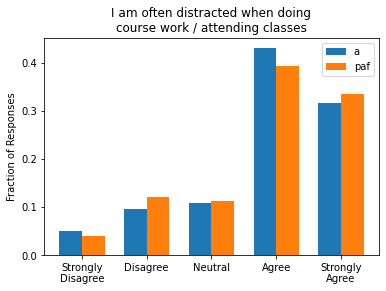

MannwhitneyuResult(statistic=150305.5, pvalue=0.46449983577807546)
a 3.86
paf 3.86
Cohen's d = 0.0023


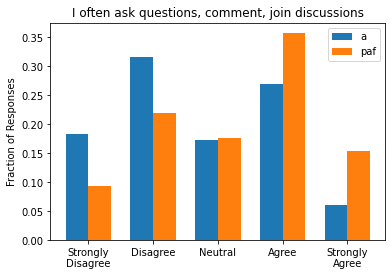

MannwhitneyuResult(statistic=113883.5, pvalue=3.5913965951211185e-11)
a 2.71
paf 3.26
Cohen's d = -0.45
----------------------
f (201, 43)
pa (592, 43)


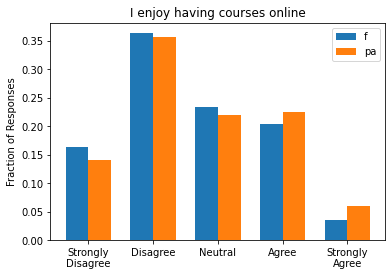

MannwhitneyuResult(statistic=56135.0, pvalue=0.1070278462805958)
f 2.58
pa 2.71
Cohen's d = -0.11


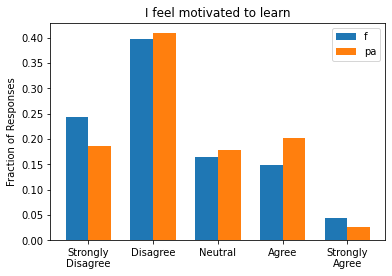

MannwhitneyuResult(statistic=55294.0, pvalue=0.05854081473359639)
f 2.35
pa 2.47
Cohen's d = -0.11


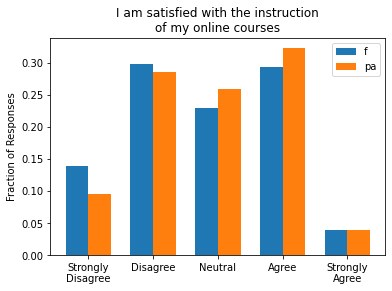

MannwhitneyuResult(statistic=55663.5, pvalue=0.07809277751543954)
f 2.8
pa 2.93
Cohen's d = -0.12


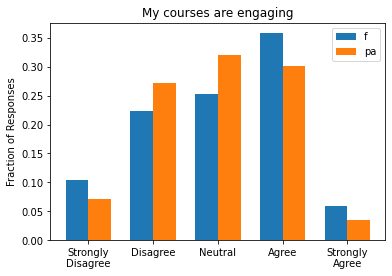

MannwhitneyuResult(statistic=56158.5, pvalue=0.10781847128819028)
f 3.04
pa 2.96
Cohen's d = 0.085


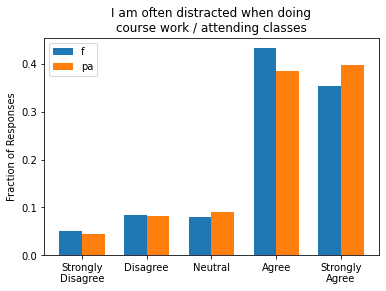

MannwhitneyuResult(statistic=57451.0, pvalue=0.21846613918919056)
f 3.96
pa 4.01
Cohen's d = -0.048


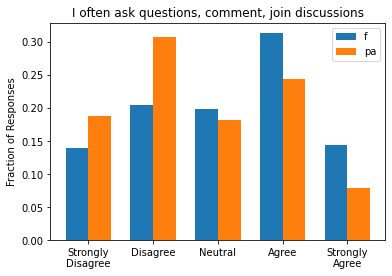

MannwhitneyuResult(statistic=48990.5, pvalue=5.9846754597881965e-05)
f 3.12
pa 2.72
Cohen's d = 0.32
----------------------
f (201, 43)
pf (675, 43)


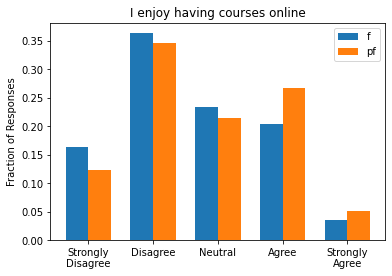

MannwhitneyuResult(statistic=61389.5, pvalue=0.01679054512267559)
f 2.58
pf 2.78
Cohen's d = -0.17


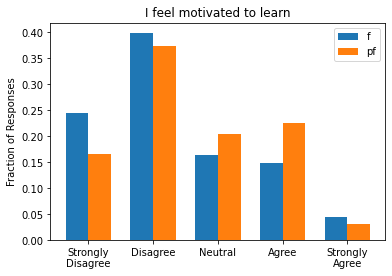

MannwhitneyuResult(statistic=59393.5, pvalue=0.0026260071687813735)
f 2.35
pf 2.58
Cohen's d = -0.21


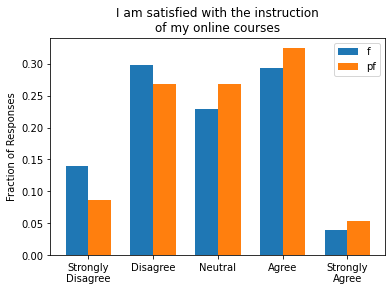

MannwhitneyuResult(statistic=61375.5, pvalue=0.016616861076481824)
f 2.8
pf 2.99
Cohen's d = -0.18


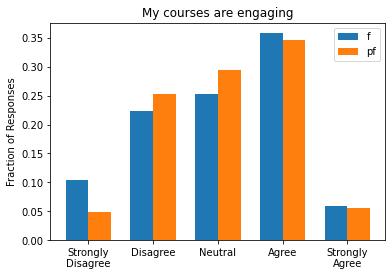

MannwhitneyuResult(statistic=66469.5, pvalue=0.3252450598708099)
f 3.04
pf 3.11
Cohen's d = -0.061


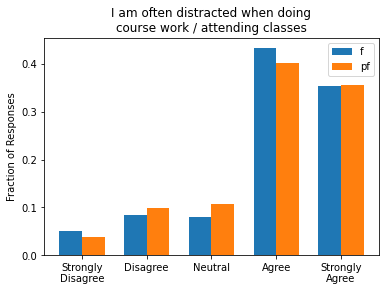

MannwhitneyuResult(statistic=67032.5, pvalue=0.39297688757563454)
f 3.96
pf 3.94
Cohen's d = 0.016


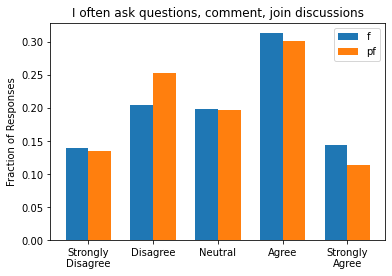

MannwhitneyuResult(statistic=64286.5, pvalue=0.12315392459667918)
f 3.12
pf 3.01
Cohen's d = 0.09
----------------------
f (201, 43)
af (240, 43)


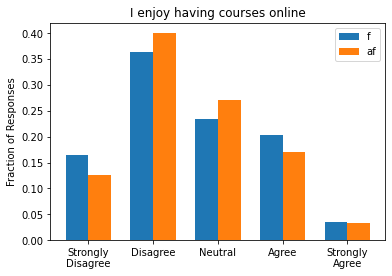

MannwhitneyuResult(statistic=23962.0, pvalue=0.4509256555109028)
f 2.58
af 2.59
Cohen's d = -0.0051


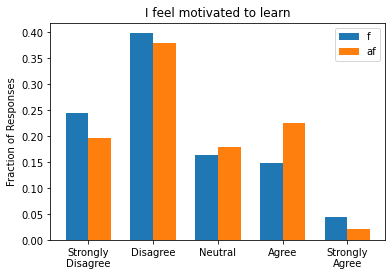

MannwhitneyuResult(statistic=22192.5, pvalue=0.06581233475830038)
f 2.35
af 2.5
Cohen's d = -0.13


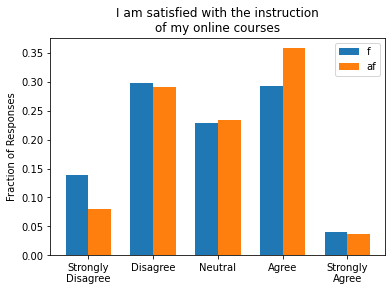

MannwhitneyuResult(statistic=21864.0, pvalue=0.039276846253008854)
f 2.8
af 2.98
Cohen's d = -0.17


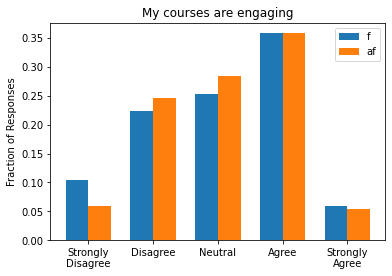

MannwhitneyuResult(statistic=23611.5, pvalue=0.34560932549236634)
f 3.04
af 3.1
Cohen's d = -0.056


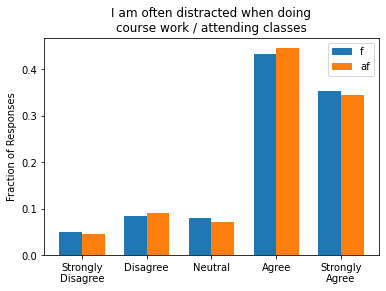

MannwhitneyuResult(statistic=24049.0, pvalue=0.4774048113069513)
f 3.96
af 3.95
Cohen's d = 0.00096


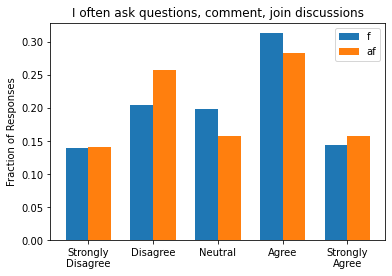

MannwhitneyuResult(statistic=23506.0, pvalue=0.3183229889179203)
f 3.12
af 3.06
Cohen's d = 0.047
----------------------
f (201, 43)
paf (1081, 43)


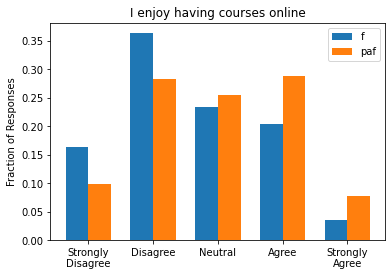

MannwhitneyuResult(statistic=88354.5, pvalue=6.8116289916179766e-06)
f 2.58
paf 2.96
Cohen's d = -0.34


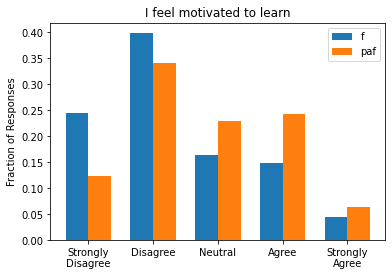

MannwhitneyuResult(statistic=85114.0, pvalue=2.1319424554094278e-07)
f 2.35
paf 2.78
Cohen's d = -0.38


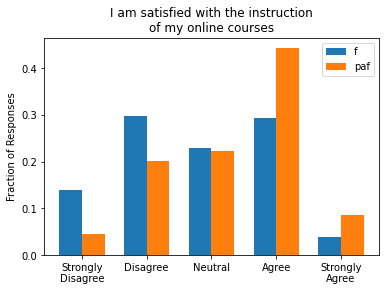

MannwhitneyuResult(statistic=80601.5, pvalue=4.723297758635415e-10)
f 2.8
paf 3.32
Cohen's d = -0.5


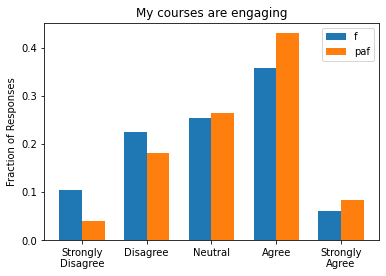

MannwhitneyuResult(statistic=93429.0, pvalue=0.00044264107456201294)
f 3.04
paf 3.33
Cohen's d = -0.28


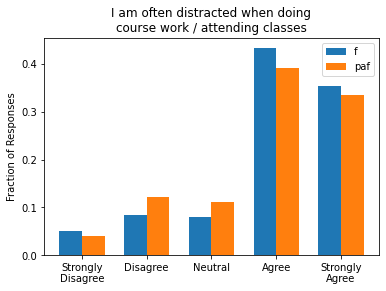

MannwhitneyuResult(statistic=103460.5, pvalue=0.12803925300653296)
f 3.96
paf 3.86
Cohen's d = 0.084


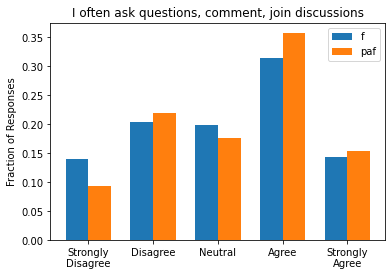

MannwhitneyuResult(statistic=102222.0, pvalue=0.08440470541476025)
f 3.12
paf 3.26
Cohen's d = -0.11
----------------------
pa (592, 43)
pf (675, 43)


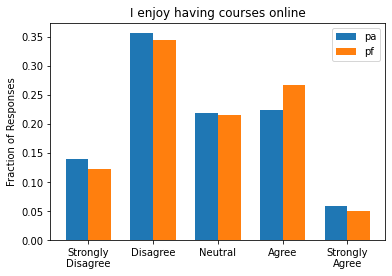

MannwhitneyuResult(statistic=192357.0, pvalue=0.11738785909064403)
pa 2.71
pf 2.78
Cohen's d = -0.062


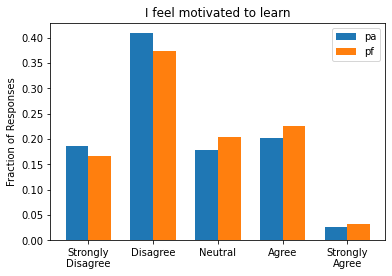

MannwhitneyuResult(statistic=188548.5, pvalue=0.03540037723967722)
pa 2.47
pf 2.58
Cohen's d = -0.1


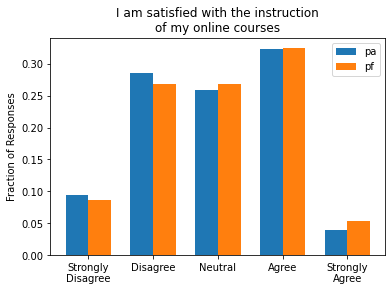

MannwhitneyuResult(statistic=193379.5, pvalue=0.15226357712461597)
pa 2.93
pf 2.99
Cohen's d = -0.061


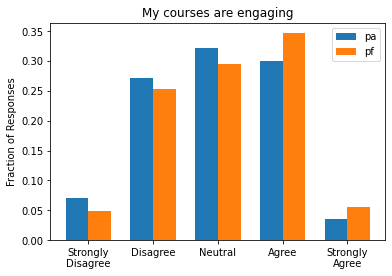

MannwhitneyuResult(statistic=183772.5, pvalue=0.005030637762068461)
pa 2.96
pf 3.11
Cohen's d = -0.15


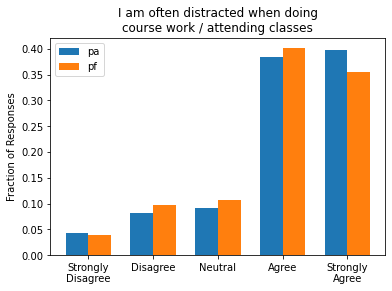

MannwhitneyuResult(statistic=190748.0, pvalue=0.06927821793085494)
pa 4.01
pf 3.94
Cohen's d = 0.064


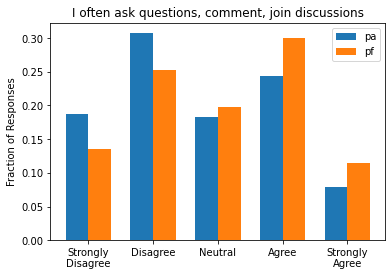

MannwhitneyuResult(statistic=174063.0, pvalue=2.3283229905044144e-05)
pa 2.72
pf 3.01
Cohen's d = -0.23
----------------------
pa (592, 43)
af (240, 43)


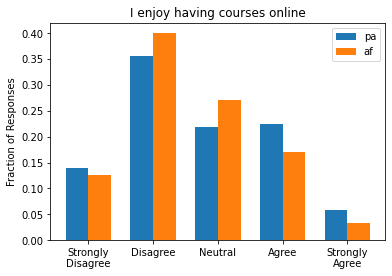

MannwhitneyuResult(statistic=67382.5, pvalue=0.11300709523904634)
pa 2.71
af 2.59
Cohen's d = 0.11


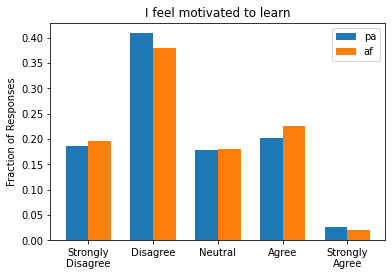

MannwhitneyuResult(statistic=70240.0, pvalue=0.3950309175774247)
pa 2.47
af 2.5
Cohen's d = -0.021


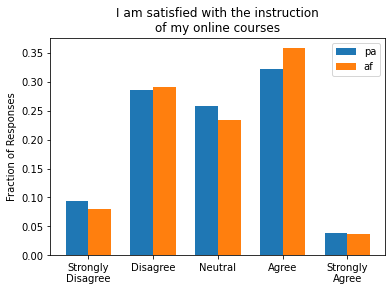

MannwhitneyuResult(statistic=68883.5, pvalue=0.2374053778082612)
pa 2.93
af 2.98
Cohen's d = -0.054


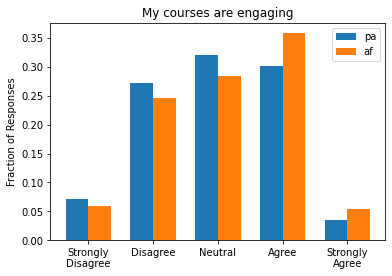

MannwhitneyuResult(statistic=65283.0, pvalue=0.02795889790237567)
pa 2.96
af 3.1
Cohen's d = -0.15


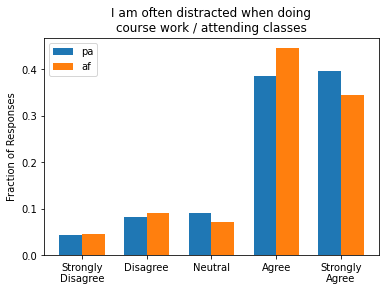

MannwhitneyuResult(statistic=68372.5, pvalue=0.18232505922482545)
pa 4.01
af 3.95
Cohen's d = 0.049


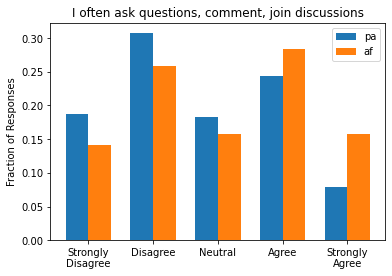

MannwhitneyuResult(statistic=60716.0, pvalue=0.0003638861955666596)
pa 2.72
af 3.06
Cohen's d = -0.27
----------------------
pa (592, 43)
paf (1081, 43)


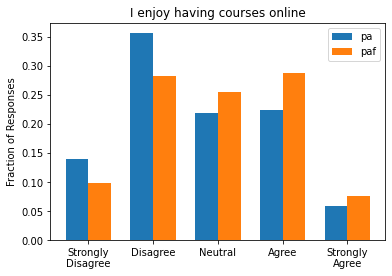

MannwhitneyuResult(statistic=279065.0, pvalue=3.8111878609279395e-06)
pa 2.71
paf 2.96
Cohen's d = -0.23


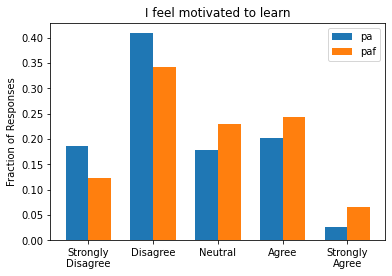

MannwhitneyuResult(statistic=271117.5, pvalue=3.912577913999521e-08)
pa 2.47
paf 2.78
Cohen's d = -0.28


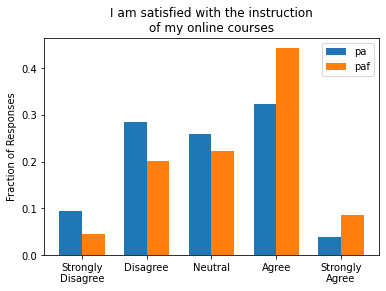

MannwhitneyuResult(statistic=254629.5, pvalue=2.0684874986556213e-13)
pa 2.93
paf 3.32
Cohen's d = -0.38


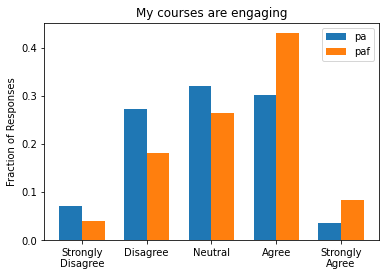

MannwhitneyuResult(statistic=253325.0, pvalue=7.096065130338021e-14)
pa 2.96
paf 3.33
Cohen's d = -0.38


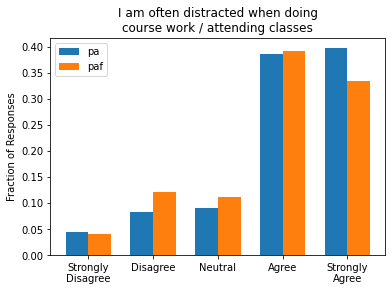

MannwhitneyuResult(statistic=294317.5, pvalue=0.002027755876944059)
pa 4.01
paf 3.86
Cohen's d = 0.13


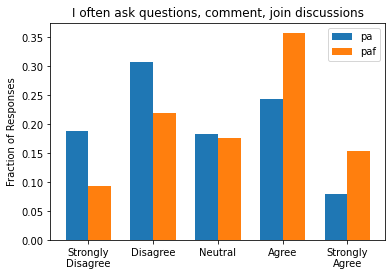

MannwhitneyuResult(statistic=243391.5, pvalue=3.4584242557980943e-17)
pa 2.72
paf 3.26
Cohen's d = -0.44
----------------------
pf (675, 43)
af (240, 43)


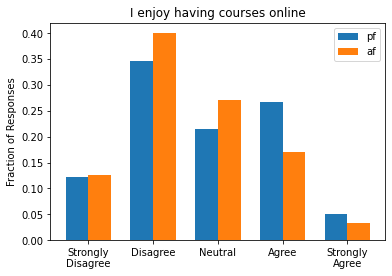

MannwhitneyuResult(statistic=73504.5, pvalue=0.013357466157531212)
pf 2.78
af 2.59
Cohen's d = 0.17


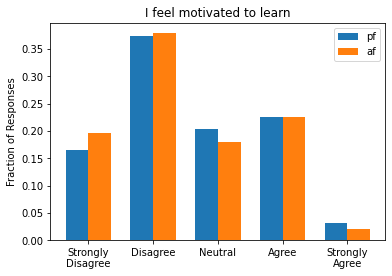

MannwhitneyuResult(statistic=77443.5, pvalue=0.14625889218130939)
pf 2.58
af 2.5
Cohen's d = 0.078


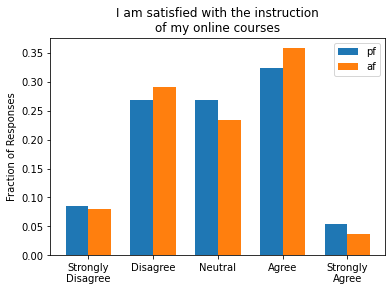

MannwhitneyuResult(statistic=80848.0, pvalue=0.48212801465582017)
pf 2.99
af 2.98
Cohen's d = 0.0073


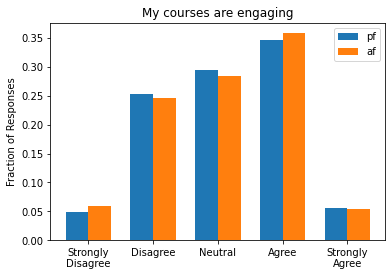

MannwhitneyuResult(statistic=80891.5, pvalue=0.4872016997242377)
pf 3.11
af 3.1
Cohen's d = 0.0039


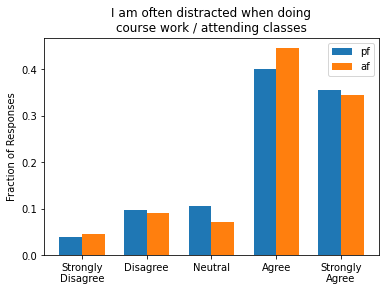

MannwhitneyuResult(statistic=80271.5, pvalue=0.41284513291605607)
pf 3.94
af 3.95
Cohen's d = -0.015


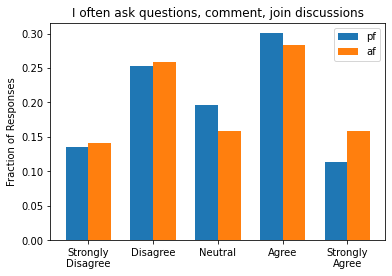

MannwhitneyuResult(statistic=79078.0, pvalue=0.28717198530099486)
pf 3.01
af 3.06
Cohen's d = -0.041
----------------------
pf (675, 43)
paf (1081, 43)


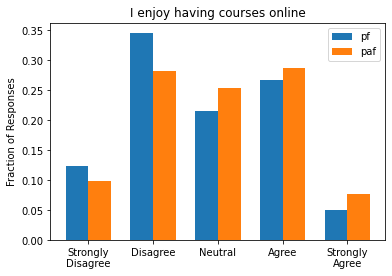

MannwhitneyuResult(statistic=331574.5, pvalue=0.00043487788912482896)
pf 2.78
paf 2.96
Cohen's d = -0.16


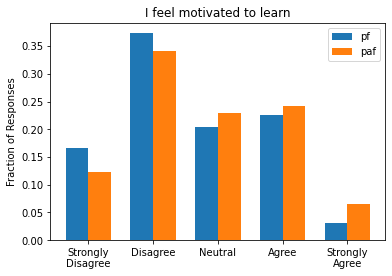

MannwhitneyuResult(statistic=329503.0, pvalue=0.00019542702148286155)
pf 2.58
paf 2.78
Cohen's d = -0.18


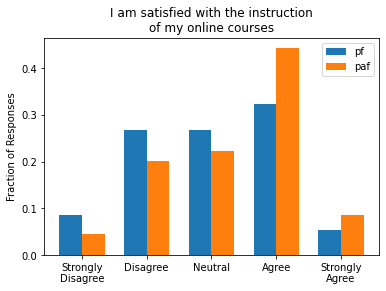

MannwhitneyuResult(statistic=301892.0, pvalue=8.829382005189776e-11)
pf 2.99
paf 3.32
Cohen's d = -0.31


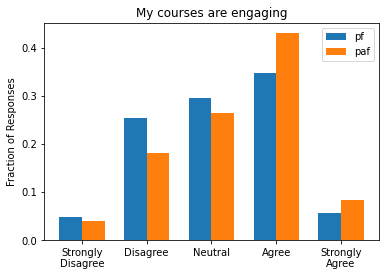

MannwhitneyuResult(statistic=318082.0, pvalue=1.0089054096815956e-06)
pf 3.11
paf 3.33
Cohen's d = -0.23


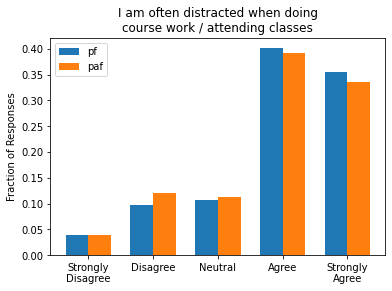

MannwhitneyuResult(statistic=351674.0, pvalue=0.08912117128602565)
pf 3.94
paf 3.86
Cohen's d = 0.069


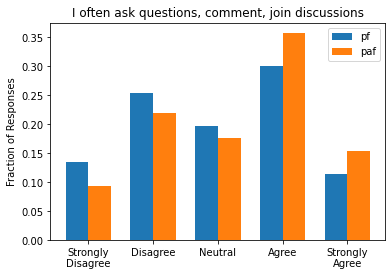

MannwhitneyuResult(statistic=323349.5, pvalue=1.7278255504632578e-05)
pf 3.01
paf 3.26
Cohen's d = -0.2
----------------------
af (240, 43)
paf (1081, 43)


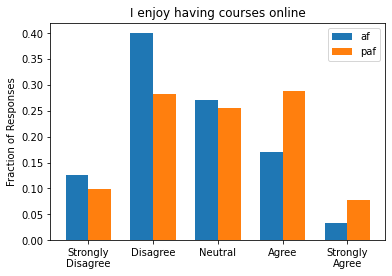

MannwhitneyuResult(statistic=105093.0, pvalue=9.453167035952833e-07)
af 2.59
paf 2.96
Cohen's d = -0.34


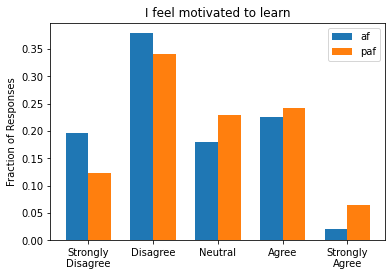

MannwhitneyuResult(statistic=111664.5, pvalue=0.00023221487412437494)
af 2.5
paf 2.78
Cohen's d = -0.26


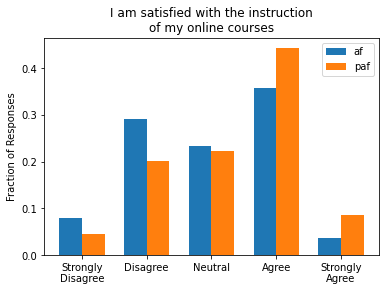

MannwhitneyuResult(statistic=107105.5, pvalue=4.095217453020327e-06)
af 2.98
paf 3.32
Cohen's d = -0.32


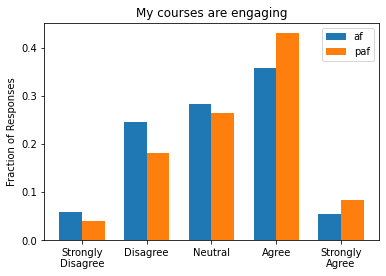

MannwhitneyuResult(statistic=113429.0, pvalue=0.0006609609370853511)
af 3.1
paf 3.33
Cohen's d = -0.23


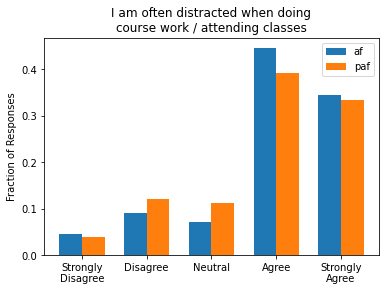

MannwhitneyuResult(statistic=123881.0, pvalue=0.12404960962354106)
af 3.95
paf 3.86
Cohen's d = 0.083


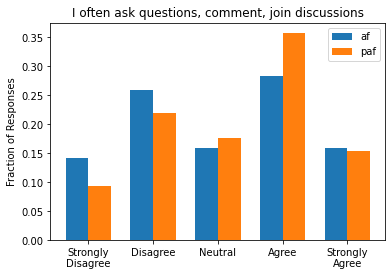

MannwhitneyuResult(statistic=118869.0, pvalue=0.018049824921996735)
af 3.06
paf 3.26
Cohen's d = -0.16


In [532]:
for i in range(len(ugcats)-1):
    for j in range(i+1, len(ugcats)):
        print('----------------------')
        print(ugcats[i].name, ugcats[i].shape)
        print(ugcats[j].name, ugcats[j].shape)
        remote_comparison(ugcats[i], ugcats[j])

#### High school

----------------------
p (513, 43)
a (327, 43)


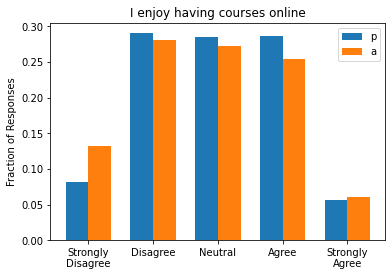

MannwhitneyuResult(statistic=79158.5, pvalue=0.07717919859452607)
p 2.95
a 2.83
Cohen's d = 0.1


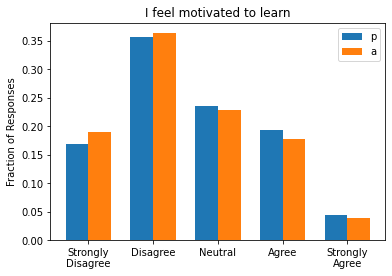

MannwhitneyuResult(statistic=80794.5, pvalue=0.17558936998844976)
p 2.59
a 2.51
Cohen's d = 0.066


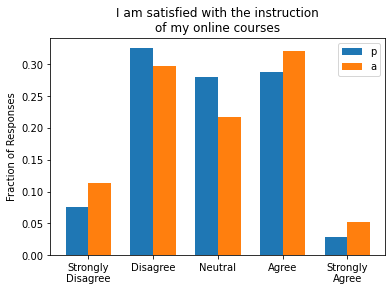

MannwhitneyuResult(statistic=82295.5, pvalue=0.3158941767103056)
p 2.87
a 2.9
Cohen's d = -0.031


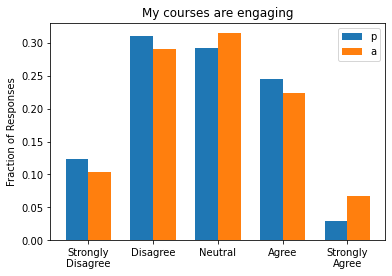

MannwhitneyuResult(statistic=79675.5, pvalue=0.10204912106133734)
p 2.75
a 2.86
Cohen's d = -0.1


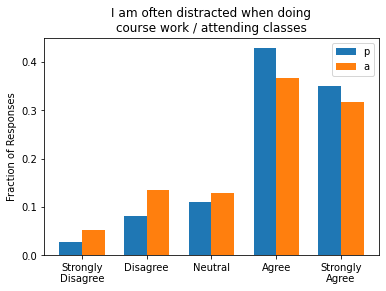

MannwhitneyuResult(statistic=75960.0, pvalue=0.0072673533314344865)
p 3.99
a 3.76
Cohen's d = 0.21


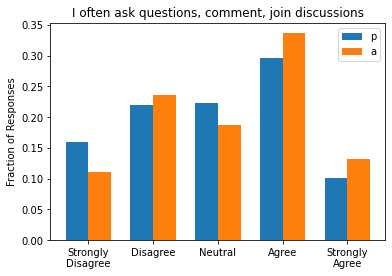

MannwhitneyuResult(statistic=76947.5, pvalue=0.01882924591682938)
p 2.96
a 3.14
Cohen's d = -0.15
----------------------
p (513, 43)
f (161, 43)


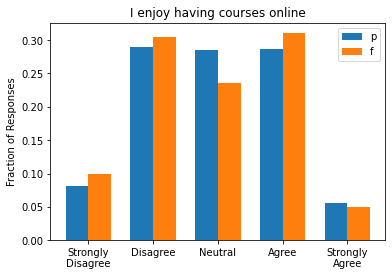

MannwhitneyuResult(statistic=40589.5, pvalue=0.3668686838528957)
p 2.95
f 2.91
Cohen's d = 0.036


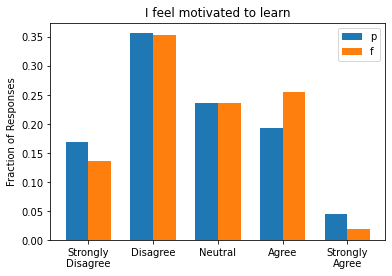

MannwhitneyuResult(statistic=39337.5, pvalue=0.17284384804463543)
p 2.59
f 2.66
Cohen's d = -0.071


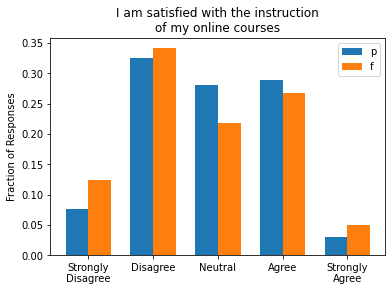

MannwhitneyuResult(statistic=39133.5, pvalue=0.14805301258358616)
p 2.87
f 2.78
Cohen's d = 0.09


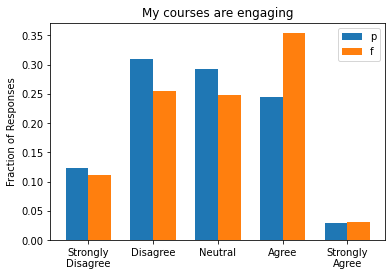

MannwhitneyuResult(statistic=36981.0, pvalue=0.018935825023631944)
p 2.75
f 2.94
Cohen's d = -0.18


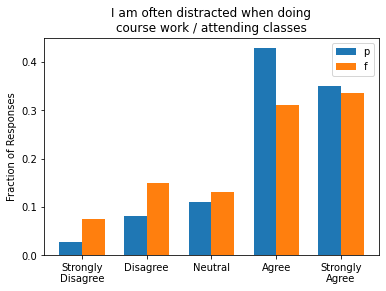

MannwhitneyuResult(statistic=36690.5, pvalue=0.011811136025368558)
p 3.99
f 3.68
Cohen's d = 0.29


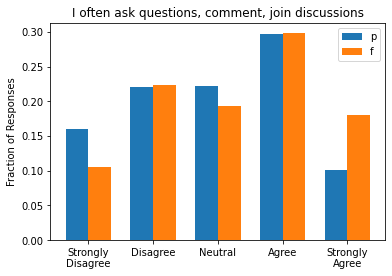

MannwhitneyuResult(statistic=36495.0, pvalue=0.011085503025924107)
p 2.96
f 3.22
Cohen's d = -0.21
----------------------
p (513, 43)
pa (453, 43)


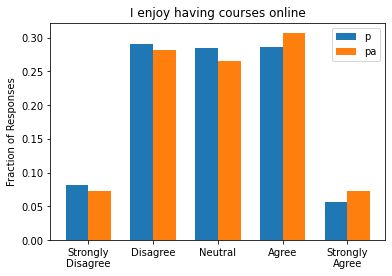

MannwhitneyuResult(statistic=111594.0, pvalue=0.13502633099255723)
p 2.95
pa 3.02
Cohen's d = -0.074


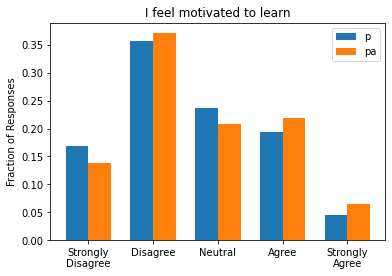

MannwhitneyuResult(statistic=110440.5, pvalue=0.08382587297488903)
p 2.59
pa 2.7
Cohen's d = -0.098


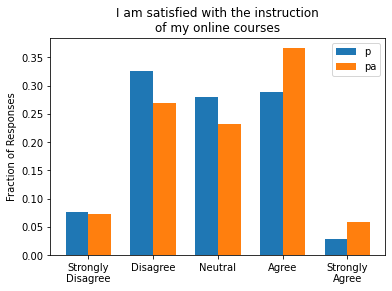

MannwhitneyuResult(statistic=103578.0, pvalue=0.0011931719552358139)
p 2.87
pa 3.07
Cohen's d = -0.19


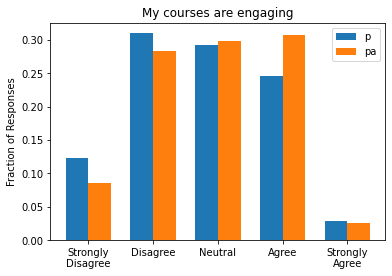

MannwhitneyuResult(statistic=106294.5, pvalue=0.008728452557919639)
p 2.75
pa 2.91
Cohen's d = -0.15


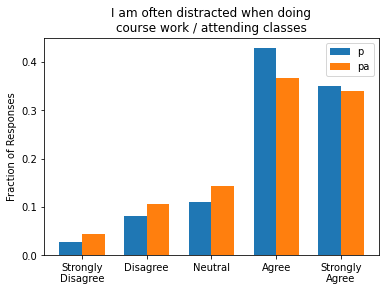

MannwhitneyuResult(statistic=109472.5, pvalue=0.050028740987574524)
p 3.99
pa 3.85
Cohen's d = 0.13


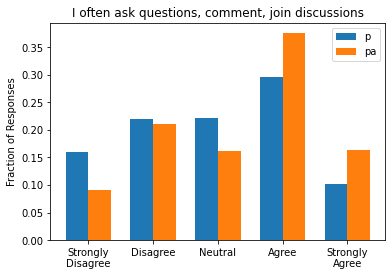

MannwhitneyuResult(statistic=97666.5, pvalue=5.108081016235326e-06)
p 2.96
pa 3.31
Cohen's d = -0.28
----------------------
p (513, 43)
pf (601, 43)


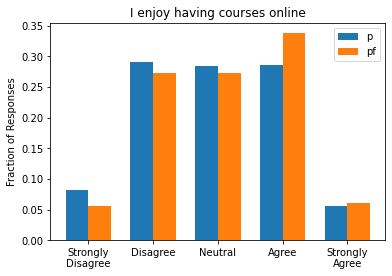

MannwhitneyuResult(statistic=143919.5, pvalue=0.023359739053351057)
p 2.95
pf 3.07
Cohen's d = -0.12


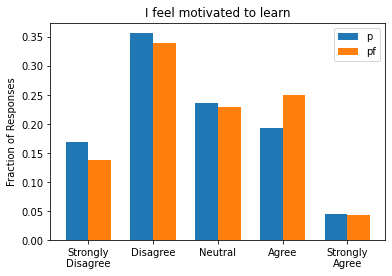

MannwhitneyuResult(statistic=143565.5, pvalue=0.020132838024157093)
p 2.59
pf 2.72
Cohen's d = -0.12


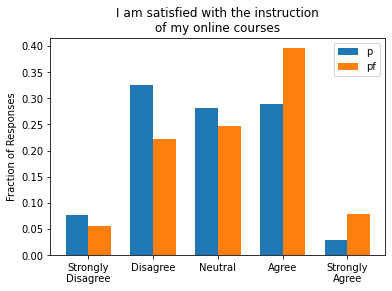

MannwhitneyuResult(statistic=125162.0, pvalue=8.135748538425552e-09)
p 2.87
pf 3.22
Cohen's d = -0.34


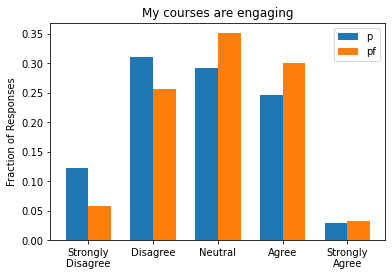

MannwhitneyuResult(statistic=133753.5, pvalue=3.600562166437457e-05)
p 2.75
pf 3.0
Cohen's d = -0.25


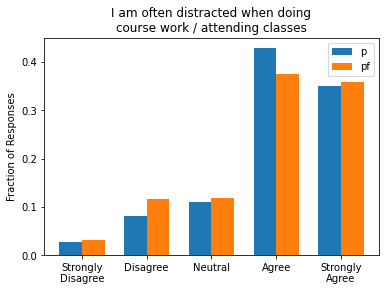

MannwhitneyuResult(statistic=150125.5, pvalue=0.21221341874178423)
p 3.99
pf 3.91
Cohen's d = 0.076


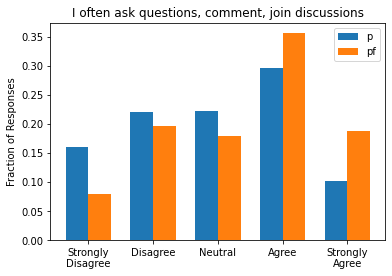

MannwhitneyuResult(statistic=125365.0, pvalue=1.514691657580143e-08)
p 2.96
pf 3.38
Cohen's d = -0.34
----------------------
p (513, 43)
af (268, 43)


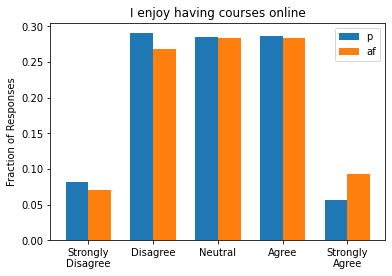

MannwhitneyuResult(statistic=64972.5, pvalue=0.09586073924732597)
p 2.95
af 3.06
Cohen's d = -0.11


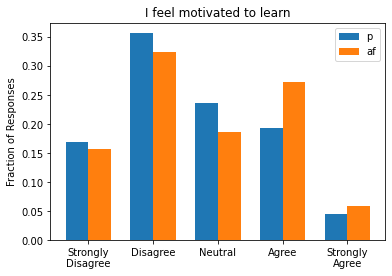

MannwhitneyuResult(statistic=63422.0, pvalue=0.032883368786705766)
p 2.59
af 2.75
Cohen's d = -0.15


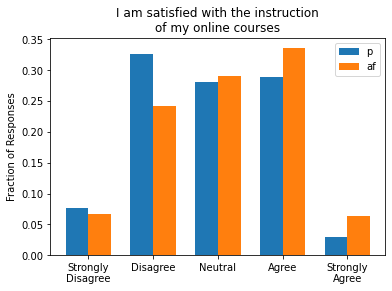

MannwhitneyuResult(statistic=60733.0, pvalue=0.002665477566230435)
p 2.87
af 3.09
Cohen's d = -0.21


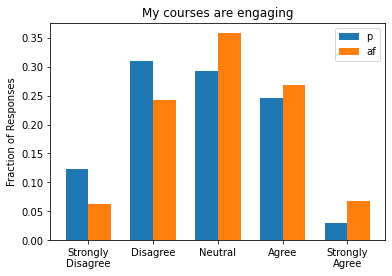

MannwhitneyuResult(statistic=58755.0, pvalue=0.0002661843164012118)
p 2.75
af 3.03
Cohen's d = -0.27


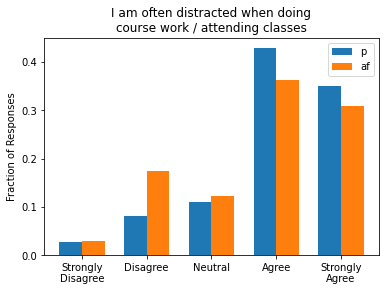

MannwhitneyuResult(statistic=61229.5, pvalue=0.003937401749942069)
p 3.99
af 3.75
Cohen's d = 0.23


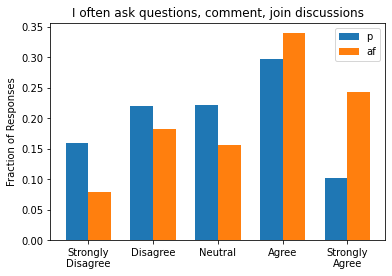

MannwhitneyuResult(statistic=52562.5, pvalue=1.400520305291238e-08)
p 2.96
af 3.49
Cohen's d = -0.42
----------------------
p (513, 43)
paf (1120, 43)


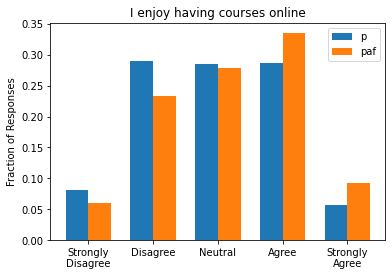

MannwhitneyuResult(statistic=254958.0, pvalue=7.464249090170383e-05)
p 2.95
paf 3.16
Cohen's d = -0.2


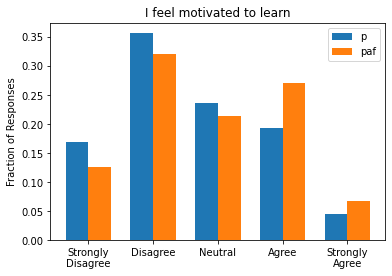

MannwhitneyuResult(statistic=253719.0, pvalue=4.338619660438403e-05)
p 2.59
paf 2.83
Cohen's d = -0.21


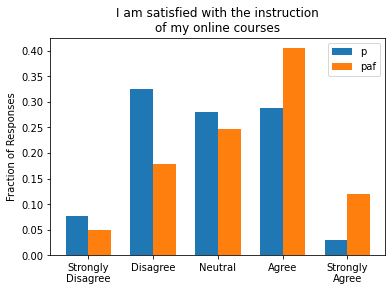

MannwhitneyuResult(statistic=211748.5, pvalue=2.777620441298057e-19)
p 2.87
paf 3.37
Cohen's d = -0.48


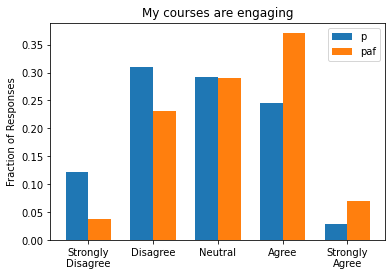

MannwhitneyuResult(statistic=219190.5, pvalue=5.375949681565466e-16)
p 2.75
paf 3.21
Cohen's d = -0.45


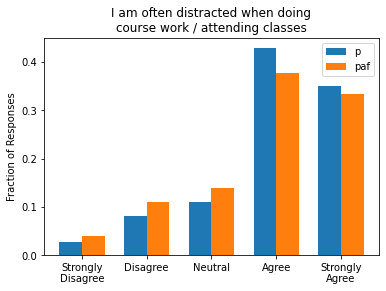

MannwhitneyuResult(statistic=270187.5, pvalue=0.020652635575139966)
p 3.99
paf 3.86
Cohen's d = 0.13


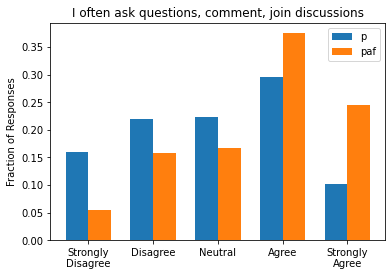

MannwhitneyuResult(statistic=204682.0, pvalue=2.4615185371813387e-22)
p 2.96
paf 3.6
Cohen's d = -0.54
----------------------
a (327, 43)
f (161, 43)


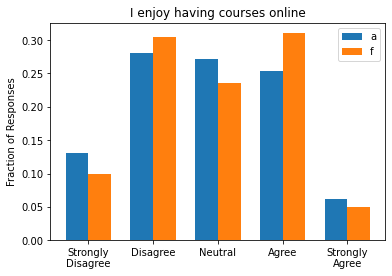

MannwhitneyuResult(statistic=25310.0, pvalue=0.2373545260120713)
a 2.83
f 2.91
Cohen's d = -0.067


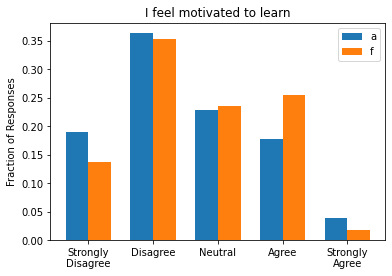

MannwhitneyuResult(statistic=24090.0, pvalue=0.05668069016326175)
a 2.51
f 2.66
Cohen's d = -0.14


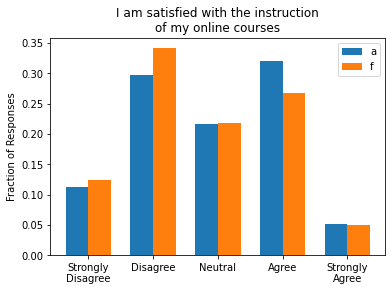

MannwhitneyuResult(statistic=24625.5, pvalue=0.11471754076340784)
a 2.9
f 2.78
Cohen's d = 0.11


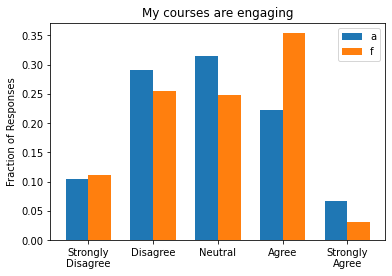

MannwhitneyuResult(statistic=24895.0, pvalue=0.15639488582935468)
a 2.86
f 2.94
Cohen's d = -0.072


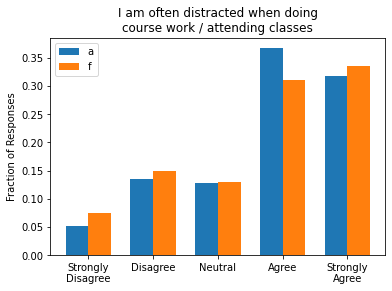

MannwhitneyuResult(statistic=25760.0, pvalue=0.344202760164987)
a 3.76
f 3.68
Cohen's d = 0.067


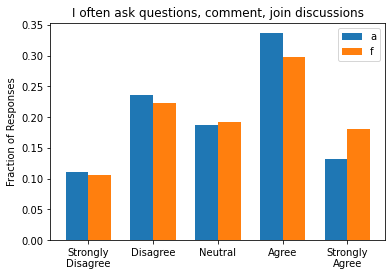

MannwhitneyuResult(statistic=25359.0, pvalue=0.24890246021855478)
a 3.14
f 3.22
Cohen's d = -0.064
----------------------
a (327, 43)
pa (453, 43)


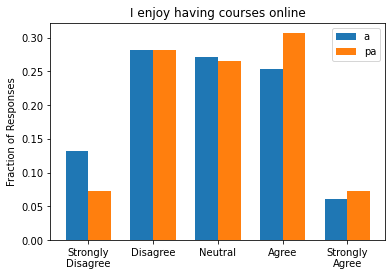

MannwhitneyuResult(statistic=67124.0, pvalue=0.010360179427514125)
a 2.83
pa 3.02
Cohen's d = -0.17


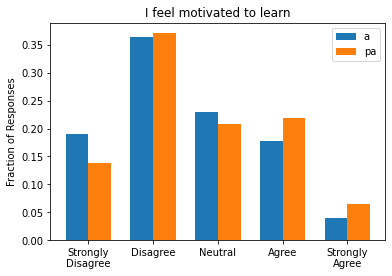

MannwhitneyuResult(statistic=67717.5, pvalue=0.016893890013377058)
a 2.51
pa 2.7
Cohen's d = -0.16


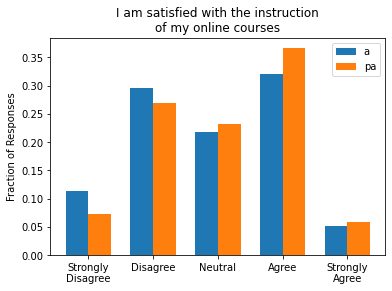

MannwhitneyuResult(statistic=67947.5, pvalue=0.020174185858586692)
a 2.9
pa 3.07
Cohen's d = -0.15


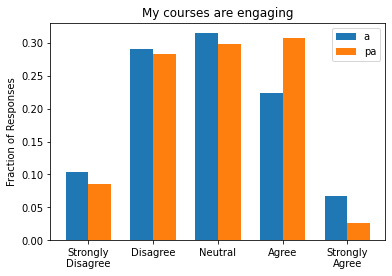

MannwhitneyuResult(statistic=71555.0, pvalue=0.20059539040031804)
a 2.86
pa 2.91
Cohen's d = -0.044


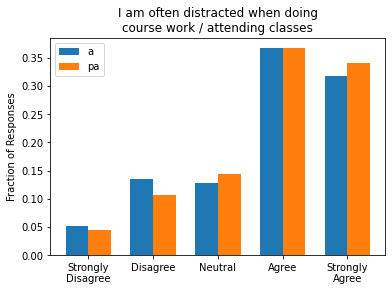

MannwhitneyuResult(statistic=71351.0, pvalue=0.17978303729039297)
a 3.76
pa 3.85
Cohen's d = -0.076


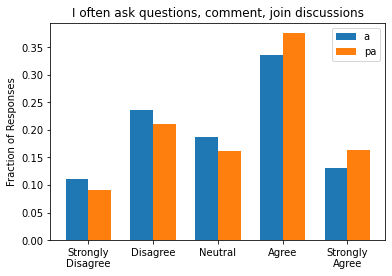

MannwhitneyuResult(statistic=68303.0, pvalue=0.027392484446847595)
a 3.14
pa 3.31
Cohen's d = -0.14
----------------------
a (327, 43)
pf (601, 43)


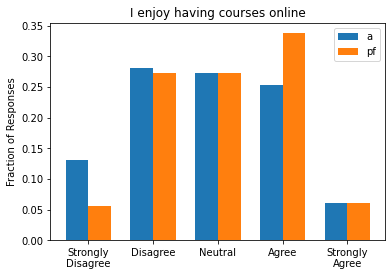

MannwhitneyuResult(statistic=86453.5, pvalue=0.0008397440953143317)
a 2.83
pf 3.07
Cohen's d = -0.22


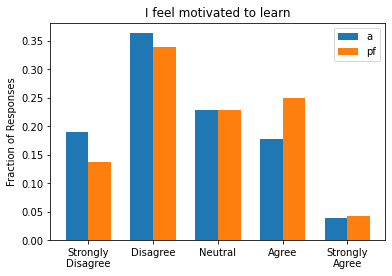

MannwhitneyuResult(statistic=87932.0, pvalue=0.003020213269170859)
a 2.51
pf 2.72
Cohen's d = -0.19


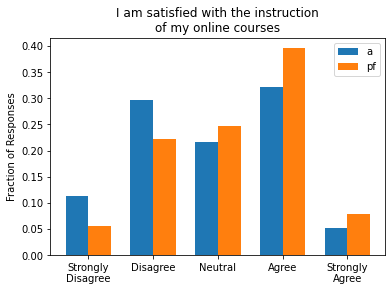

MannwhitneyuResult(statistic=82949.5, pvalue=2.128284808202351e-05)
a 2.9
pf 3.22
Cohen's d = -0.29


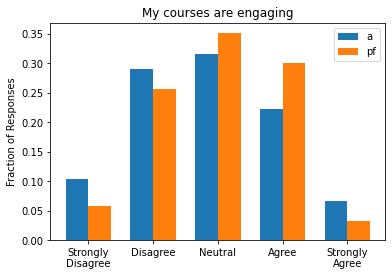

MannwhitneyuResult(statistic=90377.0, pvalue=0.01756948514086354)
a 2.86
pf 3.0
Cohen's d = -0.13


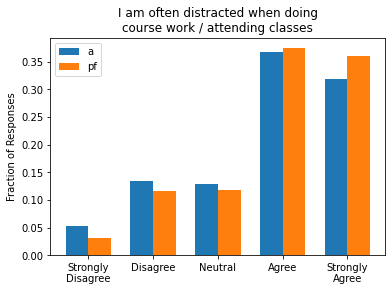

MannwhitneyuResult(statistic=91738.5, pvalue=0.03925673837953318)
a 3.76
pf 3.91
Cohen's d = -0.13


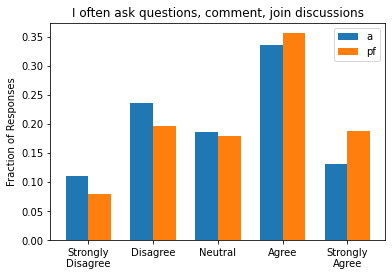

MannwhitneyuResult(statistic=87846.5, pvalue=0.002895703634866948)
a 3.14
pf 3.38
Cohen's d = -0.19
----------------------
a (327, 43)
af (268, 43)


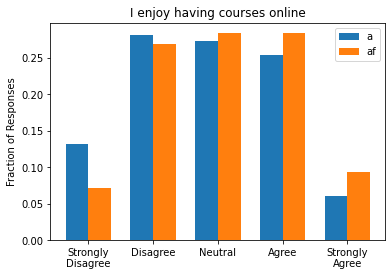

MannwhitneyuResult(statistic=39074.5, pvalue=0.009424859618398902)
a 2.83
af 3.06
Cohen's d = -0.2


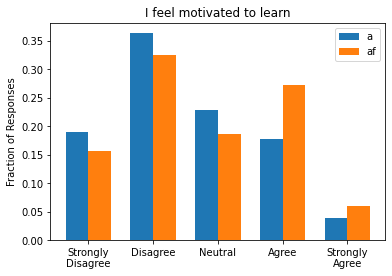

MannwhitneyuResult(statistic=38905.5, pvalue=0.007397431000015924)
a 2.51
af 2.75
Cohen's d = -0.21


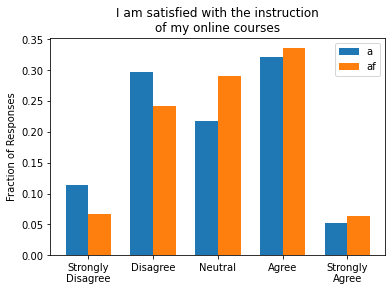

MannwhitneyuResult(statistic=39935.0, pvalue=0.02668769641825373)
a 2.9
af 3.09
Cohen's d = -0.17


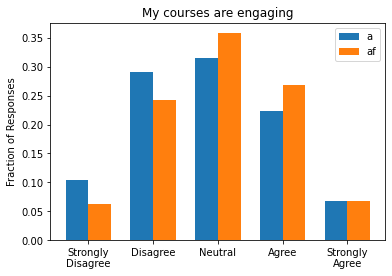

MannwhitneyuResult(statistic=39701.5, pvalue=0.02026645695913069)
a 2.86
af 3.03
Cohen's d = -0.16


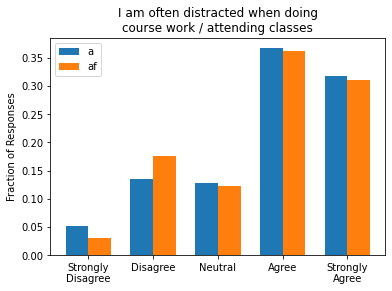

MannwhitneyuResult(statistic=43243.0, pvalue=0.38670840867713335)
a 3.76
af 3.75
Cohen's d = 0.016


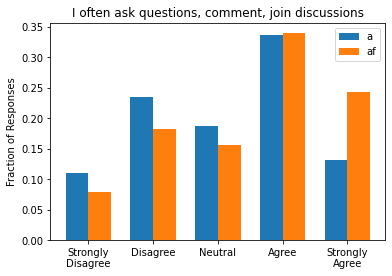

MannwhitneyuResult(statistic=36884.0, pvalue=0.0003040649041722029)
a 3.14
af 3.49
Cohen's d = -0.27
----------------------
a (327, 43)
paf (1120, 43)


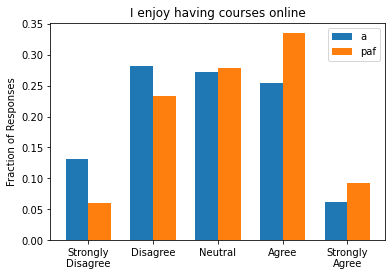

MannwhitneyuResult(statistic=153242.5, pvalue=1.6034742948631114e-06)
a 2.83
paf 3.16
Cohen's d = -0.3


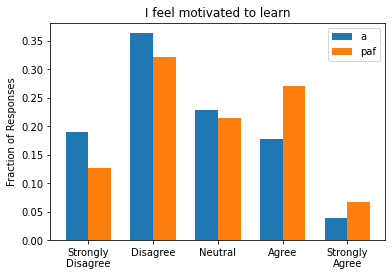

MannwhitneyuResult(statistic=155265.5, pvalue=7.337799542770603e-06)
a 2.51
paf 2.83
Cohen's d = -0.28


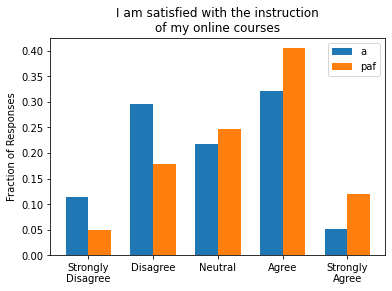

MannwhitneyuResult(statistic=141587.0, pvalue=3.533367138696334e-11)
a 2.9
paf 3.37
Cohen's d = -0.43


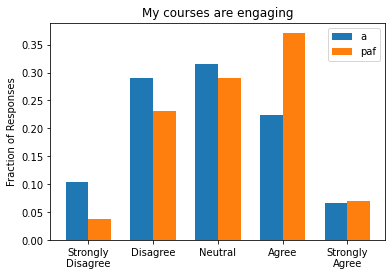

MannwhitneyuResult(statistic=149264.5, pvalue=5.547439137244571e-08)
a 2.86
paf 3.21
Cohen's d = -0.34


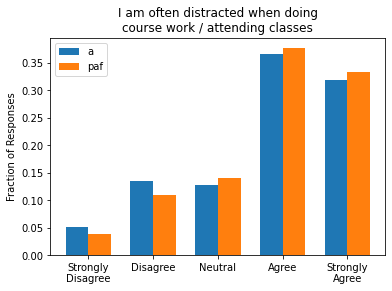

MannwhitneyuResult(statistic=176559.0, pvalue=0.15007201889561828)
a 3.76
paf 3.86
Cohen's d = -0.081


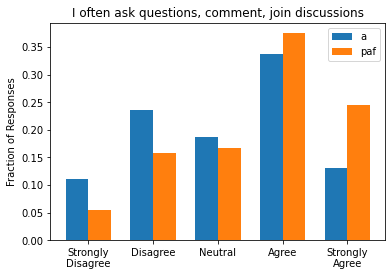

MannwhitneyuResult(statistic=144859.5, pvalue=1.1894738290096375e-09)
a 3.14
paf 3.6
Cohen's d = -0.38
----------------------
f (161, 43)
pa (453, 43)


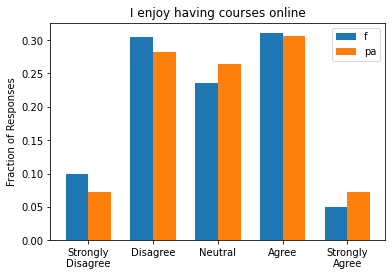

MannwhitneyuResult(statistic=34432.0, pvalue=0.13752516729218361)
f 2.91
pa 3.02
Cohen's d = -0.11


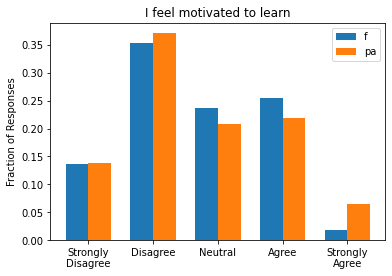

MannwhitneyuResult(statistic=36306.0, pvalue=0.4657365011249769)
f 2.66
pa 2.7
Cohen's d = -0.029


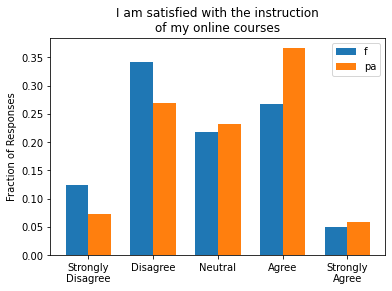

MannwhitneyuResult(statistic=31027.5, pvalue=0.0017138668436753764)
f 2.78
pa 3.07
Cohen's d = -0.27


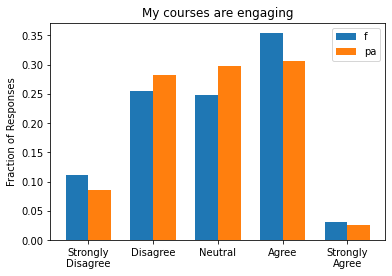

MannwhitneyuResult(statistic=35568.5, pvalue=0.3144449916269722)
f 2.94
pa 2.91
Cohen's d = 0.032


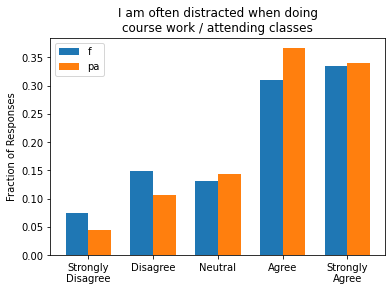

MannwhitneyuResult(statistic=34390.5, pvalue=0.13062111619788092)
f 3.68
pa 3.85
Cohen's d = -0.14


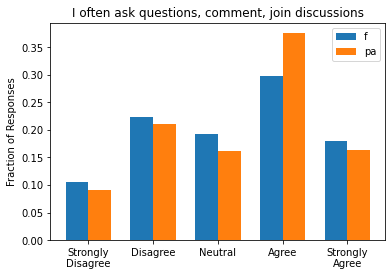

MannwhitneyuResult(statistic=35058.0, pvalue=0.2256898657371108)
f 3.22
pa 3.31
Cohen's d = -0.071
----------------------
f (161, 43)
pf (601, 43)


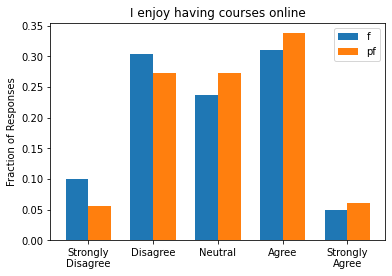

MannwhitneyuResult(statistic=44435.0, pvalue=0.04886391379028055)
f 2.91
pf 3.07
Cohen's d = -0.16


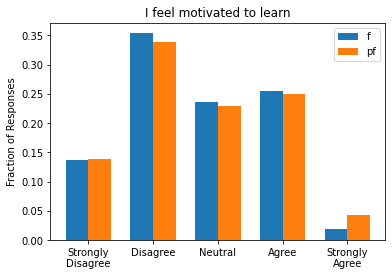

MannwhitneyuResult(statistic=47250.0, pvalue=0.31823478187018195)
f 2.66
pf 2.72
Cohen's d = -0.051


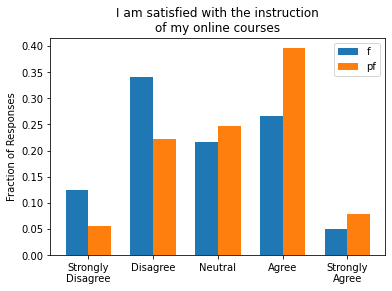

MannwhitneyuResult(statistic=37607.5, pvalue=2.971223458588808e-06)
f 2.78
pf 3.22
Cohen's d = -0.42


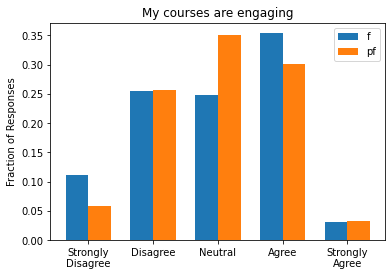

MannwhitneyuResult(statistic=47600.5, pvalue=0.3713655854613238)
f 2.94
pf 3.0
Cohen's d = -0.058


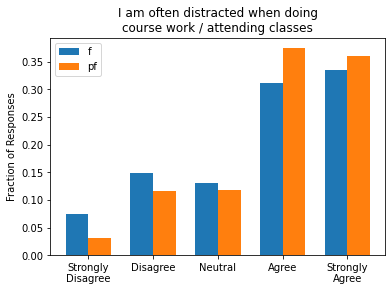

MannwhitneyuResult(statistic=44271.5, pvalue=0.040812020774734954)
f 3.68
pf 3.91
Cohen's d = -0.2


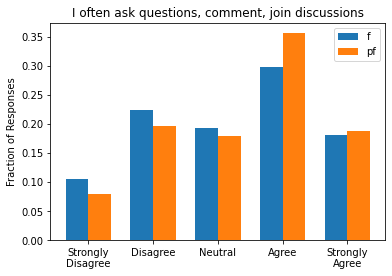

MannwhitneyuResult(statistic=45158.5, pvalue=0.08994985126451549)
f 3.22
pf 3.38
Cohen's d = -0.12
----------------------
f (161, 43)
af (268, 43)


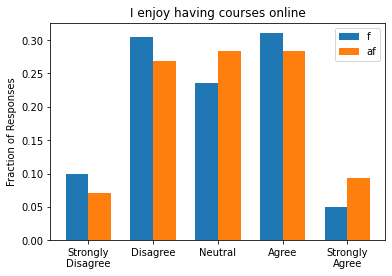

MannwhitneyuResult(statistic=20043.0, pvalue=0.10121581033451932)
f 2.91
af 3.06
Cohen's d = -0.14


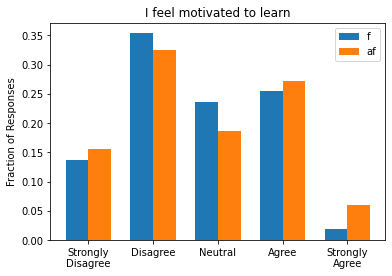

MannwhitneyuResult(statistic=20803.0, pvalue=0.2604127608436444)
f 2.66
af 2.75
Cohen's d = -0.078


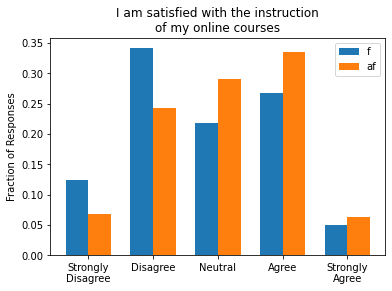

MannwhitneyuResult(statistic=18161.5, pvalue=0.0022087582301693032)
f 2.78
af 3.09
Cohen's d = -0.29


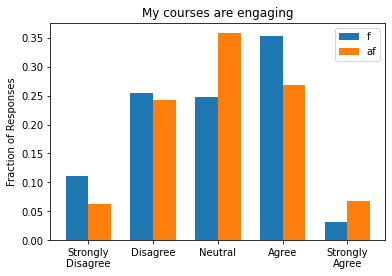

MannwhitneyuResult(statistic=20875.5, pvalue=0.2797426665651672)
f 2.94
af 3.03
Cohen's d = -0.092


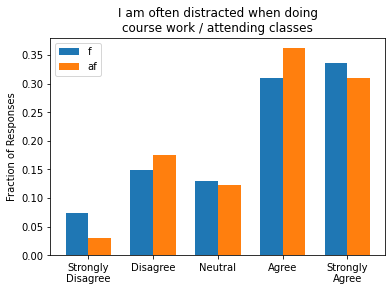

MannwhitneyuResult(statistic=21361.5, pvalue=0.42948012698301974)
f 3.68
af 3.75
Cohen's d = -0.052


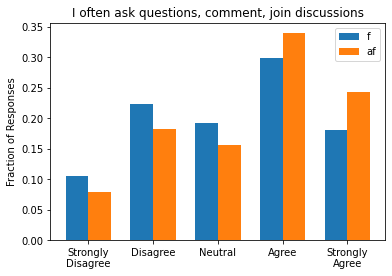

MannwhitneyuResult(statistic=19027.0, pvalue=0.017430058814380645)
f 3.22
af 3.49
Cohen's d = -0.21
----------------------
f (161, 43)
paf (1120, 43)


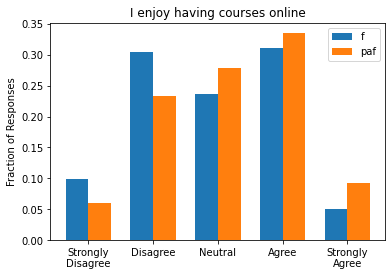

MannwhitneyuResult(statistic=78786.0, pvalue=0.0035706544202196216)
f 2.91
paf 3.16
Cohen's d = -0.24


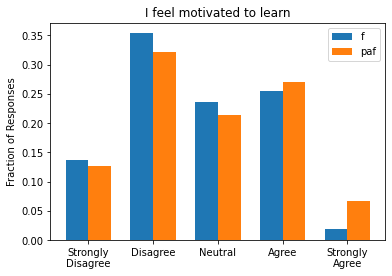

MannwhitneyuResult(statistic=83433.0, pvalue=0.05635663953544022)
f 2.66
paf 2.83
Cohen's d = -0.14


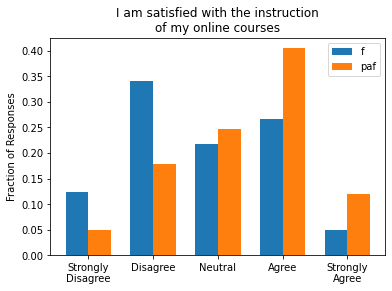

MannwhitneyuResult(statistic=63908.5, pvalue=2.1410060962836767e-10)
f 2.78
paf 3.37
Cohen's d = -0.55


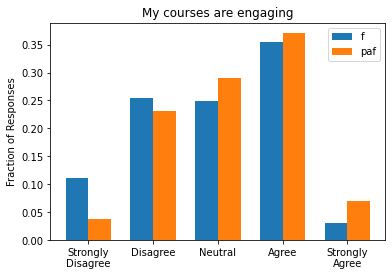

MannwhitneyuResult(statistic=78821.0, pvalue=0.003437919411030982)
f 2.94
paf 3.21
Cohen's d = -0.27


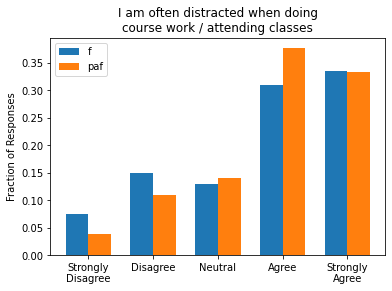

MannwhitneyuResult(statistic=85083.5, pvalue=0.1124866090089941)
f 3.68
paf 3.86
Cohen's d = -0.15


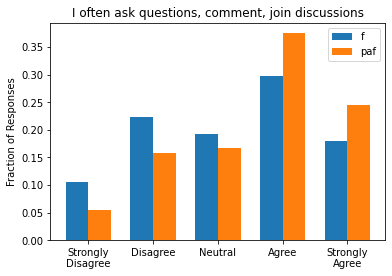

MannwhitneyuResult(statistic=75116.0, pvalue=0.00018704175759598658)
f 3.22
paf 3.6
Cohen's d = -0.32
----------------------
pa (453, 43)
pf (601, 43)


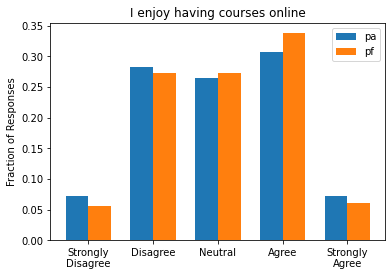

MannwhitneyuResult(statistic=132674.5, pvalue=0.23155551175459999)
pa 3.02
pf 3.07
Cohen's d = -0.045


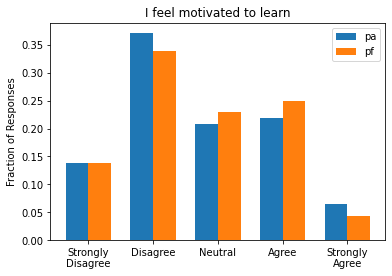

MannwhitneyuResult(statistic=133710.5, pvalue=0.30427724460993477)
pa 2.7
pf 2.72
Cohen's d = -0.02


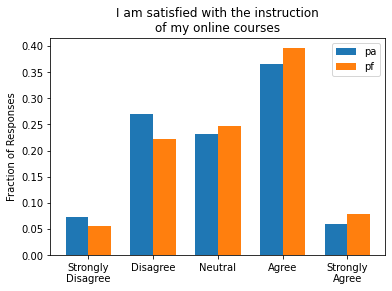

MannwhitneyuResult(statistic=125904.5, pvalue=0.014465627755315806)
pa 3.07
pf 3.22
Cohen's d = -0.14


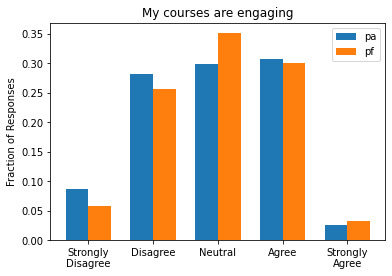

MannwhitneyuResult(statistic=130047.5, pvalue=0.09725239751570519)
pa 2.91
pf 3.0
Cohen's d = -0.091


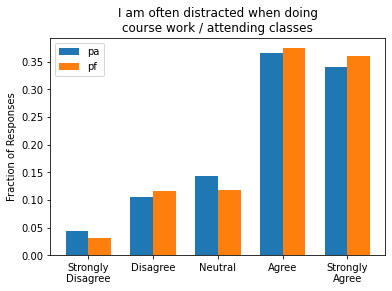

MannwhitneyuResult(statistic=132031.5, pvalue=0.1891157038889827)
pa 3.85
pf 3.91
Cohen's d = -0.055


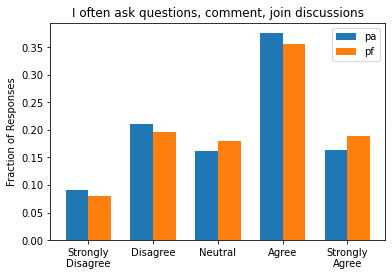

MannwhitneyuResult(statistic=132272.0, pvalue=0.20727186595894764)
pa 3.31
pf 3.38
Cohen's d = -0.053
----------------------
pa (453, 43)
af (268, 43)


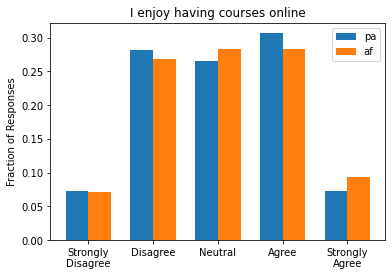

MannwhitneyuResult(statistic=59760.0, pvalue=0.35904744359379337)
pa 3.02
af 3.06
Cohen's d = -0.033


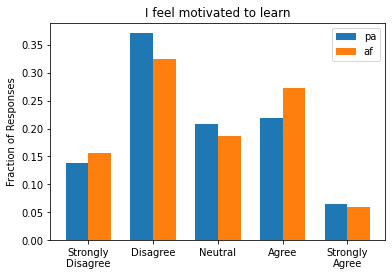

MannwhitneyuResult(statistic=59037.5, pvalue=0.2616939653363126)
pa 2.7
af 2.75
Cohen's d = -0.048


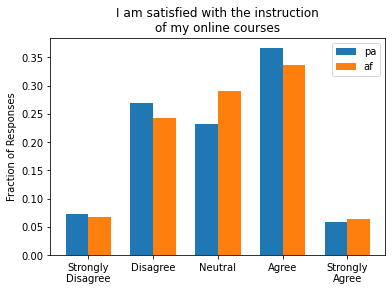

MannwhitneyuResult(statistic=60470.5, pvalue=0.46451401666515246)
pa 3.07
af 3.09
Cohen's d = -0.014


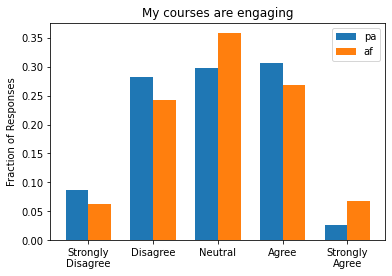

MannwhitneyuResult(statistic=57071.5, pvalue=0.08097827950599679)
pa 2.91
af 3.03
Cohen's d = -0.13


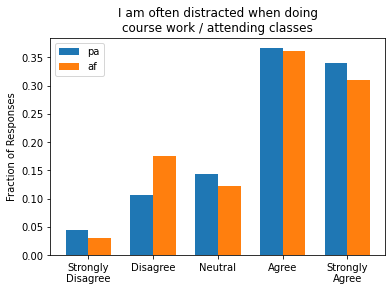

MannwhitneyuResult(statistic=57624.5, pvalue=0.11648225703081727)
pa 3.85
af 3.75
Cohen's d = 0.093


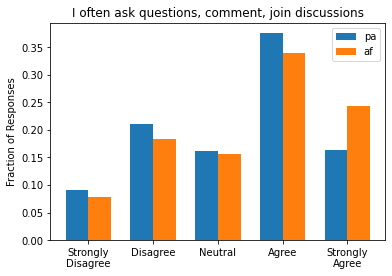

MannwhitneyuResult(statistic=55598.0, pvalue=0.02527911124313562)
pa 3.31
af 3.49
Cohen's d = -0.14
----------------------
pa (453, 43)
paf (1120, 43)


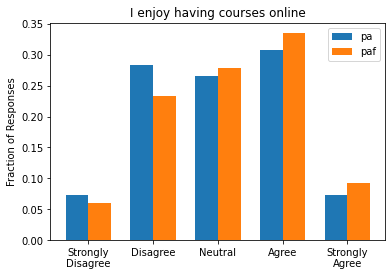

MannwhitneyuResult(statistic=235475.0, pvalue=0.010273429659157783)
pa 3.02
paf 3.16
Cohen's d = -0.13


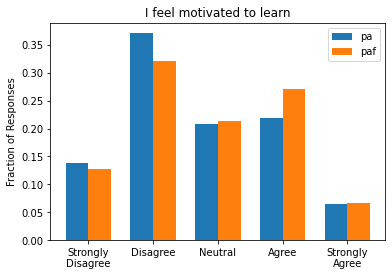

MannwhitneyuResult(statistic=236886.0, pvalue=0.01655452159254446)
pa 2.7
paf 2.83
Cohen's d = -0.11


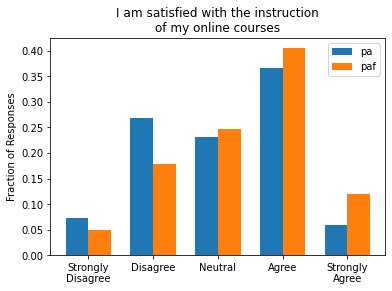

MannwhitneyuResult(statistic=215560.0, pvalue=5.144197446618729e-07)
pa 3.07
paf 3.37
Cohen's d = -0.28


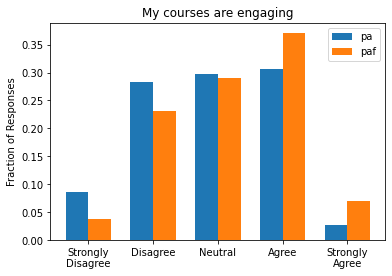

MannwhitneyuResult(statistic=214034.5, pvalue=1.9107009776455506e-07)
pa 2.91
paf 3.21
Cohen's d = -0.3


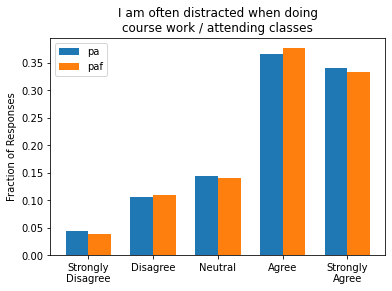

MannwhitneyuResult(statistic=253406.5, pvalue=0.4859750637891632)
pa 3.85
paf 3.86
Cohen's d = -0.0037


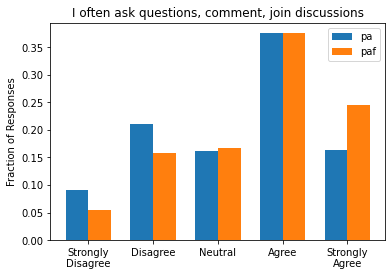

MannwhitneyuResult(statistic=220223.5, pvalue=1.0174122756743274e-05)
pa 3.31
paf 3.6
Cohen's d = -0.24
----------------------
pf (601, 43)
af (268, 43)


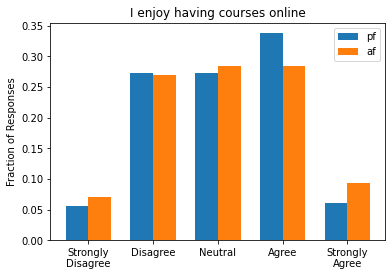

MannwhitneyuResult(statistic=79756.0, pvalue=0.4065078366173471)
pf 3.07
af 3.06
Cohen's d = 0.011


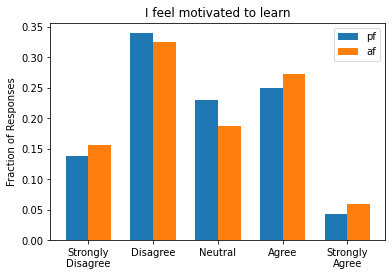

MannwhitneyuResult(statistic=79522.0, pvalue=0.3795917580548267)
pf 2.72
af 2.75
Cohen's d = -0.029


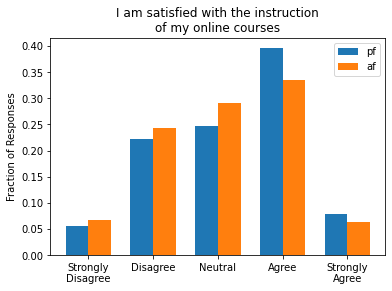

MannwhitneyuResult(statistic=74601.5, pvalue=0.034841614987275595)
pf 3.22
af 3.09
Cohen's d = 0.13


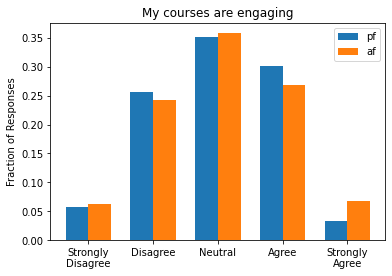

MannwhitneyuResult(statistic=79264.5, pvalue=0.3489211617696897)
pf 3.0
af 3.03
Cohen's d = -0.039


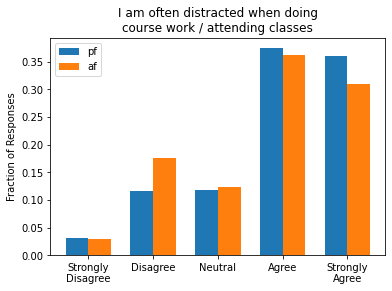

MannwhitneyuResult(statistic=74074.0, pvalue=0.02341220304111876)
pf 3.91
af 3.75
Cohen's d = 0.15


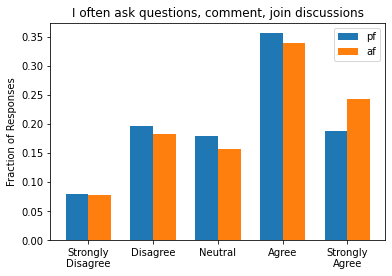

MannwhitneyuResult(statistic=76017.5, pvalue=0.08590840160050034)
pf 3.38
af 3.49
Cohen's d = -0.089
----------------------
pf (601, 43)
paf (1120, 43)


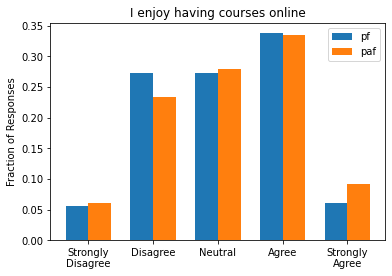

MannwhitneyuResult(statistic=320350.5, pvalue=0.04319598290453905)
pf 3.07
paf 3.16
Cohen's d = -0.087


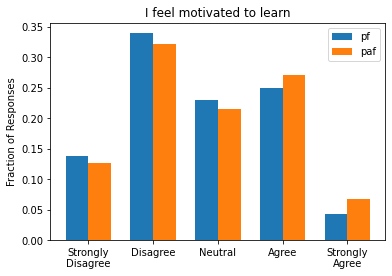

MannwhitneyuResult(statistic=319587.0, pvalue=0.03694087608196151)
pf 2.72
paf 2.83
Cohen's d = -0.095


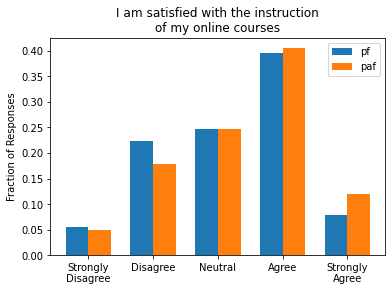

MannwhitneyuResult(statistic=310442.0, pvalue=0.002685762072158542)
pf 3.22
paf 3.37
Cohen's d = -0.14


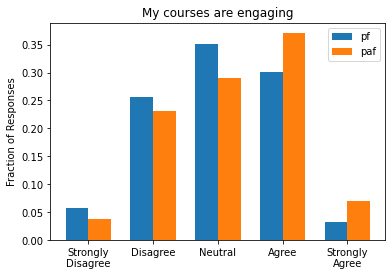

MannwhitneyuResult(statistic=297235.5, pvalue=1.4260682284906372e-05)
pf 3.0
paf 3.21
Cohen's d = -0.21


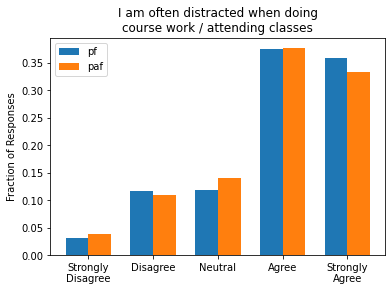

MannwhitneyuResult(statistic=325983.5, pvalue=0.12870252636857604)
pf 3.91
paf 3.86
Cohen's d = 0.051


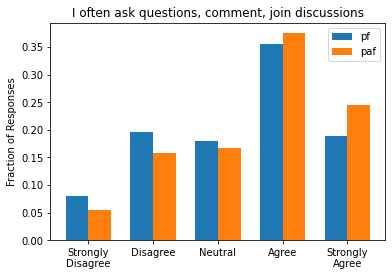

MannwhitneyuResult(statistic=301706.5, pvalue=0.00011624968415143274)
pf 3.38
paf 3.6
Cohen's d = -0.19
----------------------
af (268, 43)
paf (1120, 43)


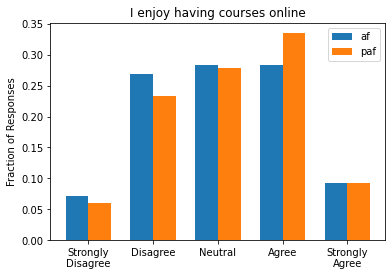

MannwhitneyuResult(statistic=141664.5, pvalue=0.06926662824415307)
af 3.06
paf 3.16
Cohen's d = -0.096


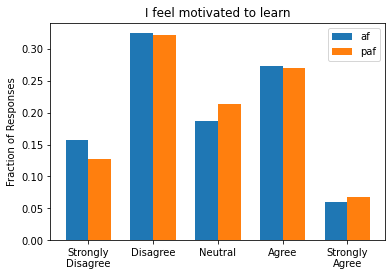

MannwhitneyuResult(statistic=144641.5, pvalue=0.17001362353674143)
af 2.75
paf 2.83
Cohen's d = -0.065


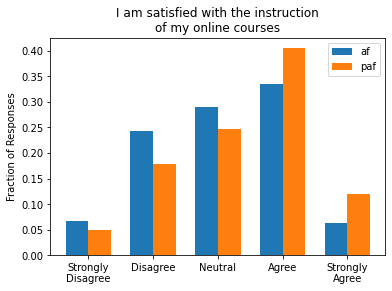

MannwhitneyuResult(statistic=127474.0, pvalue=3.0359451877707563e-05)
af 3.09
paf 3.37
Cohen's d = -0.27


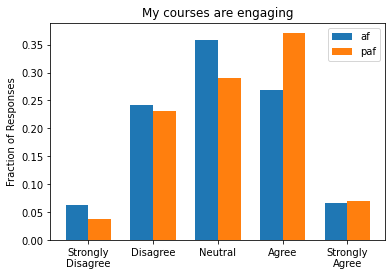

MannwhitneyuResult(statistic=135381.0, pvalue=0.004581192437985028)
af 3.03
paf 3.21
Cohen's d = -0.17


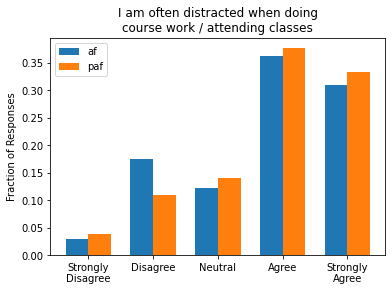

MannwhitneyuResult(statistic=142570.0, pvalue=0.09056011587715951)
af 3.75
paf 3.86
Cohen's d = -0.098


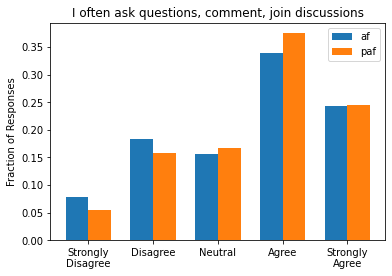

MannwhitneyuResult(statistic=143491.0, pvalue=0.12275506364367456)
af 3.49
paf 3.6
Cohen's d = -0.097


In [533]:
for i in range(len(hscats)-1):
    for j in range(i+1, len(hscats)):
        print('----------------------')
        print(hscats[i].name, hscats[i].shape)
        print(hscats[j].name, hscats[j].shape)
        remote_comparison(hscats[i], hscats[j])

In [534]:
ug['techniques_outside'].unique

<bound method Series.unique of 0       Posted readings/study material, Live office hours
1                                  Discussion/Chat Forums
2       Discussion/Chat Forums, Assignments/un-proctor...
3                                  Discussion/Chat Forums
4       Video lectures, Posted readings/study material...
                              ...                        
4786                       Assignments/un-proctored exams
4787    Discussion/Chat Forums, Posted readings/study ...
4788       Video lectures, Posted readings/study material
4789                       Assignments/un-proctored exams
4790    Video lectures, Posted readings/study material...
Name: techniques_outside, Length: 4791, dtype: object>

Discussion/Chat Forums
Video lectures
Video content
Posted readings/study material
Assignments/un-proctored exams
Live office hours
Email Q&A with instructors

## Techniques used outside of class

In [535]:
ugcat1_o = ug[(ug['outside_passive']==True) & (ug['outside_interactive']==False) & (ug['outside_assignments']==False)]
ugcat2_o = ug[(ug['outside_passive']==False) & (ug['outside_interactive']==True) & (ug['outside_assignments']==False)]
ugcat3_o = ug[(ug['outside_passive']==False) & (ug['outside_interactive']==False) & (ug['outside_assignments']==True)]
ugcat4_o = ug[(ug['outside_passive']==True) & (ug['outside_interactive']==True) & (ug['outside_assignments']==False)]
ugcat5_o = ug[(ug['outside_passive']==True) & (ug['outside_interactive']==False) & (ug['outside_assignments']==True)]
ugcat6_o = ug[(ug['outside_passive']==False) & (ug['outside_interactive']==True) & (ug['outside_assignments']==True)]
ugcat7_o = ug[(ug['outside_passive']==True) & (ug['outside_interactive']==True) & (ug['outside_assignments']==True)]
ugcats_o = [ugcat1_o, ugcat2_o, ugcat3_o, ugcat4_o, ugcat5_o, ugcat6_o, ugcat7_o]

In [536]:
names_o = ['o_p','o_i','o_a','o_pi','o_pa','o_ia','o_pia']
for i in range(len(ugcats_o)):
    subset_ls.append(ugcats_o[i])
    subset_name.append(names_o[i])
    ugcats_o[i].name = names_o[i]

----------------------
o_p (583, 43)
o_i (569, 43)


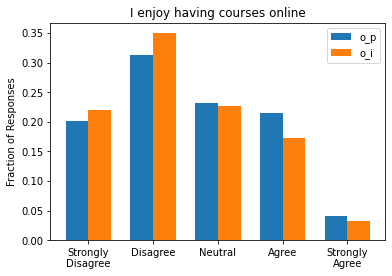

MannwhitneyuResult(statistic=154918.0, pvalue=0.022498640593390982)
o_p 2.58
o_i 2.45
Cohen's d = 0.12


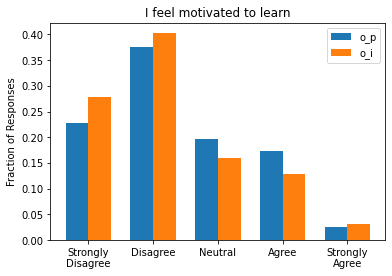

MannwhitneyuResult(statistic=151440.5, pvalue=0.0037998459003621005)
o_p 2.39
o_i 2.23
Cohen's d = 0.15


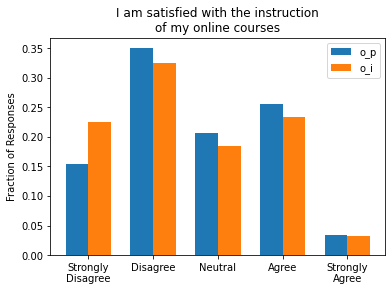

MannwhitneyuResult(statistic=153734.5, pvalue=0.013053902171779989)
o_p 2.67
o_i 2.52
Cohen's d = 0.13


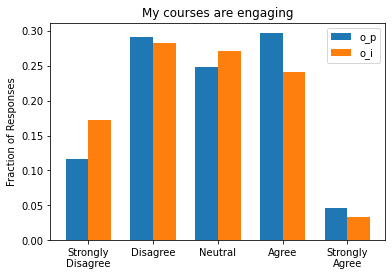

MannwhitneyuResult(statistic=150924.0, pvalue=0.003121817909125456)
o_p 2.86
o_i 2.68
Cohen's d = 0.17


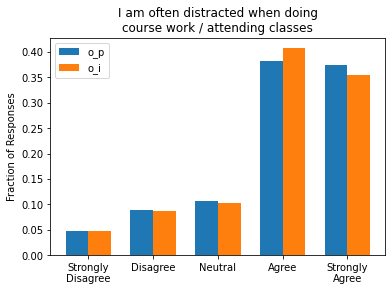

MannwhitneyuResult(statistic=164076.0, pvalue=0.36847450014840155)
o_p 3.95
o_i 3.93
Cohen's d = 0.0091


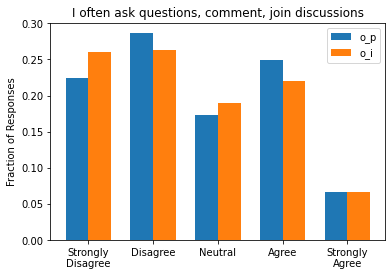

MannwhitneyuResult(statistic=159857.5, pvalue=0.13702473368595636)
o_p 2.65
o_i 2.57
Cohen's d = 0.061
----------------------
o_p (583, 43)
o_a (166, 43)


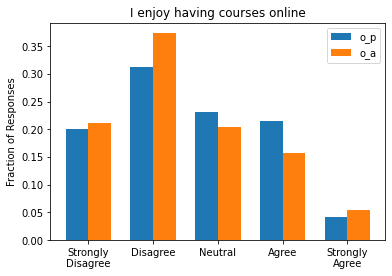

MannwhitneyuResult(statistic=45452.5, pvalue=0.10877513847056924)
o_p 2.58
o_a 2.47
Cohen's d = 0.099


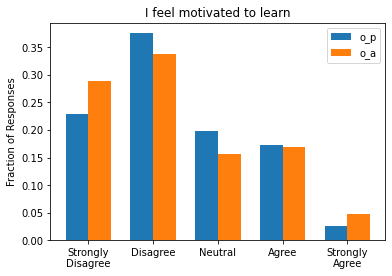

MannwhitneyuResult(statistic=46513.0, pvalue=0.21386668272175235)
o_p 2.39
o_a 2.35
Cohen's d = 0.039


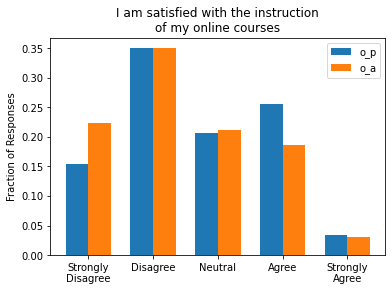

MannwhitneyuResult(statistic=43199.5, pvalue=0.014321501285570045)
o_p 2.67
o_a 2.45
Cohen's d = 0.19


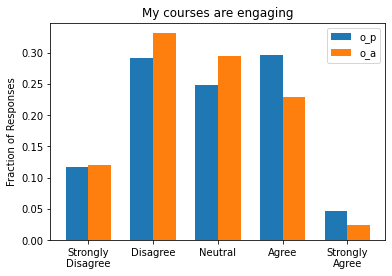

MannwhitneyuResult(statistic=44428.5, pvalue=0.04762475171089435)
o_p 2.86
o_a 2.7
Cohen's d = 0.15


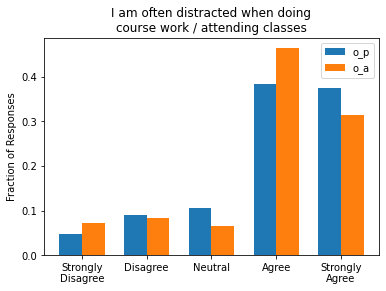

MannwhitneyuResult(statistic=46312.5, pvalue=0.18507400551427822)
o_p 3.95
o_a 3.86
Cohen's d = 0.074


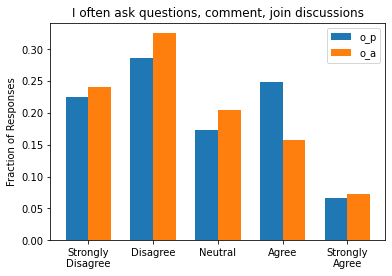

MannwhitneyuResult(statistic=45073.0, pvalue=0.08268221632172901)
o_p 2.65
o_a 2.49
Cohen's d = 0.12
----------------------
o_p (583, 43)
o_pi (891, 43)


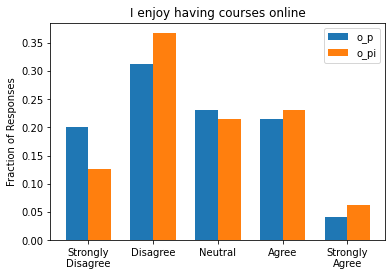

MannwhitneyuResult(statistic=241125.0, pvalue=0.007972694486698803)
o_p 2.58
o_pi 2.74
Cohen's d = -0.14


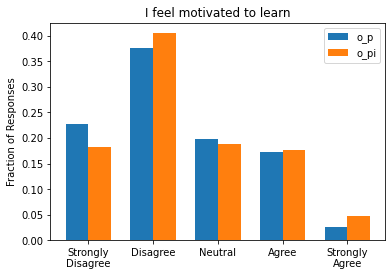

MannwhitneyuResult(statistic=246690.5, pvalue=0.044363814918848825)
o_p 2.39
o_pi 2.5
Cohen's d = -0.098


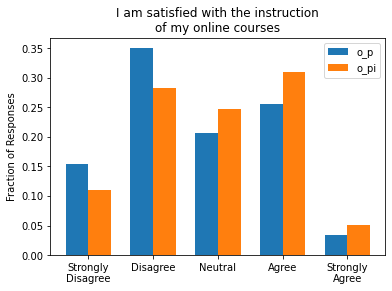

MannwhitneyuResult(statistic=227787.0, pvalue=1.7370572775255575e-05)
o_p 2.67
o_pi 2.91
Cohen's d = -0.22


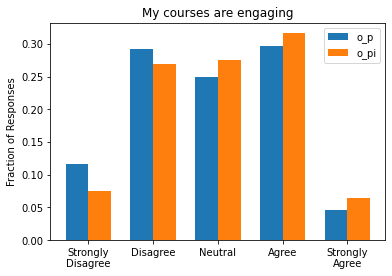

MannwhitneyuResult(statistic=239522.0, pvalue=0.004364556459567425)
o_p 2.86
o_pi 3.02
Cohen's d = -0.15


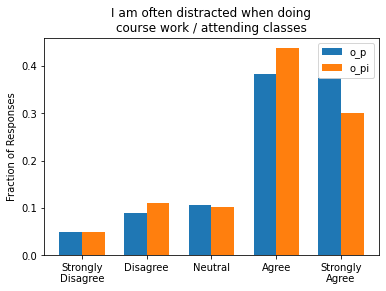

MannwhitneyuResult(statistic=241849.0, pvalue=0.008856424920137981)
o_p 3.95
o_pi 3.83
Cohen's d = 0.1


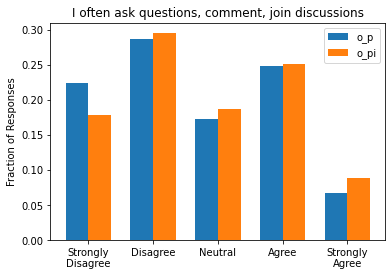

MannwhitneyuResult(statistic=244641.5, pvalue=0.0260977051160594)
o_p 2.65
o_pi 2.78
Cohen's d = -0.1
----------------------
o_p (583, 43)
o_pa (638, 43)


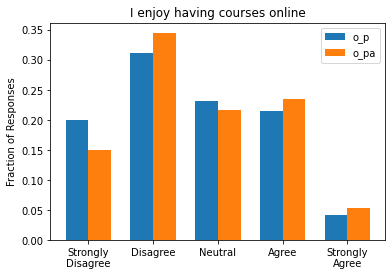

MannwhitneyuResult(statistic=176112.0, pvalue=0.048814936667332796)
o_p 2.58
o_pa 2.7
Cohen's d = -0.098


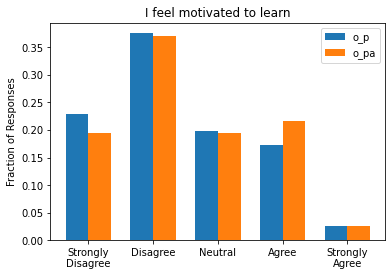

MannwhitneyuResult(statistic=175077.0, pvalue=0.03270285996232984)
o_p 2.39
o_pa 2.51
Cohen's d = -0.1


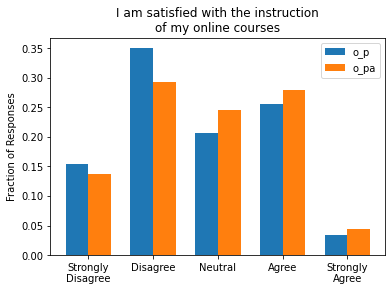

MannwhitneyuResult(statistic=173515.0, pvalue=0.018036594038581592)
o_p 2.67
o_pa 2.8
Cohen's d = -0.12


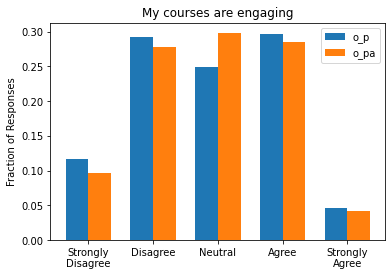

MannwhitneyuResult(statistic=182944.5, pvalue=0.30477641039073844)
o_p 2.86
o_pa 2.9
Cohen's d = -0.031


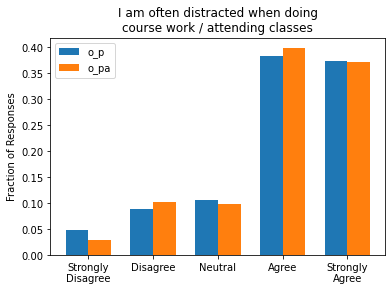

MannwhitneyuResult(statistic=184458.0, pvalue=0.39664796909657457)
o_p 3.95
o_pa 3.98
Cohen's d = -0.031


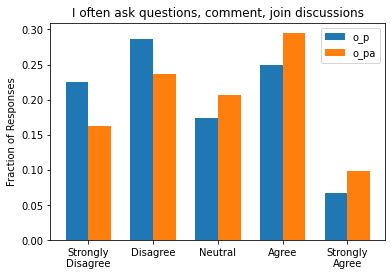

MannwhitneyuResult(statistic=162608.0, pvalue=4.789562698408798e-05)
o_p 2.65
o_pa 2.93
Cohen's d = -0.23
----------------------
o_p (583, 43)
o_ia (191, 43)


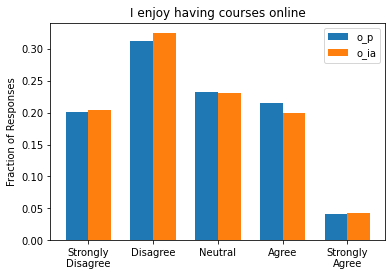

MannwhitneyuResult(statistic=54738.5, pvalue=0.3591155138174409)
o_p 2.58
o_ia 2.55
Cohen's d = 0.029


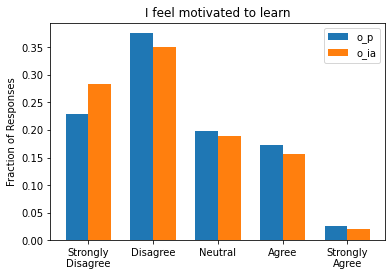

MannwhitneyuResult(statistic=52407.5, pvalue=0.10230524579055805)
o_p 2.39
o_ia 2.28
Cohen's d = 0.1


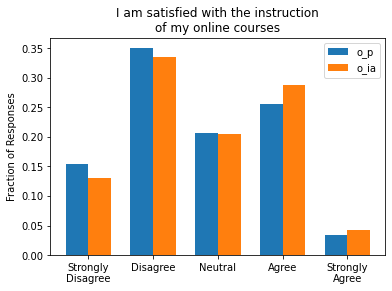

MannwhitneyuResult(statistic=52682.5, pvalue=0.12330002882533608)
o_p 2.67
o_ia 2.77
Cohen's d = -0.098


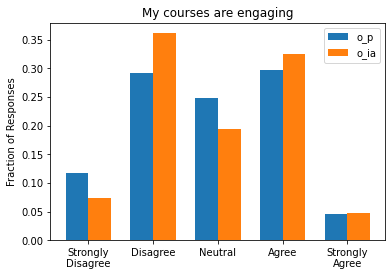

MannwhitneyuResult(statistic=54597.0, pvalue=0.3381161541061754)
o_p 2.86
o_ia 2.91
Cohen's d = -0.042


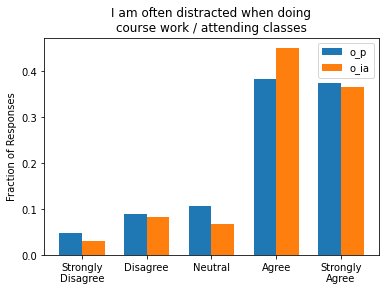

MannwhitneyuResult(statistic=53981.0, pvalue=0.2506125381109294)
o_p 3.95
o_ia 4.04
Cohen's d = -0.083


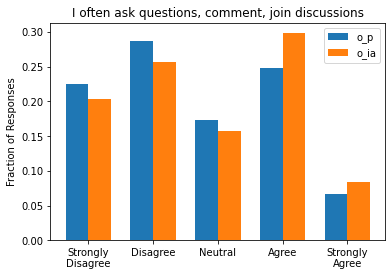

MannwhitneyuResult(statistic=51941.5, pvalue=0.07596162376206161)
o_p 2.65
o_ia 2.8
Cohen's d = -0.12
----------------------
o_p (583, 43)
o_pia (1685, 43)


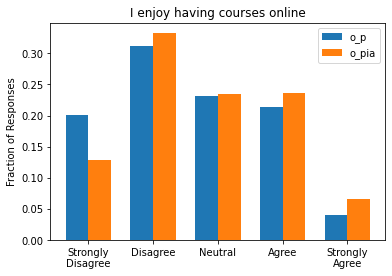

MannwhitneyuResult(statistic=445932.5, pvalue=0.00030104288048253287)
o_p 2.58
o_pia 2.78
Cohen's d = -0.17


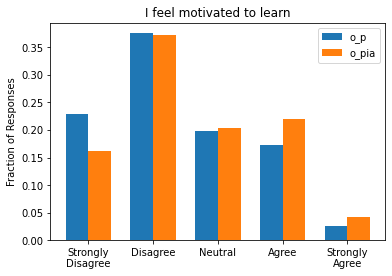

MannwhitneyuResult(statistic=438831.5, pvalue=3.2520052484952176e-05)
o_p 2.39
o_pia 2.61
Cohen's d = -0.19


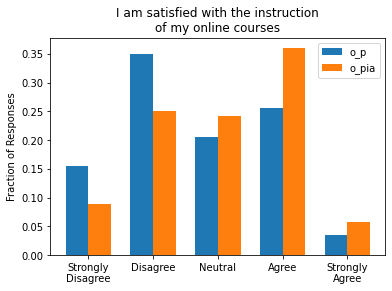

MannwhitneyuResult(statistic=397328.5, pvalue=4.38677518486123e-13)
o_p 2.67
o_pia 3.05
Cohen's d = -0.35


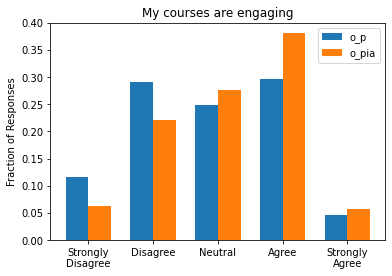

MannwhitneyuResult(statistic=420434.5, pvalue=3.099612294284515e-08)
o_p 2.86
o_pia 3.15
Cohen's d = -0.27


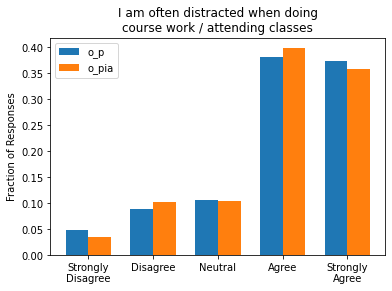

MannwhitneyuResult(statistic=486866.0, pvalue=0.3686006801464279)
o_p 3.95
o_pia 3.94
Cohen's d = 0.00028


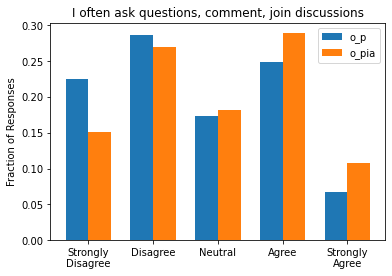

MannwhitneyuResult(statistic=429102.5, pvalue=1.4175123615329589e-06)
o_p 2.65
o_pia 2.93
Cohen's d = -0.23
----------------------
o_i (569, 43)
o_a (166, 43)


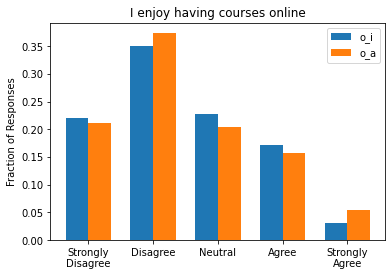

MannwhitneyuResult(statistic=47046.5, pvalue=0.4690795643083799)
o_i 2.45
o_a 2.47
Cohen's d = -0.021


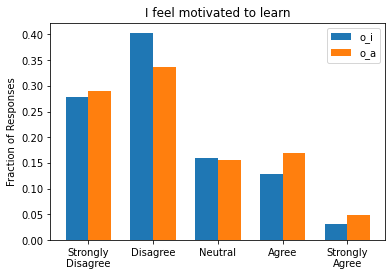

MannwhitneyuResult(statistic=45271.0, pvalue=0.1975852309960554)
o_i 2.23
o_a 2.35
Cohen's d = -0.1


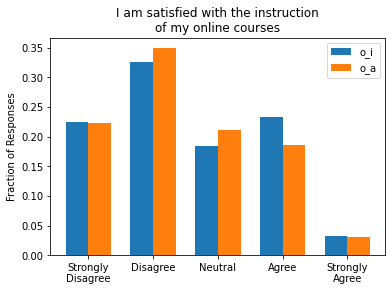

MannwhitneyuResult(statistic=45769.0, pvalue=0.26552228060710426)
o_i 2.52
o_a 2.45
Cohen's d = 0.061


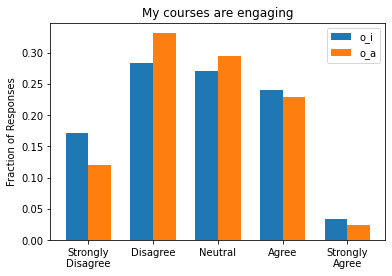

MannwhitneyuResult(statistic=46657.5, pvalue=0.403473404289169)
o_i 2.68
o_a 2.7
Cohen's d = -0.022


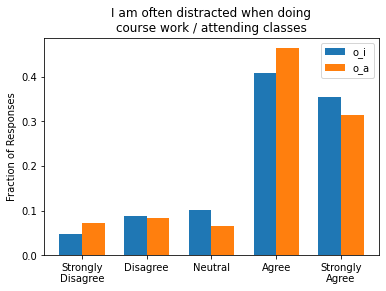

MannwhitneyuResult(statistic=45719.0, pvalue=0.25251146253075957)
o_i 3.93
o_a 3.86
Cohen's d = 0.065


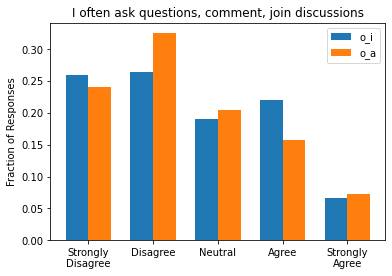

MannwhitneyuResult(statistic=45751.0, pvalue=0.2642210604320643)
o_i 2.57
o_a 2.49
Cohen's d = 0.06
----------------------
o_i (569, 43)
o_pi (891, 43)


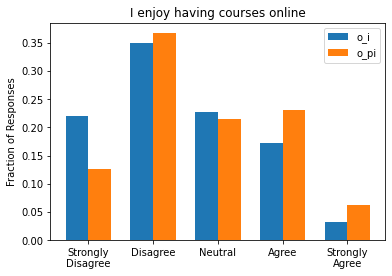

MannwhitneyuResult(statistic=218094.0, pvalue=1.4822851635861915e-06)
o_i 2.45
o_pi 2.74
Cohen's d = -0.26


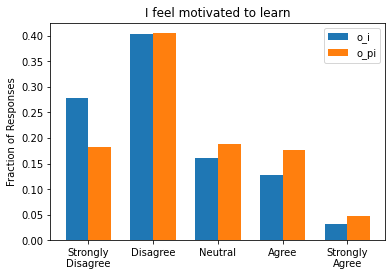

MannwhitneyuResult(statistic=218645.5, pvalue=1.7483559216082382e-06)
o_i 2.23
o_pi 2.5
Cohen's d = -0.24


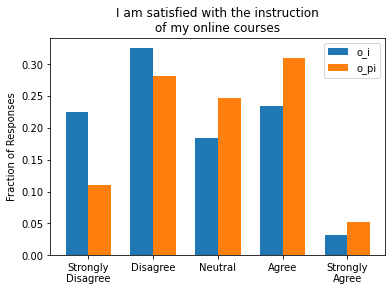

MannwhitneyuResult(statistic=205469.5, pvalue=1.3448690048129218e-10)
o_i 2.52
o_pi 2.91
Cohen's d = -0.34


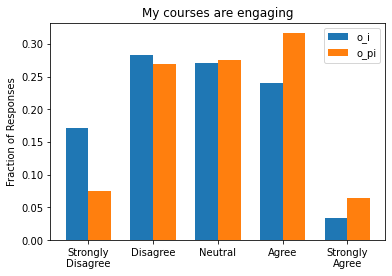

MannwhitneyuResult(statistic=210861.5, pvalue=9.814357993246945e-09)
o_i 2.68
o_pi 3.02
Cohen's d = -0.32


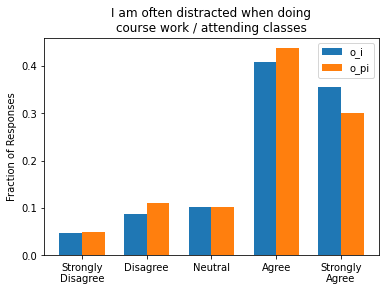

MannwhitneyuResult(statistic=238596.0, pvalue=0.02207596533071247)
o_i 3.93
o_pi 3.83
Cohen's d = 0.094


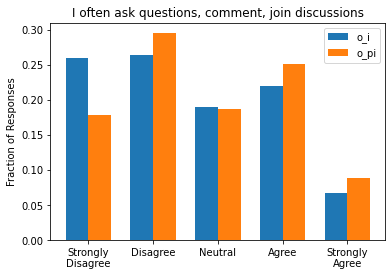

MannwhitneyuResult(statistic=229738.0, pvalue=0.0009479347005057959)
o_i 2.57
o_pi 2.78
Cohen's d = -0.16
----------------------
o_i (569, 43)
o_pa (638, 43)


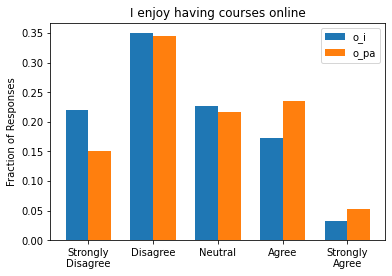

MannwhitneyuResult(statistic=159679.0, pvalue=9.204223738259421e-05)
o_i 2.45
o_pa 2.7
Cohen's d = -0.22


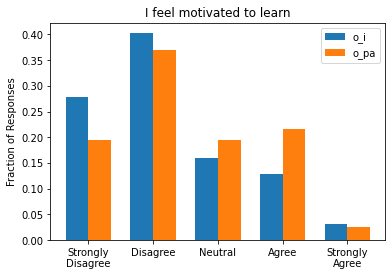

MannwhitneyuResult(statistic=155325.0, pvalue=3.115906763411841e-06)
o_i 2.23
o_pa 2.51
Cohen's d = -0.25


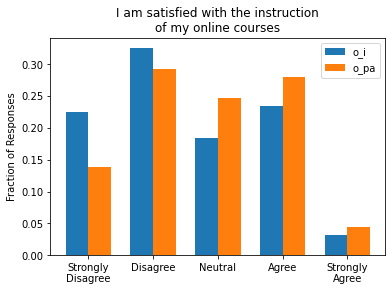

MannwhitneyuResult(statistic=156852.0, pvalue=1.2623843639293623e-05)
o_i 2.52
o_pa 2.8
Cohen's d = -0.24


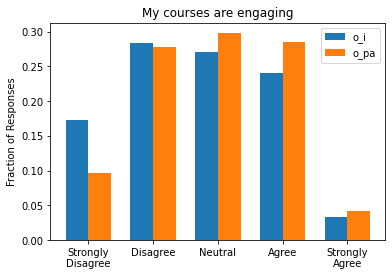

MannwhitneyuResult(statistic=161810.0, pvalue=0.00037315990634488204)
o_i 2.68
o_pa 2.9
Cohen's d = -0.2


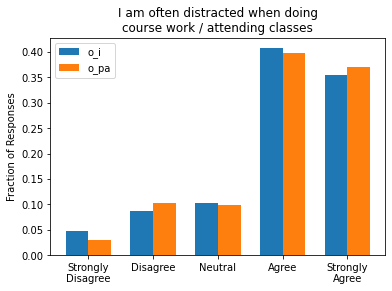

MannwhitneyuResult(statistic=178037.5, pvalue=0.2706641936818658)
o_i 3.93
o_pa 3.98
Cohen's d = -0.041


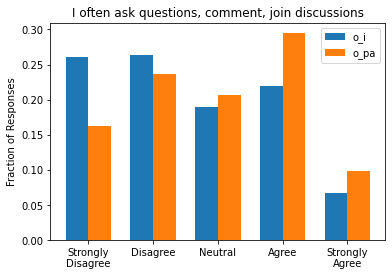

MannwhitneyuResult(statistic=152461.0, pvalue=4.0796266725572596e-07)
o_i 2.57
o_pa 2.93
Cohen's d = -0.29
----------------------
o_i (569, 43)
o_ia (191, 43)


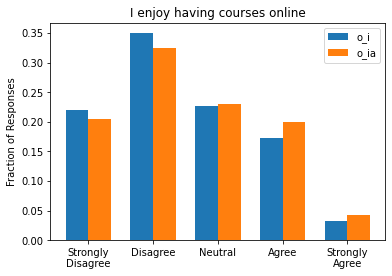

MannwhitneyuResult(statistic=51672.5, pvalue=0.14636086963269046)
o_i 2.45
o_ia 2.55
Cohen's d = -0.093


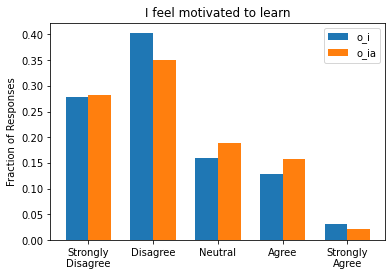

MannwhitneyuResult(statistic=52910.5, pvalue=0.2844169187412372)
o_i 2.23
o_ia 2.28
Cohen's d = -0.045


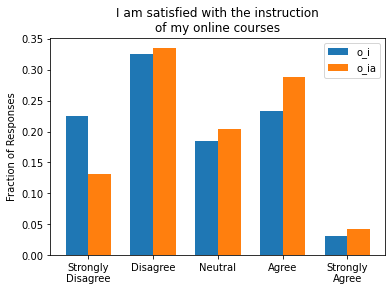

MannwhitneyuResult(statistic=47585.0, pvalue=0.0038949721987768748)
o_i 2.52
o_ia 2.77
Cohen's d = -0.22


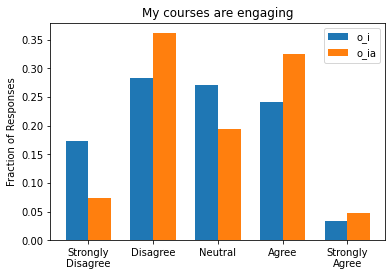

MannwhitneyuResult(statistic=48356.0, pvalue=0.009220979386528003)
o_i 2.68
o_ia 2.91
Cohen's d = -0.21


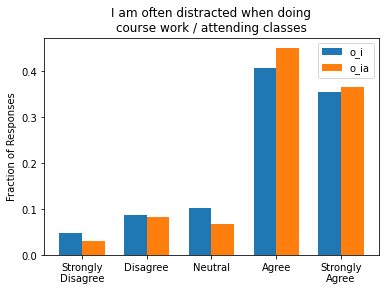

MannwhitneyuResult(statistic=52042.0, pvalue=0.1753969219514745)
o_i 3.93
o_ia 4.04
Cohen's d = -0.093


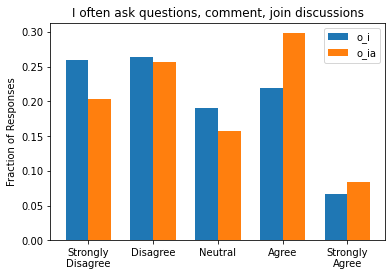

MannwhitneyuResult(statistic=48801.5, pvalue=0.015100632278804193)
o_i 2.57
o_ia 2.8
Cohen's d = -0.18
----------------------
o_i (569, 43)
o_pia (1685, 43)


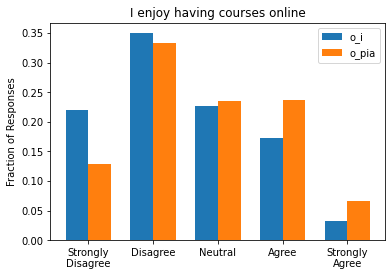

MannwhitneyuResult(statistic=402556.0, pvalue=1.6095635761085863e-09)
o_i 2.45
o_pia 2.78
Cohen's d = -0.29


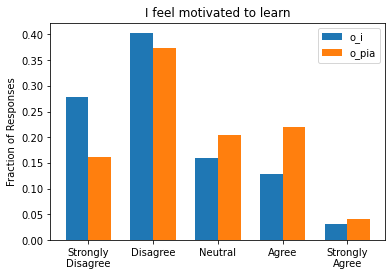

MannwhitneyuResult(statistic=387287.5, pvalue=4.639625313274455e-13)
o_i 2.23
o_pia 2.61
Cohen's d = -0.34


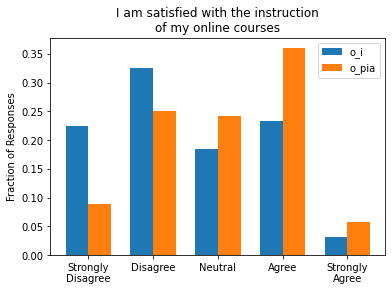

MannwhitneyuResult(statistic=357862.0, pvalue=3.2427493179110534e-21)
o_i 2.52
o_pia 3.05
Cohen's d = -0.47


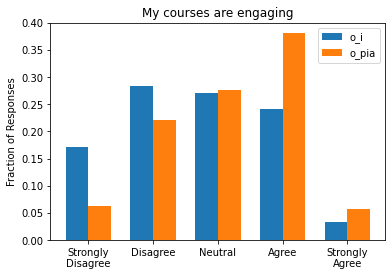

MannwhitneyuResult(statistic=367065.0, pvalue=1.5585576917899172e-18)
o_i 2.68
o_pia 3.15
Cohen's d = -0.44


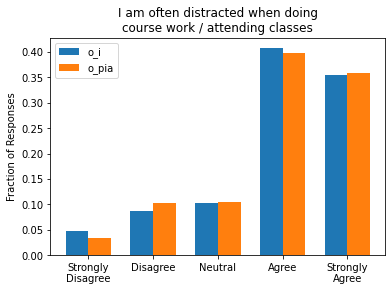

MannwhitneyuResult(statistic=478466.0, pvalue=0.47112528316293384)
o_i 3.93
o_pia 3.94
Cohen's d = -0.009


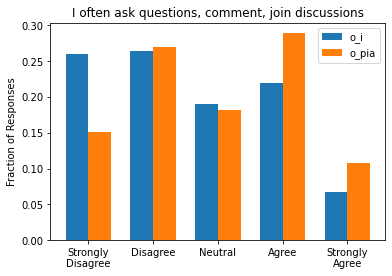

MannwhitneyuResult(statistic=402329.5, pvalue=1.8590935001517373e-09)
o_i 2.57
o_pia 2.93
Cohen's d = -0.29
----------------------
o_a (166, 43)
o_pi (891, 43)


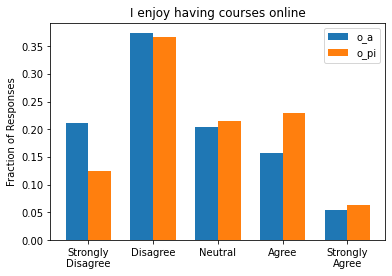

MannwhitneyuResult(statistic=64026.0, pvalue=0.002153180033874201)
o_a 2.47
o_pi 2.74
Cohen's d = -0.24


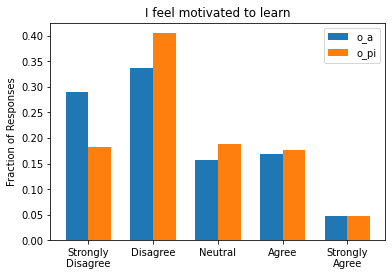

MannwhitneyuResult(statistic=67445.0, pvalue=0.030073524293722575)
o_a 2.35
o_pi 2.5
Cohen's d = -0.13


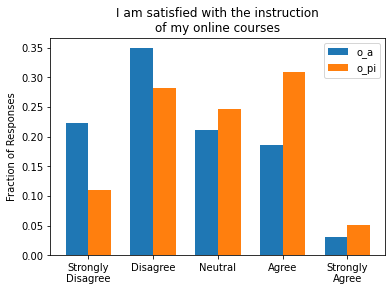

MannwhitneyuResult(statistic=57098.0, pvalue=6.870542835991026e-07)
o_a 2.45
o_pi 2.91
Cohen's d = -0.41


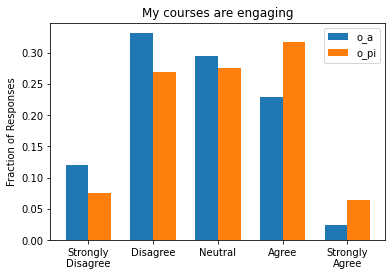

MannwhitneyuResult(statistic=61784.5, pvalue=0.00023492730716025346)
o_a 2.7
o_pi 3.02
Cohen's d = -0.3


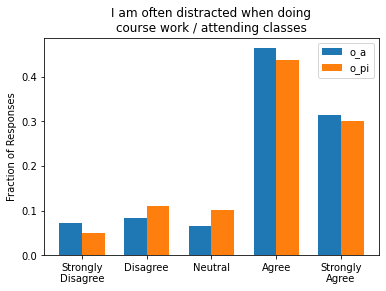

MannwhitneyuResult(statistic=71945.0, pvalue=0.2771443414119421)
o_a 3.86
o_pi 3.83
Cohen's d = 0.028


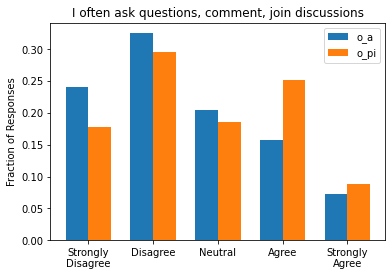

MannwhitneyuResult(statistic=64455.0, pvalue=0.0034204730021751726)
o_a 2.49
o_pi 2.78
Cohen's d = -0.23
----------------------
o_a (166, 43)
o_pa (638, 43)


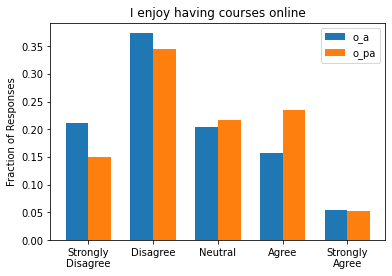

MannwhitneyuResult(statistic=46885.0, pvalue=0.009181959824683662)
o_a 2.47
o_pa 2.7
Cohen's d = -0.2


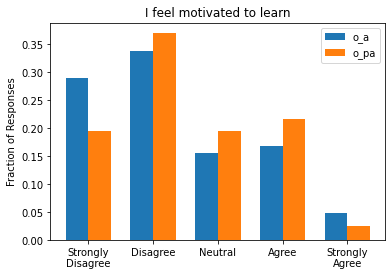

MannwhitneyuResult(statistic=48024.0, pvalue=0.027374845859647202)
o_a 2.35
o_pa 2.51
Cohen's d = -0.14


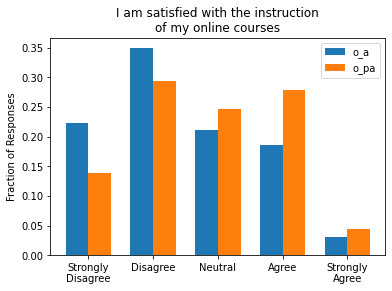

MannwhitneyuResult(statistic=43798.5, pvalue=0.0001934569479886272)
o_a 2.45
o_pa 2.8
Cohen's d = -0.31


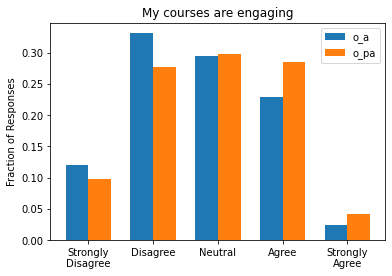

MannwhitneyuResult(statistic=47521.5, pvalue=0.017198337598594245)
o_a 2.7
o_pa 2.9
Cohen's d = -0.18


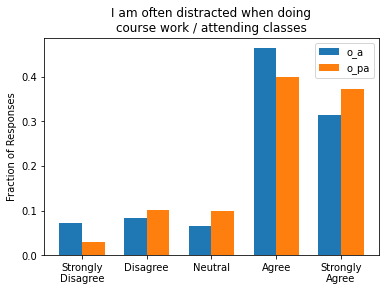

MannwhitneyuResult(statistic=50217.5, pvalue=0.1372017194532621)
o_a 3.86
o_pa 3.98
Cohen's d = -0.11


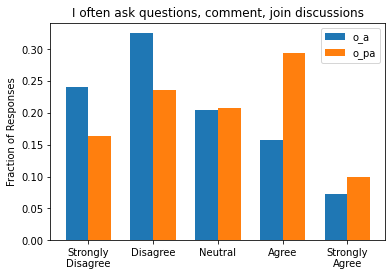

MannwhitneyuResult(statistic=42471.0, pvalue=2.7119508500155356e-05)
o_a 2.49
o_pa 2.93
Cohen's d = -0.35
----------------------
o_a (166, 43)
o_ia (191, 43)


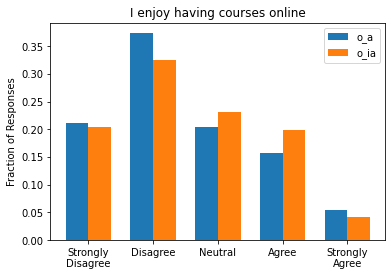

MannwhitneyuResult(statistic=15151.5, pvalue=0.2277607314479439)
o_a 2.47
o_ia 2.55
Cohen's d = -0.07


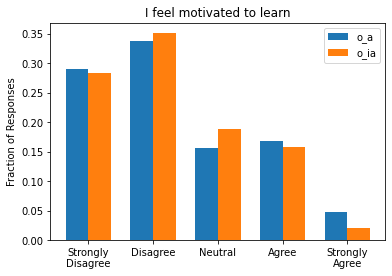

MannwhitneyuResult(statistic=15568.0, pvalue=0.38058264646276146)
o_a 2.35
o_ia 2.28
Cohen's d = 0.058


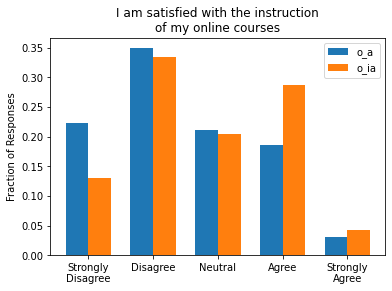

MannwhitneyuResult(statistic=13321.5, pvalue=0.003511504214552478)
o_a 2.45
o_ia 2.77
Cohen's d = -0.29


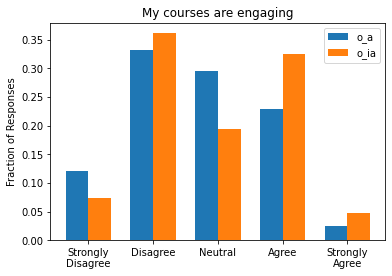

MannwhitneyuResult(statistic=14265.0, pvalue=0.04450713204438172)
o_a 2.7
o_ia 2.91
Cohen's d = -0.2


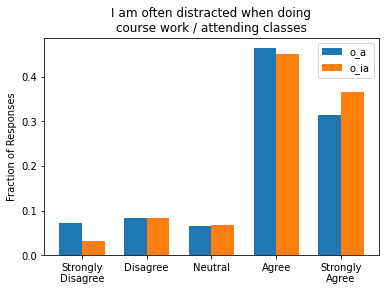

MannwhitneyuResult(statistic=14663.5, pvalue=0.09420130343045596)
o_a 3.86
o_ia 4.04
Cohen's d = -0.16


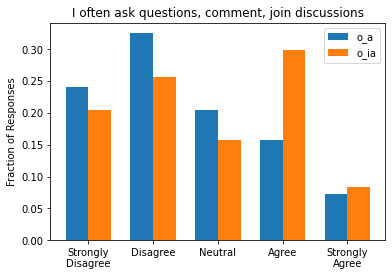

MannwhitneyuResult(statistic=13716.0, pvalue=0.011967509582574079)
o_a 2.49
o_ia 2.8
Cohen's d = -0.24
----------------------
o_a (166, 43)
o_pia (1685, 43)


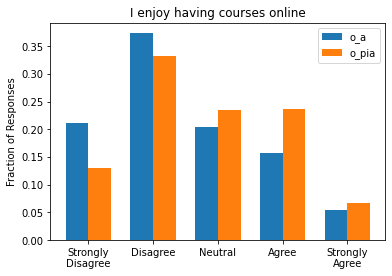

MannwhitneyuResult(statistic=118247.0, pvalue=0.00033468608996062754)
o_a 2.47
o_pia 2.78
Cohen's d = -0.27


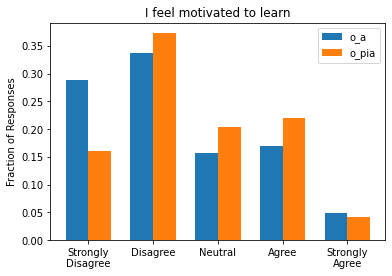

MannwhitneyuResult(statistic=120442.0, pvalue=0.0010706858136277405)
o_a 2.35
o_pia 2.61
Cohen's d = -0.23


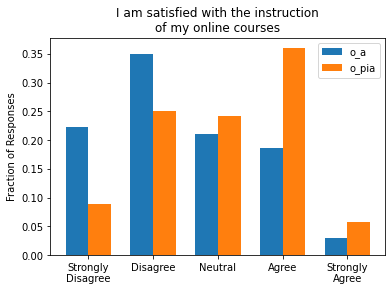

MannwhitneyuResult(statistic=98794.0, pvalue=4.229427630843198e-11)
o_a 2.45
o_pia 3.05
Cohen's d = -0.54


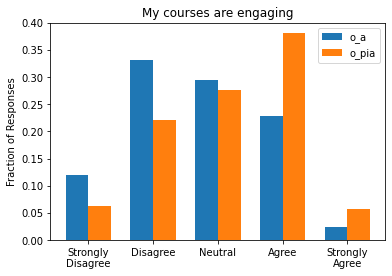

MannwhitneyuResult(statistic=106868.5, pvalue=7.76719728060314e-08)
o_a 2.7
o_pia 3.15
Cohen's d = -0.43


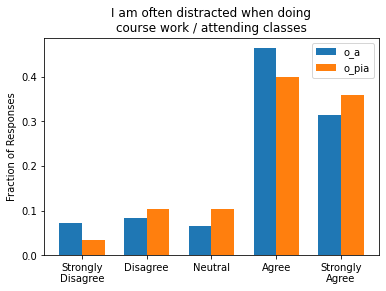

MannwhitneyuResult(statistic=135076.0, pvalue=0.21997580825718605)
o_a 3.86
o_pia 3.94
Cohen's d = -0.076


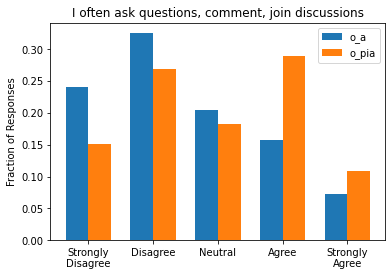

MannwhitneyuResult(statistic=112328.0, pvalue=8.307059957363361e-06)
o_a 2.49
o_pia 2.93
Cohen's d = -0.35
----------------------
o_pi (891, 43)
o_pa (638, 43)


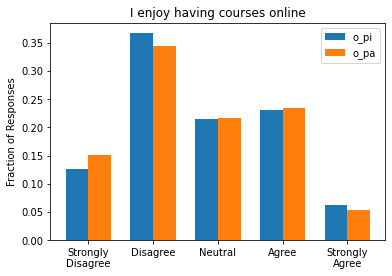

MannwhitneyuResult(statistic=278964.0, pvalue=0.2605773160481848)
o_pi 2.74
o_pa 2.7
Cohen's d = 0.036


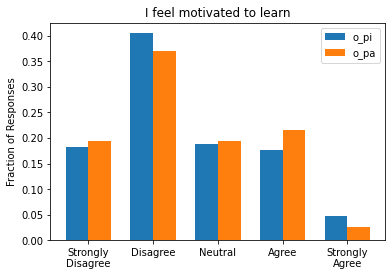

MannwhitneyuResult(statistic=281853.0, pvalue=0.3855441326584156)
o_pi 2.5
o_pa 2.51
Cohen's d = -0.0055


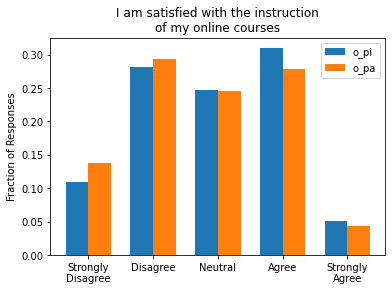

MannwhitneyuResult(statistic=268319.5, pvalue=0.02654407481924352)
o_pi 2.91
o_pa 2.8
Cohen's d = 0.1


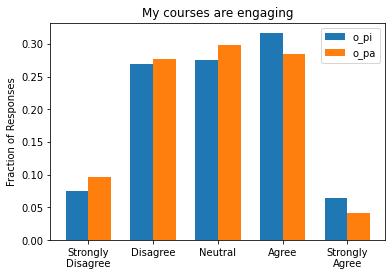

MannwhitneyuResult(statistic=266194.5, pvalue=0.013939939610161121)
o_pi 3.02
o_pa 2.9
Cohen's d = 0.12


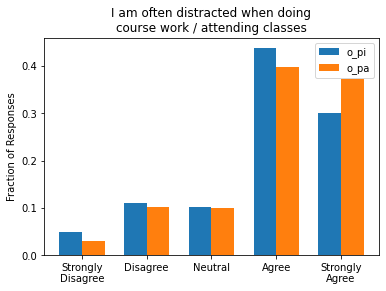

MannwhitneyuResult(statistic=261997.5, pvalue=0.0027794880743960736)
o_pi 3.83
o_pa 3.98
Cohen's d = -0.14


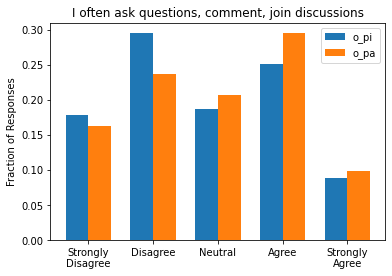

MannwhitneyuResult(statistic=264420.0, pvalue=0.00841061637920678)
o_pi 2.78
o_pa 2.93
Cohen's d = -0.12
----------------------
o_pi (891, 43)
o_ia (191, 43)


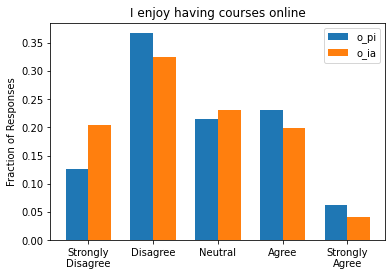

MannwhitneyuResult(statistic=77522.0, pvalue=0.022562586914724694)
o_pi 2.74
o_ia 2.55
Cohen's d = 0.17


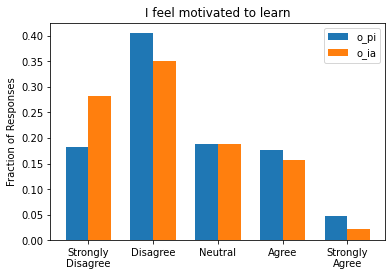

MannwhitneyuResult(statistic=75848.5, pvalue=0.006929155394479196)
o_pi 2.5
o_ia 2.28
Cohen's d = 0.2


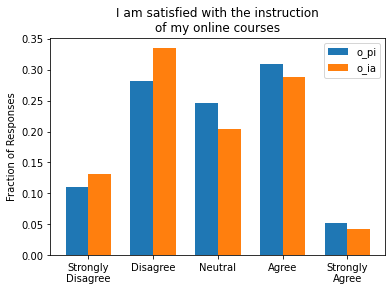

MannwhitneyuResult(statistic=79259.0, pvalue=0.06157385719174794)
o_pi 2.91
o_ia 2.77
Cohen's d = 0.12


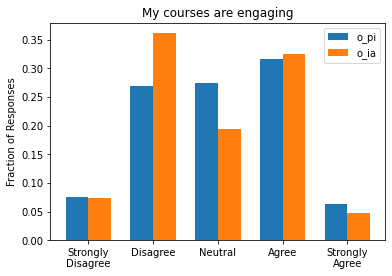

MannwhitneyuResult(statistic=79992.0, pvalue=0.08824433290358952)
o_pi 3.02
o_ia 2.91
Cohen's d = 0.11


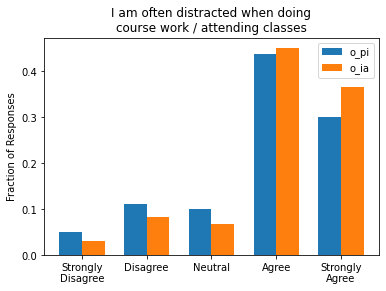

MannwhitneyuResult(statistic=76311.0, pvalue=0.008540764720898967)
o_pi 3.83
o_ia 4.04
Cohen's d = -0.19


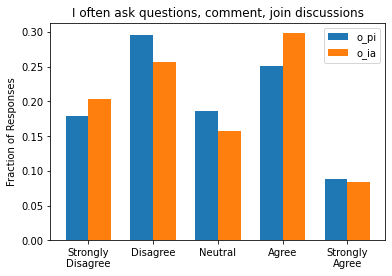

MannwhitneyuResult(statistic=84172.0, pvalue=0.4048299874516252)
o_pi 2.78
o_ia 2.8
Cohen's d = -0.019
----------------------
o_pi (891, 43)
o_pia (1685, 43)


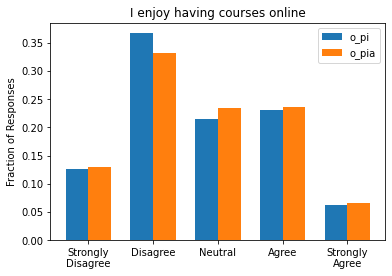

MannwhitneyuResult(statistic=734261.5, pvalue=0.17198079993670362)
o_pi 2.74
o_pia 2.78
Cohen's d = -0.036


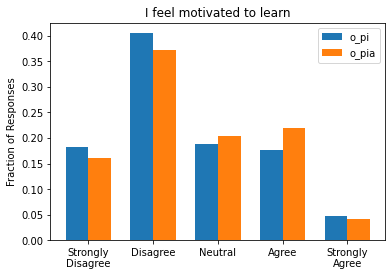

MannwhitneyuResult(statistic=708119.5, pvalue=0.00680037282681298)
o_pi 2.5
o_pia 2.61
Cohen's d = -0.095


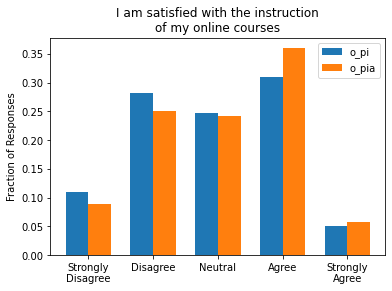

MannwhitneyuResult(statistic=698008.5, pvalue=0.0011550808660636945)
o_pi 2.91
o_pia 3.05
Cohen's d = -0.12


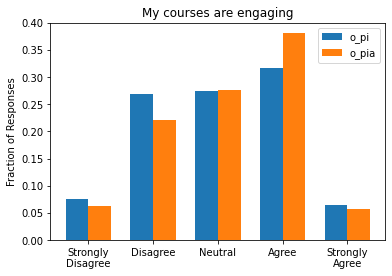

MannwhitneyuResult(statistic=699563.5, pvalue=0.0014920943167434505)
o_pi 3.02
o_pia 3.15
Cohen's d = -0.12


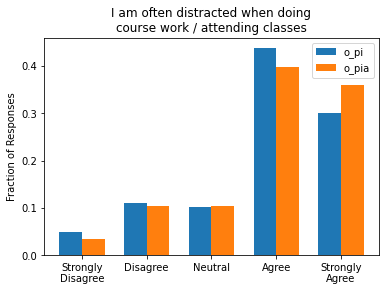

MannwhitneyuResult(statistic=705101.0, pvalue=0.0035516231635007818)
o_pi 3.83
o_pia 3.94
Cohen's d = -0.1


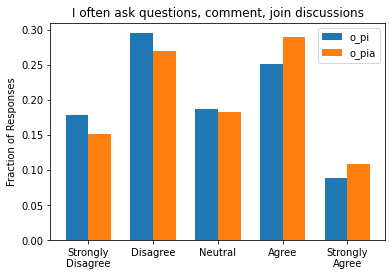

MannwhitneyuResult(statistic=698267.5, pvalue=0.0013484131122302888)
o_pi 2.78
o_pia 2.93
Cohen's d = -0.12
----------------------
o_pa (638, 43)
o_ia (191, 43)


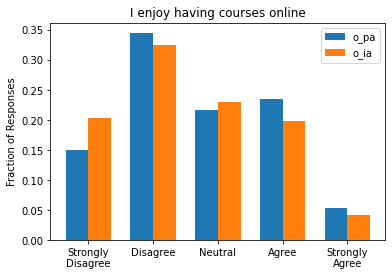

MannwhitneyuResult(statistic=56654.0, pvalue=0.06381392477327302)
o_pa 2.7
o_ia 2.55
Cohen's d = 0.13


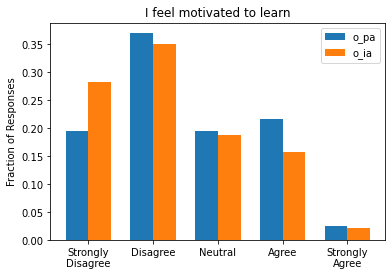

MannwhitneyuResult(statistic=53864.0, pvalue=0.005718392342871039)
o_pa 2.51
o_ia 2.28
Cohen's d = 0.2


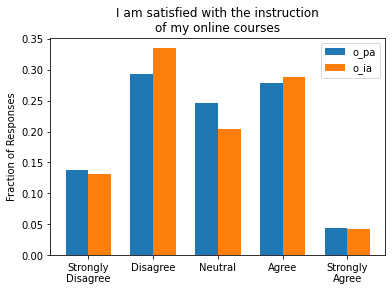

MannwhitneyuResult(statistic=60149.5, pvalue=0.39065485267580957)
o_pa 2.8
o_ia 2.77
Cohen's d = 0.02


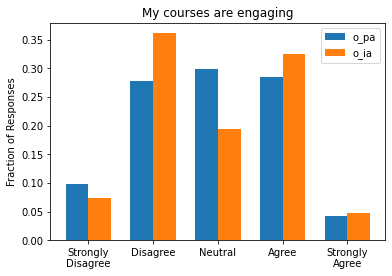

MannwhitneyuResult(statistic=60821.0, pvalue=0.48466094533370585)
o_pa 2.9
o_ia 2.91
Cohen's d = -0.012


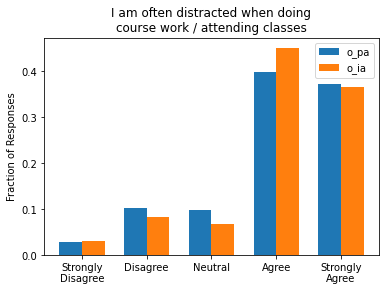

MannwhitneyuResult(statistic=59546.5, pvalue=0.30576806967623527)
o_pa 3.98
o_ia 4.04
Cohen's d = -0.054


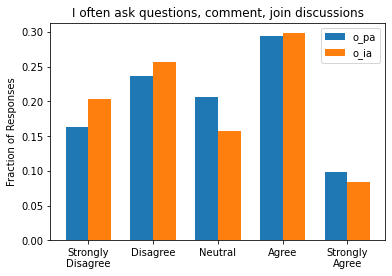

MannwhitneyuResult(statistic=57574.5, pvalue=0.11754164730376154)
o_pa 2.93
o_ia 2.8
Cohen's d = 0.1
----------------------
o_pa (638, 43)
o_pia (1685, 43)


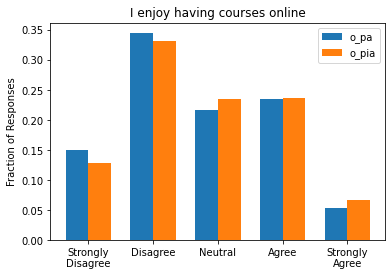

MannwhitneyuResult(statistic=516123.0, pvalue=0.0625207635622689)
o_pa 2.7
o_pia 2.78
Cohen's d = -0.072


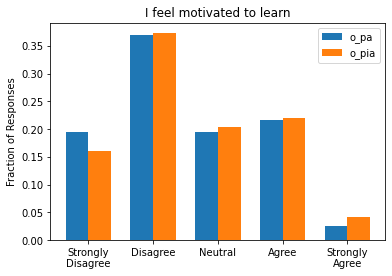

MannwhitneyuResult(statistic=511759.0, pvalue=0.03172096028964515)
o_pa 2.51
o_pia 2.61
Cohen's d = -0.09


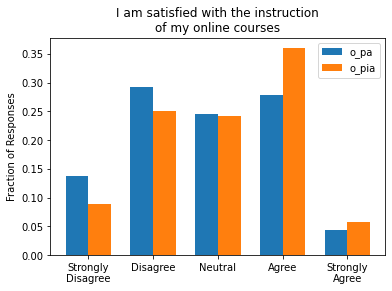

MannwhitneyuResult(statistic=470072.5, pvalue=6.087319155887157e-07)
o_pa 2.8
o_pia 3.05
Cohen's d = -0.23


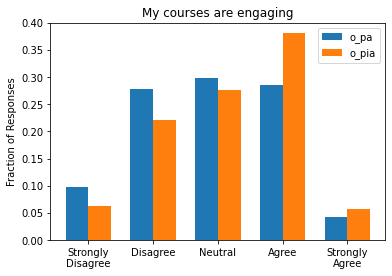

MannwhitneyuResult(statistic=465687.0, pvalue=1.0342331138435404e-07)
o_pa 2.9
o_pia 3.15
Cohen's d = -0.24


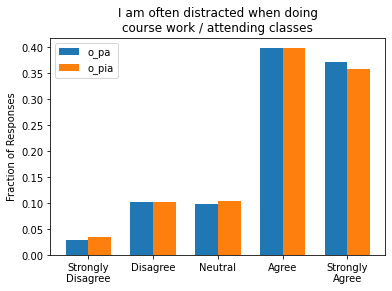

MannwhitneyuResult(statistic=528265.5, pvalue=0.24803939057419683)
o_pa 3.98
o_pia 3.94
Cohen's d = 0.032


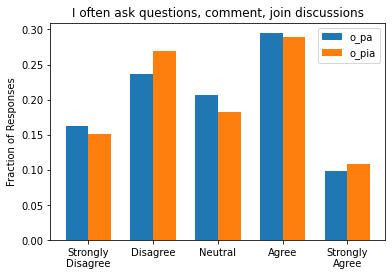

MannwhitneyuResult(statistic=537100.0, pvalue=0.4882200075886665)
o_pa 2.93
o_pia 2.93
Cohen's d = -0.0028
----------------------
o_ia (191, 43)
o_pia (1685, 43)


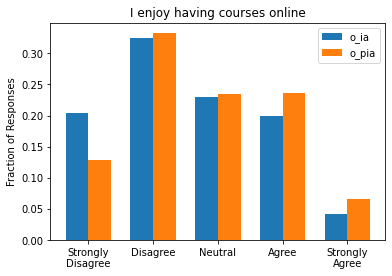

MannwhitneyuResult(statistic=143296.0, pvalue=0.0051117119204195025)
o_ia 2.55
o_pia 2.78
Cohen's d = -0.2


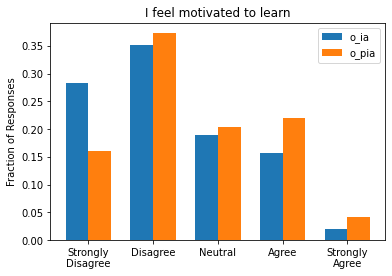

MannwhitneyuResult(statistic=134683.0, pvalue=6.080288880362456e-05)
o_ia 2.28
o_pia 2.61
Cohen's d = -0.29


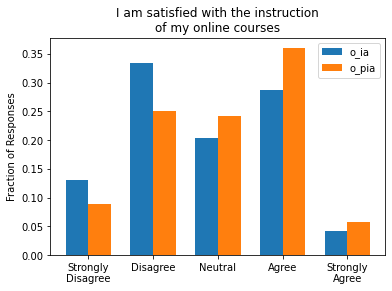

MannwhitneyuResult(statistic=138879.0, pvalue=0.0006163518312331211)
o_ia 2.77
o_pia 3.05
Cohen's d = -0.25


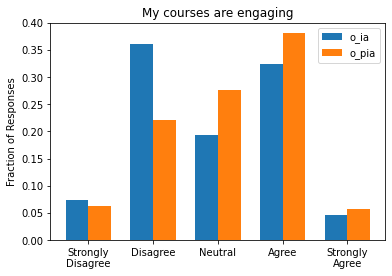

MannwhitneyuResult(statistic=140707.5, pvalue=0.0014454256188903738)
o_ia 2.91
o_pia 3.15
Cohen's d = -0.23


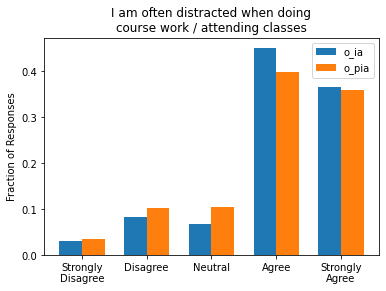

MannwhitneyuResult(statistic=154422.0, pvalue=0.16530457496336376)
o_ia 4.04
o_pia 3.94
Cohen's d = 0.085


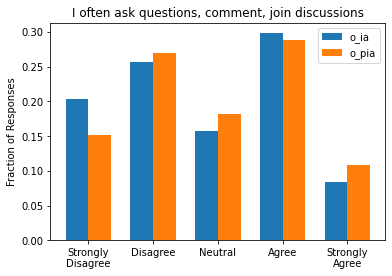

MannwhitneyuResult(statistic=151761.0, pvalue=0.09223340388294982)
o_ia 2.8
o_pia 2.93
Cohen's d = -0.1


In [537]:
for i in range(len(ugcats_o)-1):
    for j in range(i+1, len(ugcats_o)):
        print('----------------------')
        print(ugcats_o[i].name, ugcats_o[i].shape)
        print(ugcats_o[j].name, ugcats_o[j].shape)
        remote_comparison(ugcats_o[i], ugcats_o[j])

## Effects of number of techniques and methods, controlling for types

In [538]:
print(ug.shape)
print(ug.columns)
print(ug['num_methods'].value_counts(normalize=True))
print(ug['num_techniques'].value_counts(normalize=True))

(4791, 43)
Index(['level_0', 'index', 'level', 'country', 'is_online', 'first_survey',
       'primary_mode', 'preferred_mode', 'why_mode', 'platforms_used',
       'methods_used', 'techniques_outside', 'remote_enjoy',
       'remote_motivated', 'remote_satisfied', 'remote_engaging',
       'remote_distracted', 'remote_questions', 'remote_changes',
       'prior_enjoy', 'prior_motivated', 'prior_satisfied', 'prior_engaging',
       'prior_distracted', 'prior_questions', 'prior_changes', 'preference',
       'why_preference', 'change_enjoy', 'change_motivated',
       'change_satisfied', 'change_engaging', 'change_distracted',
       'change_questions', 'active', 'passive', 'fully_active',
       'partly_active', 'outside_passive', 'outside_interactive',
       'outside_assignments', 'num_methods', 'num_techniques'],
      dtype='object')
 1    0.228136
 2    0.213943
 0    0.193488
 3    0.169067
 4    0.107911
 5    0.051972
 6    0.022542
 7    0.012106
-1    0.000417
 9    0.000209


In [539]:
def num_diversity_controlled(cat, num):
    print(cat.name)
    if 0 in cat[num].unique():
        cat = cat.drop(cat[cat[num]==0].index, axis=0)
    proportion = cat[num].value_counts(normalize=True)
    print(proportion)
    least = min(cat[num].unique())
#     if sum(proportion.iloc[:(least+2)]) < 0.8:
    return num_comp(cat, num, least, least+1), '---------------', num_comp(cat, num, least, least+2)
#     else:
#         return num_methods_comp(cat, least, least+1)

p
1    0.817427
2    0.175657
3    0.005533
4    0.001383
Name: num_methods, dtype: float64
>=1, <2 (591, 43)
>=2 (132, 43)


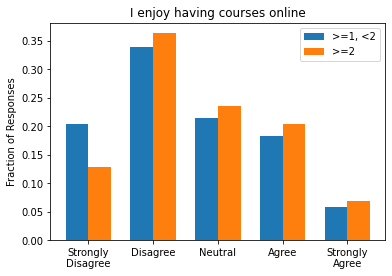

MannwhitneyuResult(statistic=35654.0, pvalue=0.055067534946284656)
>=1, <2 2.55
>=2 2.72
Cohen's d = -0.15


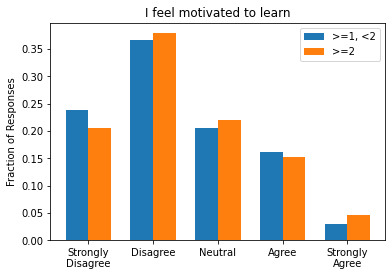

MannwhitneyuResult(statistic=37549.0, pvalue=0.24253653045892726)
>=1, <2 2.38
>=2 2.45
Cohen's d = -0.068


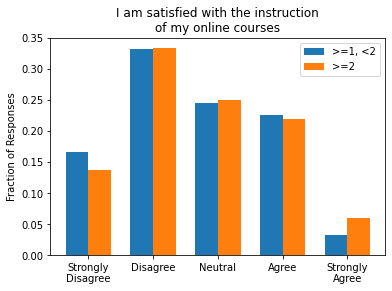

MannwhitneyuResult(statistic=37100.0, pvalue=0.1816039834981295)
>=1, <2 2.63
>=2 2.73
Cohen's d = -0.098


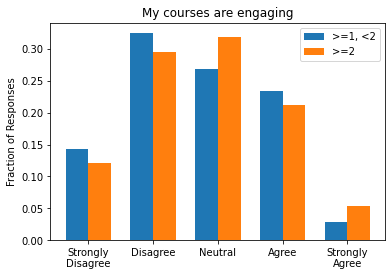

MannwhitneyuResult(statistic=37082.5, pvalue=0.1791464202754608)
>=1, <2 2.68
>=2 2.78
Cohen's d = -0.095


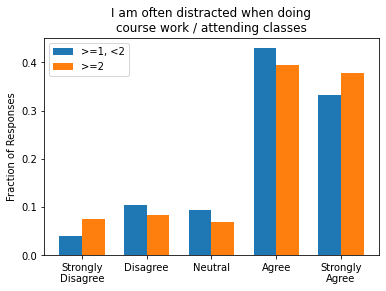

MannwhitneyuResult(statistic=37781.5, pvalue=0.27406237478319967)
>=1, <2 3.91
>=2 3.92
Cohen's d = -0.0027


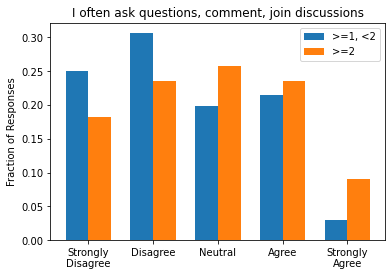

MannwhitneyuResult(statistic=32889.0, pvalue=0.0018347294856872873)
>=1, <2 2.47
>=2 2.82
Cohen's d = -0.3
>=1, <3 (718, 43)
>=3 (5, 43)


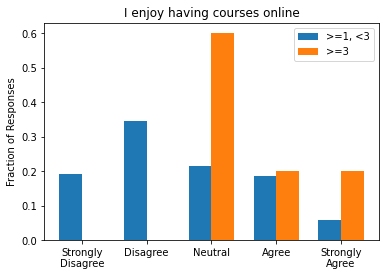

MannwhitneyuResult(statistic=890.5, pvalue=0.02228154798305609)
>=1, <3 2.57
>=3 3.6
Cohen's d = -0.88


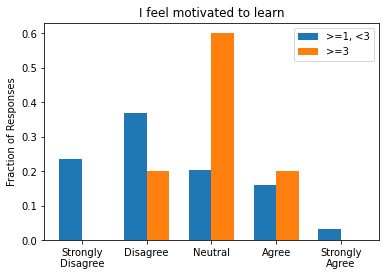

MannwhitneyuResult(statistic=1133.0, pvalue=0.06968684382985653)
>=1, <3 2.39
>=3 3.0
Cohen's d = -0.55


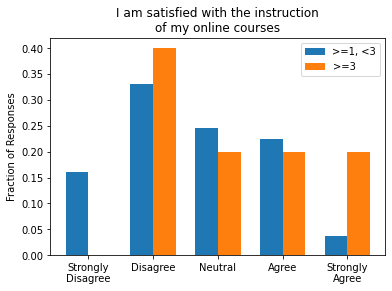

MannwhitneyuResult(statistic=1361.0, pvalue=0.16745110126620427)
>=1, <3 2.64
>=3 3.2
Cohen's d = -0.5


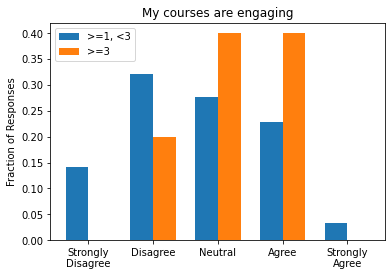

MannwhitneyuResult(statistic=1289.0, pvalue=0.13015176741347445)
>=1, <3 2.69
>=3 3.2
Cohen's d = -0.47


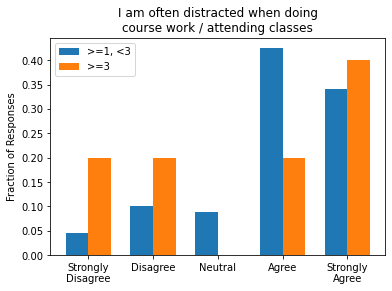

MannwhitneyuResult(statistic=1595.5, pvalue=0.32449461581670946)
>=1, <3 3.92
>=3 3.4
Cohen's d = 0.47


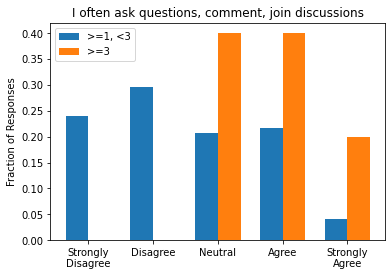

MannwhitneyuResult(statistic=747.5, pvalue=0.010217549237491895)
>=1, <3 2.52
>=3 3.8
Cohen's d = -1.1
-----------------------------------
a
1    0.848249
2    0.151751
Name: num_methods, dtype: float64
>=1, <2 (218, 43)
>=2 (39, 43)


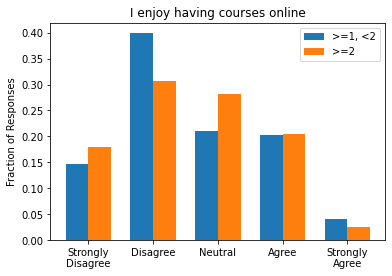

MannwhitneyuResult(statistic=4212.5, pvalue=0.46308744892996584)
>=1, <2 2.59
>=2 2.59
Cohen's d = 0.0018


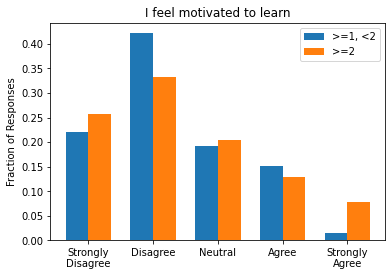

MannwhitneyuResult(statistic=4110.0, pvalue=0.3652186840646783)
>=1, <2 2.32
>=2 2.44
Cohen's d = -0.11


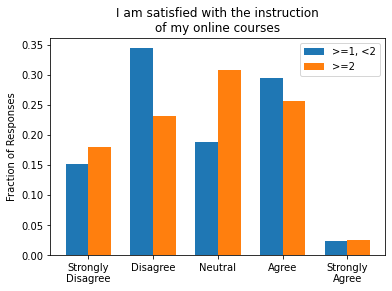

MannwhitneyuResult(statistic=4184.5, pvalue=0.4363660179473601)
>=1, <2 2.69
>=2 2.72
Cohen's d = -0.023


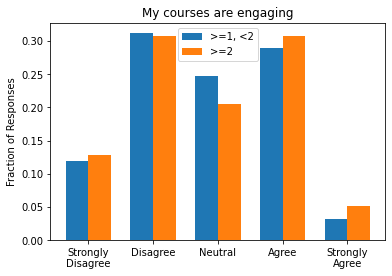

MannwhitneyuResult(statistic=4166.0, pvalue=0.4187717021771713)
>=1, <2 2.8
>=2 2.85
Cohen's d = -0.04


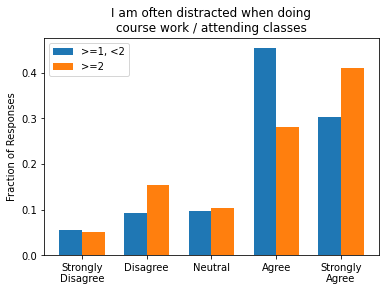

MannwhitneyuResult(statistic=4100.5, pvalue=0.3547530406078279)
>=1, <2 3.86
>=2 3.85
Cohen's d = 0.01


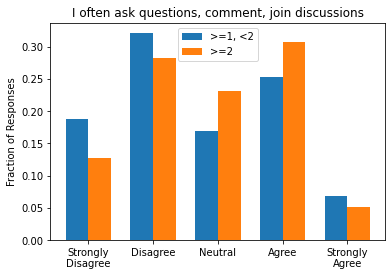

MannwhitneyuResult(statistic=3871.0, pvalue=0.17986078805438405)
>=1, <2 2.69
>=2 2.87
Cohen's d = -0.15
>=1, <3 (257, 43)
>=3 (0, 43)


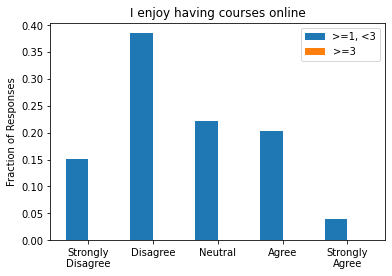

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
>=1, <3 2.59
>=3 nan
Cohen's d = nan


/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:6415: RuntimeWarning:

divide by zero encountered in double_scalars



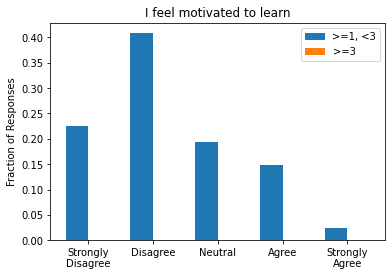

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
>=1, <3 2.33
>=3 nan
Cohen's d = nan


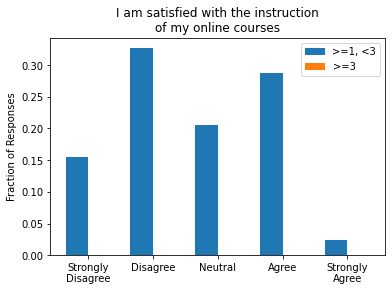

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
>=1, <3 2.7
>=3 nan
Cohen's d = nan


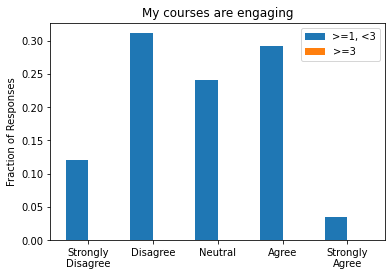

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
>=1, <3 2.81
>=3 nan
Cohen's d = nan


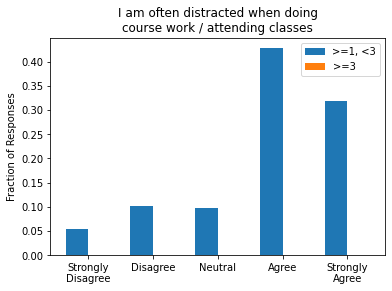

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
>=1, <3 3.86
>=3 nan
Cohen's d = nan


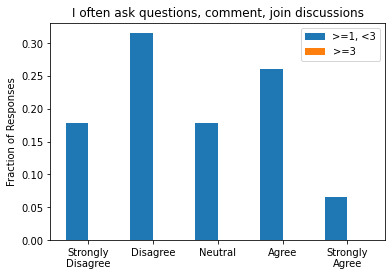

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
>=1, <3 2.72
>=3 nan
Cohen's d = nan
-----------------------------------
f
1    0.732984
2    0.225131
3    0.036649
4    0.005236
Name: num_methods, dtype: float64
>=1, <2 (140, 43)
>=2 (51, 43)


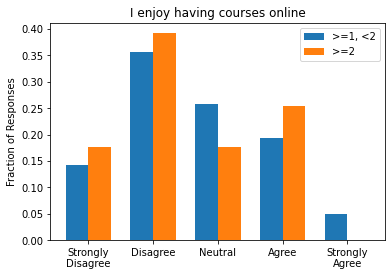

MannwhitneyuResult(statistic=3335.5, pvalue=0.23581025122469573)
>=1, <2 2.65
>=2 2.51
Cohen's d = 0.13


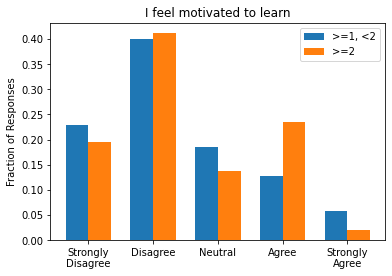

MannwhitneyuResult(statistic=3401.0, pvalue=0.3010975752827861)
>=1, <2 2.39
>=2 2.47
Cohen's d = -0.075


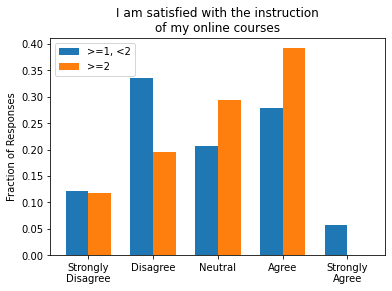

MannwhitneyuResult(statistic=3256.5, pvalue=0.16845000695342527)
>=1, <2 2.81
>=2 2.96
Cohen's d = -0.13


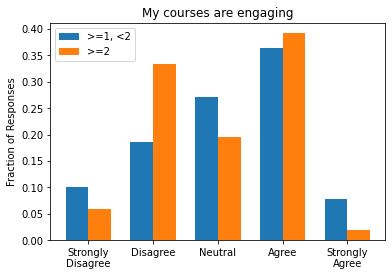

MannwhitneyuResult(statistic=3274.5, pvalue=0.1814789060681677)
>=1, <2 3.14
>=2 2.98
Cohen's d = 0.14


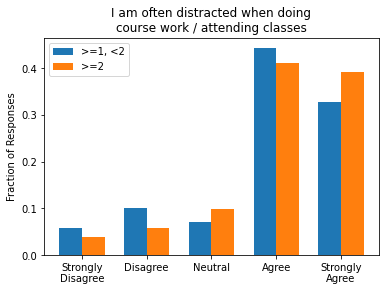

MannwhitneyuResult(statistic=3289.0, pvalue=0.18753711388825034)
>=1, <2 3.89
>=2 4.06
Cohen's d = -0.15


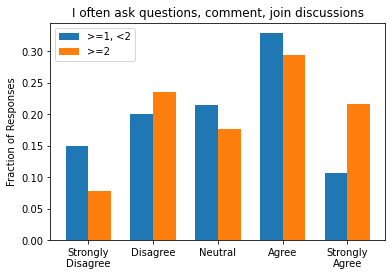

MannwhitneyuResult(statistic=3114.5, pvalue=0.08305572840176195)
>=1, <2 3.04
>=2 3.33
Cohen's d = -0.23
>=1, <3 (183, 43)
>=3 (8, 43)


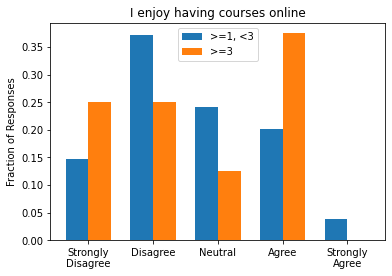

MannwhitneyuResult(statistic=725.5, pvalue=0.4837429140856672)
>=1, <3 2.61
>=3 2.62
Cohen's d = -0.012


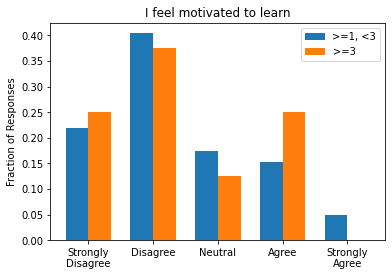

MannwhitneyuResult(statistic=721.0, pvalue=0.47140772149291593)
>=1, <3 2.41
>=3 2.38
Cohen's d = 0.031


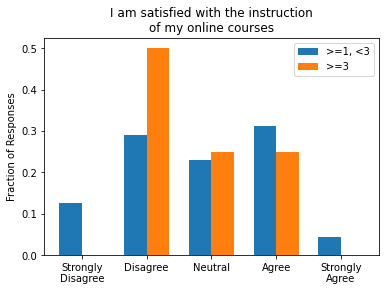

MannwhitneyuResult(statistic=685.0, pvalue=0.3763567683686307)
>=1, <3 2.86
>=3 2.75
Cohen's d = 0.097


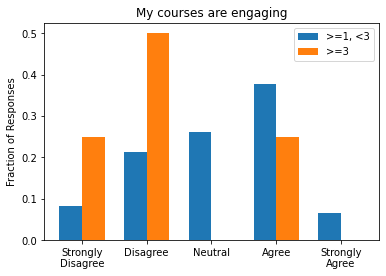

MannwhitneyuResult(statistic=426.0, pvalue=0.018735679483552804)
>=1, <3 3.13
>=3 2.25
Cohen's d = 0.81


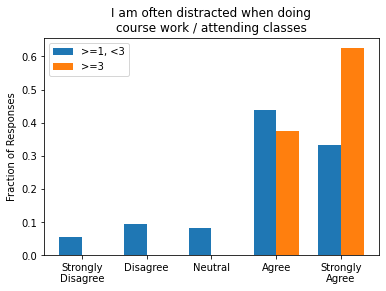

MannwhitneyuResult(statistic=455.5, pvalue=0.026961915958560952)
>=1, <3 3.9
>=3 4.62
Cohen's d = -0.65


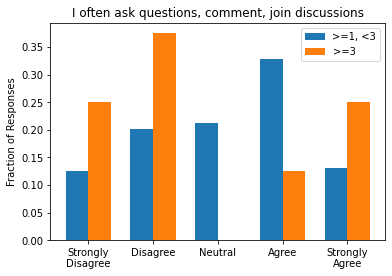

MannwhitneyuResult(statistic=618.5, pvalue=0.22377303402227627)
>=1, <3 3.14
>=3 2.75
Cohen's d = 0.31
-----------------------------------
pa
2    0.595525
3    0.332186
4    0.072289
Name: num_methods, dtype: float64
>=2, <3 (346, 43)
>=3 (235, 43)


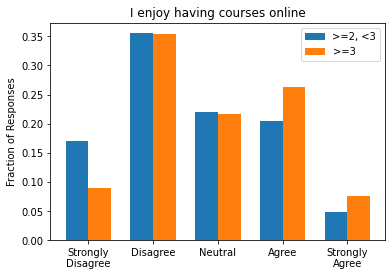

MannwhitneyuResult(statistic=35197.0, pvalue=0.0021892495860161084)
>=2, <3 2.61
>=3 2.89
Cohen's d = -0.25


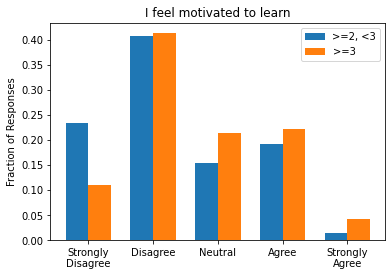

MannwhitneyuResult(statistic=33685.5, pvalue=0.00011814295192378137)
>=2, <3 2.34
>=3 2.67
Cohen's d = -0.31


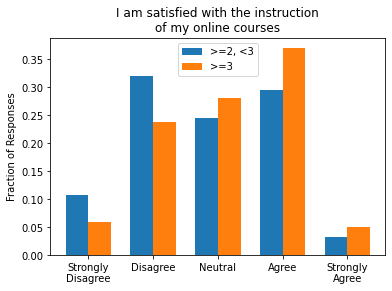

MannwhitneyuResult(statistic=34504.0, pvalue=0.0006346081920800271)
>=2, <3 2.82
>=3 3.11
Cohen's d = -0.28


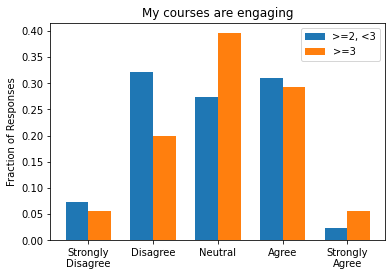

MannwhitneyuResult(statistic=36222.0, pvalue=0.009909385487394734)
>=2, <3 2.89
>=3 3.09
Cohen's d = -0.21


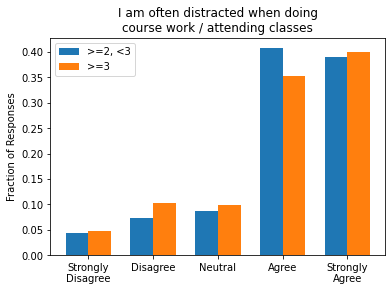

MannwhitneyuResult(statistic=39848.0, pvalue=0.33253315797393557)
>=2, <3 4.03
>=3 3.96
Cohen's d = 0.064


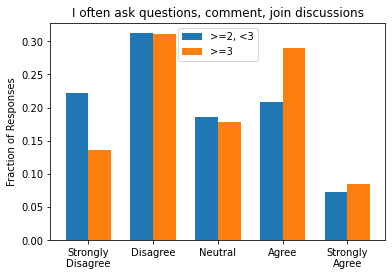

MannwhitneyuResult(statistic=35351.0, pvalue=0.002973148283092693)
>=2, <3 2.6
>=3 2.88
Cohen's d = -0.23
>=2, <4 (539, 43)
>=4 (42, 43)


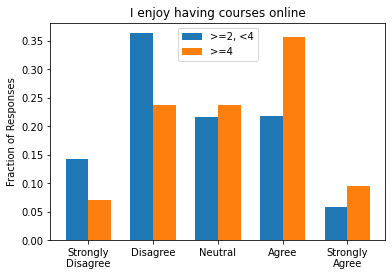

MannwhitneyuResult(statistic=8628.5, pvalue=0.0038856315333440188)
>=2, <4 2.68
>=4 3.17
Cohen's d = -0.43


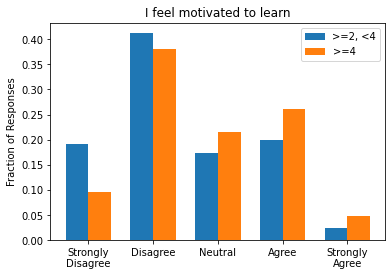

MannwhitneyuResult(statistic=9397.5, pvalue=0.02738293923724619)
>=2, <4 2.45
>=4 2.79
Cohen's d = -0.31


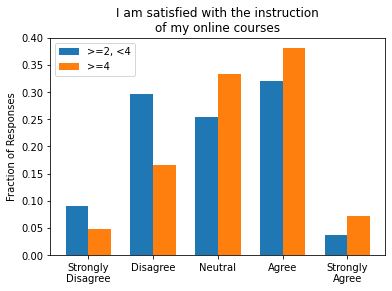

MannwhitneyuResult(statistic=9294.0, pvalue=0.02219002029404195)
>=2, <4 2.92
>=4 3.26
Cohen's d = -0.33


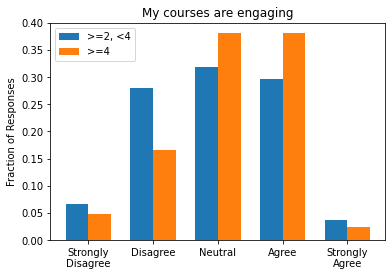

MannwhitneyuResult(statistic=9900.5, pvalue=0.07889976443603974)
>=2, <4 2.96
>=4 3.17
Cohen's d = -0.21


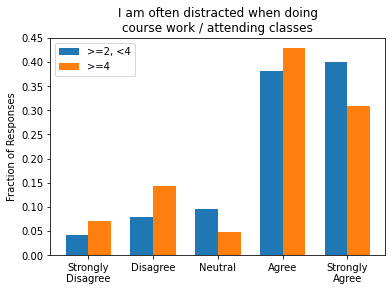

MannwhitneyuResult(statistic=10047.5, pvalue=0.09799917960236376)
>=2, <4 4.02
>=4 3.76
Cohen's d = 0.23


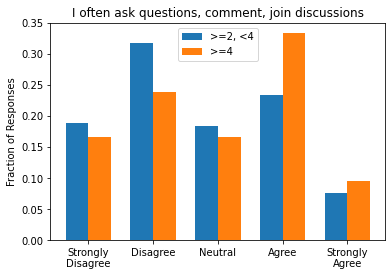

MannwhitneyuResult(statistic=9984.5, pvalue=0.09488238399766391)
>=2, <4 2.69
>=4 2.95
Cohen's d = -0.21
-----------------------------------
pf
2    0.503748
3    0.349325
4    0.121439
5    0.025487
Name: num_methods, dtype: float64
>=2, <3 (336, 43)
>=3 (331, 43)


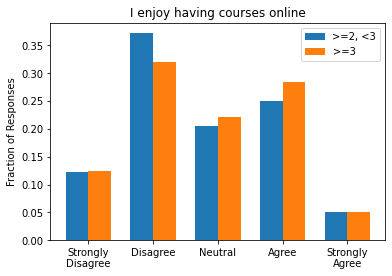

MannwhitneyuResult(statistic=53162.5, pvalue=0.1538273880275226)
>=2, <3 2.74
>=3 2.82
Cohen's d = -0.074


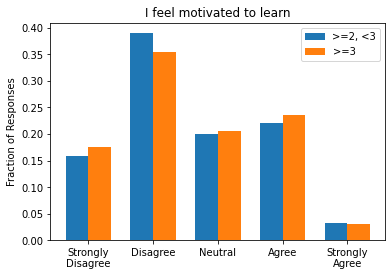

MannwhitneyuResult(statistic=55255.5, pvalue=0.44149289288878096)
>=2, <3 2.58
>=3 2.59
Cohen's d = -0.011


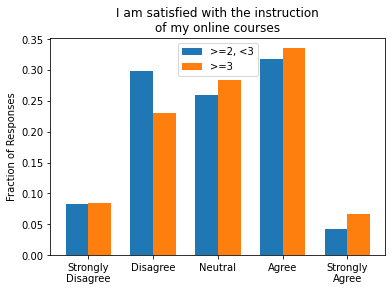

MannwhitneyuResult(statistic=51733.5, pvalue=0.05283211172096988)
>=2, <3 2.94
>=3 3.07
Cohen's d = -0.12


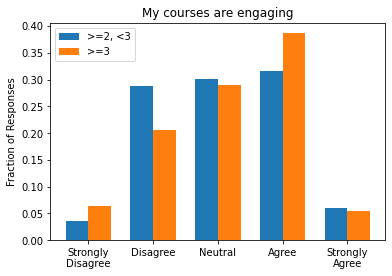

MannwhitneyuResult(statistic=52132.0, pvalue=0.0721788397182771)
>=2, <3 3.07
>=3 3.16
Cohen's d = -0.088


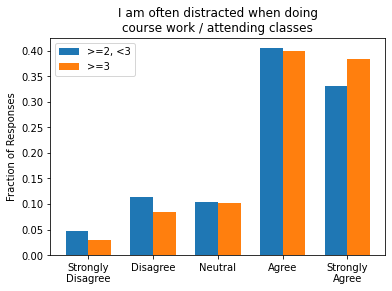

MannwhitneyuResult(statistic=51377.5, pvalue=0.03557604112119333)
>=2, <3 3.86
>=3 4.02
Cohen's d = -0.15


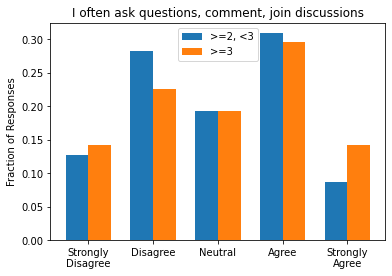

MannwhitneyuResult(statistic=52405.5, pvalue=0.09272552021857866)
>=2, <3 2.94
>=3 3.07
Cohen's d = -0.1
>=2, <4 (569, 43)
>=4 (98, 43)


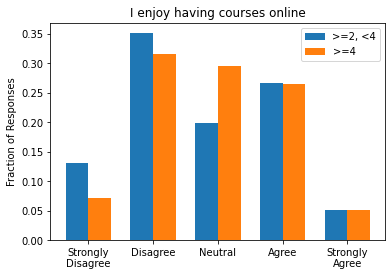

MannwhitneyuResult(statistic=25624.5, pvalue=0.0918654147681946)
>=2, <4 2.75
>=4 2.91
Cohen's d = -0.14


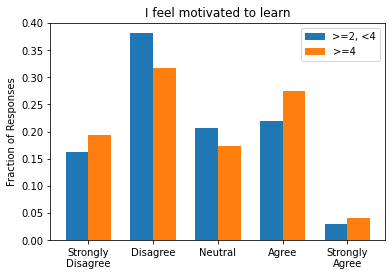

MannwhitneyuResult(statistic=26958.0, pvalue=0.29296045364260936)
>=2, <4 2.57
>=4 2.65
Cohen's d = -0.071


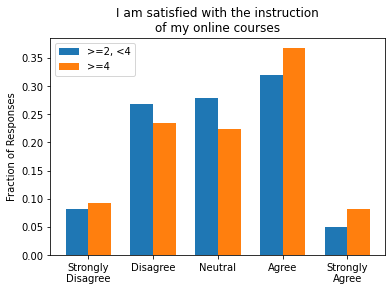

MannwhitneyuResult(statistic=25921.0, pvalue=0.12388479751612075)
>=2, <4 2.98
>=4 3.11
Cohen's d = -0.12


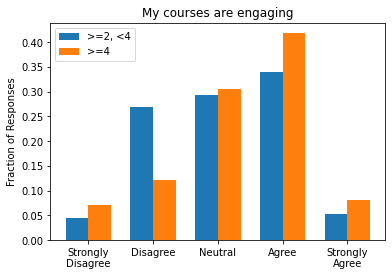

MannwhitneyuResult(statistic=23991.5, pvalue=0.01053226583109906)
>=2, <4 3.08
>=4 3.32
Cohen's d = -0.23


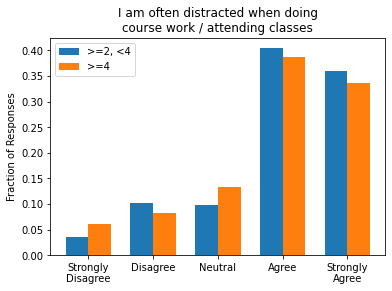

MannwhitneyuResult(statistic=26686.5, pvalue=0.23596447940459253)
>=2, <4 3.95
>=4 3.86
Cohen's d = 0.087


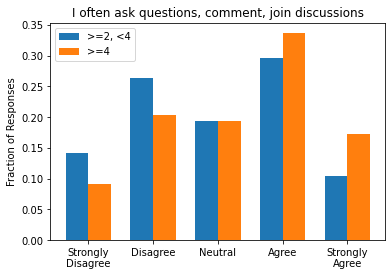

MannwhitneyuResult(statistic=23630.5, pvalue=0.006530306346597597)
>=2, <4 2.96
>=4 3.3
Cohen's d = -0.27
-----------------------------------
af
2    0.540773
3    0.309013
4    0.145923
5    0.004292
Name: num_methods, dtype: float64
>=2, <3 (126, 43)
>=3 (107, 43)


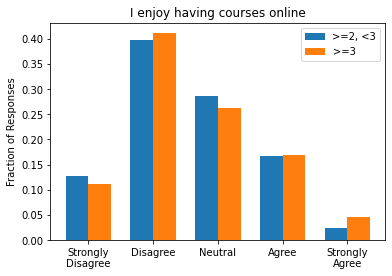

MannwhitneyuResult(statistic=6582.5, pvalue=0.37314556668518384)
>=2, <3 2.56
>=3 2.63
Cohen's d = -0.062


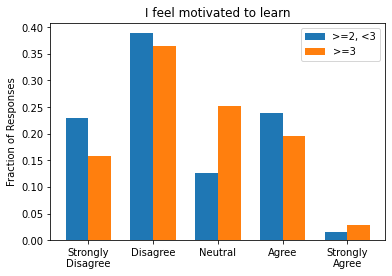

MannwhitneyuResult(statistic=6163.0, pvalue=0.12035848765021773)
>=2, <3 2.42
>=3 2.57
Cohen's d = -0.14


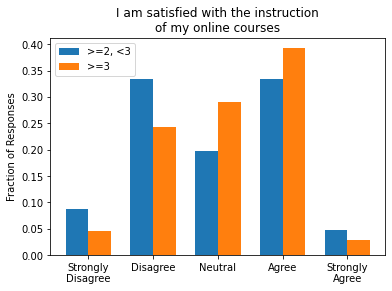

MannwhitneyuResult(statistic=6065.0, pvalue=0.08410185206809878)
>=2, <3 2.92
>=3 3.11
Cohen's d = -0.18


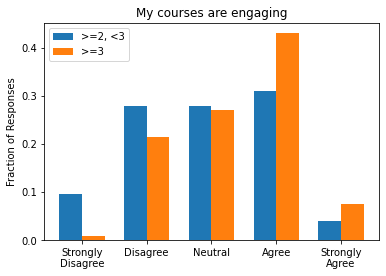

MannwhitneyuResult(statistic=5270.0, pvalue=0.0013577024595667047)
>=2, <3 2.92
>=3 3.35
Cohen's d = -0.42


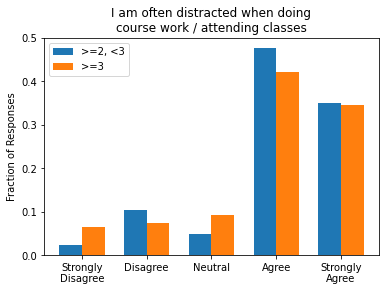

MannwhitneyuResult(statistic=6464.5, pvalue=0.2814115454154176)
>=2, <3 4.02
>=3 3.91
Cohen's d = 0.11


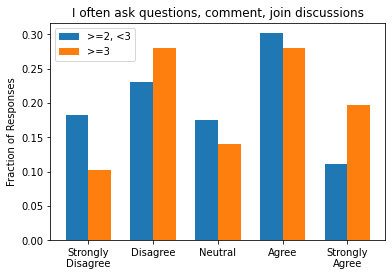

MannwhitneyuResult(statistic=5996.5, pvalue=0.06811604619886369)
>=2, <3 2.93
>=3 3.19
Cohen's d = -0.2
>=2, <4 (198, 43)
>=4 (35, 43)


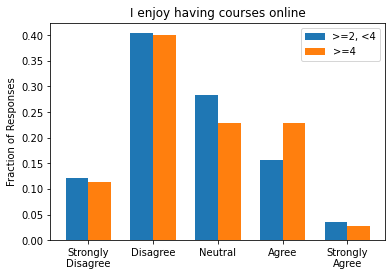

MannwhitneyuResult(statistic=3331.5, pvalue=0.3520243519050723)
>=2, <4 2.58
>=4 2.66
Cohen's d = -0.075


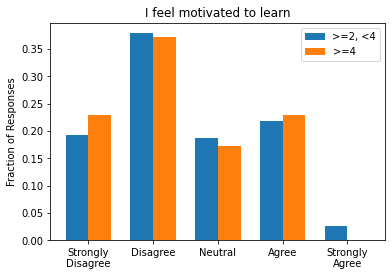

MannwhitneyuResult(statistic=3294.5, pvalue=0.31500889728973286)
>=2, <4 2.51
>=4 2.4
Cohen's d = 0.095


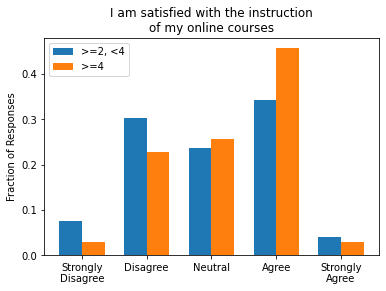

MannwhitneyuResult(statistic=2986.0, pvalue=0.08667871814962619)
>=2, <4 2.97
>=4 3.23
Cohen's d = -0.25


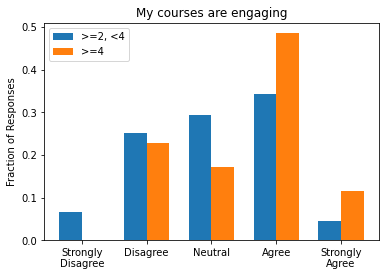

MannwhitneyuResult(statistic=2665.0, pvalue=0.011492370451038533)
>=2, <4 3.05
>=4 3.49
Cohen's d = -0.43


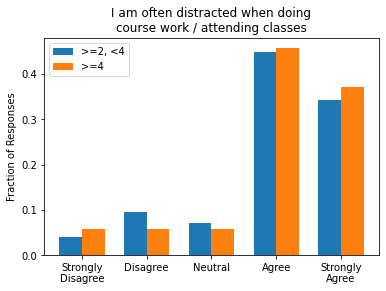

MannwhitneyuResult(statistic=3319.0, pvalue=0.33524204757778564)
>=2, <4 3.96
>=4 4.03
Cohen's d = -0.064


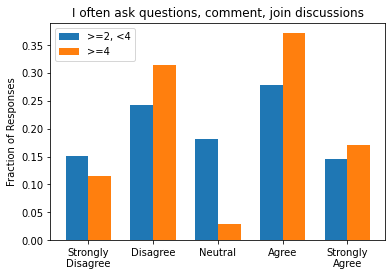

MannwhitneyuResult(statistic=3239.5, pvalue=0.2648418227666749)
>=2, <4 3.03
>=4 3.17
Cohen's d = -0.11
-----------------------------------
paf
4    0.338374
3    0.284499
5    0.218336
6    0.102079
7    0.054820
9    0.000945
8    0.000945
Name: num_methods, dtype: float64
>=3, <4 (301, 43)
>=4 (757, 43)


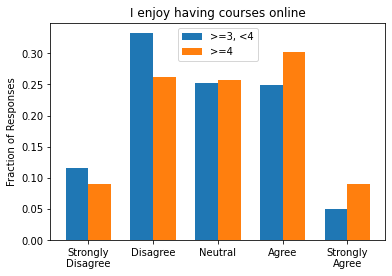

MannwhitneyuResult(statistic=99486.0, pvalue=0.0004358216074327955)
>=3, <4 2.78
>=4 3.04
Cohen's d = -0.23


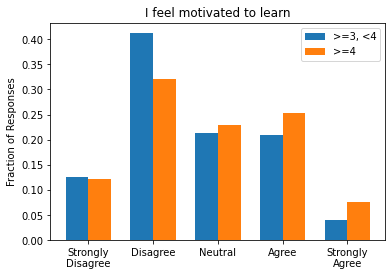

MannwhitneyuResult(statistic=101954.5, pvalue=0.002826562781252112)
>=3, <4 2.62
>=4 2.84
Cohen's d = -0.19


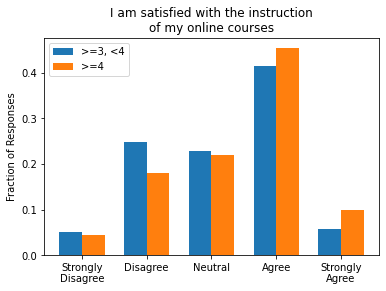

MannwhitneyuResult(statistic=101484.5, pvalue=0.0016596766211340974)
>=3, <4 3.18
>=4 3.38
Cohen's d = -0.2


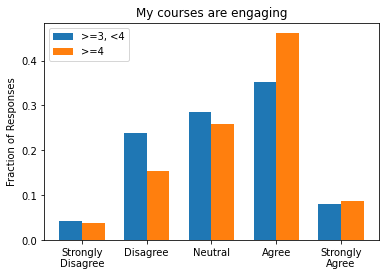

MannwhitneyuResult(statistic=99597.5, pvalue=0.00036542798059406356)
>=3, <4 3.19
>=4 3.4
Cohen's d = -0.22


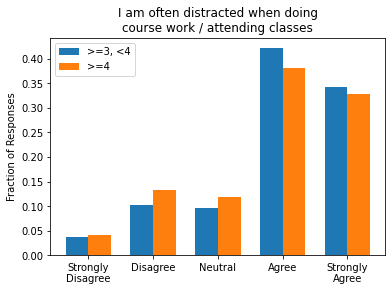

MannwhitneyuResult(statistic=108710.5, pvalue=0.10994576390649063)
>=3, <4 3.93
>=4 3.82
Cohen's d = 0.094


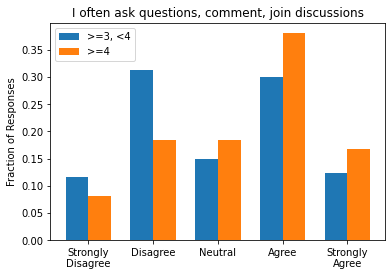

MannwhitneyuResult(statistic=95132.5, pvalue=7.201001368086881e-06)
>=3, <4 3.0
>=4 3.37
Cohen's d = -0.3
>=3, <5 (659, 43)
>=5 (399, 43)


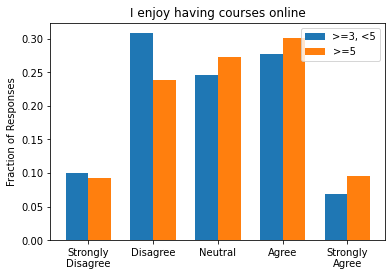

MannwhitneyuResult(statistic=120770.5, pvalue=0.010841323641949927)
>=3, <5 2.91
>=5 3.07
Cohen's d = -0.14


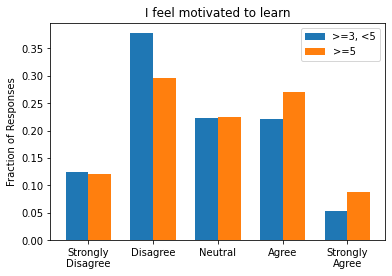

MannwhitneyuResult(statistic=118240.5, pvalue=0.0022118809365389075)
>=3, <5 2.7
>=5 2.91
Cohen's d = -0.18


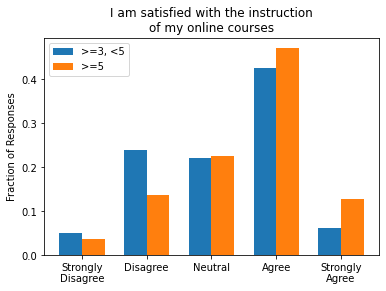

MannwhitneyuResult(statistic=110405.0, pvalue=1.8500548902216058e-06)
>=3, <5 3.21
>=5 3.51
Cohen's d = -0.3


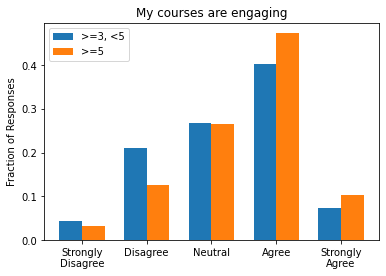

MannwhitneyuResult(statistic=114524.0, pvalue=0.00010032145188423238)
>=3, <5 3.25
>=5 3.49
Cohen's d = -0.24


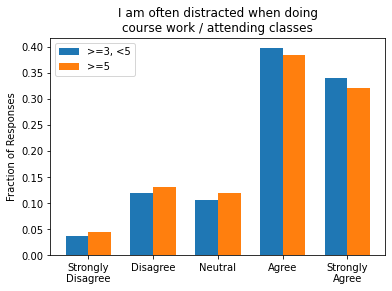

MannwhitneyuResult(statistic=126670.0, pvalue=0.14670835393726284)
>=3, <5 3.88
>=5 3.8
Cohen's d = 0.071


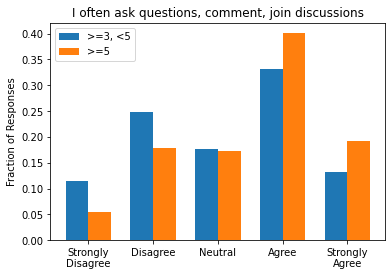

MannwhitneyuResult(statistic=109107.0, pvalue=7.763955060341524e-07)
>=3, <5 3.12
>=5 3.5
Cohen's d = -0.31
-----------------------------------


In [540]:
for cat in ugcats:
    num_diversity_controlled(cat, 'num_methods')
    print('-----------------------------------')

o_p
1    0.648370
2    0.288165
3    0.063465
Name: num_techniques, dtype: float64
>=1, <2 (378, 43)
>=2 (205, 43)


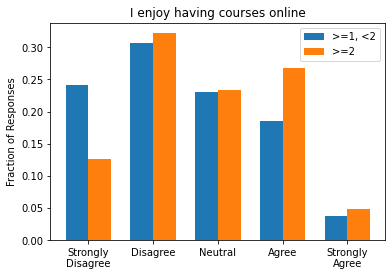

MannwhitneyuResult(statistic=32644.0, pvalue=0.000594319630399116)
>=1, <2 2.47
>=2 2.79
Cohen's d = -0.28


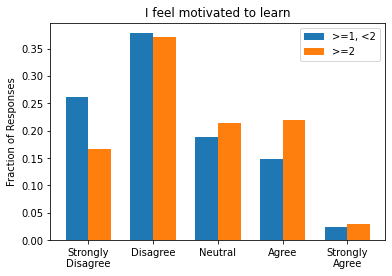

MannwhitneyuResult(statistic=33053.0, pvalue=0.0011370509907054971)
>=1, <2 2.29
>=2 2.58
Cohen's d = -0.26


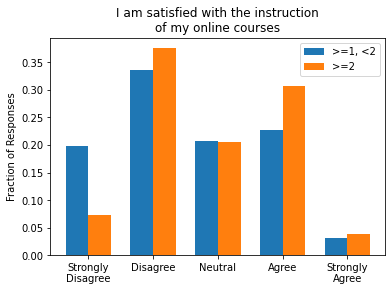

MannwhitneyuResult(statistic=32816.0, pvalue=0.0007647464535553628)
>=1, <2 2.56
>=2 2.86
Cohen's d = -0.28


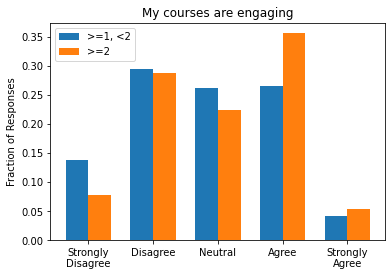

MannwhitneyuResult(statistic=34110.5, pvalue=0.006722358012628625)
>=1, <2 2.78
>=2 3.02
Cohen's d = -0.22


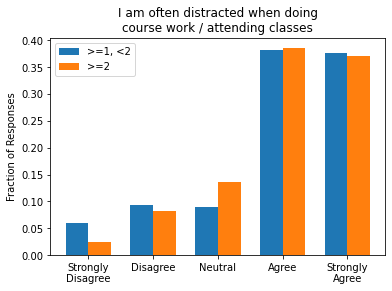

MannwhitneyuResult(statistic=38356.0, pvalue=0.4160179207003128)
>=1, <2 3.92
>=2 4.0
Cohen's d = -0.068


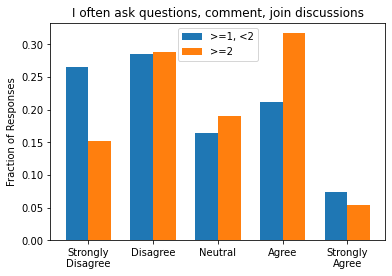

MannwhitneyuResult(statistic=33379.0, pvalue=0.002232412101457688)
>=1, <2 2.54
>=2 2.83
Cohen's d = -0.23
>=1, <3 (546, 43)
>=3 (37, 43)


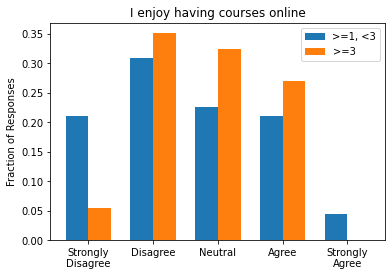

MannwhitneyuResult(statistic=8702.5, pvalue=0.07285188816518605)
>=1, <3 2.57
>=3 2.81
Cohen's d = -0.21


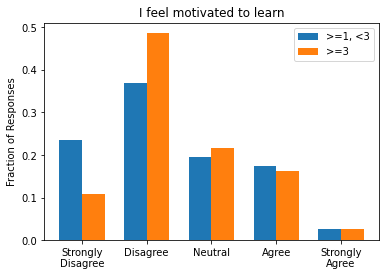

MannwhitneyuResult(statistic=9299.0, pvalue=0.19997084977940183)
>=1, <3 2.38
>=3 2.51
Cohen's d = -0.12


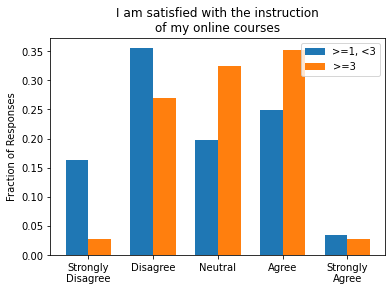

MannwhitneyuResult(statistic=7750.0, pvalue=0.006932373556256115)
>=1, <3 2.64
>=3 3.08
Cohen's d = -0.4


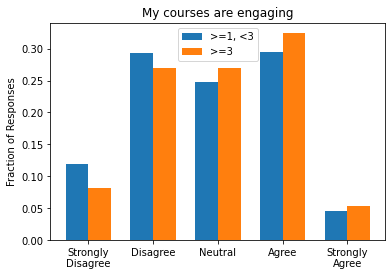

MannwhitneyuResult(statistic=9376.5, pvalue=0.22472340517385447)
>=1, <3 2.86
>=3 3.0
Cohen's d = -0.13


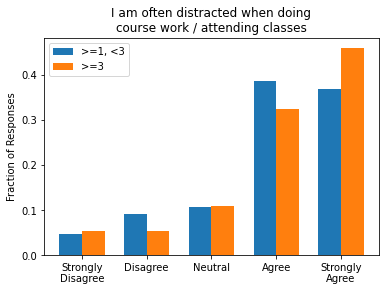

MannwhitneyuResult(statistic=9206.5, pvalue=0.16957114128464096)
>=1, <3 3.94
>=3 4.08
Cohen's d = -0.13


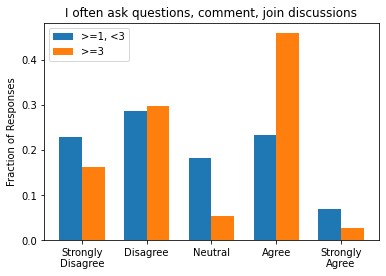

MannwhitneyuResult(statistic=8858.0, pvalue=0.09860491964579554)
>=1, <3 2.63
>=3 2.89
Cohen's d = -0.21
-----------------------------------
o_i
1    0.701230
2    0.261863
3    0.036907
Name: num_techniques, dtype: float64
>=1, <2 (399, 43)
>=2 (170, 43)


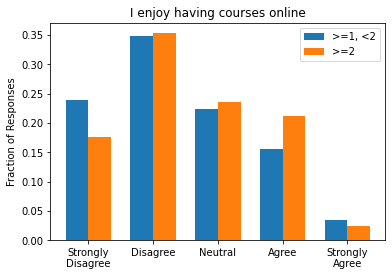

MannwhitneyuResult(statistic=31083.0, pvalue=0.050930036701616166)
>=1, <2 2.4
>=2 2.55
Cohen's d = -0.14


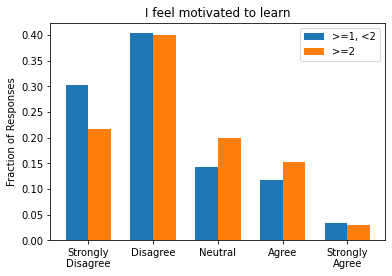

MannwhitneyuResult(statistic=29945.0, pvalue=0.010120553949322176)
>=1, <2 2.17
>=2 2.38
Cohen's d = -0.19


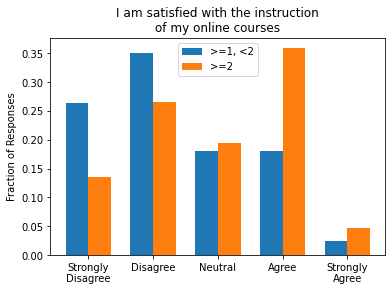

MannwhitneyuResult(statistic=24789.5, pvalue=7.324295027812105e-08)
>=1, <2 2.35
>=2 2.92
Cohen's d = -0.5


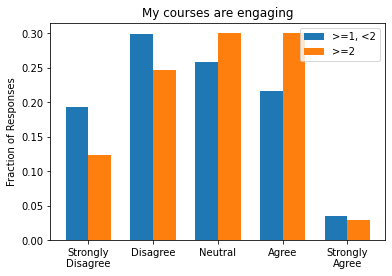

MannwhitneyuResult(statistic=29264.0, pvalue=0.003741977638240086)
>=1, <2 2.6
>=2 2.86
Cohen's d = -0.24


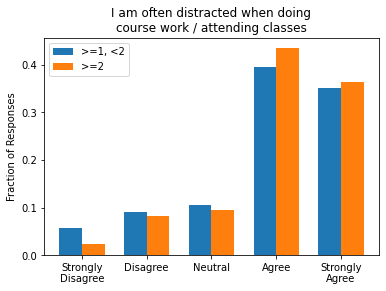

MannwhitneyuResult(statistic=32212.0, pvalue=0.15675942403377296)
>=1, <2 3.89
>=2 4.04
Cohen's d = -0.13


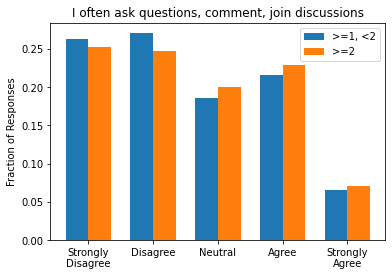

MannwhitneyuResult(statistic=32892.5, pvalue=0.2791777815465346)
>=1, <2 2.55
>=2 2.62
Cohen's d = -0.054
>=1, <3 (548, 43)
>=3 (21, 43)


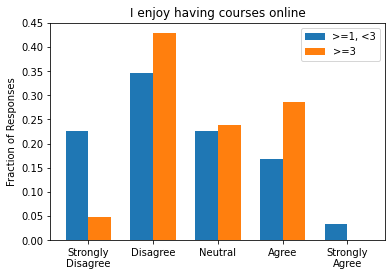

MannwhitneyuResult(statistic=4691.0, pvalue=0.06806954346634422)
>=1, <3 2.43
>=3 2.76
Cohen's d = -0.3


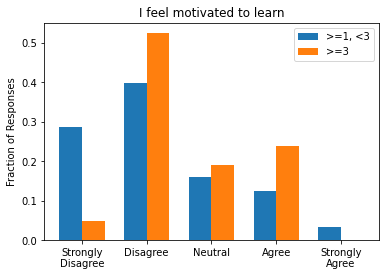

MannwhitneyuResult(statistic=4349.5, pvalue=0.023088331894130315)
>=1, <3 2.22
>=3 2.62
Cohen's d = -0.37


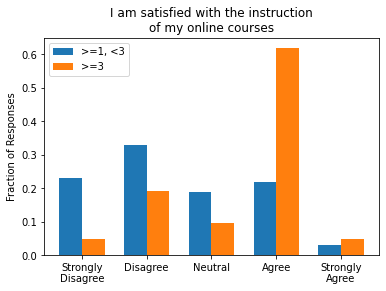

MannwhitneyuResult(statistic=3193.0, pvalue=0.0001709780148771533)
>=1, <3 2.49
>=3 3.43
Cohen's d = -0.82


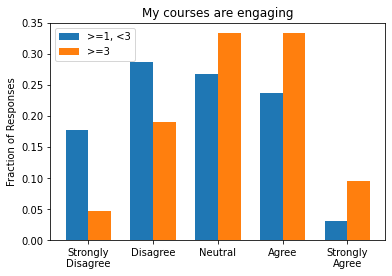

MannwhitneyuResult(statistic=4124.0, pvalue=0.01144859920638276)
>=1, <3 2.66
>=3 3.24
Cohen's d = -0.52


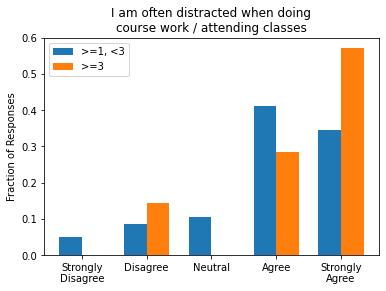

MannwhitneyuResult(statistic=4450.5, pvalue=0.030554073287434234)
>=1, <3 3.92
>=3 4.29
Cohen's d = -0.33


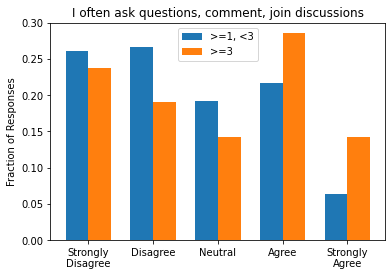

MannwhitneyuResult(statistic=4949.5, pvalue=0.13181520739615987)
>=1, <3 2.56
>=3 2.9
Cohen's d = -0.27
-----------------------------------
o_a
1    0.963855
2    0.030120
3    0.006024
Name: num_techniques, dtype: float64
>=1, <2 (160, 43)
>=2 (6, 43)


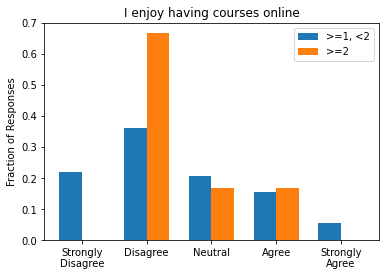

MannwhitneyuResult(statistic=456.0, pvalue=0.4163326909251042)
>=1, <2 2.47
>=2 2.5
Cohen's d = -0.027


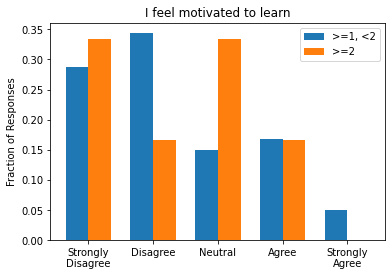

MannwhitneyuResult(statistic=476.0, pvalue=0.4874667712357408)
>=1, <2 2.35
>=2 2.33
Cohen's d = 0.014


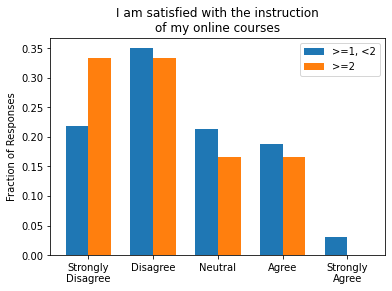

MannwhitneyuResult(statistic=409.0, pvalue=0.2635814424272497)
>=1, <2 2.46
>=2 2.17
Cohen's d = 0.26


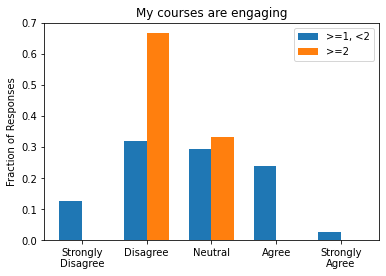

MannwhitneyuResult(statistic=371.0, pvalue=0.16442222321555433)
>=1, <2 2.72
>=2 2.33
Cohen's d = 0.37


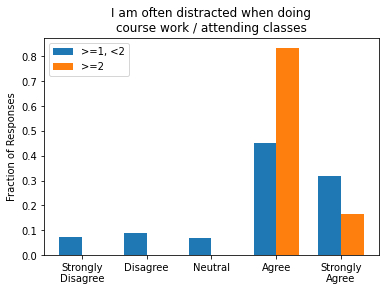

MannwhitneyuResult(statistic=460.5, pvalue=0.42998397281614964)
>=1, <2 3.85
>=2 4.17
Cohen's d = -0.27


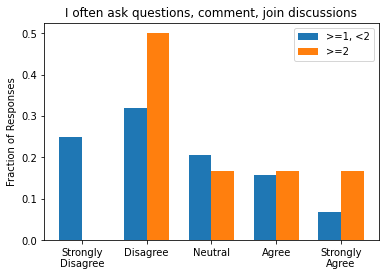

MannwhitneyuResult(statistic=365.0, pvalue=0.15329952962967186)
>=1, <2 2.48
>=2 3.0
Cohen's d = -0.43
>=1, <3 (165, 43)
>=3 (1, 43)


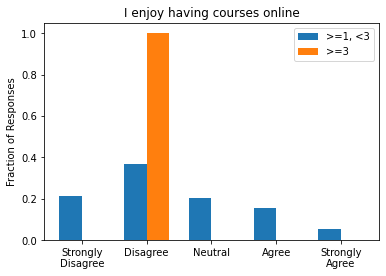

MannwhitneyuResult(statistic=65.5, pvalue=0.36023516431731983)
>=1, <3 2.47
>=3 2.0
Cohen's d = nan


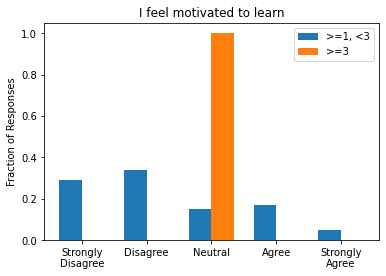

MannwhitneyuResult(statistic=48.5, pvalue=0.23409451885495985)
>=1, <3 2.35
>=3 3.0
Cohen's d = nan


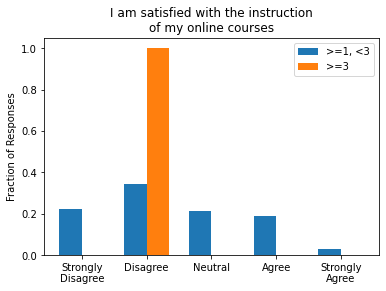

MannwhitneyuResult(statistic=65.5, pvalue=0.3605542560710828)
>=1, <3 2.45
>=3 2.0
Cohen's d = nan


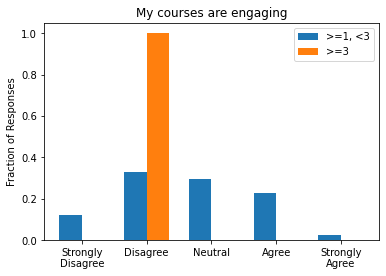

MannwhitneyuResult(statistic=47.0, pvalue=0.22369751057940673)
>=1, <3 2.71
>=3 2.0
Cohen's d = nan


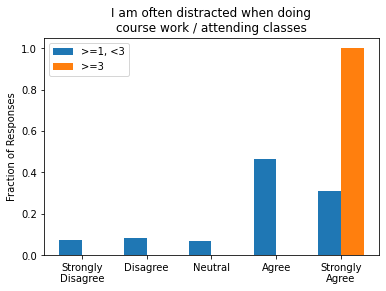

MannwhitneyuResult(statistic=25.5, pvalue=0.10286602668146222)
>=1, <3 3.85
>=3 5.0
Cohen's d = nan


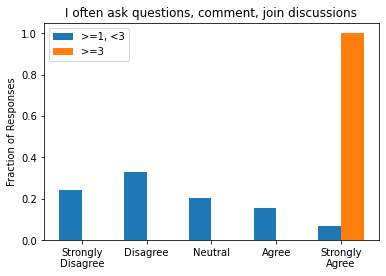

MannwhitneyuResult(statistic=5.5, pvalue=0.049712727377217325)
>=1, <3 2.48
>=3 5.0
Cohen's d = nan
-----------------------------------
o_pi
3    0.384961
2    0.346801
4    0.185185
5    0.074074
6    0.008979
Name: num_techniques, dtype: float64
>=2, <3 (309, 43)
>=3 (582, 43)


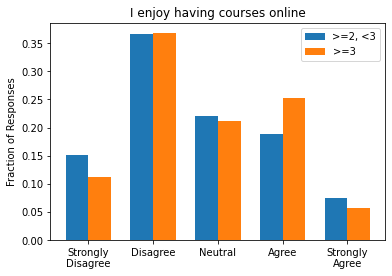

MannwhitneyuResult(statistic=84703.0, pvalue=0.06915272973032163)
>=2, <3 2.67
>=3 2.77
Cohen's d = -0.096


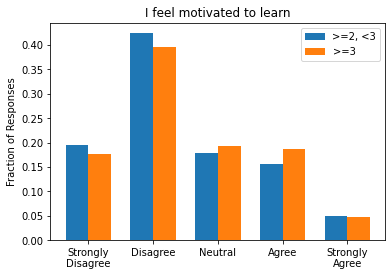

MannwhitneyuResult(statistic=85539.0, pvalue=0.10526943015035611)
>=2, <3 2.44
>=3 2.53
Cohen's d = -0.084


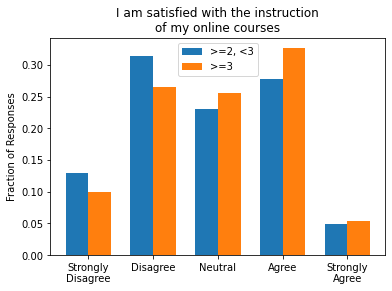

MannwhitneyuResult(statistic=82310.0, pvalue=0.015532249031437377)
>=2, <3 2.8
>=3 2.97
Cohen's d = -0.15


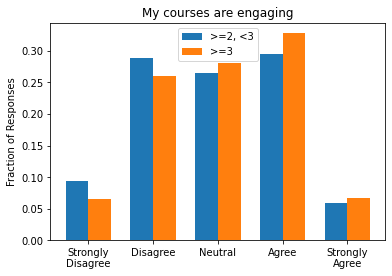

MannwhitneyuResult(statistic=83681.0, pvalue=0.03822785017292169)
>=2, <3 2.94
>=3 3.07
Cohen's d = -0.13


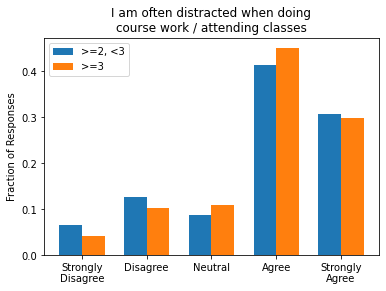

MannwhitneyuResult(statistic=88121.0, pvalue=0.3007724440109195)
>=2, <3 3.77
>=3 3.86
Cohen's d = -0.076


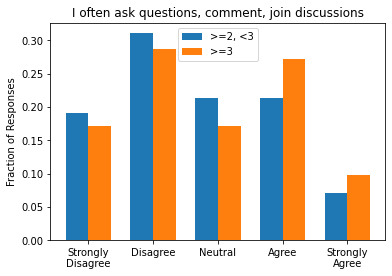

MannwhitneyuResult(statistic=83101.0, pvalue=0.027582844145347334)
>=2, <3 2.66
>=3 2.84
Cohen's d = -0.14
>=2, <4 (652, 43)
>=4 (239, 43)


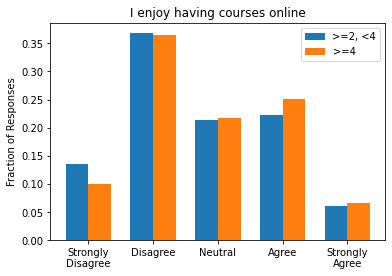

MannwhitneyuResult(statistic=73524.0, pvalue=0.09011321305357217)
>=2, <4 2.71
>=4 2.82
Cohen's d = -0.1


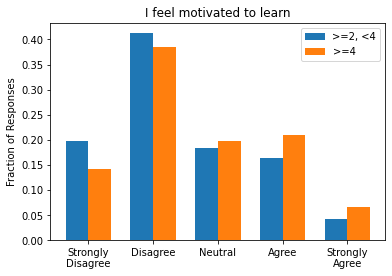

MannwhitneyuResult(statistic=69076.0, pvalue=0.0033208698915680197)
>=2, <4 2.44
>=4 2.67
Cohen's d = -0.21


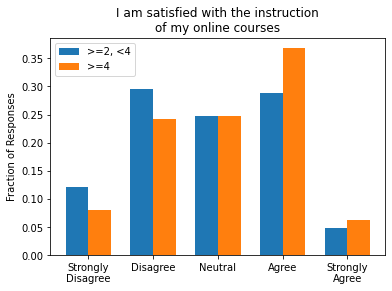

MannwhitneyuResult(statistic=68177.5, pvalue=0.0015176843322870243)
>=2, <4 2.85
>=4 3.09
Cohen's d = -0.22


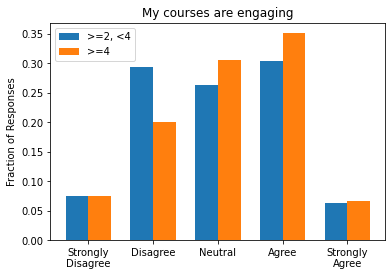

MannwhitneyuResult(statistic=71444.0, pvalue=0.024189719815676684)
>=2, <4 2.98
>=4 3.13
Cohen's d = -0.14


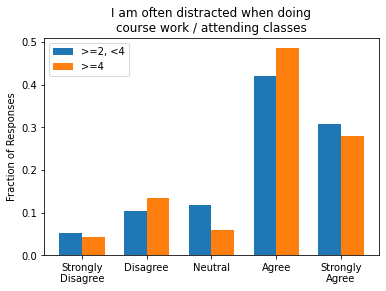

MannwhitneyuResult(statistic=77650.5, pvalue=0.4672924604582696)
>=2, <4 3.83
>=4 3.83
Cohen's d = 0.0012


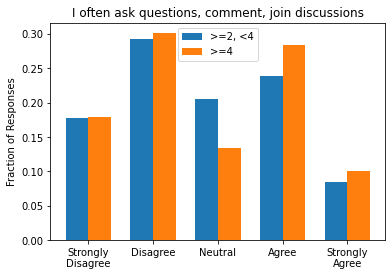

MannwhitneyuResult(statistic=75858.0, pvalue=0.2672670174189412)
>=2, <4 2.76
>=4 2.82
Cohen's d = -0.052
-----------------------------------
o_pa
2    0.583072
3    0.329154
4    0.087774
Name: num_techniques, dtype: float64
>=2, <3 (372, 43)
>=3 (266, 43)


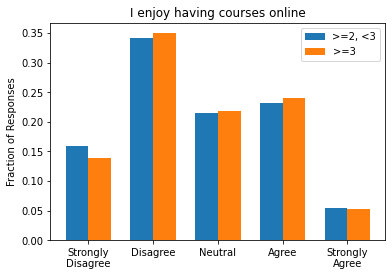

MannwhitneyuResult(statistic=48516.0, pvalue=0.33254320899059486)
>=2, <3 2.68
>=3 2.72
Cohen's d = -0.033


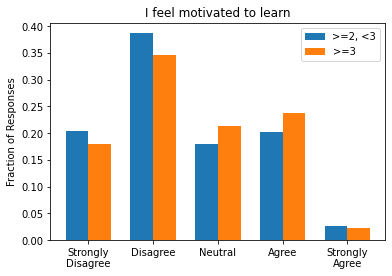

MannwhitneyuResult(statistic=46417.0, pvalue=0.08292043431853258)
>=2, <3 2.46
>=3 2.58
Cohen's d = -0.1


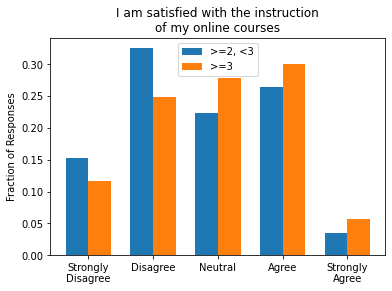

MannwhitneyuResult(statistic=43788.0, pvalue=0.0052080262631151834)
>=2, <3 2.7
>=3 2.93
Cohen's d = -0.21


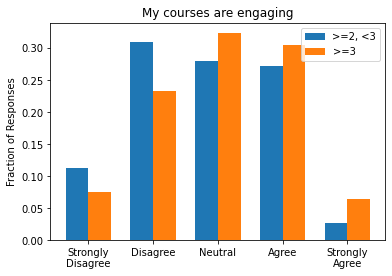

MannwhitneyuResult(statistic=42918.5, pvalue=0.0015124940209991834)
>=2, <3 2.79
>=3 3.05
Cohen's d = -0.25


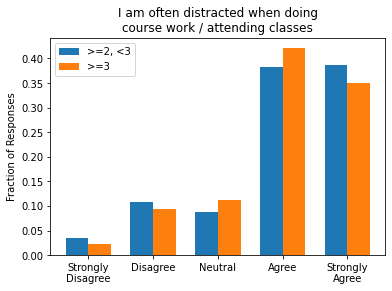

MannwhitneyuResult(statistic=48433.0, pvalue=0.3144963014250006)
>=2, <3 3.98
>=3 3.98
Cohen's d = -0.0025


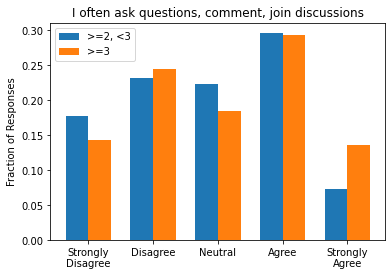

MannwhitneyuResult(statistic=45605.5, pvalue=0.041596202095820704)
>=2, <3 2.85
>=3 3.03
Cohen's d = -0.14
>=2, <4 (582, 43)
>=4 (56, 43)


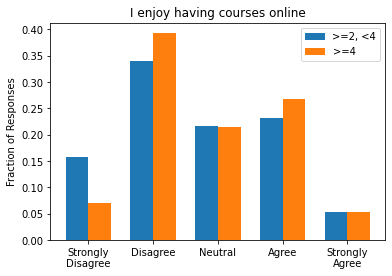

MannwhitneyuResult(statistic=15018.0, pvalue=0.1576180091355155)
>=2, <4 2.68
>=4 2.84
Cohen's d = -0.14


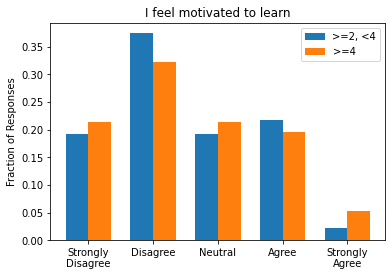

MannwhitneyuResult(statistic=16023.0, pvalue=0.4148367201776659)
>=2, <4 2.5
>=4 2.55
Cohen's d = -0.045


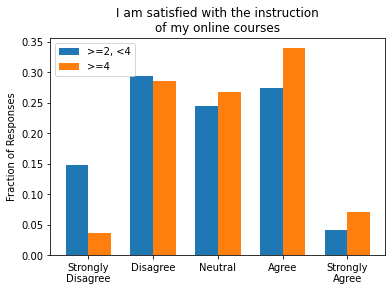

MannwhitneyuResult(statistic=13470.5, pvalue=0.013308614128854115)
>=2, <4 2.77
>=4 3.12
Cohen's d = -0.32


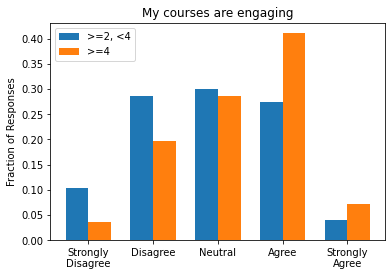

MannwhitneyuResult(statistic=12640.5, pvalue=0.001988434087563711)
>=2, <4 2.86
>=4 3.29
Cohen's d = -0.41


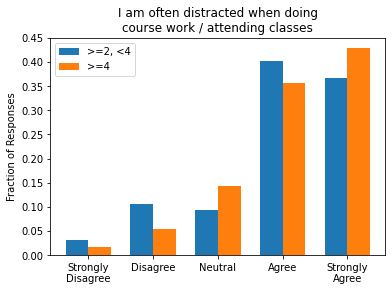

MannwhitneyuResult(statistic=15124.0, pvalue=0.17206896337339656)
>=2, <4 3.97
>=4 4.12
Cohen's d = -0.15


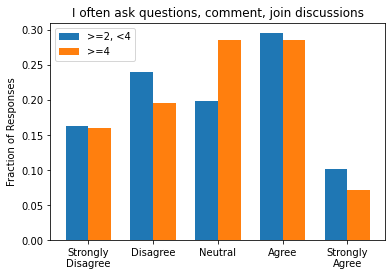

MannwhitneyuResult(statistic=16132.5, pvalue=0.44941324068747934)
>=2, <4 2.93
>=4 2.91
Cohen's d = 0.016
-----------------------------------
o_ia
2    0.659686
3    0.261780
4    0.078534
Name: num_techniques, dtype: float64
>=2, <3 (126, 43)
>=3 (65, 43)


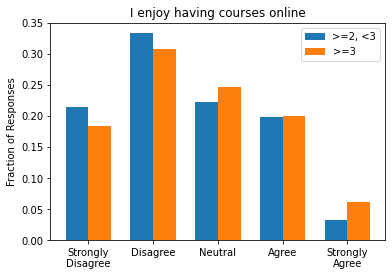

MannwhitneyuResult(statistic=3820.5, pvalue=0.21713860105300442)
>=2, <3 2.5
>=3 2.65
Cohen's d = -0.13


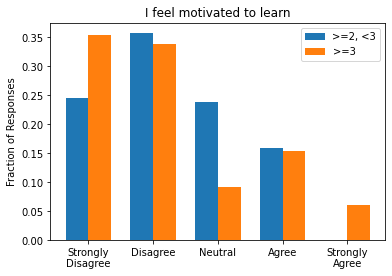

MannwhitneyuResult(statistic=3743.5, pvalue=0.15651369477147115)
>=2, <3 2.31
>=3 2.23
Cohen's d = 0.071


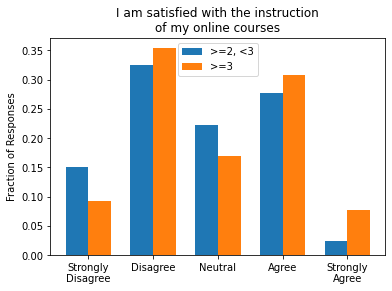

MannwhitneyuResult(statistic=3678.0, pvalue=0.11612841010568364)
>=2, <3 2.7
>=3 2.92
Cohen's d = -0.2


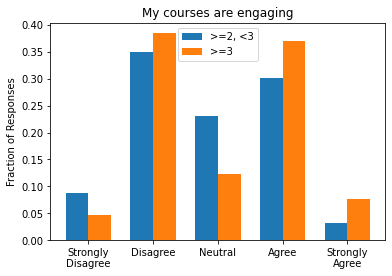

MannwhitneyuResult(statistic=3700.5, pvalue=0.12705980934469574)
>=2, <3 2.84
>=3 3.05
Cohen's d = -0.19


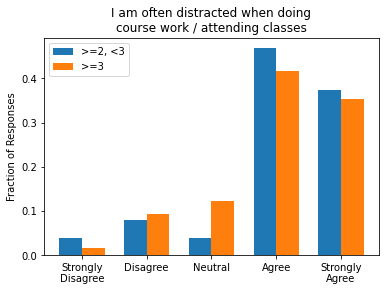

MannwhitneyuResult(statistic=3896.5, pvalue=0.2774946551756303)
>=2, <3 4.06
>=3 4.0
Cohen's d = 0.054


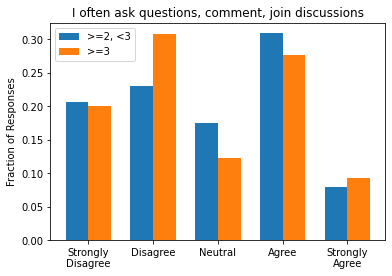

MannwhitneyuResult(statistic=3970.0, pvalue=0.36164710801705136)
>=2, <3 2.83
>=3 2.75
Cohen's d = 0.055
>=2, <4 (176, 43)
>=4 (15, 43)


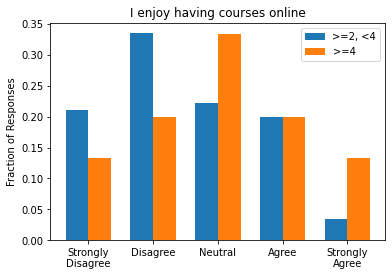

MannwhitneyuResult(statistic=1022.5, pvalue=0.06774845679995878)
>=2, <4 2.51
>=4 3.0
Cohen's d = -0.43


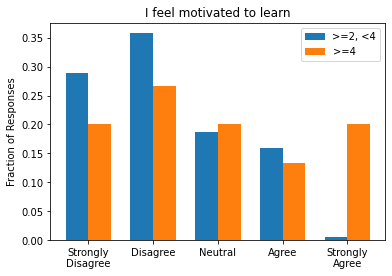

MannwhitneyuResult(statistic=993.5, pvalue=0.049428604492371395)
>=2, <4 2.23
>=4 2.87
Cohen's d = -0.58


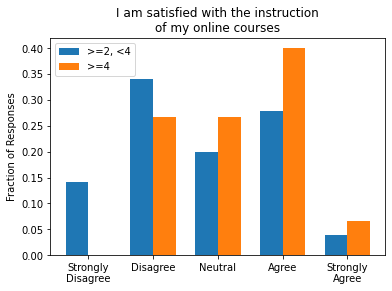

MannwhitneyuResult(statistic=970.5, pvalue=0.03894747945863435)
>=2, <4 2.73
>=4 3.27
Cohen's d = -0.48


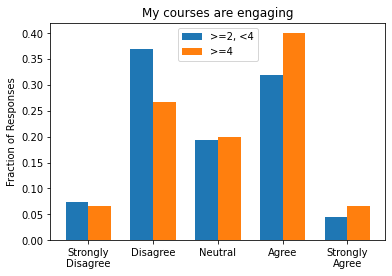

MannwhitneyuResult(statistic=1154.5, pvalue=0.20012569530276114)
>=2, <4 2.89
>=4 3.13
Cohen's d = -0.22


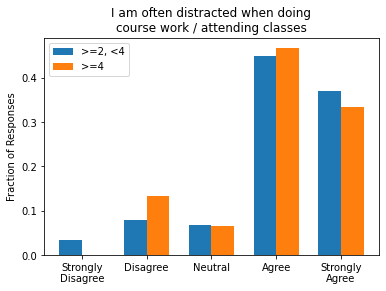

MannwhitneyuResult(statistic=1270.0, pvalue=0.39745966420729917)
>=2, <4 4.04
>=4 4.0
Cohen's d = 0.039


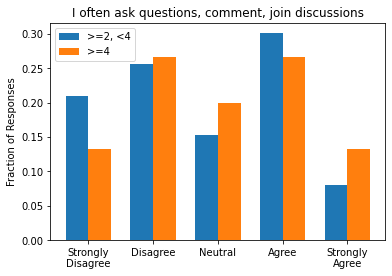

MannwhitneyuResult(statistic=1198.5, pvalue=0.27222968923563745)
>=2, <4 2.78
>=4 3.0
Cohen's d = -0.17
-----------------------------------
o_pia
4    0.296736
3    0.243917
5    0.239169
6    0.138872
7    0.080119
8    0.001187
Name: num_techniques, dtype: float64
>=3, <4 (411, 43)
>=4 (1274, 43)


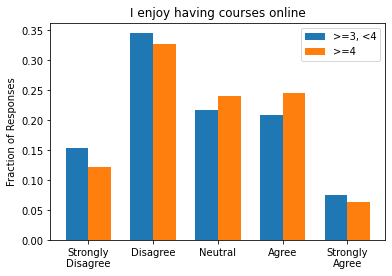

MannwhitneyuResult(statistic=248606.5, pvalue=0.05570057747527824)
>=3, <4 2.71
>=4 2.8
Cohen's d = -0.082


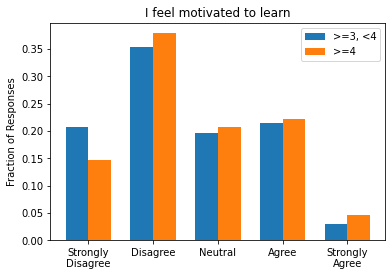

MannwhitneyuResult(statistic=244497.5, pvalue=0.017929964863241665)
>=3, <4 2.51
>=4 2.64
Cohen's d = -0.12


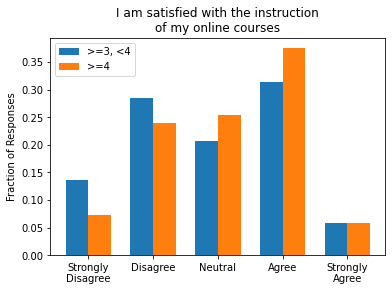

MannwhitneyuResult(statistic=232685.5, pvalue=0.0002037245565466652)
>=3, <4 2.87
>=4 3.11
Cohen's d = -0.21


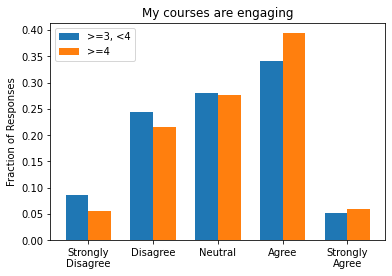

MannwhitneyuResult(statistic=240644.0, pvalue=0.004889367579054212)
>=3, <4 3.03
>=4 3.19
Cohen's d = -0.15


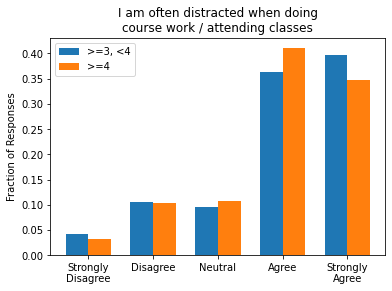

MannwhitneyuResult(statistic=252663.0, pvalue=0.12897283998108788)
>=3, <4 3.97
>=4 3.94
Cohen's d = 0.029


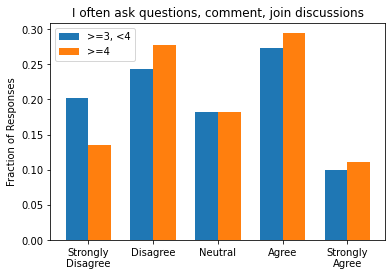

MannwhitneyuResult(statistic=245427.5, pvalue=0.024773975164268765)
>=3, <4 2.82
>=4 2.97
Cohen's d = -0.11
>=3, <5 (911, 43)
>=5 (774, 43)


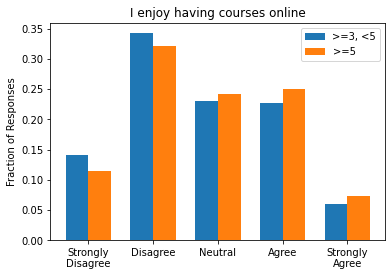

MannwhitneyuResult(statistic=330996.5, pvalue=0.012524402675775733)
>=3, <5 2.72
>=5 2.85
Cohen's d = -0.11


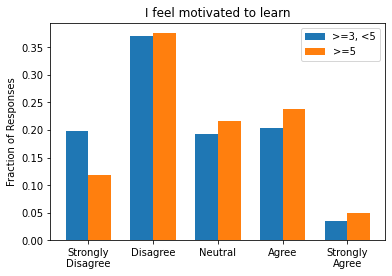

MannwhitneyuResult(statistic=314360.5, pvalue=3.295937204995151e-05)
>=3, <5 2.51
>=5 2.72
Cohen's d = -0.19


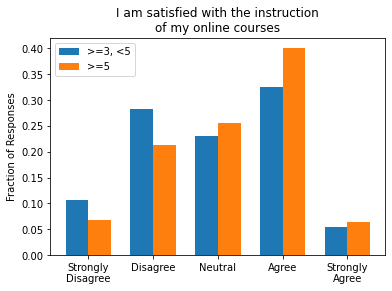

MannwhitneyuResult(statistic=309598.5, pvalue=3.495554111411149e-06)
>=3, <5 2.94
>=5 3.18
Cohen's d = -0.22


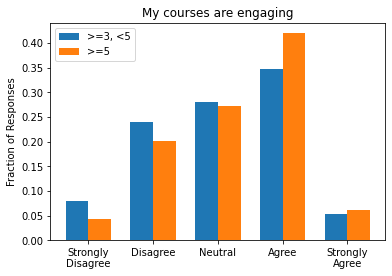

MannwhitneyuResult(statistic=315917.5, pvalue=5.797779048654034e-05)
>=3, <5 3.06
>=5 3.25
Cohen's d = -0.19


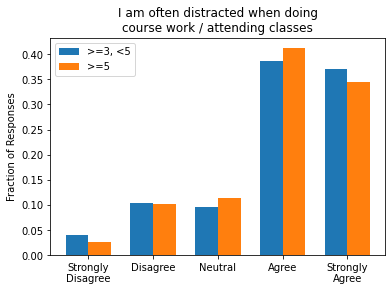

MannwhitneyuResult(statistic=347149.5, pvalue=0.2821462720408284)
>=3, <5 3.94
>=5 3.95
Cohen's d = -0.0016


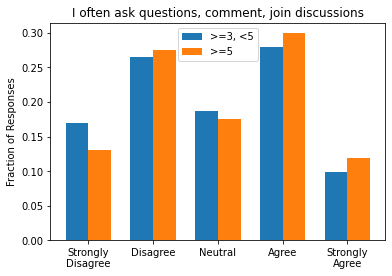

MannwhitneyuResult(statistic=332956.5, pvalue=0.021427206698109855)
>=3, <5 2.87
>=5 3.0
Cohen's d = -0.1
-----------------------------------


In [541]:
for cat in ugcats_o:
    num_diversity_controlled(cat, 'num_techniques')
    print('-----------------------------------')

## Effects of diversity of methods and techniques, controlling for number

In [542]:
for cat in ugcats:
    print(cat.name)
    print(cat['num_methods'].value_counts(normalize=True))

p
1    0.778656
2    0.167325
0    0.047431
3    0.005270
4    0.001318
Name: num_methods, dtype: float64
a
1    0.781362
2    0.139785
0    0.078853
Name: num_methods, dtype: float64
f
1    0.696517
2    0.213930
0    0.049751
3    0.034826
4    0.004975
Name: num_methods, dtype: float64
pa
2    0.584459
3    0.326014
4    0.070946
0    0.018581
Name: num_methods, dtype: float64
pf
2    0.497778
3    0.345185
4    0.120000
5    0.025185
0    0.011852
Name: num_methods, dtype: float64
af
2    0.525000
3    0.300000
4    0.141667
0    0.029167
5    0.004167
Name: num_methods, dtype: float64
paf
4    0.331175
3    0.278446
5    0.213691
6    0.099907
7    0.053654
0    0.021277
9    0.000925
8    0.000925
Name: num_methods, dtype: float64


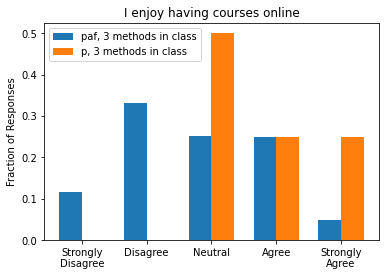

MannwhitneyuResult(statistic=316.0, pvalue=0.04563249628461579)
paf, 3 methods in class 2.78
p, 3 methods in class 3.75
Cohen's d = -0.88


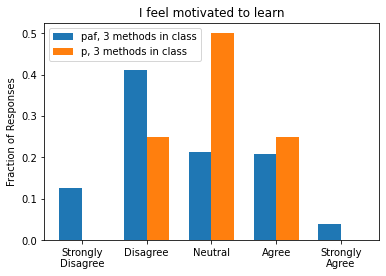

MannwhitneyuResult(statistic=458.5, pvalue=0.19610521563102573)
paf, 3 methods in class 2.62
p, 3 methods in class 3.0
Cohen's d = -0.35


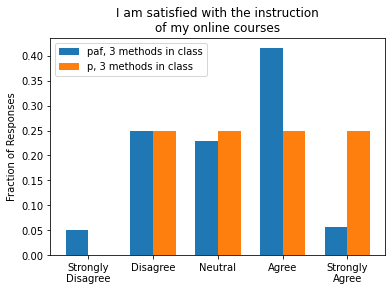

MannwhitneyuResult(statistic=513.0, pvalue=0.2973899716173023)
paf, 3 methods in class 3.18
p, 3 methods in class 3.5
Cohen's d = -0.31


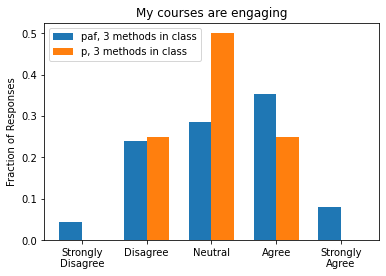

MannwhitneyuResult(statistic=529.0, pvalue=0.33297109507569034)
paf, 3 methods in class 3.19
p, 3 methods in class 3.0
Cohen's d = 0.18


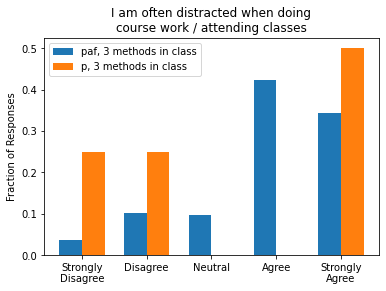

MannwhitneyuResult(statistic=531.0, pvalue=0.33443111216235955)
paf, 3 methods in class 3.93
p, 3 methods in class 3.25
Cohen's d = 0.62


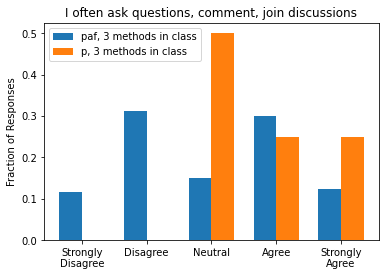

MannwhitneyuResult(statistic=399.5, pvalue=0.11684302328838264)
paf, 3 methods in class 3.0
p, 3 methods in class 3.75
Cohen's d = -0.6


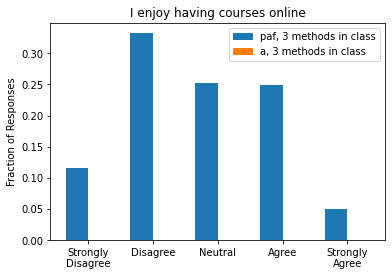

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 3 methods in class 2.78
a, 3 methods in class nan
Cohen's d = nan


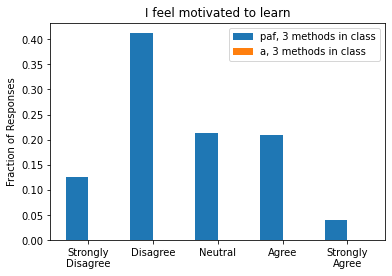

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 3 methods in class 2.62
a, 3 methods in class nan
Cohen's d = nan


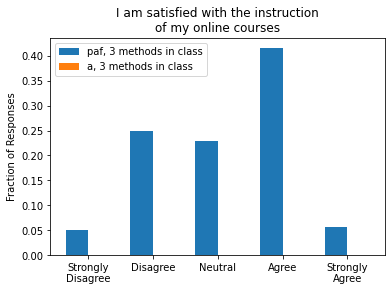

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 3 methods in class 3.18
a, 3 methods in class nan
Cohen's d = nan


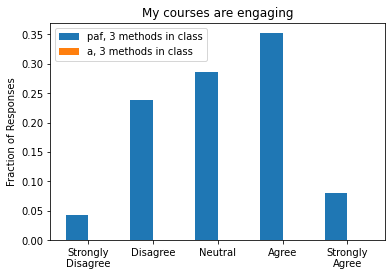

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 3 methods in class 3.19
a, 3 methods in class nan
Cohen's d = nan


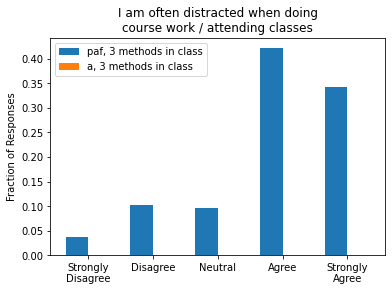

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 3 methods in class 3.93
a, 3 methods in class nan
Cohen's d = nan


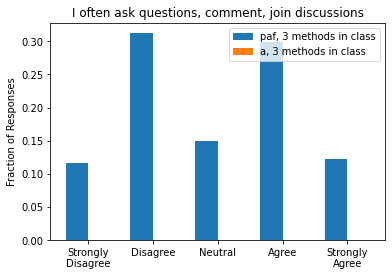

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 3 methods in class 3.0
a, 3 methods in class nan
Cohen's d = nan


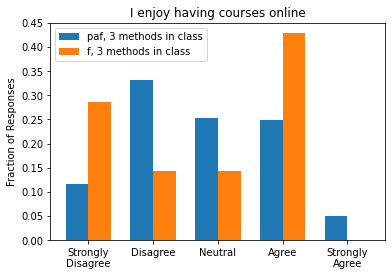

MannwhitneyuResult(statistic=1038.5, pvalue=0.47427983277262015)
paf, 3 methods in class 2.78
f, 3 methods in class 2.71
Cohen's d = 0.063


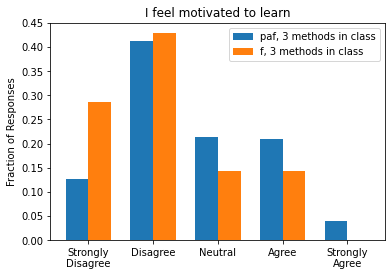

MannwhitneyuResult(statistic=789.5, pvalue=0.11774338494328213)
paf, 3 methods in class 2.62
f, 3 methods in class 2.14
Cohen's d = 0.45


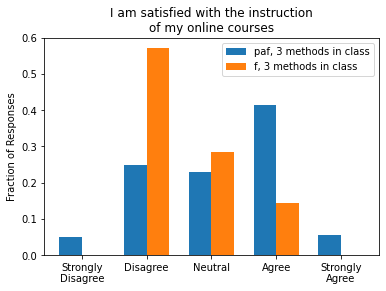

MannwhitneyuResult(statistic=680.5, pvalue=0.04611828013899347)
paf, 3 methods in class 3.18
f, 3 methods in class 2.57
Cohen's d = 0.59


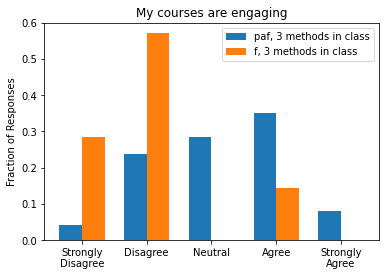

MannwhitneyuResult(statistic=433.0, pvalue=0.0027682996584437753)
paf, 3 methods in class 3.19
f, 3 methods in class 2.0
Cohen's d = 1.2


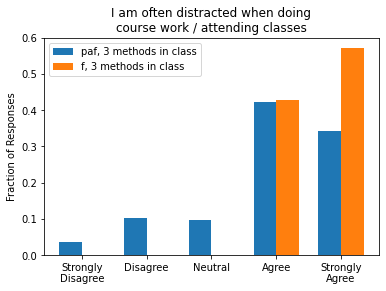

MannwhitneyuResult(statistic=705.5, pvalue=0.05597864871685853)
paf, 3 methods in class 3.93
f, 3 methods in class 4.57
Cohen's d = -0.6


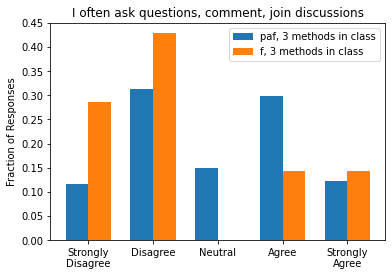

MannwhitneyuResult(statistic=782.5, pvalue=0.11503273792948371)
paf, 3 methods in class 3.0
f, 3 methods in class 2.43
Cohen's d = 0.45


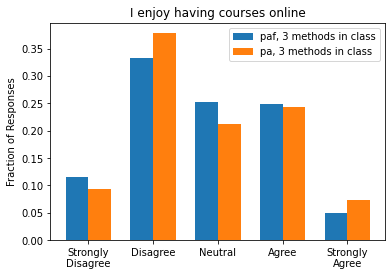

MannwhitneyuResult(statistic=28691.5, pvalue=0.40601224439217914)
paf, 3 methods in class 2.78
pa, 3 methods in class 2.82
Cohen's d = -0.036


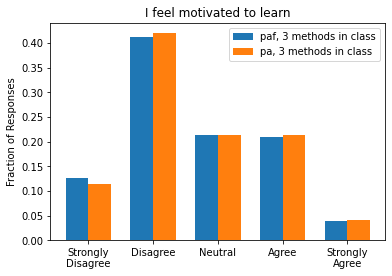

MannwhitneyuResult(statistic=28703.5, pvalue=0.40818272003979683)
paf, 3 methods in class 2.62
pa, 3 methods in class 2.65
Cohen's d = -0.022


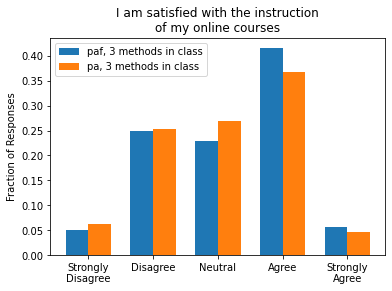

MannwhitneyuResult(statistic=27495.5, pvalue=0.14643082950826247)
paf, 3 methods in class 3.18
pa, 3 methods in class 3.08
Cohen's d = 0.094


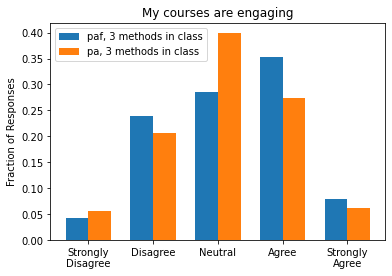

MannwhitneyuResult(statistic=27227.5, pvalue=0.11015763616003021)
paf, 3 methods in class 3.19
pa, 3 methods in class 3.08
Cohen's d = 0.11


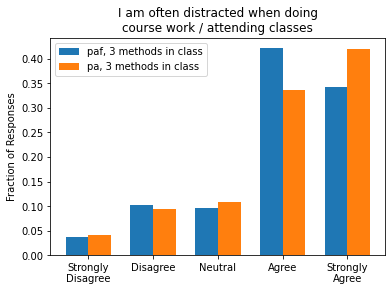

MannwhitneyuResult(statistic=27433.5, pvalue=0.13443232689564288)
paf, 3 methods in class 3.93
pa, 3 methods in class 4.0
Cohen's d = -0.063


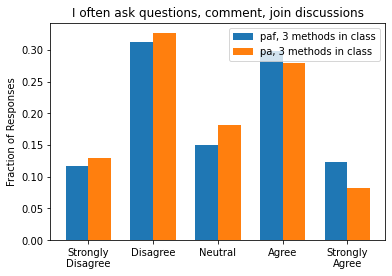

MannwhitneyuResult(statistic=27252.0, pvalue=0.11546589408224961)
paf, 3 methods in class 3.0
pa, 3 methods in class 2.86
Cohen's d = 0.11


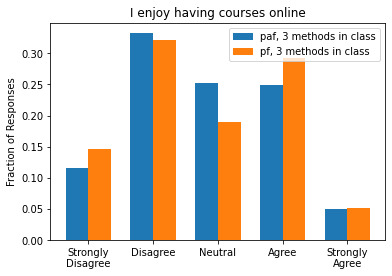

MannwhitneyuResult(statistic=35002.0, pvalue=0.4850465964280924)
paf, 3 methods in class 2.78
pf, 3 methods in class 2.78
Cohen's d = 0.0026


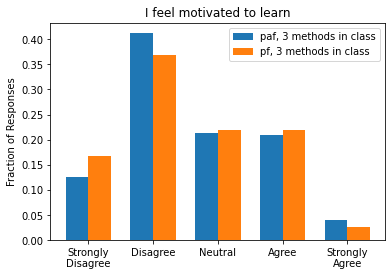

MannwhitneyuResult(statistic=34137.5, pvalue=0.29167090632494264)
paf, 3 methods in class 2.62
pf, 3 methods in class 2.57
Cohen's d = 0.054


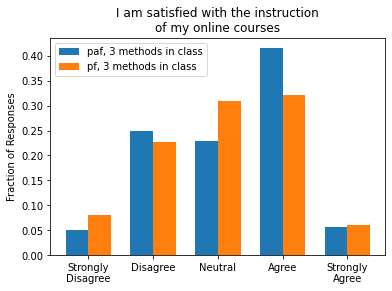

MannwhitneyuResult(statistic=32596.5, pvalue=0.0721273517685875)
paf, 3 methods in class 3.18
pf, 3 methods in class 3.05
Cohen's d = 0.12


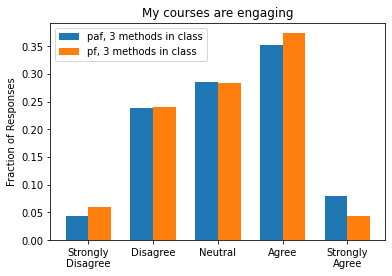

MannwhitneyuResult(statistic=33661.0, pvalue=0.20315857249472696)
paf, 3 methods in class 3.19
pf, 3 methods in class 3.1
Cohen's d = 0.086


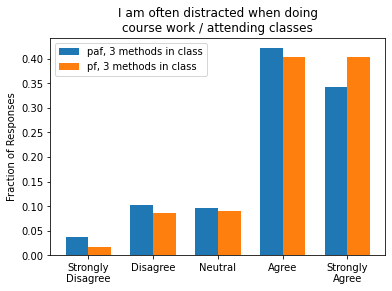

MannwhitneyuResult(statistic=32298.5, pvalue=0.04735498121391632)
paf, 3 methods in class 3.93
pf, 3 methods in class 4.09
Cohen's d = -0.15


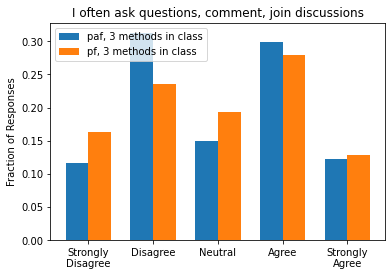

MannwhitneyuResult(statistic=34702.5, pvalue=0.4162402115319422)
paf, 3 methods in class 3.0
pf, 3 methods in class 2.97
Cohen's d = 0.02


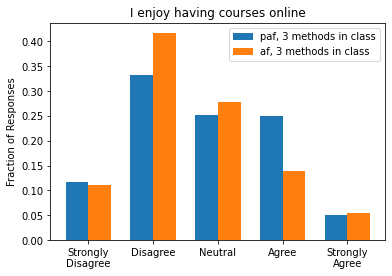

MannwhitneyuResult(statistic=9809.0, pvalue=0.09728719881851428)
paf, 3 methods in class 2.78
af, 3 methods in class 2.61
Cohen's d = 0.16


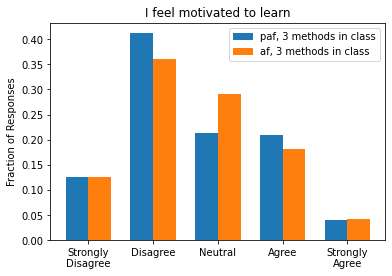

MannwhitneyuResult(statistic=10594.5, pvalue=0.37943764723348394)
paf, 3 methods in class 2.62
af, 3 methods in class 2.65
Cohen's d = -0.026


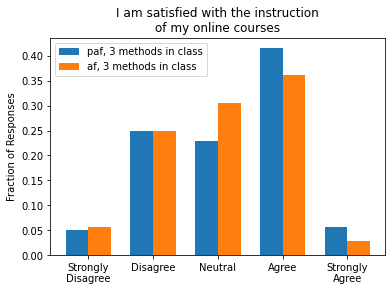

MannwhitneyuResult(statistic=10058.0, pvalue=0.15978560800846925)
paf, 3 methods in class 3.18
af, 3 methods in class 3.06
Cohen's d = 0.12


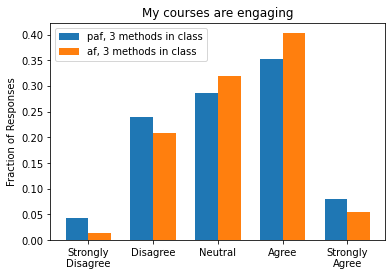

MannwhitneyuResult(statistic=10334.5, pvalue=0.2619107723666724)
paf, 3 methods in class 3.19
af, 3 methods in class 3.28
Cohen's d = -0.091


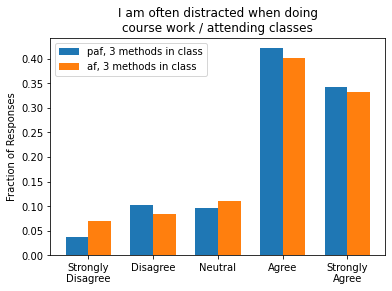

MannwhitneyuResult(statistic=10527.0, pvalue=0.3449701061877961)
paf, 3 methods in class 3.93
af, 3 methods in class 3.85
Cohen's d = 0.075


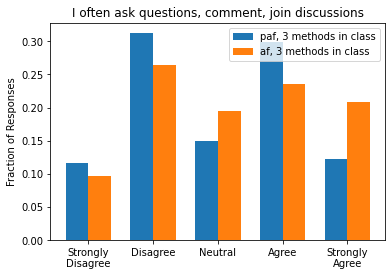

MannwhitneyuResult(statistic=9910.0, pvalue=0.12278306053231736)
paf, 3 methods in class 3.0
af, 3 methods in class 3.19
Cohen's d = -0.15


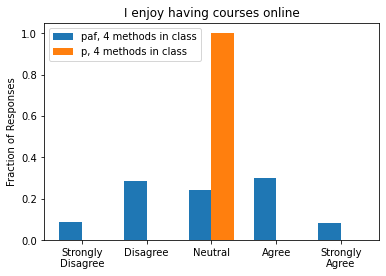

MannwhitneyuResult(statistic=177.0, pvalue=0.49402444409364193)
paf, 4 methods in class 3.01
p, 4 methods in class 3.0
Cohen's d = nan


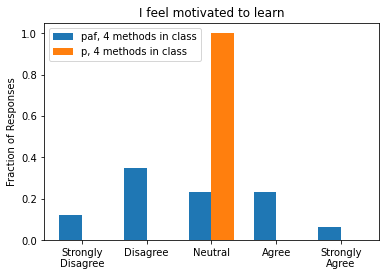

MannwhitneyuResult(statistic=147.5, pvalue=0.37824395154659085)
paf, 4 methods in class 2.77
p, 4 methods in class 3.0
Cohen's d = nan


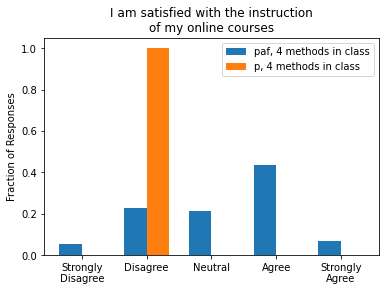

MannwhitneyuResult(statistic=60.0, pvalue=0.11343311260313282)
paf, 4 methods in class 3.23
p, 4 methods in class 2.0
Cohen's d = nan


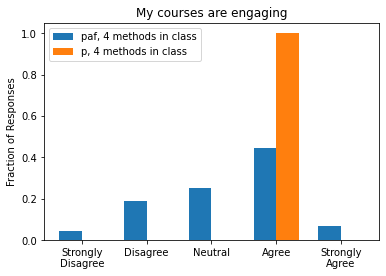

MannwhitneyuResult(statistic=105.0, pvalue=0.22572633184201923)
paf, 4 methods in class 3.31
p, 4 methods in class 4.0
Cohen's d = nan


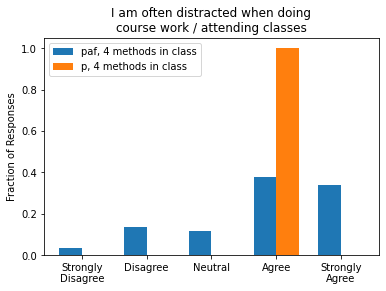

MannwhitneyuResult(statistic=169.5, pvalue=0.4636000583397345)
paf, 4 methods in class 3.85
p, 4 methods in class 4.0
Cohen's d = nan


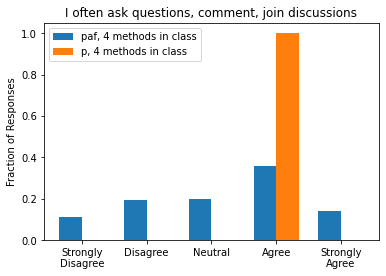

MannwhitneyuResult(statistic=114.0, pvalue=0.25986565898263847)
paf, 4 methods in class 3.22
p, 4 methods in class 4.0
Cohen's d = nan


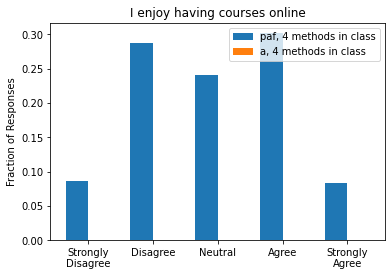

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 4 methods in class 3.01
a, 4 methods in class nan
Cohen's d = nan


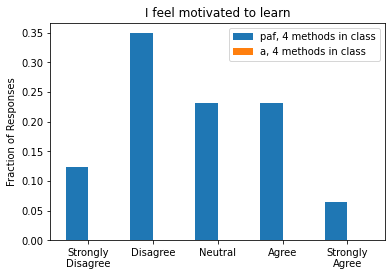

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 4 methods in class 2.77
a, 4 methods in class nan
Cohen's d = nan


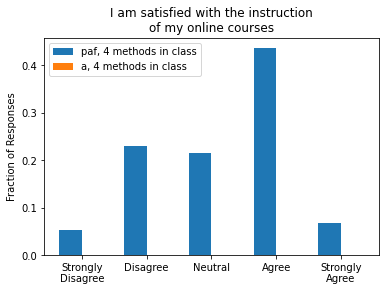

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 4 methods in class 3.23
a, 4 methods in class nan
Cohen's d = nan


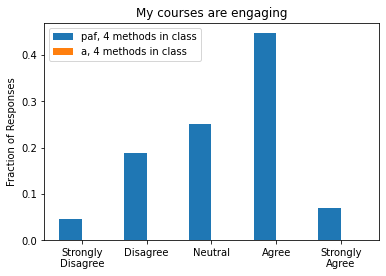

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 4 methods in class 3.31
a, 4 methods in class nan
Cohen's d = nan


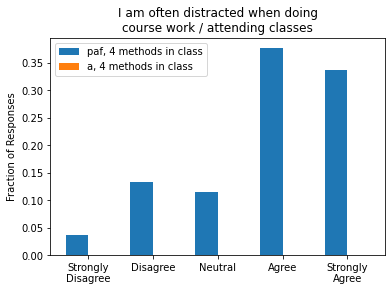

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 4 methods in class 3.85
a, 4 methods in class nan
Cohen's d = nan


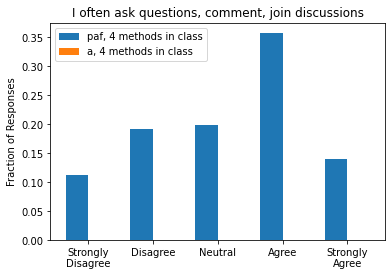

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 4 methods in class 3.22
a, 4 methods in class nan
Cohen's d = nan


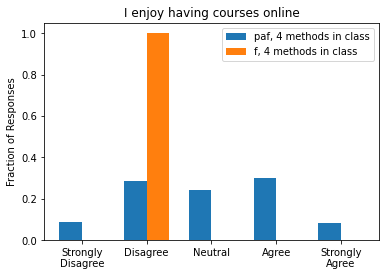

MannwhitneyuResult(statistic=82.5, pvalue=0.16883801456334085)
paf, 4 methods in class 3.01
f, 4 methods in class 2.0
Cohen's d = nan


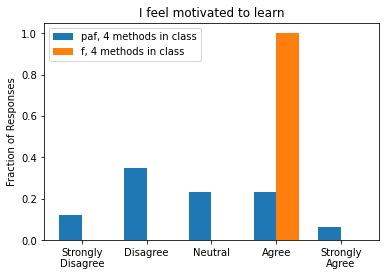

MannwhitneyuResult(statistic=64.5, pvalue=0.12706957474753716)
paf, 4 methods in class 2.77
f, 4 methods in class 4.0
Cohen's d = nan


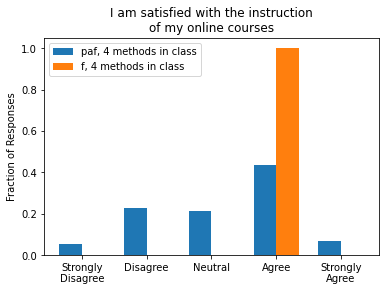

MannwhitneyuResult(statistic=102.0, pvalue=0.21750355476608896)
paf, 4 methods in class 3.23
f, 4 methods in class 4.0
Cohen's d = nan


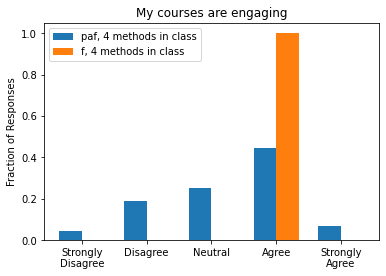

MannwhitneyuResult(statistic=105.0, pvalue=0.22572633184201923)
paf, 4 methods in class 3.31
f, 4 methods in class 4.0
Cohen's d = nan


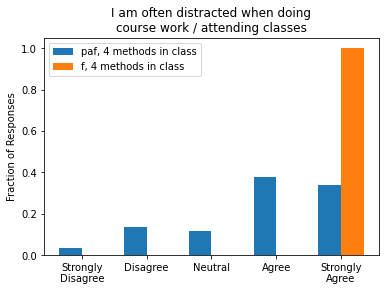

MannwhitneyuResult(statistic=60.5, pvalue=0.11550084538116778)
paf, 4 methods in class 3.85
f, 4 methods in class 5.0
Cohen's d = nan


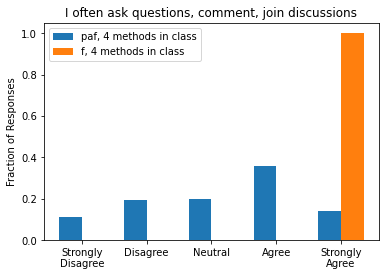

MannwhitneyuResult(statistic=25.0, pvalue=0.0628468039040983)
paf, 4 methods in class 3.22
f, 4 methods in class 5.0
Cohen's d = nan


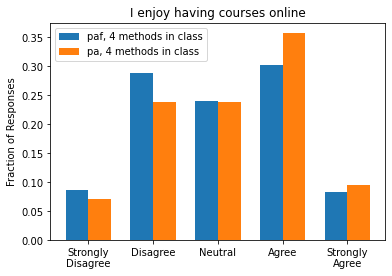

MannwhitneyuResult(statistic=6912.5, pvalue=0.18849245296398698)
paf, 4 methods in class 3.01
pa, 4 methods in class 3.17
Cohen's d = -0.14


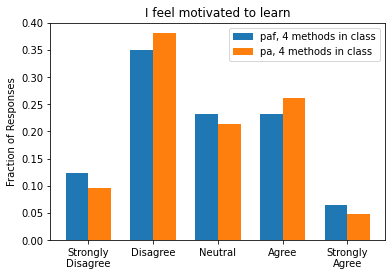

MannwhitneyuResult(statistic=7428.0, pvalue=0.4478905785566664)
paf, 4 methods in class 2.77
pa, 4 methods in class 2.79
Cohen's d = -0.018


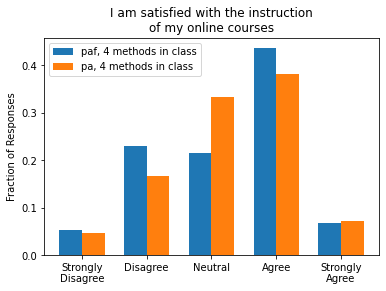

MannwhitneyuResult(statistic=7510.0, pvalue=0.4955438866595877)
paf, 4 methods in class 3.23
pa, 4 methods in class 3.26
Cohen's d = -0.026


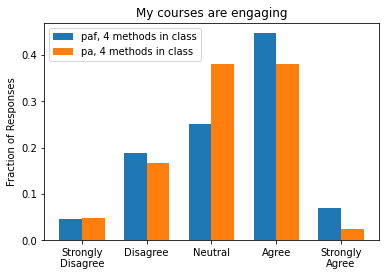

MannwhitneyuResult(statistic=6804.0, pvalue=0.14292750420913036)
paf, 4 methods in class 3.31
pa, 4 methods in class 3.17
Cohen's d = 0.14


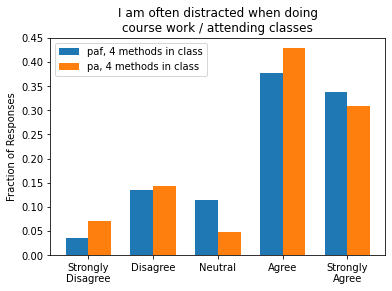

MannwhitneyuResult(statistic=7323.0, pvalue=0.38636532416133373)
paf, 4 methods in class 3.85
pa, 4 methods in class 3.76
Cohen's d = 0.073


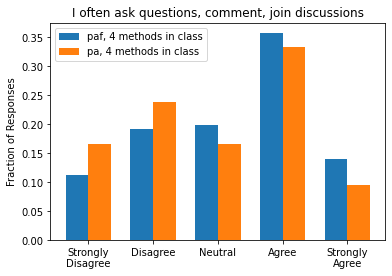

MannwhitneyuResult(statistic=6644.5, pvalue=0.10151685366416574)
paf, 4 methods in class 3.22
pa, 4 methods in class 2.95
Cohen's d = 0.22


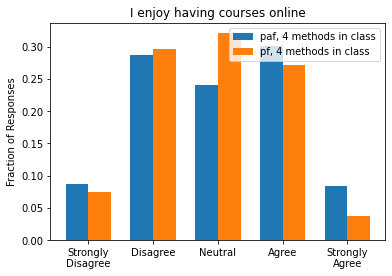

MannwhitneyuResult(statistic=13732.0, pvalue=0.22067729693546467)
paf, 4 methods in class 3.01
pf, 4 methods in class 2.9
Cohen's d = 0.097


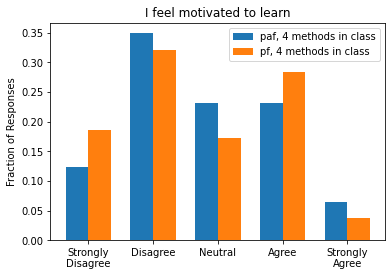

MannwhitneyuResult(statistic=13836.0, pvalue=0.25283871487637055)
paf, 4 methods in class 2.77
pf, 4 methods in class 2.67
Cohen's d = 0.087


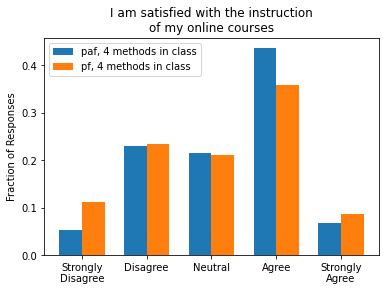

MannwhitneyuResult(statistic=13443.0, pvalue=0.14063780416491684)
paf, 4 methods in class 3.23
pf, 4 methods in class 3.07
Cohen's d = 0.15


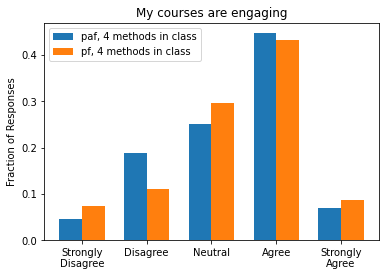

MannwhitneyuResult(statistic=14159.0, pvalue=0.36348216246318665)
paf, 4 methods in class 3.31
pf, 4 methods in class 3.35
Cohen's d = -0.035


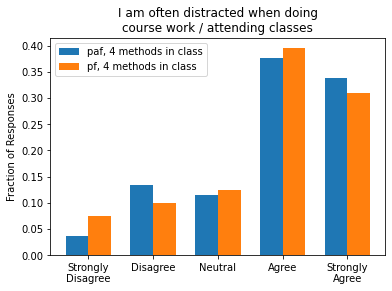

MannwhitneyuResult(statistic=14011.5, pvalue=0.3097310336266299)
paf, 4 methods in class 3.85
pf, 4 methods in class 3.77
Cohen's d = 0.07


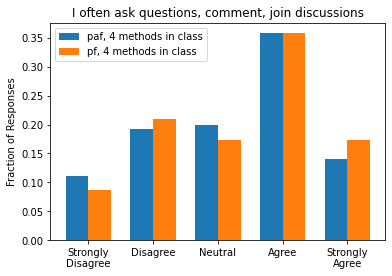

MannwhitneyuResult(statistic=13830.5, pvalue=0.2514590793398902)
paf, 4 methods in class 3.22
pf, 4 methods in class 3.32
Cohen's d = -0.082


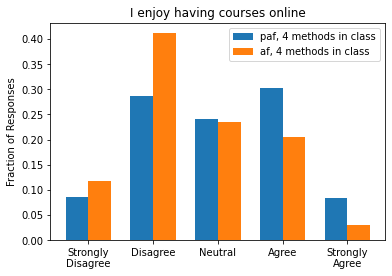

MannwhitneyuResult(statistic=4894.0, pvalue=0.02537678702070047)
paf, 4 methods in class 3.01
af, 4 methods in class 2.62
Cohen's d = 0.35


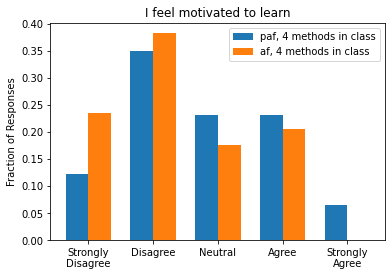

MannwhitneyuResult(statistic=4878.0, pvalue=0.023676516276903332)
paf, 4 methods in class 2.77
af, 4 methods in class 2.35
Cohen's d = 0.37


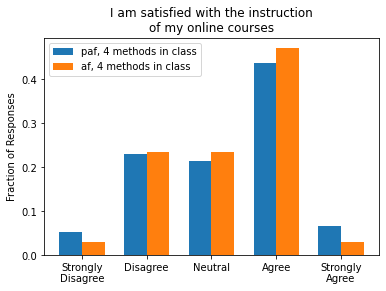

MannwhitneyuResult(statistic=6047.5, pvalue=0.4746062792246065)
paf, 4 methods in class 3.23
af, 4 methods in class 3.24
Cohen's d = -0.00063


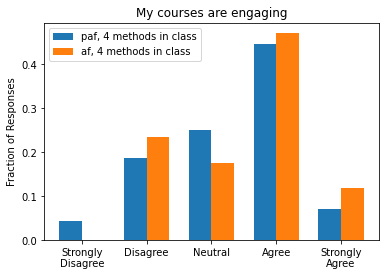

MannwhitneyuResult(statistic=5578.0, pvalue=0.19674436562076125)
paf, 4 methods in class 3.31
af, 4 methods in class 3.47
Cohen's d = -0.16


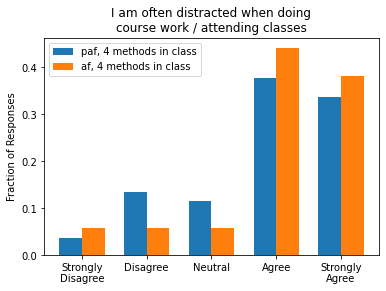

MannwhitneyuResult(statistic=5512.0, pvalue=0.16924276610082056)
paf, 4 methods in class 3.85
af, 4 methods in class 4.03
Cohen's d = -0.16


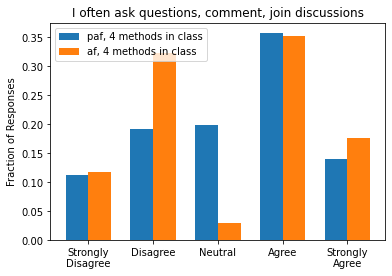

MannwhitneyuResult(statistic=5970.0, pvalue=0.42499031837531565)
paf, 4 methods in class 3.22
af, 4 methods in class 3.15
Cohen's d = 0.059


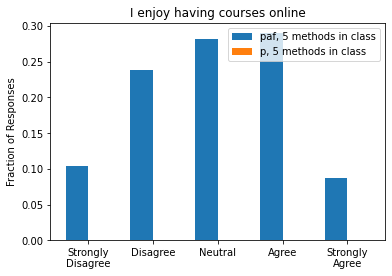

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.02
p, 5 methods in class nan
Cohen's d = nan


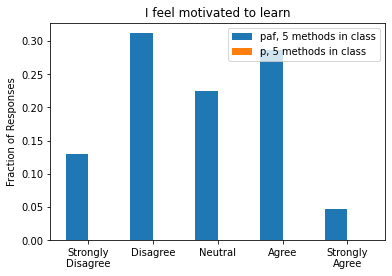

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 2.81
p, 5 methods in class nan
Cohen's d = nan


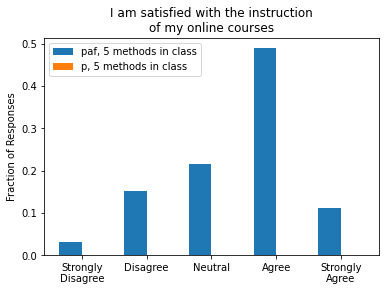

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.5
p, 5 methods in class nan
Cohen's d = nan


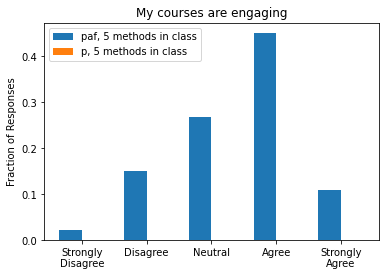

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.47
p, 5 methods in class nan
Cohen's d = nan


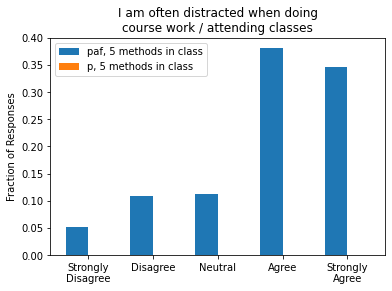

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.86
p, 5 methods in class nan
Cohen's d = nan


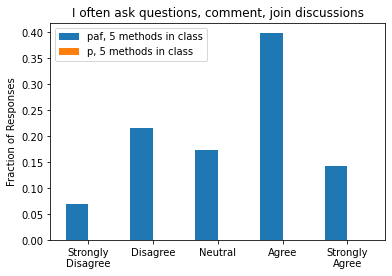

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.33
p, 5 methods in class nan
Cohen's d = nan


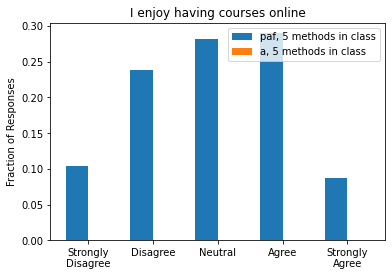

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.02
a, 5 methods in class nan
Cohen's d = nan


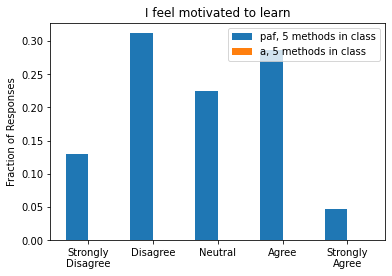

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 2.81
a, 5 methods in class nan
Cohen's d = nan


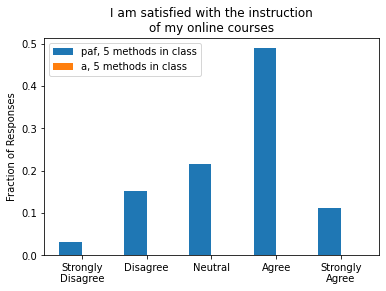

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.5
a, 5 methods in class nan
Cohen's d = nan


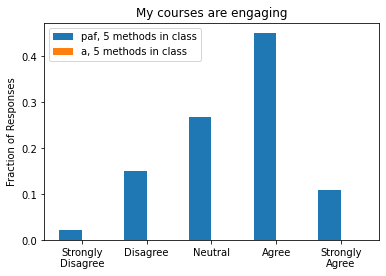

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.47
a, 5 methods in class nan
Cohen's d = nan


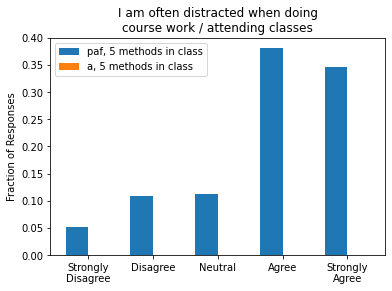

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.86
a, 5 methods in class nan
Cohen's d = nan


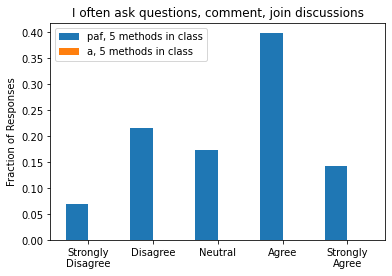

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.33
a, 5 methods in class nan
Cohen's d = nan


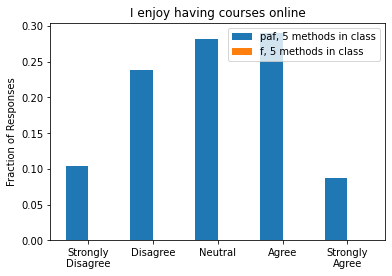

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.02
f, 5 methods in class nan
Cohen's d = nan


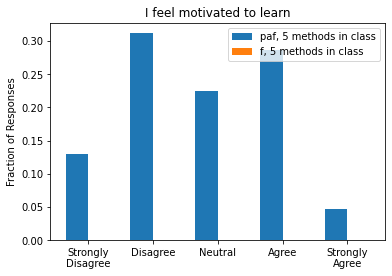

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 2.81
f, 5 methods in class nan
Cohen's d = nan


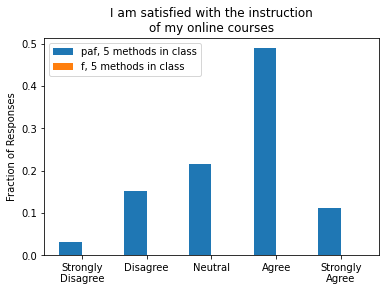

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.5
f, 5 methods in class nan
Cohen's d = nan


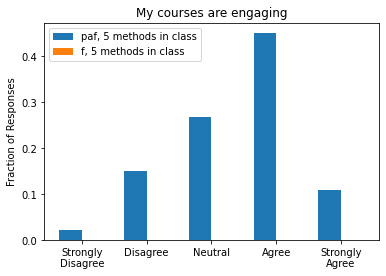

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.47
f, 5 methods in class nan
Cohen's d = nan


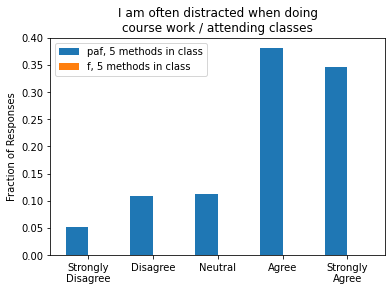

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.86
f, 5 methods in class nan
Cohen's d = nan


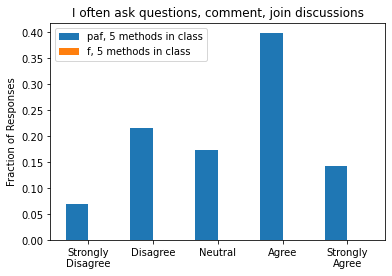

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.33
f, 5 methods in class nan
Cohen's d = nan


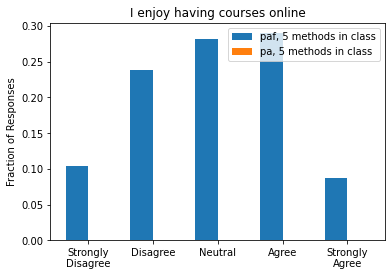

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.02
pa, 5 methods in class nan
Cohen's d = nan


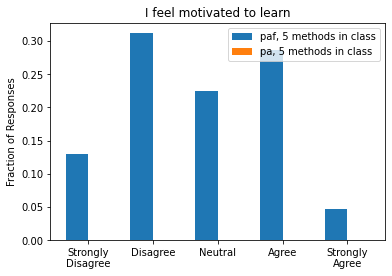

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 2.81
pa, 5 methods in class nan
Cohen's d = nan


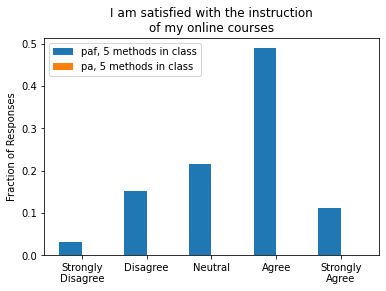

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.5
pa, 5 methods in class nan
Cohen's d = nan


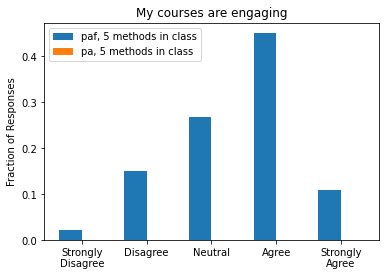

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.47
pa, 5 methods in class nan
Cohen's d = nan


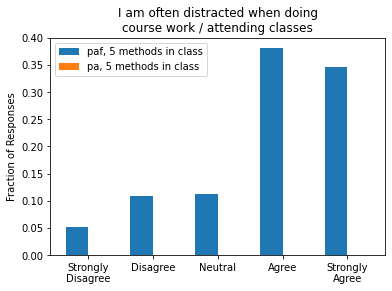

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.86
pa, 5 methods in class nan
Cohen's d = nan


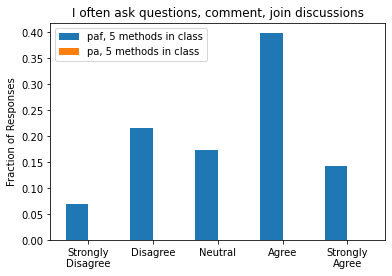

MannwhitneyuResult(statistic=0.0, pvalue=0.0)
paf, 5 methods in class 3.33
pa, 5 methods in class nan
Cohen's d = nan


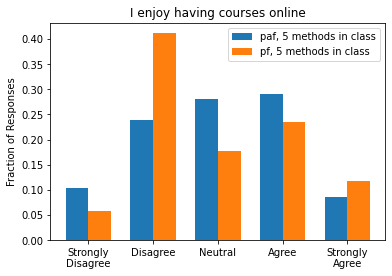

MannwhitneyuResult(statistic=1859.0, pvalue=0.35343643047437734)
paf, 5 methods in class 3.02
pf, 5 methods in class 2.94
Cohen's d = 0.067


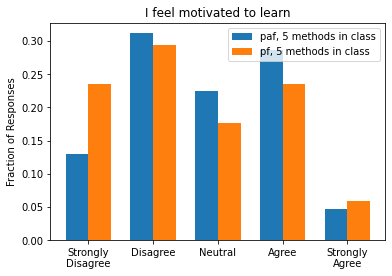

MannwhitneyuResult(statistic=1747.5, pvalue=0.217357104668692)
paf, 5 methods in class 2.81
pf, 5 methods in class 2.59
Cohen's d = 0.19


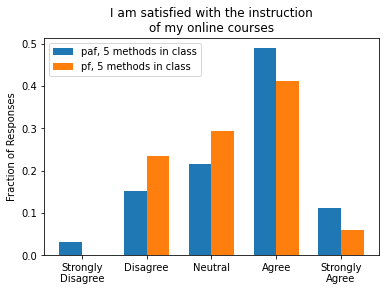

MannwhitneyuResult(statistic=1690.5, pvalue=0.1531326345323345)
paf, 5 methods in class 3.5
pf, 5 methods in class 3.29
Cohen's d = 0.21


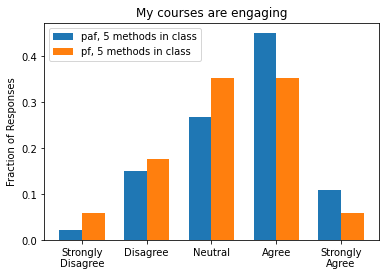

MannwhitneyuResult(statistic=1638.5, pvalue=0.11376185205731931)
paf, 5 methods in class 3.47
pf, 5 methods in class 3.18
Cohen's d = 0.31


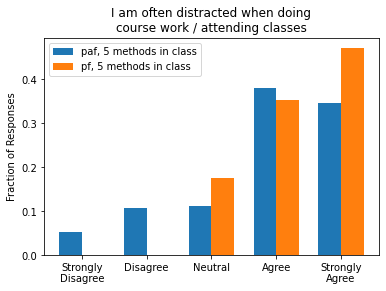

MannwhitneyuResult(statistic=1607.0, pvalue=0.09409663765131682)
paf, 5 methods in class 3.86
pf, 5 methods in class 4.29
Cohen's d = -0.38


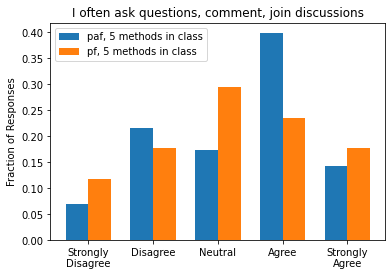

MannwhitneyuResult(statistic=1820.5, pvalue=0.30165276883946057)
paf, 5 methods in class 3.33
pf, 5 methods in class 3.18
Cohen's d = 0.13


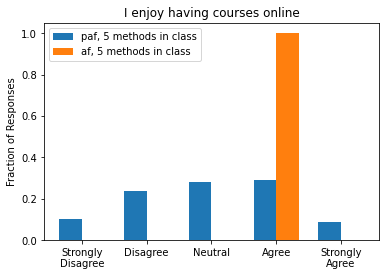

MannwhitneyuResult(statistic=53.5, pvalue=0.17149550712510875)
paf, 5 methods in class 3.02
af, 5 methods in class 4.0
Cohen's d = nan


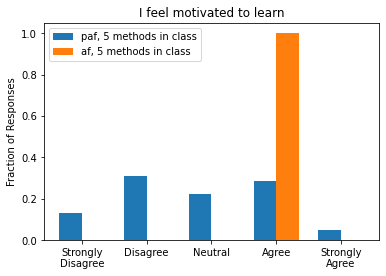

MannwhitneyuResult(statistic=44.0, pvalue=0.13613787073136285)
paf, 5 methods in class 2.81
af, 5 methods in class 4.0
Cohen's d = nan


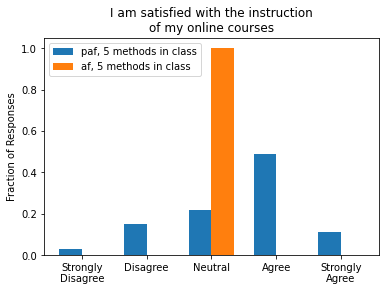

MannwhitneyuResult(statistic=67.0, pvalue=0.22098969166728394)
paf, 5 methods in class 3.5
af, 5 methods in class 3.0
Cohen's d = nan


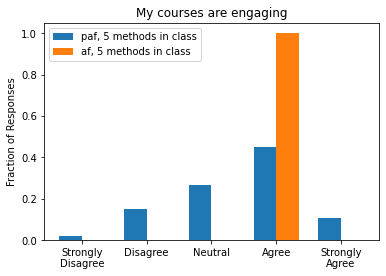

MannwhitneyuResult(statistic=77.0, pvalue=0.273040830694639)
paf, 5 methods in class 3.47
af, 5 methods in class 4.0
Cohen's d = nan


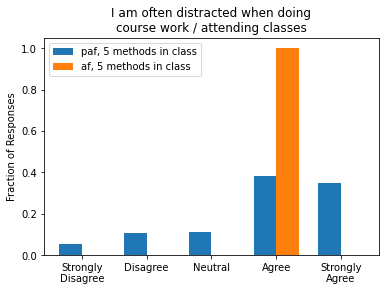

MannwhitneyuResult(statistic=107.0, pvalue=0.44989324955925314)
paf, 5 methods in class 3.86
af, 5 methods in class 4.0
Cohen's d = nan


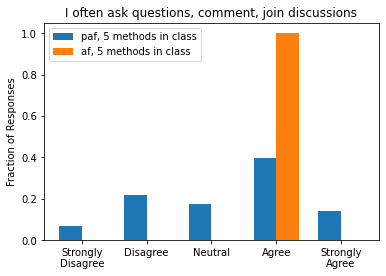

MannwhitneyuResult(statistic=79.0, pvalue=0.2873107502129272)
paf, 5 methods in class 3.33
af, 5 methods in class 4.0
Cohen's d = nan


In [543]:
# 3 types vs. 1 and 2 types, controlled for number of methods
for num in [3, 4, 5]:
    a = ugcat7[ugcat7['num_methods']==num]
    a.name = f'paf, {num} methods in class'
    subset_ls.append(a)
    subset_name.append(a.name)
    for i in range(len(ugcats)-1):
        b = ugcats[i][ugcats[i]['num_methods']==num]
        b.name = f'{ugcats[i].name}, {num} methods in class'
        subset_ls.append(b)
        subset_name.append(b.name)
        remote_comparison(a, b)

In [544]:
# 2 types vs. 1 type OVERALL, controlled for 2 methods
a = pd.concat([ugcat1, ugcat2, ugcat3])
a = a[a['num_methods']==2]
b = pd.concat([ugcat4, ugcat5, ugcat6])
b = b[b['num_methods']==2]
a.name = '1 type of method, 2 methods'
b.name = '2 type of methid, 2 methods'
subset_ls.append(a)
subset_name.append(a.name)
subset_ls.append(b)
subset_name.append(b.name)

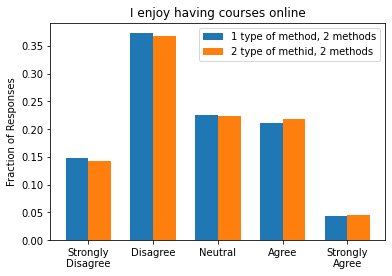

MannwhitneyuResult(statistic=83337.0, pvalue=0.3814136939600249)
1 type of method, 2 methods 2.63
2 type of methid, 2 methods 2.65
Cohen's d = -0.024


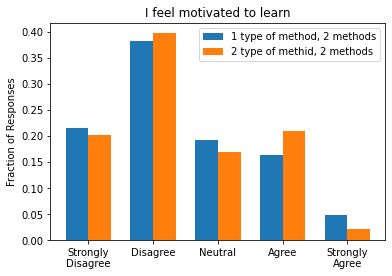

MannwhitneyuResult(statistic=83587.5, pvalue=0.4074999916259105)
1 type of method, 2 methods 2.44
2 type of methid, 2 methods 2.45
Cohen's d = -0.0083


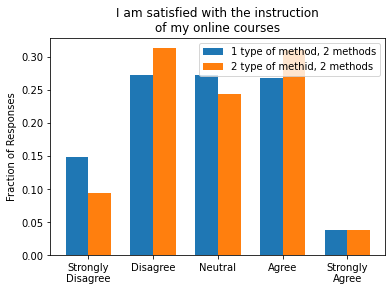

MannwhitneyuResult(statistic=79912.0, pvalue=0.10729555828150644)
1 type of method, 2 methods 2.78
2 type of methid, 2 methods 2.89
Cohen's d = -0.1


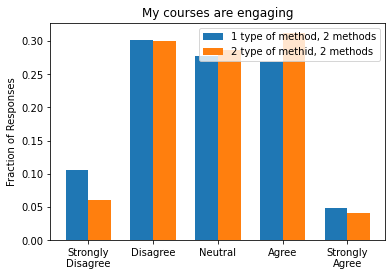

MannwhitneyuResult(statistic=79174.5, pvalue=0.07382647887356912)
1 type of method, 2 methods 2.85
2 type of methid, 2 methods 2.97
Cohen's d = -0.12


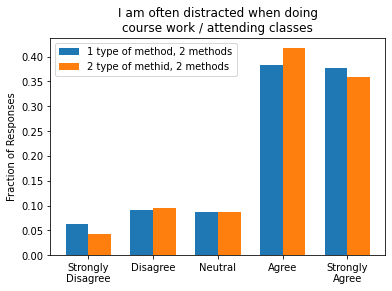

MannwhitneyuResult(statistic=84327.0, pvalue=0.48782283809621135)
1 type of method, 2 methods 3.92
2 type of methid, 2 methods 3.96
Cohen's d = -0.03


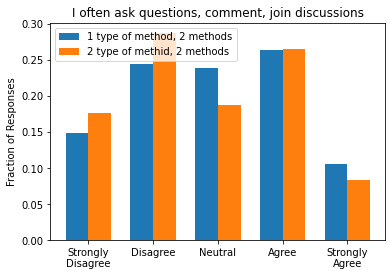

MannwhitneyuResult(statistic=79078.5, pvalue=0.07286704674861157)
1 type of method, 2 methods 2.93
2 type of methid, 2 methods 2.79
Cohen's d = 0.11


In [545]:
remote_comparison(a, b)

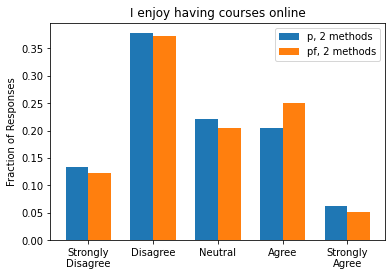

MannwhitneyuResult(statistic=20752.5, pvalue=0.3183235931054784)
p, 2 methods 2.69
pf, 2 methods 2.74
Cohen's d = -0.045


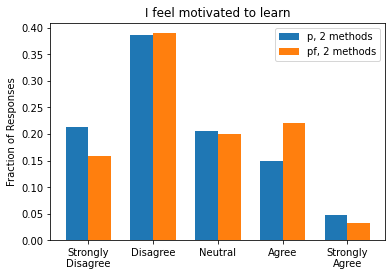

MannwhitneyuResult(statistic=19632.0, pvalue=0.08336829759740716)
p, 2 methods 2.43
pf, 2 methods 2.58
Cohen's d = -0.13


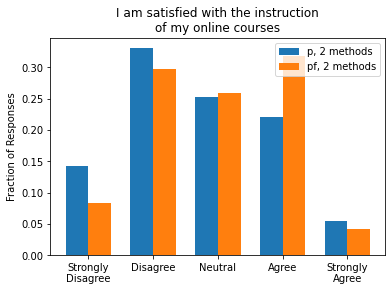

MannwhitneyuResult(statistic=18837.0, pvalue=0.021754338453777052)
p, 2 methods 2.72
pf, 2 methods 2.94
Cohen's d = -0.21


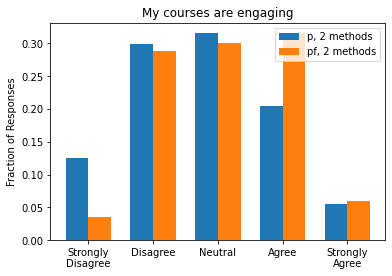

MannwhitneyuResult(statistic=17895.0, pvalue=0.002657052377344079)
p, 2 methods 2.76
pf, 2 methods 3.07
Cohen's d = -0.31


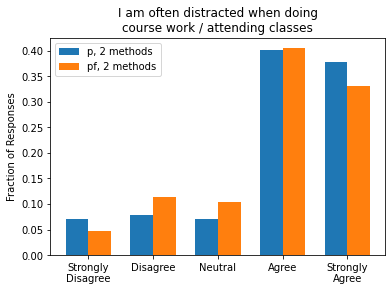

MannwhitneyuResult(statistic=20135.5, pvalue=0.1612275547869384)
p, 2 methods 3.94
pf, 2 methods 3.86
Cohen's d = 0.069


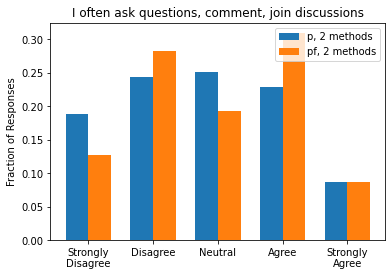

MannwhitneyuResult(statistic=19709.0, pvalue=0.09615917561825771)
p, 2 methods 2.78
pf, 2 methods 2.94
Cohen's d = -0.13


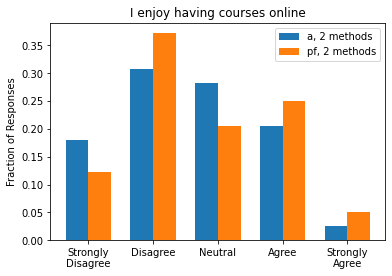

MannwhitneyuResult(statistic=6134.5, pvalue=0.24926534753364904)
a, 2 methods 2.59
pf, 2 methods 2.74
Cohen's d = -0.13


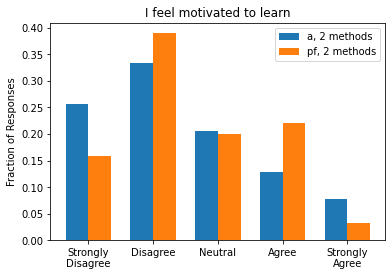

MannwhitneyuResult(statistic=5977.0, pvalue=0.17512340740361282)
a, 2 methods 2.44
pf, 2 methods 2.58
Cohen's d = -0.13


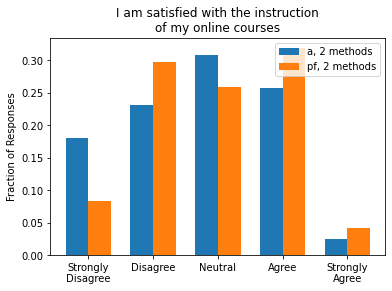

MannwhitneyuResult(statistic=5872.0, pvalue=0.1352066614442971)
a, 2 methods 2.72
pf, 2 methods 2.94
Cohen's d = -0.21


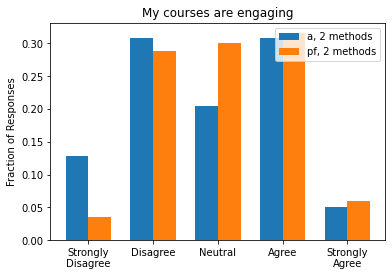

MannwhitneyuResult(statistic=5840.0, pvalue=0.12343228027119829)
a, 2 methods 2.85
pf, 2 methods 3.07
Cohen's d = -0.23


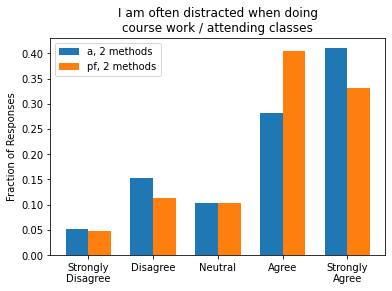

MannwhitneyuResult(statistic=6377.0, pvalue=0.3869164795541987)
a, 2 methods 3.85
pf, 2 methods 3.86
Cohen's d = -0.0095


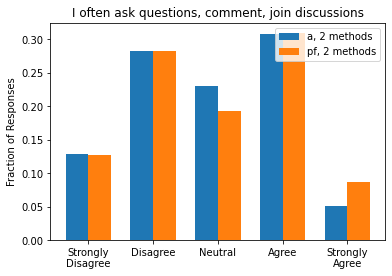

MannwhitneyuResult(statistic=6340.5, pvalue=0.36689340689111316)
a, 2 methods 2.87
pf, 2 methods 2.94
Cohen's d = -0.06


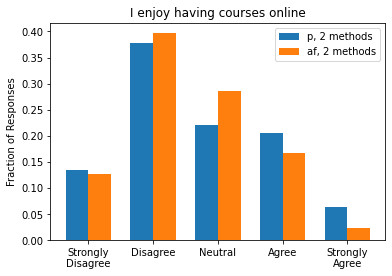

MannwhitneyuResult(statistic=7625.0, pvalue=0.2502281542480753)
p, 2 methods 2.69
af, 2 methods 2.56
Cohen's d = 0.11


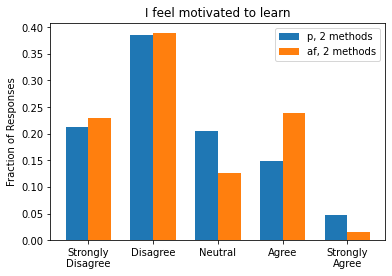

MannwhitneyuResult(statistic=7932.0, pvalue=0.4511463271502707)
p, 2 methods 2.43
af, 2 methods 2.42
Cohen's d = 0.011


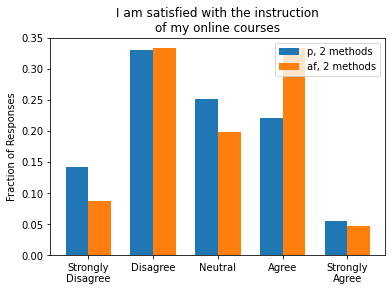

MannwhitneyuResult(statistic=7172.0, pvalue=0.06985876451285442)
p, 2 methods 2.72
af, 2 methods 2.92
Cohen's d = -0.18


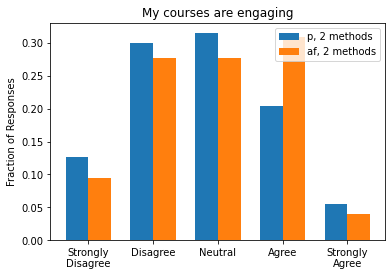

MannwhitneyuResult(statistic=7300.5, pvalue=0.10634522348956721)
p, 2 methods 2.76
af, 2 methods 2.92
Cohen's d = -0.15


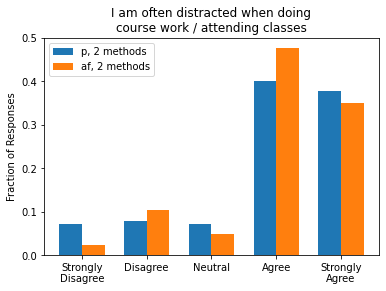

MannwhitneyuResult(statistic=7923.5, pvalue=0.4434848472877489)
p, 2 methods 3.94
af, 2 methods 4.02
Cohen's d = -0.079


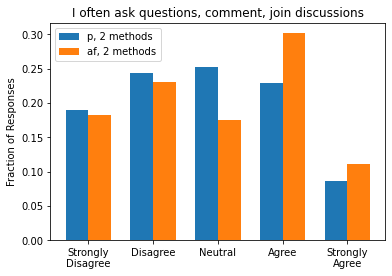

MannwhitneyuResult(statistic=7460.5, pvalue=0.1706863482843926)
p, 2 methods 2.78
af, 2 methods 2.93
Cohen's d = -0.12


In [546]:
# 2 types vs. 1 type SPECIFIC, controlled for 2 methods
for each in [[ugcat1, ugcat5], [ugcat2, ugcat5], [ugcat1, ugcat6]]:
    a = each[0][each[0]['num_methods']==2]
    b = each[1][each[1]['num_methods']==2]
    a.name = f'{each[0].name}, 2 methods'
    b.name = f'{each[1].name}, 2 methods'
    subset_ls.append(a)
    subset_name.append(a.name)
    subset_ls.append(b)
    subset_name.append(b.name)
    remote_comparison(a, b)

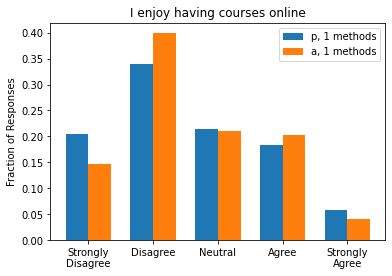

MannwhitneyuResult(statistic=62600.5, pvalue=0.2615005058657439)
p, 1 methods 2.55
a, 1 methods 2.59
Cohen's d = -0.038


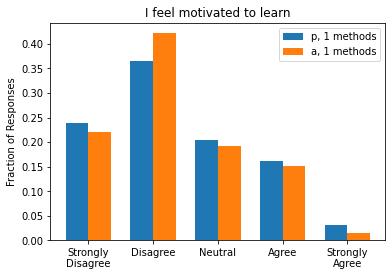

MannwhitneyuResult(statistic=62914.5, pvalue=0.29745218488384284)
p, 1 methods 2.38
a, 1 methods 2.32
Cohen's d = 0.058


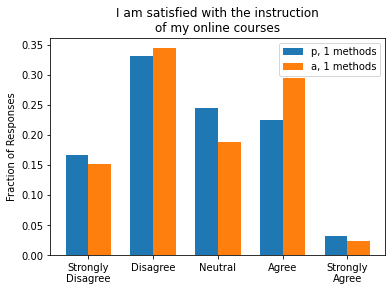

MannwhitneyuResult(statistic=62235.0, pvalue=0.22149798873894233)
p, 1 methods 2.63
a, 1 methods 2.69
Cohen's d = -0.06


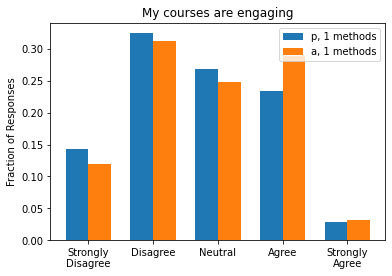

MannwhitneyuResult(statistic=60281.5, pvalue=0.07294361207821744)
p, 1 methods 2.68
a, 1 methods 2.8
Cohen's d = -0.12


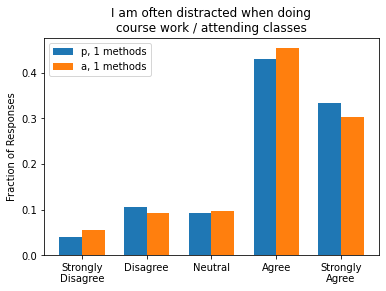

MannwhitneyuResult(statistic=62518.5, pvalue=0.24617604629429973)
p, 1 methods 3.91
a, 1 methods 3.86
Cohen's d = 0.051


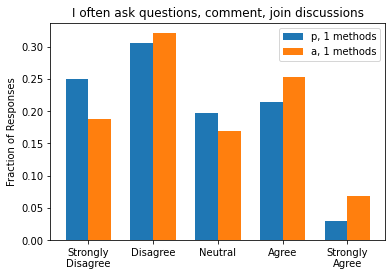

MannwhitneyuResult(statistic=58019.0, pvalue=0.012564937806763632)
p, 1 methods 2.47
a, 1 methods 2.69
Cohen's d = -0.19


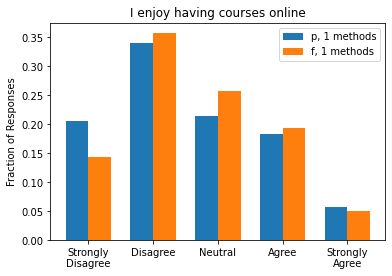

MannwhitneyuResult(statistic=38978.0, pvalue=0.1354452802190968)
p, 1 methods 2.55
f, 1 methods 2.65
Cohen's d = -0.088


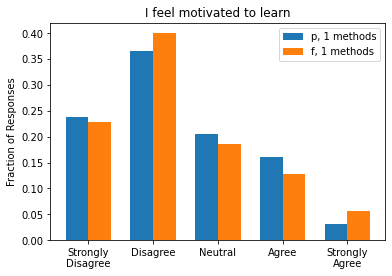

MannwhitneyuResult(statistic=41170.0, pvalue=0.46318478085546766)
p, 1 methods 2.38
f, 1 methods 2.39
Cohen's d = -0.006


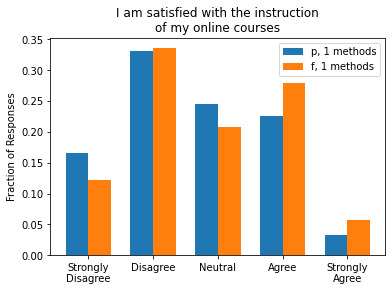

MannwhitneyuResult(statistic=37700.0, pvalue=0.04540211797282244)
p, 1 methods 2.63
f, 1 methods 2.81
Cohen's d = -0.17


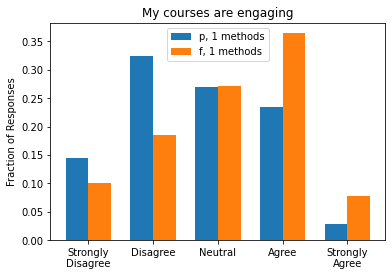

MannwhitneyuResult(statistic=31729.5, pvalue=4.502496597681376e-06)
p, 1 methods 2.68
f, 1 methods 3.14
Cohen's d = -0.42


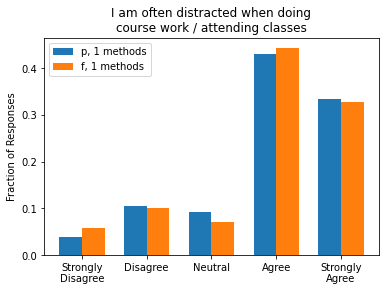

MannwhitneyuResult(statistic=41182.0, pvalue=0.4645651099327418)
p, 1 methods 3.91
f, 1 methods 3.89
Cohen's d = 0.025


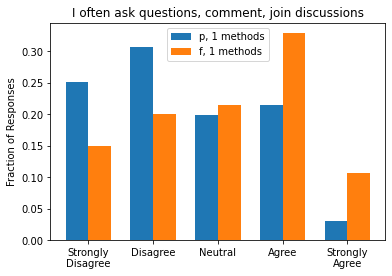

MannwhitneyuResult(statistic=30716.0, pvalue=5.202044940314207e-07)
p, 1 methods 2.47
f, 1 methods 3.04
Cohen's d = -0.48


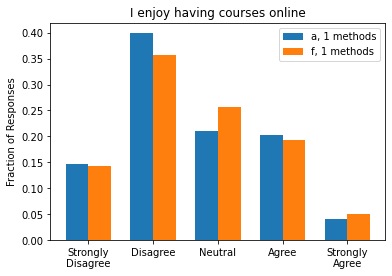

MannwhitneyuResult(statistic=14769.5, pvalue=0.2965526885513439)
a, 1 methods 2.59
f, 1 methods 2.65
Cohen's d = -0.053


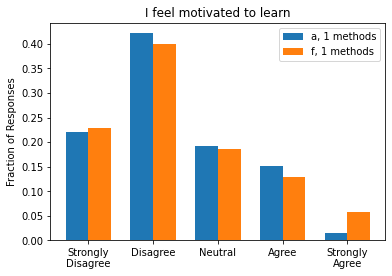

MannwhitneyuResult(statistic=14997.0, pvalue=0.38658594895089404)
a, 1 methods 2.32
f, 1 methods 2.39
Cohen's d = -0.065


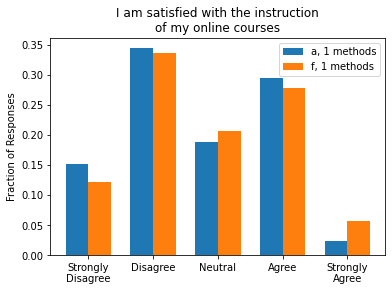

MannwhitneyuResult(statistic=14416.5, pvalue=0.17967221096295316)
a, 1 methods 2.69
f, 1 methods 2.81
Cohen's d = -0.11


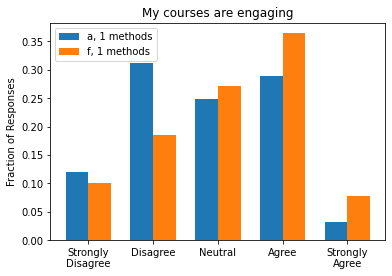

MannwhitneyuResult(statistic=12666.0, pvalue=0.0024558435216588655)
a, 1 methods 2.8
f, 1 methods 3.14
Cohen's d = -0.3


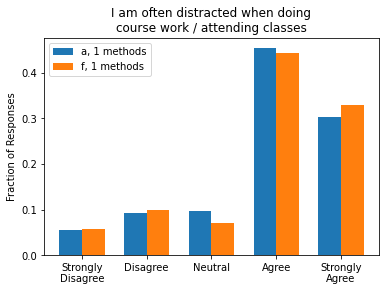

MannwhitneyuResult(statistic=14874.0, pvalue=0.33328466638668464)
a, 1 methods 3.86
f, 1 methods 3.89
Cohen's d = -0.025


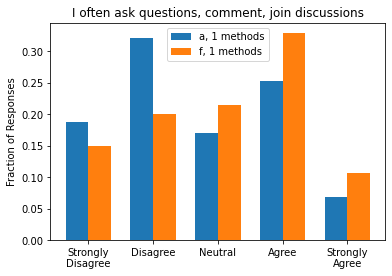

MannwhitneyuResult(statistic=12846.0, pvalue=0.004679284212231236)
a, 1 methods 2.69
f, 1 methods 3.04
Cohen's d = -0.28


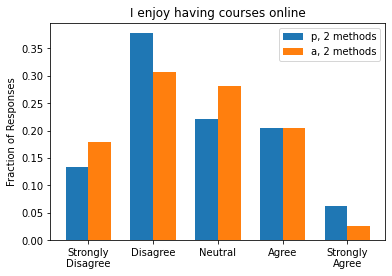

MannwhitneyuResult(statistic=2391.5, pvalue=0.36915561336872194)
p, 2 methods 2.69
a, 2 methods 2.59
Cohen's d = 0.085


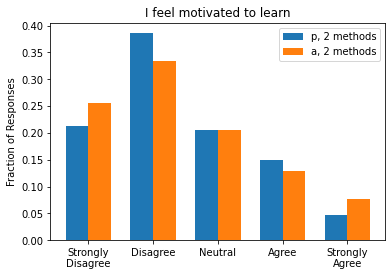

MannwhitneyuResult(statistic=2446.0, pvalue=0.4527155745097366)
p, 2 methods 2.43
a, 2 methods 2.44
Cohen's d = -0.0025


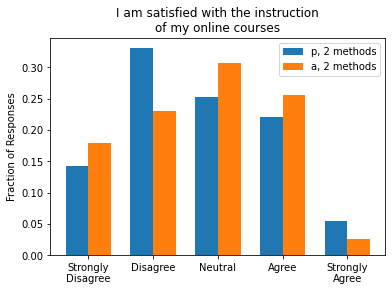

MannwhitneyuResult(statistic=2443.5, pvalue=0.4491179039410974)
p, 2 methods 2.72
a, 2 methods 2.72
Cohen's d = -0.0013


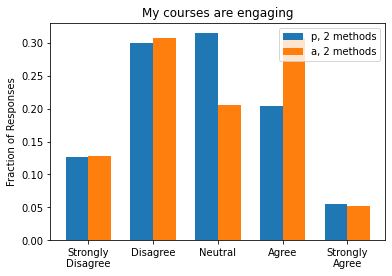

MannwhitneyuResult(statistic=2370.0, pvalue=0.33808863950532386)
p, 2 methods 2.76
a, 2 methods 2.85
Cohen's d = -0.075


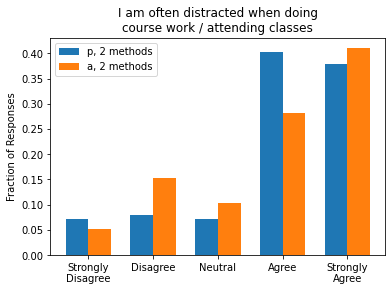

MannwhitneyuResult(statistic=2423.5, pvalue=0.4160189404086094)
p, 2 methods 3.94
a, 2 methods 3.85
Cohen's d = 0.075


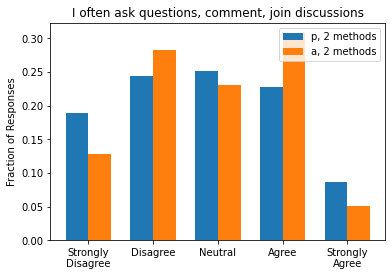

MannwhitneyuResult(statistic=2358.5, pvalue=0.3228725402627901)
p, 2 methods 2.78
a, 2 methods 2.87
Cohen's d = -0.076


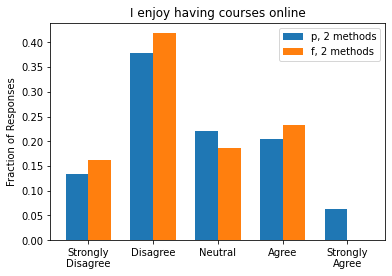

MannwhitneyuResult(statistic=2489.5, pvalue=0.1843199658035547)
p, 2 methods 2.69
f, 2 methods 2.49
Cohen's d = 0.18


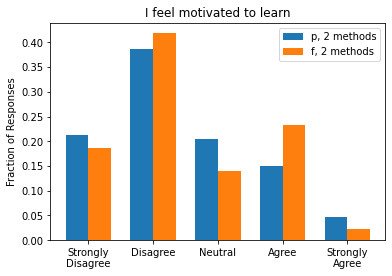

MannwhitneyuResult(statistic=2653.0, pvalue=0.38666253595575817)
p, 2 methods 2.43
f, 2 methods 2.49
Cohen's d = -0.049


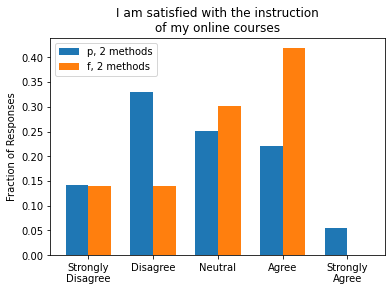

MannwhitneyuResult(statistic=2277.0, pvalue=0.04665090034930234)
p, 2 methods 2.72
f, 2 methods 3.0
Cohen's d = -0.25


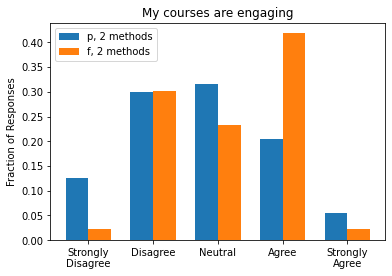

MannwhitneyuResult(statistic=2208.5, pvalue=0.026225986685206072)
p, 2 methods 2.76
f, 2 methods 3.12
Cohen's d = -0.33


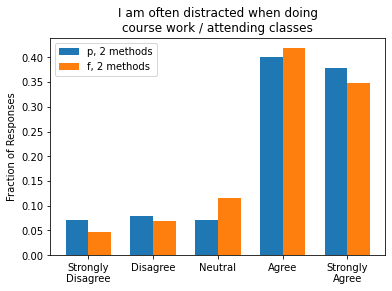

MannwhitneyuResult(statistic=2676.5, pvalue=0.4190493324176858)
p, 2 methods 3.94
f, 2 methods 3.95
Cohen's d = -0.014


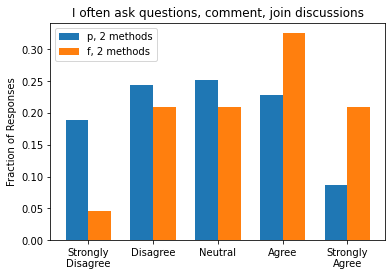

MannwhitneyuResult(statistic=1928.0, pvalue=0.0016034523219965418)
p, 2 methods 2.78
f, 2 methods 3.44
Cohen's d = -0.54


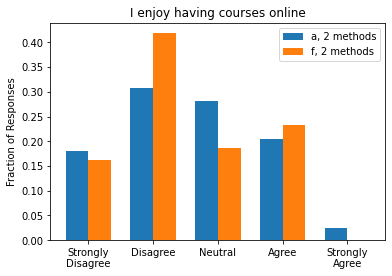

MannwhitneyuResult(statistic=794.5, pvalue=0.33710716943361335)
a, 2 methods 2.59
f, 2 methods 2.49
Cohen's d = 0.095


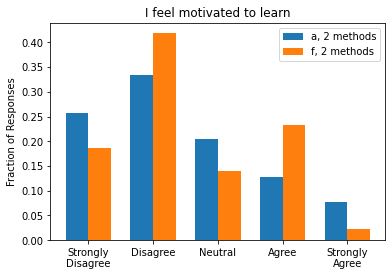

MannwhitneyuResult(statistic=805.5, pvalue=0.37680753759887353)
a, 2 methods 2.44
f, 2 methods 2.49
Cohen's d = -0.045


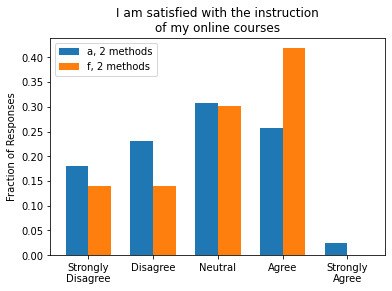

MannwhitneyuResult(statistic=707.0, pvalue=0.1026072785999202)
a, 2 methods 2.72
f, 2 methods 3.0
Cohen's d = -0.26


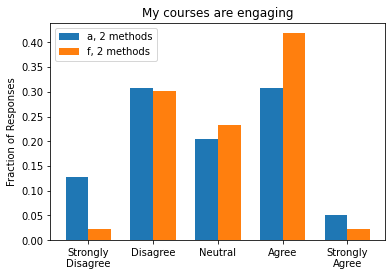

MannwhitneyuResult(statistic=725.5, pvalue=0.1369951061387255)
a, 2 methods 2.85
f, 2 methods 3.12
Cohen's d = -0.26


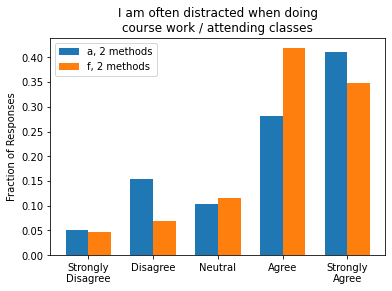

MannwhitneyuResult(statistic=830.0, pvalue=0.4687798486021614)
a, 2 methods 3.85
f, 2 methods 3.95
Cohen's d = -0.091


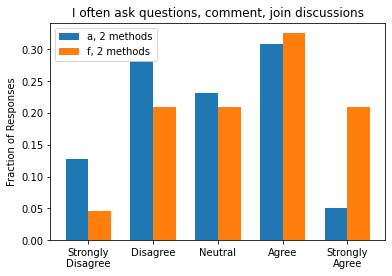

MannwhitneyuResult(statistic=617.0, pvalue=0.017158857191220303)
a, 2 methods 2.87
f, 2 methods 3.44
Cohen's d = -0.49


In [547]:
# among 1 type, controlled for number of methods
ug1type = [ugcat1, ugcat2, ugcat3]
for num in [1, 2]:
    for i in range(3):
        for j in range(i+1, 3):
            a = ug1type[i][ug1type[i]['num_methods']==num]
            b = ug1type[j][ug1type[j]['num_methods']==num]
            a.name = f'{ug1type[i].name}, {num} methods'
            b.name = f'{ug1type[j].name}, {num} methods'
            subset_ls.append(a)
            subset_name.append(a.name)
            subset_ls.append(b)
            subset_name.append(b.name)
            remote_comparison(a, b)


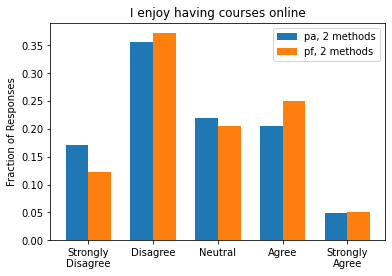

MannwhitneyuResult(statistic=54412.5, pvalue=0.06683763252616029)
pa, 2 methods 2.61
pf, 2 methods 2.74
Cohen's d = -0.11


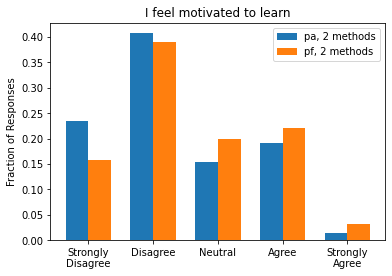

MannwhitneyuResult(statistic=51043.0, pvalue=0.0019921357813850868)
pa, 2 methods 2.34
pf, 2 methods 2.58
Cohen's d = -0.22


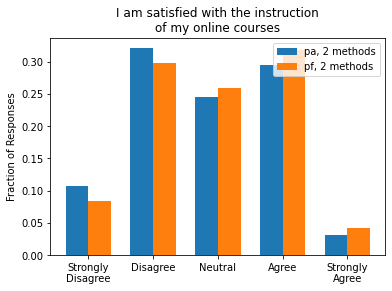

MannwhitneyuResult(statistic=54759.5, pvalue=0.08665918142898466)
pa, 2 methods 2.82
pf, 2 methods 2.94
Cohen's d = -0.11


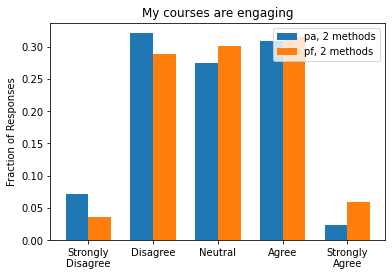

MannwhitneyuResult(statistic=52767.0, pvalue=0.014780258998605932)
pa, 2 methods 2.89
pf, 2 methods 3.07
Cohen's d = -0.18


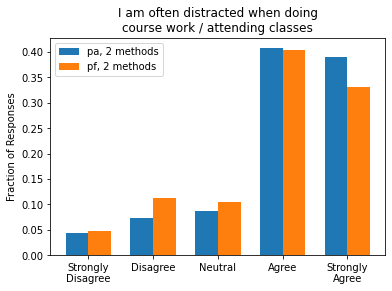

MannwhitneyuResult(statistic=53111.5, pvalue=0.019058260208190972)
pa, 2 methods 4.03
pf, 2 methods 3.86
Cohen's d = 0.16


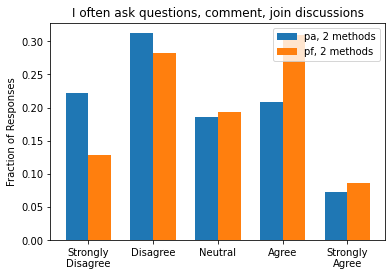

MannwhitneyuResult(statistic=48739.0, pvalue=8.597225187435225e-05)
pa, 2 methods 2.6
pf, 2 methods 2.94
Cohen's d = -0.28


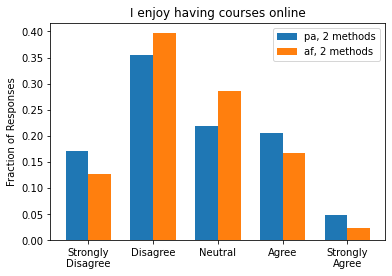

MannwhitneyuResult(statistic=21593.0, pvalue=0.43560437696953147)
pa, 2 methods 2.61
af, 2 methods 2.56
Cohen's d = 0.04


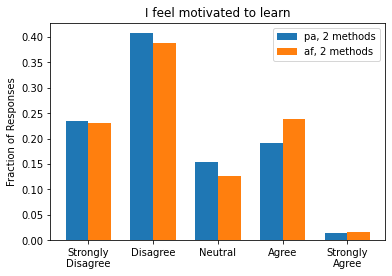

MannwhitneyuResult(statistic=21095.0, pvalue=0.2871953702256078)
pa, 2 methods 2.34
af, 2 methods 2.42
Cohen's d = -0.07


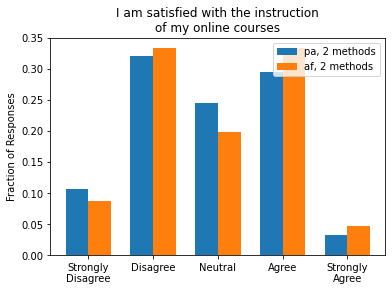

MannwhitneyuResult(statistic=20774.0, pvalue=0.20829841465590415)
pa, 2 methods 2.82
af, 2 methods 2.92
Cohen's d = -0.09


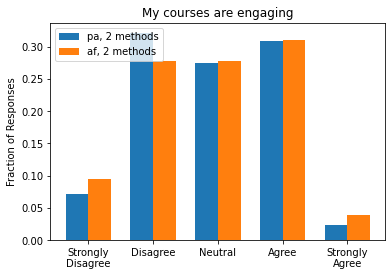

MannwhitneyuResult(statistic=21400.5, pvalue=0.37606088049684144)
pa, 2 methods 2.89
af, 2 methods 2.92
Cohen's d = -0.03


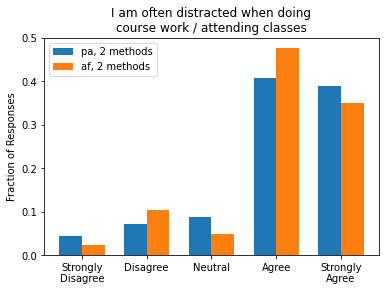

MannwhitneyuResult(statistic=21394.0, pvalue=0.370498033453864)
pa, 2 methods 4.03
af, 2 methods 4.02
Cohen's d = 0.0048


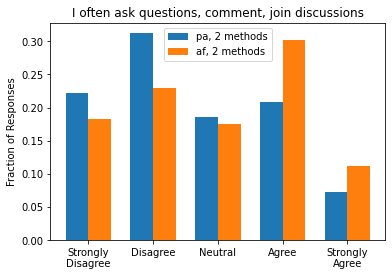

MannwhitneyuResult(statistic=18638.5, pvalue=0.006631165610552332)
pa, 2 methods 2.6
af, 2 methods 2.93
Cohen's d = -0.26


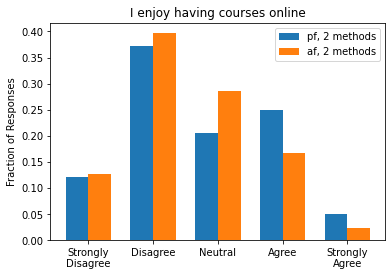

MannwhitneyuResult(statistic=19520.5, pvalue=0.08957719542494436)
pf, 2 methods 2.74
af, 2 methods 2.56
Cohen's d = 0.16


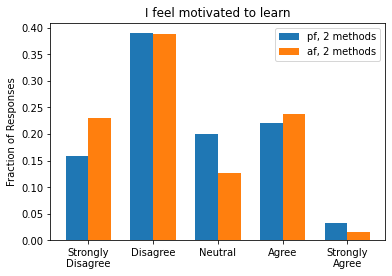

MannwhitneyuResult(statistic=19356.0, pvalue=0.06953208159705482)
pf, 2 methods 2.58
af, 2 methods 2.42
Cohen's d = 0.14


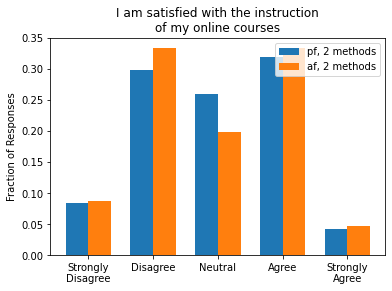

MannwhitneyuResult(statistic=20968.5, pvalue=0.43560859291726056)
pf, 2 methods 2.94
af, 2 methods 2.92
Cohen's d = 0.016


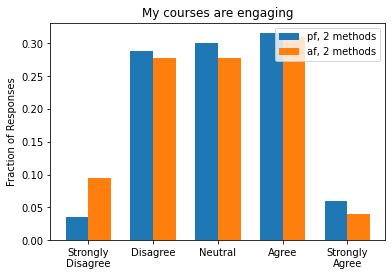

MannwhitneyuResult(statistic=19659.0, pvalue=0.1092417036076675)
pf, 2 methods 3.07
af, 2 methods 2.92
Cohen's d = 0.15


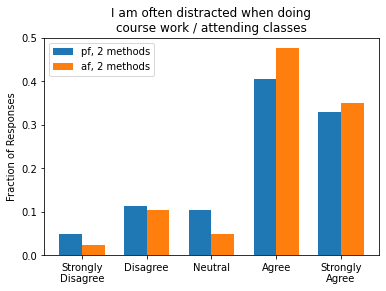

MannwhitneyuResult(statistic=19666.0, pvalue=0.10570730626279251)
pf, 2 methods 3.86
af, 2 methods 4.02
Cohen's d = -0.15


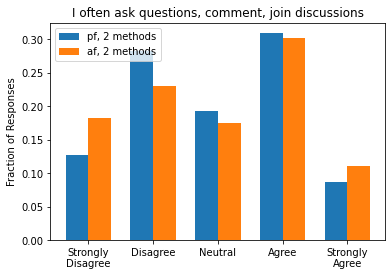

MannwhitneyuResult(statistic=21061.0, pvalue=0.46577666151654906)
pf, 2 methods 2.94
af, 2 methods 2.93
Cohen's d = 0.012


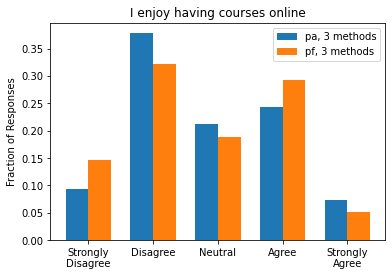

MannwhitneyuResult(statistic=22105.5, pvalue=0.3780755434689806)
pa, 3 methods 2.82
pf, 3 methods 2.78
Cohen's d = 0.037


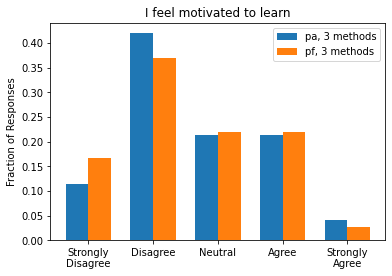

MannwhitneyuResult(statistic=21626.0, pvalue=0.2393340020195776)
pa, 3 methods 2.65
pf, 3 methods 2.57
Cohen's d = 0.075


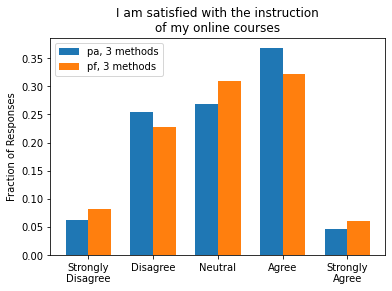

MannwhitneyuResult(statistic=22089.0, pvalue=0.3724355116087732)
pa, 3 methods 3.08
pf, 3 methods 3.05
Cohen's d = 0.03


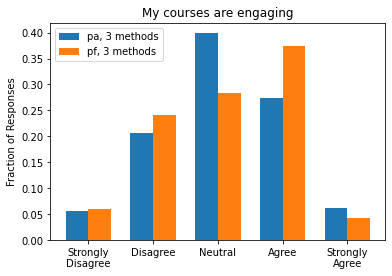

MannwhitneyuResult(statistic=21937.5, pvalue=0.32575272413220036)
pa, 3 methods 3.08
pf, 3 methods 3.1
Cohen's d = -0.021


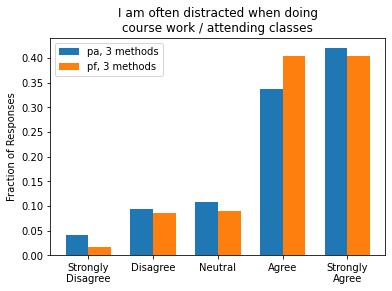

MannwhitneyuResult(statistic=22038.5, pvalue=0.3534322551601774)
pa, 3 methods 4.0
pf, 3 methods 4.09
Cohen's d = -0.085


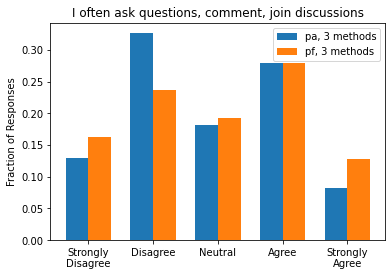

MannwhitneyuResult(statistic=21339.0, pvalue=0.17600029076427132)
pa, 3 methods 2.86
pf, 3 methods 2.97
Cohen's d = -0.091


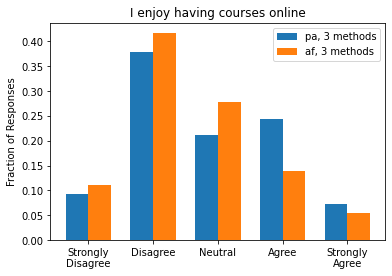

MannwhitneyuResult(statistic=6236.0, pvalue=0.09043378282851366)
pa, 3 methods 2.82
af, 3 methods 2.61
Cohen's d = 0.19


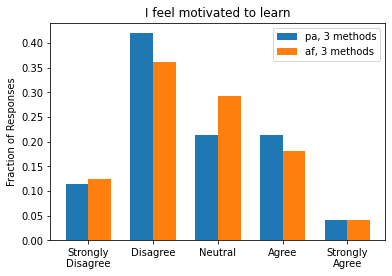

MannwhitneyuResult(statistic=6873.0, pvalue=0.4440854912714253)
pa, 3 methods 2.65
af, 3 methods 2.65
Cohen's d = -0.0048


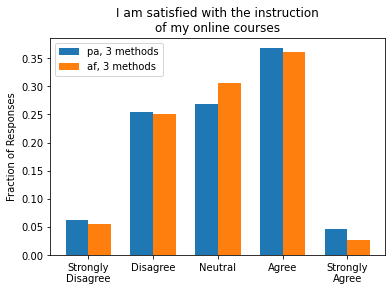

MannwhitneyuResult(statistic=6833.0, pvalue=0.4145166080394495)
pa, 3 methods 3.08
af, 3 methods 3.06
Cohen's d = 0.027


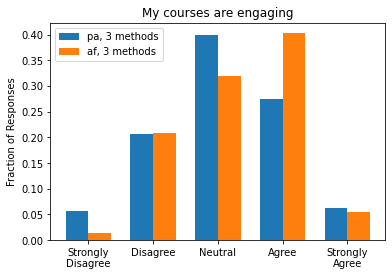

MannwhitneyuResult(statistic=6138.5, pvalue=0.06298064859483009)
pa, 3 methods 3.08
af, 3 methods 3.28
Cohen's d = -0.21


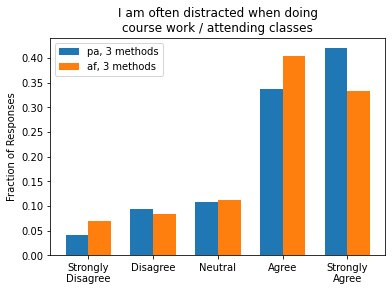

MannwhitneyuResult(statistic=6379.5, pvalue=0.13913578876933563)
pa, 3 methods 4.0
af, 3 methods 3.85
Cohen's d = 0.13


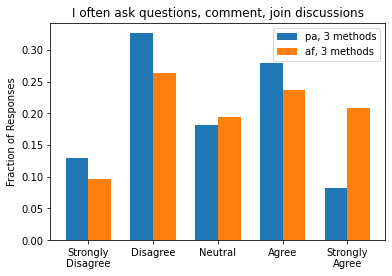

MannwhitneyuResult(statistic=5933.0, pvalue=0.02979040640520438)
pa, 3 methods 2.86
af, 3 methods 3.19
Cohen's d = -0.27


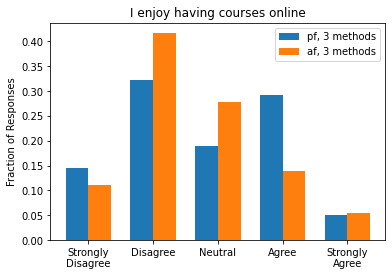

MannwhitneyuResult(statistic=7679.0, pvalue=0.13072408803292157)
pf, 3 methods 2.78
af, 3 methods 2.61
Cohen's d = 0.15


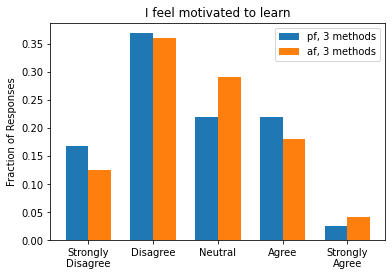

MannwhitneyuResult(statistic=7998.5, pvalue=0.2680672747094546)
pf, 3 methods 2.57
af, 3 methods 2.65
Cohen's d = -0.08


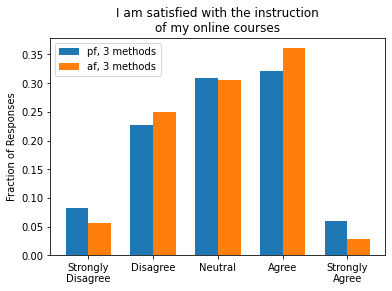

MannwhitneyuResult(statistic=8372.0, pvalue=0.4901508626471571)
pf, 3 methods 3.05
af, 3 methods 3.06
Cohen's d = -0.0039


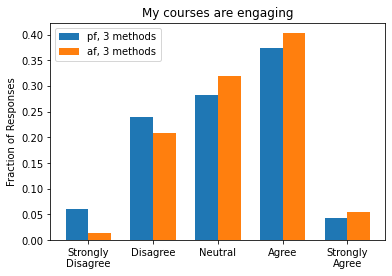

MannwhitneyuResult(statistic=7652.5, pvalue=0.1190481132815358)
pf, 3 methods 3.1
af, 3 methods 3.28
Cohen's d = -0.18


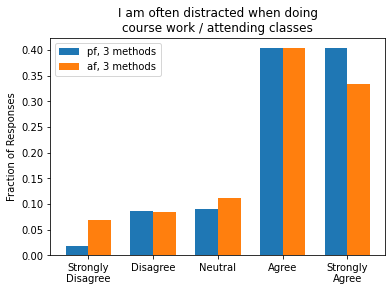

MannwhitneyuResult(statistic=7502.0, pvalue=0.07390204031919162)
pf, 3 methods 4.09
af, 3 methods 3.85
Cohen's d = 0.23


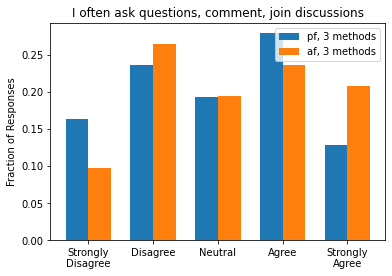

MannwhitneyuResult(statistic=7613.0, pvalue=0.11252030466362345)
pf, 3 methods 2.97
af, 3 methods 3.19
Cohen's d = -0.17


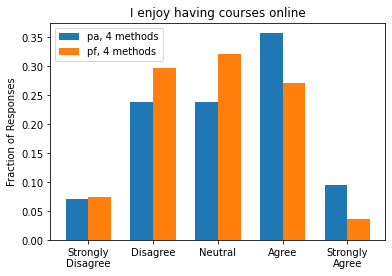

MannwhitneyuResult(statistic=1460.0, pvalue=0.0912783437745101)
pa, 4 methods 3.17
pf, 4 methods 2.9
Cohen's d = 0.25


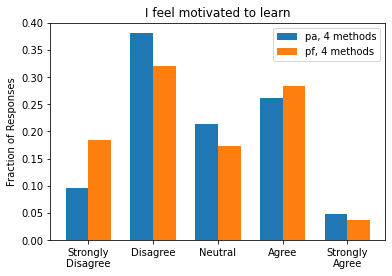

MannwhitneyuResult(statistic=1601.5, pvalue=0.29189013704997013)
pa, 4 methods 2.79
pf, 4 methods 2.67
Cohen's d = 0.1


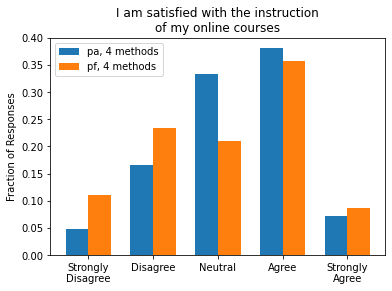

MannwhitneyuResult(statistic=1568.0, pvalue=0.23116217114961796)
pa, 4 methods 3.26
pf, 4 methods 3.07
Cohen's d = 0.17


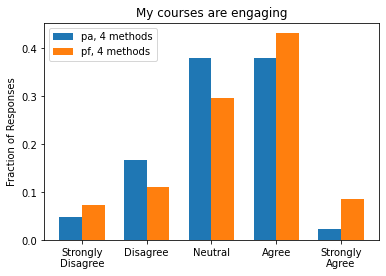

MannwhitneyuResult(statistic=1493.0, pvalue=0.12059274746959953)
pa, 4 methods 3.17
pf, 4 methods 3.35
Cohen's d = -0.18


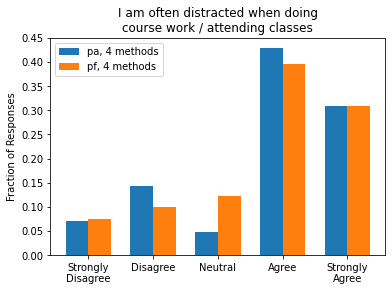

MannwhitneyuResult(statistic=1684.5, pvalue=0.4641746281404159)
pa, 4 methods 3.76
pf, 4 methods 3.77
Cohen's d = -0.0029


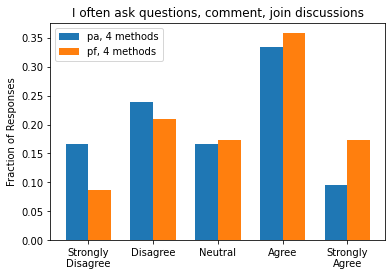

MannwhitneyuResult(statistic=1427.5, pvalue=0.06628291133947102)
pa, 4 methods 2.95
pf, 4 methods 3.32
Cohen's d = -0.29


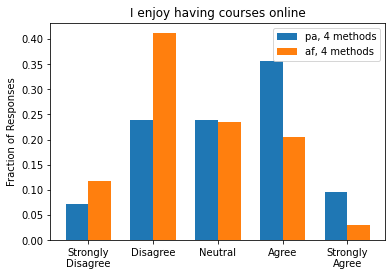

MannwhitneyuResult(statistic=515.5, pvalue=0.015983688159012424)
pa, 4 methods 3.17
af, 4 methods 2.62
Cohen's d = 0.5


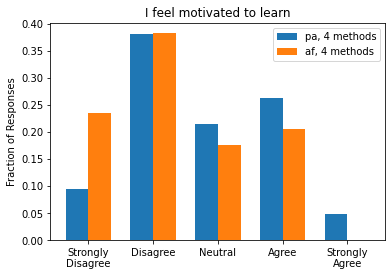

MannwhitneyuResult(statistic=560.5, pvalue=0.04778753581795319)
pa, 4 methods 2.79
af, 4 methods 2.35
Cohen's d = 0.4


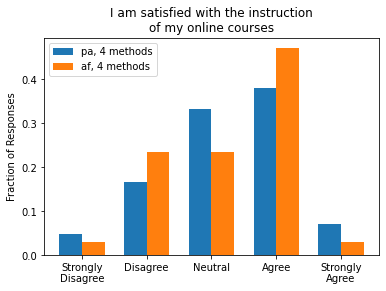

MannwhitneyuResult(statistic=709.5, pvalue=0.4823681677279934)
pa, 4 methods 3.26
af, 4 methods 3.24
Cohen's d = 0.027


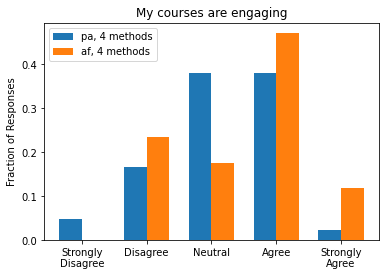

MannwhitneyuResult(statistic=588.0, pvalue=0.08269197211818236)
pa, 4 methods 3.17
af, 4 methods 3.47
Cohen's d = -0.32


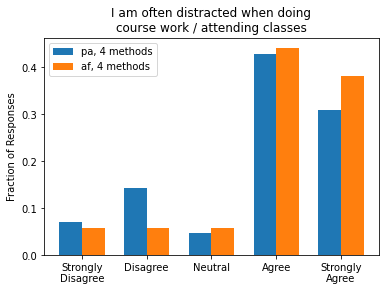

MannwhitneyuResult(statistic=631.5, pvalue=0.1801175938023974)
pa, 4 methods 3.76
af, 4 methods 4.03
Cohen's d = -0.23


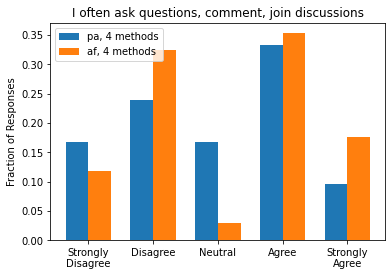

MannwhitneyuResult(statistic=649.5, pvalue=0.24435904174586803)
pa, 4 methods 2.95
af, 4 methods 3.15
Cohen's d = -0.15


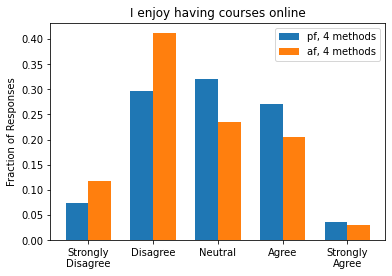

MannwhitneyuResult(statistic=1156.5, pvalue=0.08005914679376219)
pf, 4 methods 2.9
af, 4 methods 2.62
Cohen's d = 0.28


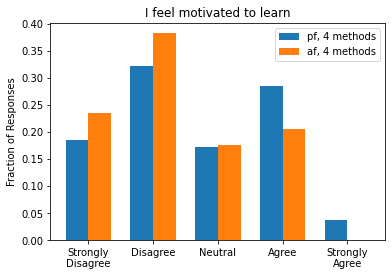

MannwhitneyuResult(statistic=1177.5, pvalue=0.10299191527871865)
pf, 4 methods 2.67
af, 4 methods 2.35
Cohen's d = 0.27


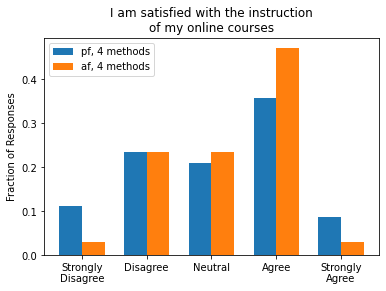

MannwhitneyuResult(statistic=1280.0, pvalue=0.2682950827691319)
pf, 4 methods 3.07
af, 4 methods 3.24
Cohen's d = -0.14


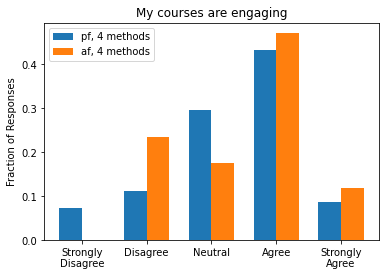

MannwhitneyuResult(statistic=1294.0, pvalue=0.29607848430056116)
pf, 4 methods 3.35
af, 4 methods 3.47
Cohen's d = -0.12


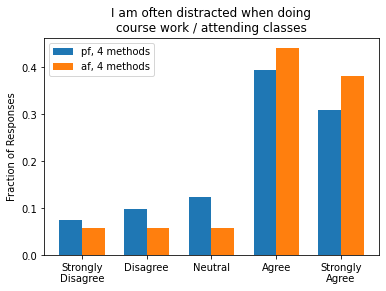

MannwhitneyuResult(statistic=1199.5, pvalue=0.1255709102270397)
pf, 4 methods 3.77
af, 4 methods 4.03
Cohen's d = -0.22


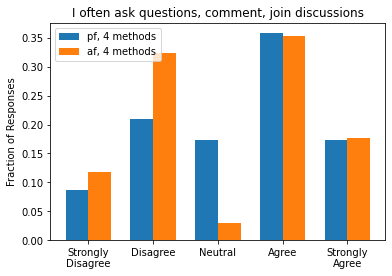

MannwhitneyuResult(statistic=1289.5, pvalue=0.2903609919665153)
pf, 4 methods 3.32
af, 4 methods 3.15
Cohen's d = 0.14


In [548]:
ug2type = [ugcat4, ugcat5, ugcat6]
for num in [2, 3, 4]:
    for i in range(3):
        for j in range(i+1, 3):
            a = ug2type[i][ug2type[i]['num_methods']==num]
            b = ug2type[j][ug2type[j]['num_methods']==num]
            a.name = f'{ug2type[i].name}, {num} methods'
            b.name = f'{ug2type[j].name}, {num} methods'
            subset_ls.append(a)
            subset_name.append(a.name)
            subset_ls.append(b)
            subset_name.append(b.name)
            remote_comparison(a, b)

In [549]:
for cat in ugcats:
    print(cat.name)
    print(np.mean(cat['num_methods']))

p
1.134387351778656
a
1.060931899641577
f
1.2487562189054726
pa
2.4307432432432434
pf
2.637037037037037
af
2.5375
paf
4.219241443108233


In [550]:
for cat in ugcats_o:
    print(cat.name)
    print(np.mean(cat['num_techniques']))

o_p
1.4150943396226414
o_i
1.3356766256590509
o_a
1.0421686746987953
o_pi
3.0134680134680134
o_pa
2.5047021943573666
o_ia
2.418848167539267
o_pia
4.518100890207715


## Some preliminary analysis

In [551]:
ug.columns

Index(['level_0', 'index', 'level', 'country', 'is_online', 'first_survey',
       'primary_mode', 'preferred_mode', 'why_mode', 'platforms_used',
       'methods_used', 'techniques_outside', 'remote_enjoy',
       'remote_motivated', 'remote_satisfied', 'remote_engaging',
       'remote_distracted', 'remote_questions', 'remote_changes',
       'prior_enjoy', 'prior_motivated', 'prior_satisfied', 'prior_engaging',
       'prior_distracted', 'prior_questions', 'prior_changes', 'preference',
       'why_preference', 'change_enjoy', 'change_motivated',
       'change_satisfied', 'change_engaging', 'change_distracted',
       'change_questions', 'active', 'passive', 'fully_active',
       'partly_active', 'outside_passive', 'outside_interactive',
       'outside_assignments', 'num_methods', 'num_techniques'],
      dtype='object')

In [552]:
print(px.colors.sequential.Viridis)

['#440154', '#482878', '#3e4989', '#31688e', '#26828e', '#1f9e89', '#35b779', '#6ece58', '#b5de2b', '#fde725']


In [553]:
((0.1),)*3

(0.1, 0.1, 0.1)

In [554]:
def topnpie(data, col, n):
    percentage = data[col].value_counts(normalize=True)
    topn = pd.concat([percentage.iloc[:n], pd.Series(percentage.iloc[n:].sum(), index=['Other'])])
    print(col)
    print(topn)
    colors = ['darkred', 'indianred', 'tomato', 'r', 'salmon', 'coral']
#     plt.figure()
    explode=((0.1),) + ((0.05),)*(len(topn)-1)
    wedges, labels, autopct = plt.pie(list(topn), labels = topn.index, labeldistance=1.15, radius = 1, \
                                      autopct='%1.2f%%', pctdistance=0.6, colors=colors, \
                                     explode=explode, wedgeprops = {'linewidth': 5})
    plt.setp(labels, fontsize=7, weight='bold')
    plt.setp(autopct, fontsize=5, color='white', weight='bold')
    hatches = ['/', '+', 'o', '*', 'O', '.' , '|', 'x', '-']
    for i in range(min(len(hatches), len(wedges))):
        wedges[i].set_hatch(hatches[i])
    plt.draw()
    plt.savefig(f'plots/all_undergrad/{col}', dpi=750, bbox_inches='tight')

In [555]:
# Dissecting data for undergrad
def piechart(data, col):
    print(col)
    print(data[col].value_counts(normalize=True))
    colors = ['darkred', 'indianred', 'tomato', 'r', 'salmon', 'coral']
#     plt.figure()
    df = data[col].value_counts(normalize=True)
    explode=((0.1),) + ((0.05),)*(len(df.index)-1)
    wedges, labels, autopct = plt.pie(list(df), labels = df.index, labeldistance=1.15, radius = 1, \
                                      autopct='%1.2f%%', pctdistance=0.6, colors=colors, \
                                     explode=explode, wedgeprops = {'linewidth': 5})
    plt.setp(labels, fontsize=7, weight='bold')
    plt.setp(autopct, fontsize=5, color='white', weight='bold')
    hatches = ['/', '+', 'o', '*', 'O', '.' , '|', 'x', '-']
    
    for i in range(min(len(hatches), len(wedges))):
        wedges[i].set_hatch(hatches[i])
    plt.draw()
    plt.savefig(f'plots/all_undergrad/{col}', dpi=750, bbox_inches='tight')

first_survey
Yes      0.498851
No       0.426541
Maybe    0.074608
Name: first_survey, dtype: float64
primary_mode
live        0.427020
recorded    0.369388
upload      0.172061
chat        0.031531
Name: primary_mode, dtype: float64
preferred_mode
live        0.545625
recorded    0.358530
upload      0.062226
chat        0.033619
Name: preferred_mode, dtype: float64
remote_enjoy
2.0    0.340990
3.0    0.225726
4.0    0.219044
1.0    0.159532
5.0    0.054709
Name: remote_enjoy, dtype: float64
remote_motivated
2.0    0.380038
1.0    0.204636
3.0    0.190436
4.0    0.188557
5.0    0.036333
Name: remote_motivated, dtype: float64
remote_satisfied
4.0    0.299436
2.0    0.291501
3.0    0.228440
1.0    0.133431
5.0    0.047191
Name: remote_satisfied, dtype: float64
remote_engaging
4.0    0.318856
3.0    0.271873
2.0    0.263312
1.0    0.095636
5.0    0.050324
Name: remote_engaging, dtype: float64
remote_distracted
4.0    0.408436
5.0    0.350177
3.0    0.100439
2.0    0.099394
1.0    0.04155

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



outside_passive
True     0.793024
False    0.206976
Name: outside_passive, dtype: float64
outside_interactive
True     0.696742
False    0.303258
Name: outside_interactive, dtype: float64
outside_assignments
True     0.559733
False    0.440267
Name: outside_assignments, dtype: float64


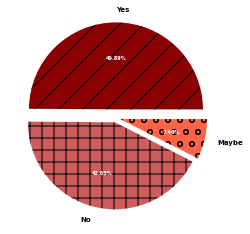

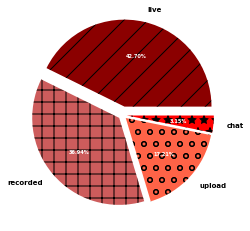

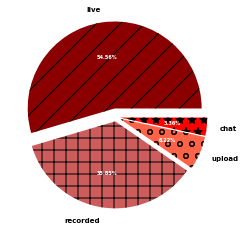

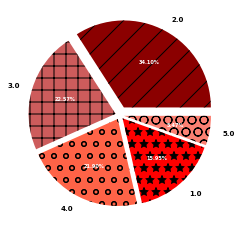

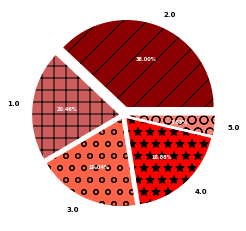

...

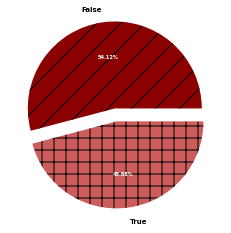

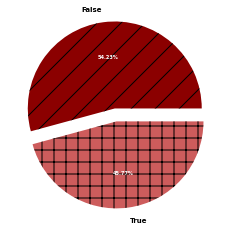

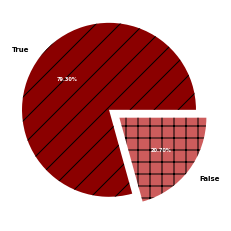

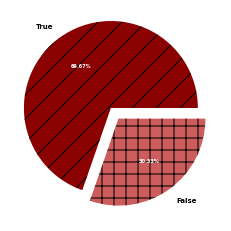

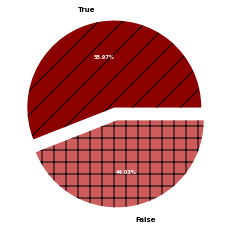

In [556]:
for col in ['first_survey',
       'primary_mode', 'preferred_mode', 'remote_enjoy',
       'remote_motivated', 'remote_satisfied', 'remote_engaging',
       'remote_distracted', 'remote_questions',
       'prior_enjoy', 'prior_motivated', 'prior_satisfied', 'prior_engaging',
       'prior_distracted', 'prior_questions', 'preference',
       'active', 'passive', 'fully_active',
       'partly_active', 'outside_passive', 'outside_interactive',
       'outside_assignments']:
    plt.figure()
    piechart(ug, col)

is_online
Yes      0.964726
No       0.018994
Other    0.016281
dtype: float64


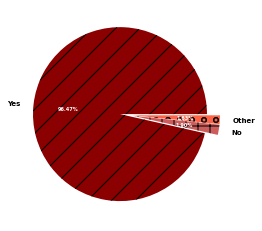

In [557]:
topnpie(ug, 'is_online', 2)

country
United Kingdom    0.433939
Netherlands       0.066583
Germany           0.060321
United States     0.058234
Australia         0.042162
Other             0.338760
dtype: float64


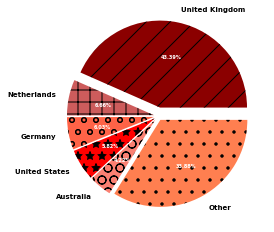

In [558]:
topnpie(ug, 'country', 5)

num_methods
2        0.239120
3        0.238631
1        0.177506
4        0.159413
5        0.088509
6        0.042054
Other    0.054768
dtype: float64


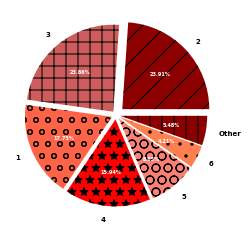

In [559]:
topnpie(ug[ug['primary_mode']=='live'], 'num_methods', 6)

num_techniques
2        0.238631
3        0.232274
1        0.199022
4        0.155990
5        0.097800
6        0.049389
Other    0.026895
dtype: float64


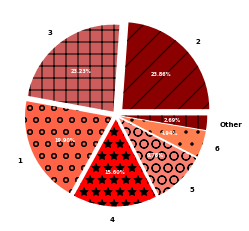

In [560]:
topnpie(ug[ug['primary_mode']=='live'], 'num_techniques', 6)

In [561]:
def topnpie_comp(data, col, n):
    percentage = data[col].value_counts(normalize=True)
    topn = pd.concat([percentage.iloc[:n], pd.Series(percentage.iloc[n:].sum(), index=['Other'])])
    print(col)
    print(topn)
    colors = ['darkred', 'indianred', 'tomato', 'r', 'salmon', 'coral']
#     plt.figure()
    explode=((0.1),) + ((0.05),)*(len(topn)-1)
    wedges, labels, autopct = plt.pie(list(topn), labels = topn.index, labeldistance=1.15, radius = 1, \
                                      autopct='%1.2f%%', pctdistance=0.6, colors=colors, \
                                     explode=explode, wedgeprops = {'linewidth': 5})
    plt.setp(labels, fontsize=7, weight='bold')
    plt.setp(autopct, fontsize=5, color='white', weight='bold')
    hatches = ['/', '+', 'o', '*', 'O', '.' , '|', 'x', '-']
    for i in range(min(len(hatches), len(wedges))):
        wedges[i].set_hatch(hatches[i])
    plt.draw()
#     plt.savefig(f'plots/live_nonlive/{col}', dpi=750, bbox_inches='tight')

def piechart_comp(data, col):
    print(col)
    print(data[col].value_counts(normalize=True))
    colors = ['darkred', 'indianred', 'tomato', 'r', 'salmon', 'coral']
#     plt.figure()
    df = data[col].value_counts(normalize=True)
    explode=((0.1),) + ((0.05),)*(len(df.index)-1)
    wedges, labels, autopct = plt.pie(list(df), labels = df.index, labeldistance=1.15, radius = 1, \
                                      autopct='%1.2f%%', pctdistance=0.6, colors=colors, \
                                     explode=explode, wedgeprops = {'linewidth': 5})
    plt.setp(labels, fontsize=7, weight='bold')
    plt.setp(autopct, fontsize=5, color='white', weight='bold')
    hatches = ['/', '+', 'o', '*', 'O', '.' , '|', 'x', '-']
    
    for i in range(min(len(hatches), len(wedges))):
        wedges[i].set_hatch(hatches[i])
    plt.draw()
#     plt.savefig(f'plots/{col}', dpi=750, bbox_inches='tight')

is_online
Yes      0.975550
No       0.011247
Other    0.013203
dtype: float64
is_online
Yes      0.956664
No       0.024763
Other    0.018572
dtype: float64
country
United Kingdom    0.301711
Netherlands       0.091932
Germany           0.073350
United States     0.072372
Australia         0.048900
Portugal          0.031296
Other             0.380440
dtype: float64
country
United Kingdom    0.532411
Germany           0.050619
United States     0.047706
Netherlands       0.047706
Ireland           0.045157
Australia         0.037145
Other             0.239257
dtype: float64
num_methods
2        0.239120
3        0.238631
1        0.177506
4        0.159413
5        0.088509
6        0.042054
Other    0.054768
dtype: float64
num_methods
0        0.315368
1        0.265841
2        0.195193
3        0.117261
4        0.069556
5        0.024763
Other    0.012017
dtype: float64
num_techniques
2        0.238631
3        0.232274
1        0.199022
4        0.155990
5        0.097800
6      

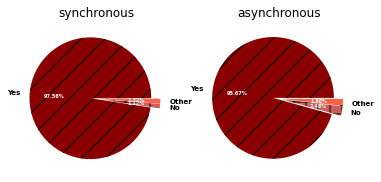

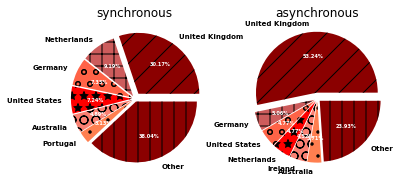

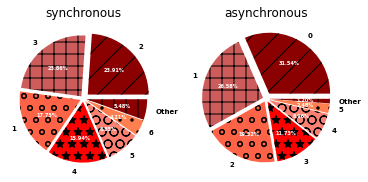

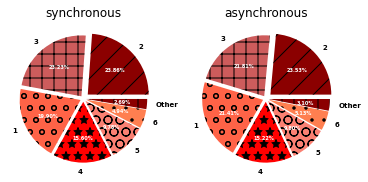

In [562]:
# Synchronous vs. asynchronous
plt.figure()
plt.subplot(1,2,1)
plt.gca().set_title('synchronous')
topnpie_comp(ug[ug['primary_mode']=='live'], 'is_online', 2)
plt.subplot(1,2,2)
plt.gca().set_title('asynchronous')
topnpie_comp(ug[ug['primary_mode']!='live'], 'is_online', 2)
plt.savefig(f'plots/live_nonlive/is_online', dpi=500, bbox_inches='tight')

plt.figure()
plt.subplot(1,2,1)
plt.gca().set_title('synchronous')
topnpie_comp(ug[ug['primary_mode']=='live'], 'country', 6)
plt.subplot(1,2,2)
plt.gca().set_title('asynchronous')
topnpie_comp(ug[ug['primary_mode']!='live'], 'country', 6)
plt.savefig(f'plots/live_nonlive/country', dpi=500, bbox_inches='tight')

plt.figure()
plt.subplot(1,2,1)
plt.gca().set_title('synchronous')
topnpie_comp(ug[ug['primary_mode']=='live'], 'num_methods', 6)
plt.subplot(1,2,2)
plt.gca().set_title('asynchronous')
topnpie_comp(ug[ug['primary_mode']!='live'], 'num_methods', 6)
plt.savefig(f'plots/live_nonlive/num_methods', dpi=500, bbox_inches='tight')

plt.figure()
plt.subplot(1,2,1)
plt.gca().set_title('synchronous')
topnpie_comp(ug[ug['primary_mode']=='live'], 'num_techniques', 6)
plt.subplot(1,2,2)
plt.gca().set_title('asynchronous')
topnpie_comp(ug[ug['primary_mode']!='live'], 'num_techniques', 6)
plt.savefig(f'plots/live_nonlive/num_techniques', dpi=500, bbox_inches='tight')

first_survey
Yes      0.518119
No       0.400588
Maybe    0.081293
Name: first_survey, dtype: float64
first_survey
Yes      0.484506
No       0.445862
Maybe    0.069632
Name: first_survey, dtype: float64
primary_mode
live    1.0
Name: primary_mode, dtype: float64
primary_mode
recorded    0.644679
upload      0.300292
chat        0.055029
Name: primary_mode, dtype: float64
preferred_mode
live        0.646455
recorded    0.269438
upload      0.054279
chat        0.029829
Name: preferred_mode, dtype: float64
preferred_mode
live        0.470481
recorded    0.424927
upload      0.068149
chat        0.036443
Name: preferred_mode, dtype: float64
remote_enjoy
2.0    0.306601
3.0    0.250367
4.0    0.249878
1.0    0.134963
5.0    0.058191
Name: remote_enjoy, dtype: float64
remote_enjoy
2.0    0.366618
3.0    0.207362
4.0    0.196064
1.0    0.177843
5.0    0.052114
Name: remote_enjoy, dtype: float64
remote_motivated
2.0    0.360391
3.0    0.216137
4.0    0.213692
1.0    0.164303
5.0    0.045477


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



outside_passive
True     0.804795
False    0.195205
Name: outside_passive, dtype: float64
outside_passive
True     0.784257
False    0.215743
Name: outside_passive, dtype: float64
outside_interactive
True     0.660959
False    0.339041
Name: outside_interactive, dtype: float64
outside_interactive
True     0.723397
False    0.276603
Name: outside_interactive, dtype: float64
outside_assignments
True     0.611546
False    0.388454
Name: outside_assignments, dtype: float64
outside_assignments
True     0.521137
False    0.478863
Name: outside_assignments, dtype: float64


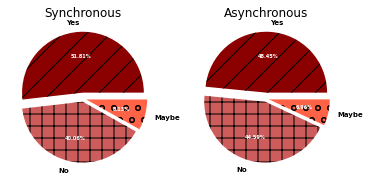

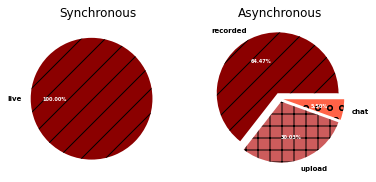

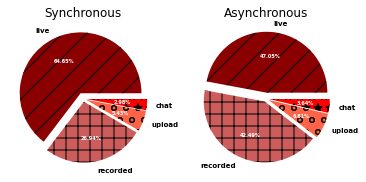

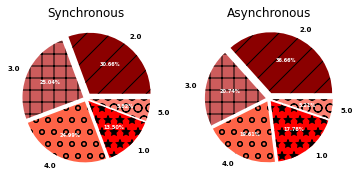

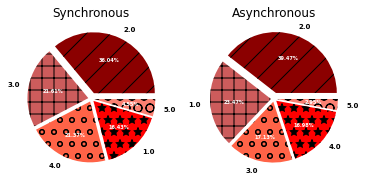

...

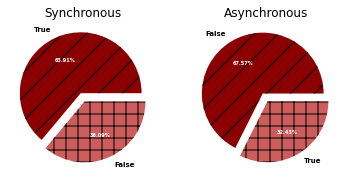

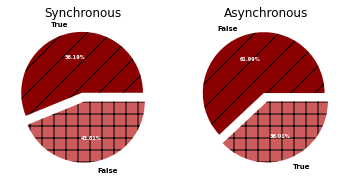

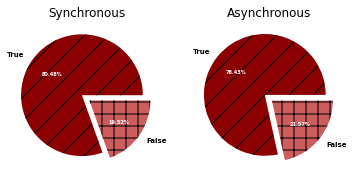

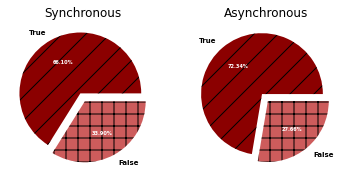

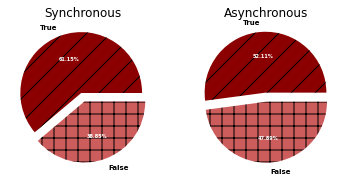

In [563]:
for col in ['first_survey',
       'primary_mode', 'preferred_mode', 'remote_enjoy',
       'remote_motivated', 'remote_satisfied', 'remote_engaging',
       'remote_distracted', 'remote_questions',
       'prior_enjoy', 'prior_motivated', 'prior_satisfied', 'prior_engaging',
       'prior_distracted', 'prior_questions', 'preference',
       'active', 'passive', 'fully_active',
       'partly_active', 'outside_passive', 'outside_interactive',
       'outside_assignments']:
    plt.figure()
    plt.subplot(1,2,1)
    plt.gca().set_title('Synchronous')
    piechart_comp(ug[ug['primary_mode']=='live'], col)
    plt.subplot(1,2,2)
    plt.gca().set_title('Asynchronous')
    piechart_comp(ug[ug['primary_mode']!='live'], col)
    plt.savefig(f'plots/live_nonlive/{col}', dpi=750, bbox_inches='tight')